In [1]:
import cv2

In [63]:
image = cv2.imread("Scrub_Store_11.jpg")

img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(img_gray, 198, 202, cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_SIMPLE)

image_copy = image.copy()
# print(contours)
cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

cv2.imshow("",image_copy)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [4]:
import cv2

# Read the original image
img = cv2.imread('Scrub_Store_1.jpg') 
# Display original image
cv2.imshow('Original', img)
cv2.waitKey(0)

# Convert to graycsale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(img_gray, (3,3), 0) 

# Canny Edge Detection
edges = cv2.Canny(image=img_blur, threshold1=100, threshold2=200) # Canny Edge Detection
# Display Canny Edge Detection Image
cv2.imshow('Canny Edge Detection', edges)
cv2.waitKey(0)

contours, hierarchy = cv2.findContours(image=edges, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_SIMPLE)

cont_img = img.copy()
# print(contours)
c = sorted(contours, key = cv2.contourArea)
# print(c)
for i in contours:
    if cv2.contourArea(i) > cv2.arcLength(i, True):
        cv2.drawContours(image=cont_img, contours=i, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
        
cv2.imshow("",cont_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [59]:
from __future__ import print_function
import binascii
import struct
from PIL import Image
import numpy as np
import scipy
import scipy.misc
import scipy.cluster

NUM_CLUSTERS = 5

print('reading image')
im = Image.open('Scrub_Store_11.jpg')
# im = im.resize((150, 150))      # optional, to reduce time
ar = np.asarray(im)
shape = ar.shape
ar = ar.reshape(scipy.product(shape[:2]), shape[2]).astype(float)

print('finding clusters')
codes, dist = scipy.cluster.vq.kmeans(ar, NUM_CLUSTERS)
print('cluster centres:\n', codes)

vecs, dist = scipy.cluster.vq.vq(ar, codes)         # assign codes
counts, bins = scipy.histogram(vecs, len(codes))    # count occurrences

index_max = scipy.argmax(counts)                    # find most frequent
peak = codes[index_max]
colour = binascii.hexlify(bytearray(int(c) for c in peak)).decode('ascii')
print('most frequent is %s (#%s)' % (peak, colour))

reading image
finding clusters


c:\users\pavan\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: scipy.product is deprecated and will be removed in SciPy 2.0.0, use numpy.product instead


cluster centres:
 [[164.18524867 163.87488793 150.10476768]
 [201.25930191 200.9240562  184.53055969]
 [252.77044085 252.87326862 252.25898784]
 [ 43.56227414  41.40796176  44.34069374]
 [106.16947556 105.57433552  99.98180934]]
most frequent is [164.18524867 163.87488793 150.10476768] (#a4a396)


c:\users\pavan\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:24: DeprecationWarning: scipy.histogram is deprecated and will be removed in SciPy 2.0.0, use numpy.histogram instead
c:\users\pavan\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:26: DeprecationWarning: scipy.argmax is deprecated and will be removed in SciPy 2.0.0, use numpy.argmax instead


In [5]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import PIL
%matplotlib inline


In [6]:
def show_img_compar(img_1, img_2 ):
    f, ax = plt.subplots(1, 2, figsize=(10,10))
    ax[0].imshow(img_1)
    ax[1].imshow(img_2)
    ax[0].axis('off') #hide the axis
    ax[1].axis('off')
    f.tight_layout()
    plt.show()

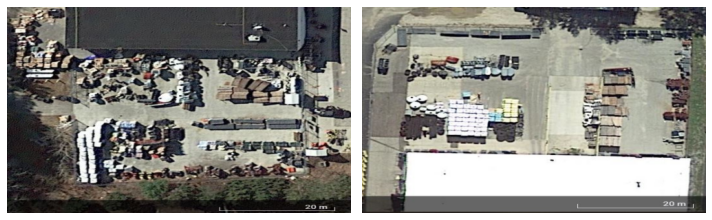

In [7]:
img = cv.imread("Scrub_Store_18.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_2 = cv.imread("Scrub_Store_11.jpg")
img_2 = cv.cvtColor(img_2, cv.COLOR_BGR2RGB)

dim = (500, 300)
# resize image
img = cv.resize(img, dim, interpolation = cv.INTER_AREA)
img_2 = cv.resize(img_2, dim, interpolation = cv.INTER_AREA)

show_img_compar(img, img_2)

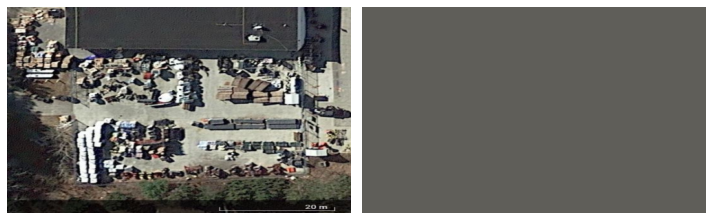

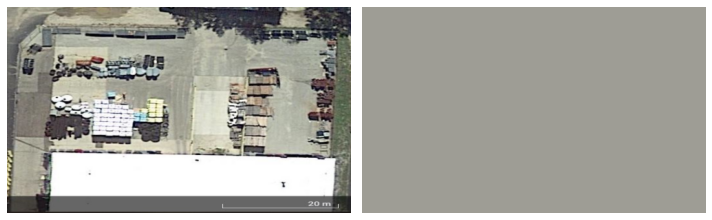

In [8]:
img_temp = img.copy()
img_temp[:,:,0], img_temp[:,:,1], img_temp[:,:,2] = np.average(img, axis=(0,1))

img_temp_2 = img_2.copy()
img_temp_2[:,:,0], img_temp_2[:,:,1], img_temp_2[:,:,2] = np.average(img_2, axis=(0,1))

show_img_compar(img, img_temp)
show_img_compar(img_2, img_temp_2)

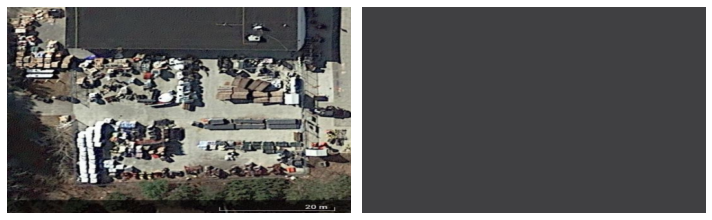

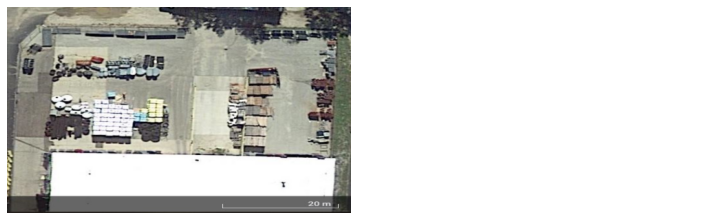

In [10]:
img_temp = img.copy()
unique, counts = np.unique(img_temp.reshape(-1, 3), axis=0, return_counts=True)
img_temp[:,:,0], img_temp[:,:,1], img_temp[:,:,2] = unique[np.argmax(counts)]

img_temp_2 = img_2.copy()
unique, counts = np.unique(img_temp_2.reshape(-1, 3), axis=0, return_counts=True)
img_temp_2[:,:,0], img_temp_2[:,:,1], img_temp_2[:,:,2] = unique[np.argmax(counts)]

show_img_compar(img, img_temp)
show_img_compar(img_2, img_temp_2)

In [16]:
from sklearn.cluster import KMeans

clt = KMeans(n_clusters=2)


[54.67745091 52.95307442 52.23229827]
[176.23220502 174.11576815 162.40263163]


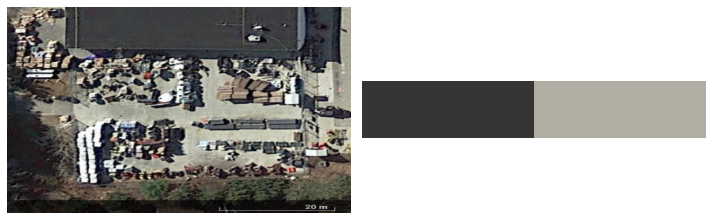

[203.23359217 203.16764893 192.69422565]
[90.98887801 89.74525655 86.23188526]


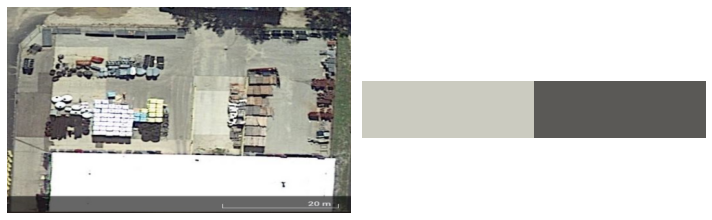

In [18]:
def palette(clusters):
    width=300
    palette = np.zeros((50, width, 3), np.uint8)
    steps = width/clusters.cluster_centers_.shape[0]
    for idx, centers in enumerate(clusters.cluster_centers_): 
        print(centers)
        palette[:, int(idx*steps):(int((idx+1)*steps)), :] = centers
    return palette

  
clt_1 = clt.fit(img.reshape(-1, 3))
show_img_compar(img, palette(clt_1))

clt_2 = clt.fit(img_2.reshape(-1, 3))
show_img_compar(img_2, palette(clt_2))

In [79]:
from math import sqrt
r1 = 100
b1 = 100
g1 = 100
r2 = 110
b2 = 110
g2 = 110
d=sqrt((r2-r1)**2+(g2-g1)**2+(b2-b1)**2)
p=d/sqrt((255)**2+(255)**2+(255)**2)
d

17.320508075688775

In [115]:
import math
# Light -1   Dark -0
def isLightOrDark(rgbColor=[0,128,255]):
    [r,g,b]=rgbColor
    hsp = math.sqrt(0.299 * (r * r) + 0.587 * (g * g) + 0.114 * (b * b))
    if (hsp>127.5):
        return 1
    else:
        return 0
    
isLightOrDark([179.27966071, 180.7357134 , 174.36631348])

1

In [53]:
import numpy as np
import cv2
# import cv2.cv as cv
im_width = 320
im_height = 240

# The order of the colors is blue, green, red 176, 174, 162
lower_color_bounds = np.array([162, 174, 176])
upper_color_bounds = np.array([162, 174, 176])
frame = cv.imread("Scrub_Store_18.jpg")

# gray = cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY)
mask = cv2.inRange(frame,lower_color_bounds,upper_color_bounds )
cv2.imshow('1',mask)
cv2.waitKey(0)
mask_rgb = cv2.cvtColor(mask,cv2.COLOR_GRAY2BGR)
frame = frame & mask_rgb
cv2.imshow('2',frame)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [24]:
cv2.destroyAllWindows()

In [116]:
import cv2

def color_diff1(c1,c2):
    r1,g1,b1 = c1
    r2,g2,b2 = c2
    d=sqrt((r2-r1)**2+(g2-g1)**2+(b2-b1)**2)
    if d < 100:
        return True
    return False
def color_diff(c1,c2):
    r1,g1,b1 = c1
    r2,g2,b2 = c2
    diff = 50
    if abs(r1-r2) < diff and abs(g1-g2) < diff and abs(b1-b2) < diff:
        return True
    return False

image = cv.imread("Scrub_Store_11.jpg")
a_image = image.copy()
import numpy as np
blank_image = np.zeros((image.shape[0],image.shape[1],3), np.uint8)
color = [193, 203, 203]
for i in range(image.shape[0]):
    for j in range(image.shape[1]):
#         print(image[i,j])
        x = image[i,j]
#         print(type(x))
        if color_diff(list(x),color):
            print(image[i,j])
            blank_image[i,j] = [0,0,0]
        else:
            blank_image[i,j] = list(x)
            
cv2.imshow("act",a_image)
cv2.imshow("",blank_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

[144 164 165]
[148 168 169]
[156 176 177]
[167 187 188]
[170 189 192]
[154 173 176]
[158 177 180]
[159 178 181]
[144 163 166]
[147 166 169]
[147 166 169]
[145 166 164]
[148 169 167]
[145 166 164]
[144 161 164]
[145 162 165]
[146 163 166]
[146 163 166]
[147 164 167]
[150 167 170]
[152 169 172]
[146 166 167]
[147 167 168]
[149 169 170]
[151 171 172]
[153 172 175]
[153 172 175]
[153 172 175]
[153 172 175]
[156 175 180]
[157 176 181]
[159 178 183]
[161 180 185]
[162 180 187]
[159 177 184]
[152 170 177]
[146 164 171]
[146 162 169]
[145 174 179]
[146 175 180]
[145 174 179]
[153 177 183]
[170 195 199]
[178 198 203]
[175 196 198]
[173 194 196]
[171 192 194]
[170 191 193]
[166 187 189]
[161 182 184]
[156 177 179]
[155 176 178]
[158 179 181]
[158 179 181]
[156 177 179]
[156 177 179]
[159 180 182]
[159 180 182]
[156 177 178]
[156 174 175]
[154 172 171]
[150 168 167]
[147 165 164]
[145 163 162]
[145 163 162]
[146 164 163]
[147 165 164]
[148 166 165]
[152 170 169]
[152 170 169]
[151 169 168]
[153 1

[185 200 202]
[177 195 196]
[174 195 193]
[175 197 195]
[175 196 194]
[170 191 189]
[171 189 188]
[172 190 189]
[172 188 187]
[169 185 184]
[168 184 183]
[175 191 190]
[176 192 191]
[167 185 184]
[158 179 177]
[157 178 176]
[157 179 177]
[155 179 177]
[149 178 175]
[156 185 182]
[156 183 180]
[155 179 177]
[146 167 165]
[147 160 162]
[150 168 169]
[153 173 174]
[155 175 176]
[155 175 176]
[156 176 177]
[157 177 178]
[155 175 176]
[151 171 172]
[144 164 165]
[156 175 178]
[160 179 182]
[153 172 175]
[157 176 179]
[156 175 178]
[155 174 177]
[150 169 172]
[146 165 168]
[147 166 169]
[153 172 175]
[155 174 177]
[154 173 176]
[168 188 189]
[161 181 182]
[153 173 174]
[148 168 169]
[146 166 167]
[144 164 165]
[150 174 180]
[160 185 189]
[171 193 198]
[165 188 190]
[155 178 180]
[149 172 174]
[159 182 184]
[166 189 191]
[172 195 197]
[174 197 199]
[174 197 199]
[171 194 196]
[164 187 189]
[156 179 181]
[153 174 175]
[156 176 177]
[159 179 180]
[161 181 182]
[161 181 182]
[161 181 182]
[159 1

[178 198 203]
[173 193 198]
[169 189 194]
[166 186 191]
[169 189 194]
[171 191 196]
[168 188 193]
[164 184 189]
[162 182 187]
[166 186 191]
[170 190 195]
[165 185 190]
[159 179 184]
[153 173 178]
[152 172 177]
[156 176 181]
[157 177 182]
[154 174 179]
[149 169 174]
[149 170 172]
[156 177 179]
[161 182 184]
[161 182 184]
[158 179 181]
[155 176 178]
[149 170 172]
[144 165 167]
[148 169 171]
[150 171 173]
[152 173 175]
[154 175 177]
[158 179 181]
[161 182 183]
[165 185 186]
[163 184 182]
[169 190 188]
[173 194 192]
[171 192 190]
[176 194 193]
[180 196 195]
[173 187 186]
[153 165 165]
[160 175 178]
[147 167 172]
[154 174 179]
[157 177 182]
[154 174 179]
[151 170 175]
[157 176 181]
[155 174 179]
[146 165 170]
[145 164 169]
[154 173 178]
[162 181 186]
[165 184 189]
[165 184 189]
[166 185 190]
[166 185 190]
[164 183 188]
[159 176 179]
[154 171 174]
[149 166 169]
[148 165 168]
[145 162 165]
[146 164 163]
[147 165 164]
[150 168 167]
[153 171 170]
[151 170 167]
[146 164 163]
[152 170 177]
[152 1

[161 190 194]
[156 185 189]
[144 173 177]
[150 177 181]
[152 179 183]
[159 184 188]
[162 187 191]
[165 190 194]
[168 193 197]
[171 196 200]
[173 198 202]
[177 199 204]
[176 198 203]
[177 197 202]
[176 196 201]
[174 194 199]
[169 189 194]
[163 183 188]
[158 178 183]
[155 175 180]
[160 180 185]
[163 183 188]
[162 182 187]
[159 179 184]
[161 181 186]
[169 189 194]
[177 197 202]
[175 195 200]
[174 194 199]
[172 192 197]
[171 191 196]
[171 191 196]
[172 192 197]
[173 193 198]
[174 194 199]
[170 191 193]
[171 192 194]
[168 189 191]
[164 185 187]
[164 185 187]
[169 190 192]
[172 193 195]
[172 193 195]
[179 200 202]
[179 200 202]
[179 200 202]
[179 200 202]
[178 199 201]
[175 196 198]
[169 190 192]
[165 186 188]
[156 177 179]
[164 185 187]
[173 194 196]
[178 199 201]
[174 197 199]
[171 194 196]
[173 194 196]
[174 195 197]
[168 185 188]
[177 192 195]
[182 194 198]
[173 184 188]
[157 163 168]
[150 171 172]
[146 166 171]
[148 167 172]
[150 169 174]
[156 176 181]
[152 172 177]
[145 165 170]
[144 1

[178 203 207]
[178 200 205]
[177 199 204]
[180 200 205]
[181 201 206]
[183 203 208]
[182 202 207]
[181 201 206]
[179 199 204]
[175 195 200]
[178 198 203]
[179 199 204]
[172 192 197]
[162 182 187]
[156 176 181]
[157 177 182]
[161 181 186]
[168 188 193]
[168 188 193]
[169 189 194]
[169 189 194]
[167 187 192]
[164 184 189]
[161 181 186]
[158 178 183]
[164 185 187]
[170 191 193]
[174 195 197]
[171 192 194]
[169 190 192]
[168 189 191]
[167 188 190]
[165 186 188]
[162 183 185]
[162 183 185]
[164 185 187]
[166 187 189]
[168 189 191]
[169 190 192]
[168 189 191]
[166 187 189]
[165 184 187]
[161 178 181]
[158 175 178]
[163 182 185]
[175 194 197]
[182 201 204]
[178 197 200]
[172 191 194]
[166 183 186]
[172 187 190]
[168 180 184]
[148 159 163]
[155 183 184]
[155 185 186]
[157 185 186]
[158 183 185]
[158 180 185]
[158 178 183]
[159 175 181]
[156 175 180]
[149 168 173]
[151 171 176]
[155 175 180]
[158 178 183]
[159 179 184]
[158 178 183]
[156 176 181]
[155 175 180]
[152 172 177]
[150 170 175]
[148 1

[178 199 200]
[178 199 200]
[176 197 198]
[174 195 196]
[172 193 194]
[170 191 192]
[168 189 190]
[167 188 189]
[172 194 192]
[173 195 193]
[172 194 192]
[169 191 189]
[168 190 188]
[170 192 190]
[170 192 190]
[168 190 188]
[164 186 184]
[164 186 184]
[166 188 186]
[168 190 188]
[170 192 190]
[169 191 189]
[167 189 187]
[164 185 186]
[166 185 188]
[166 185 190]
[167 186 191]
[169 188 193]
[171 190 195]
[170 189 194]
[167 186 191]
[165 184 189]
[165 184 189]
[168 187 192]
[164 183 188]
[151 170 175]
[152 171 176]
[163 178 181]
[178 185 188]
[173 177 178]
[166 158 158]
[161 172 176]
[173 188 191]
[160 179 182]
[154 177 179]
[144 167 169]
[148 171 173]
[155 176 178]
[159 180 182]
[166 187 189]
[162 183 185]
[157 178 180]
[153 174 176]
[152 173 175]
[152 173 175]
[153 174 176]
[152 173 175]
[145 159 165]
[149 163 169]
[153 167 173]
[155 171 177]
[156 172 178]
[151 167 173]
[145 161 167]
[148 168 173]
[154 174 179]
[155 175 180]
[146 166 171]
[145 162 165]
[151 168 171]
[155 170 172]
[145 1

[169 192 194]
[168 191 193]
[170 194 194]
[171 195 195]
[168 192 192]
[164 188 188]
[163 187 187]
[164 188 188]
[161 185 185]
[156 180 180]
[160 184 184]
[169 193 193]
[175 199 199]
[173 197 197]
[168 192 192]
[167 191 191]
[168 192 192]
[169 193 193]
[169 190 192]
[171 192 194]
[173 194 196]
[174 195 197]
[174 195 197]
[176 197 199]
[180 201 203]
[183 204 206]
[182 203 205]
[180 201 203]
[177 198 200]
[175 196 198]
[174 195 197]
[174 195 197]
[176 197 199]
[177 198 200]
[175 196 197]
[169 190 191]
[167 188 189]
[169 190 191]
[172 193 194]
[171 192 193]
[169 190 191]
[169 190 191]
[164 185 186]
[163 184 185]
[161 182 183]
[162 183 184]
[164 185 186]
[166 187 188]
[167 188 189]
[167 188 189]
[173 192 197]
[170 189 194]
[167 186 191]
[166 185 190]
[165 184 189]
[165 184 189]
[163 182 187]
[162 181 186]
[158 177 182]
[164 183 188]
[169 188 193]
[173 192 197]
[176 195 200]
[178 197 202]
[175 194 199]
[174 189 192]
[170 179 182]
[149 158 162]
[149 158 162]
[160 167 164]
[145 156 160]
[168 1

[165 174 177]
[165 174 177]
[171 182 179]
[184 195 192]
[152 166 162]
[154 157 162]
[149 155 160]
[148 159 163]
[162 177 180]
[172 191 194]
[178 201 203]
[171 194 196]
[162 187 189]
[157 182 184]
[156 181 183]
[157 180 182]
[155 178 180]
[158 179 181]
[161 182 184]
[163 184 186]
[165 186 188]
[165 186 188]
[159 180 182]
[151 172 174]
[148 169 171]
[150 171 173]
[155 176 178]
[150 171 173]
[149 170 172]
[152 173 175]
[158 179 181]
[166 187 189]
[167 188 190]
[162 183 185]
[157 176 179]
[150 168 169]
[157 175 176]
[161 180 183]
[158 177 180]
[152 172 177]
[147 169 174]
[144 166 172]
[146 162 168]
[150 165 168]
[150 162 164]
[148 168 173]
[152 172 177]
[150 170 175]
[148 168 173]
[144 160 166]
[147 162 165]
[146 161 164]
[152 171 174]
[150 172 177]
[144 170 176]
[147 169 174]
[154 176 181]
[159 181 186]
[159 181 186]
[162 184 189]
[167 189 194]
[168 190 195]
[164 186 191]
[169 191 196]
[170 192 197]
[171 193 198]
[170 192 197]
[168 190 195]
[167 189 194]
[167 189 194]
[167 189 194]
[173 1

[179 199 204]
[177 197 202]
[175 195 200]
[176 196 201]
[177 197 202]
[176 196 201]
[174 194 199]
[174 194 199]
[175 195 200]
[177 197 202]
[179 199 204]
[180 200 205]
[179 199 204]
[178 198 203]
[176 196 201]
[174 194 199]
[181 201 206]
[182 203 205]
[183 204 206]
[181 202 204]
[179 200 202]
[179 200 202]
[181 202 204]
[183 204 206]
[185 206 208]
[180 201 203]
[174 195 197]
[172 193 195]
[174 195 197]
[177 198 200]
[178 199 201]
[177 198 200]
[178 197 202]
[175 194 199]
[172 191 196]
[174 193 198]
[179 198 203]
[182 201 206]
[181 200 205]
[179 198 203]
[183 202 207]
[178 197 202]
[174 193 198]
[176 195 200]
[178 197 202]
[177 196 201]
[179 198 203]
[184 200 206]
[186 200 206]
[189 201 207]
[191 203 209]
[186 198 204]
[159 171 175]
[152 161 158]
[157 166 163]
[186 191 189]
[194 197 195]
[208 211 209]
[183 184 182]
[152 158 163]
[156 167 171]
[166 181 184]
[176 195 198]
[167 190 192]
[160 183 185]
[157 182 184]
[157 182 184]
[156 181 183]
[154 177 179]
[151 174 176]
[158 179 181]
[166 1

[166 187 189]
[163 186 188]
[160 181 183]
[155 178 180]
[159 180 182]
[161 182 184]
[157 178 179]
[159 180 181]
[157 180 182]
[154 177 179]
[152 177 179]
[153 178 182]
[151 176 180]
[149 171 176]
[151 161 168]
[150 162 168]
[150 164 170]
[150 164 170]
[148 164 170]
[146 162 168]
[144 163 168]
[159 178 183]
[164 183 188]
[157 177 182]
[152 171 176]
[145 162 165]
[144 159 161]
[149 163 162]
[169 178 181]
[219 228 231]
[217 226 229]
[188 197 200]
[173 185 187]
[169 181 183]
[149 162 164]
[145 160 163]
[145 160 163]
[152 169 172]
[183 200 203]
[193 209 215]
[164 181 184]
[152 166 172]
[152 167 170]
[147 161 167]
[152 167 170]
[164 176 182]
[171 183 187]
[169 181 187]
[158 170 174]
[144 156 162]
[144 163 170]
[147 166 173]
[145 164 171]
[152 171 178]
[148 167 174]
[149 168 173]
[149 169 170]
[151 168 171]
[149 169 170]
[153 171 172]
[147 167 168]
[144 162 163]
[148 165 168]
[159 176 179]
[163 180 183]
[150 168 175]
[153 171 178]
[145 163 170]
[156 174 181]
[162 180 187]
[155 173 180]
[147 1

[147 160 162]
[150 163 165]
[152 165 167]
[151 163 165]
[151 164 166]
[164 176 178]
[178 190 192]
[181 193 195]
[163 175 177]
[153 167 163]
[166 181 177]
[154 171 167]
[168 188 183]
[168 185 181]
[155 170 166]
[144 158 154]
[149 158 155]
[148 159 156]
[152 157 156]
[150 155 154]
[155 157 157]
[150 155 154]
[150 158 158]
[160 168 168]
[166 174 174]
[170 178 178]
[171 179 179]
[164 172 172]
[154 162 162]
[154 162 162]
[160 168 168]
[158 166 166]
[151 159 159]
[151 159 159]
[158 166 166]
[158 166 166]
[150 160 160]
[146 158 158]
[149 161 161]
[149 161 161]
[144 156 158]
[154 167 169]
[160 172 174]
[155 168 170]
[151 163 165]
[147 160 162]
[148 160 162]
[150 163 165]
[151 163 165]
[147 160 162]
[148 161 163]
[155 169 168]
[154 168 166]
[163 177 176]
[157 171 169]
[156 170 169]
[165 179 177]
[161 173 173]
[164 178 176]
[159 171 171]
[159 173 171]
[162 174 174]
[165 179 177]
[169 181 181]
[168 182 180]
[164 176 176]
[158 172 170]
[163 177 173]
[163 178 174]
[160 174 170]
[154 169 165]
[152 1

[168 176 175]
[168 173 172]
[177 179 179]
[183 188 187]
[185 191 190]
[185 193 192]
[163 174 172]
[152 161 158]
[166 177 174]
[170 181 178]
[164 175 172]
[158 169 166]
[158 172 168]
[163 177 173]
[170 184 180]
[164 179 175]
[168 182 178]
[172 187 183]
[148 163 159]
[154 161 154]
[188 195 188]
[183 190 183]
[158 165 158]
[156 163 156]
[144 154 154]
[153 163 163]
[157 165 165]
[152 159 156]
[171 178 175]
[162 173 170]
[156 167 164]
[161 175 171]
[168 183 179]
[170 186 179]
[151 168 159]
[152 168 157]
[170 181 171]
[176 178 172]
[170 172 166]
[147 160 158]
[144 157 155]
[145 158 156]
[144 157 155]
[147 155 154]
[156 164 163]
[156 164 163]
[150 162 156]
[156 169 161]
[152 165 157]
[153 164 156]
[147 155 154]
[156 163 158]
[153 160 155]
[153 160 155]
[155 162 157]
[154 161 156]
[155 162 155]
[154 161 154]
[146 160 158]
[152 166 164]
[167 181 179]
[169 184 180]
[173 190 186]
[169 187 180]
[172 190 183]
[171 189 182]
[166 184 177]
[169 187 180]
[170 187 183]
[161 178 174]
[165 185 180]
[171 1

[153 167 166]
[154 168 167]
[156 170 169]
[156 170 169]
[157 171 170]
[159 173 172]
[163 177 176]
[163 177 176]
[158 172 171]
[148 162 161]
[151 164 162]
[164 175 173]
[160 171 169]
[170 171 167]
[166 170 164]
[167 169 163]
[157 162 160]
[156 163 160]
[151 160 157]
[162 173 170]
[182 196 192]
[188 203 199]
[178 195 191]
[169 186 182]
[169 186 182]
[155 172 168]
[145 162 158]
[172 187 183]
[185 200 196]
[176 194 187]
[174 192 185]
[181 195 189]
[176 188 182]
[174 185 177]
[155 162 155]
[150 160 160]
[147 157 157]
[164 175 173]
[174 185 182]
[165 177 171]
[154 166 160]
[154 164 158]
[151 160 157]
[159 168 165]
[166 175 172]
[171 180 177]
[179 188 185]
[187 196 193]
[184 193 190]
[179 188 185]
[174 183 180]
[174 183 180]
[178 187 184]
[179 188 185]
[176 185 182]
[171 182 179]
[172 186 180]
[173 187 181]
[175 189 183]
[177 191 185]
[177 191 185]
[177 191 185]
[179 191 185]
[179 191 185]
[178 190 184]
[179 191 185]
[184 194 188]
[185 195 189]
[185 195 189]
[183 193 187]
[180 190 184]
[176 1

[147 161 159]
[150 164 162]
[147 161 159]
[146 160 159]
[147 161 160]
[147 161 160]
[144 158 157]
[145 159 158]
[148 162 161]
[149 165 164]
[149 167 166]
[154 172 171]
[158 176 175]
[158 176 175]
[157 175 174]
[157 175 174]
[158 176 175]
[157 175 174]
[157 175 174]
[158 176 175]
[161 179 178]
[167 185 184]
[174 192 191]
[175 193 192]
[174 192 191]
[163 179 178]
[158 174 173]
[156 170 169]
[159 173 172]
[164 178 177]
[167 181 180]
[163 177 176]
[159 171 171]
[159 171 171]
[155 167 167]
[161 171 171]
[172 182 182]
[177 187 187]
[170 182 182]
[169 181 181]
[173 186 188]
[177 192 194]
[164 182 183]
[168 183 185]
[171 185 184]
[152 164 164]
[159 166 161]
[172 182 176]
[175 185 179]
[165 177 171]
[157 171 167]
[151 166 162]
[157 172 168]
[171 185 183]
[168 182 180]
[157 171 170]
[145 159 158]
[146 160 159]
[151 165 164]
[151 165 164]
[149 163 162]
[153 167 166]
[155 169 168]
[158 172 171]
[157 171 170]
[151 165 164]
[152 165 163]
[162 175 173]
[164 177 175]
[163 174 172]
[156 167 165]
[152 1

[150 163 161]
[146 159 157]
[145 158 156]
[146 159 157]
[150 164 163]
[152 166 165]
[155 171 170]
[160 176 175]
[161 177 176]
[160 176 175]
[163 179 178]
[168 184 183]
[161 179 178]
[163 181 180]
[162 183 181]
[161 182 180]
[164 185 183]
[170 191 189]
[173 194 192]
[173 194 192]
[169 184 186]
[165 180 182]
[162 175 177]
[159 172 174]
[157 169 171]
[155 167 169]
[155 164 167]
[153 162 165]
[155 164 167]
[157 166 169]
[160 172 174]
[167 179 181]
[168 181 183]
[165 178 180]
[164 179 181]
[166 181 183]
[171 189 188]
[168 186 185]
[168 186 185]
[169 187 186]
[168 186 185]
[165 183 182]
[167 183 182]
[169 185 184]
[165 181 180]
[166 182 181]
[168 182 181]
[166 180 179]
[162 176 175]
[159 173 172]
[158 170 170]
[158 170 170]
[156 170 168]
[152 166 164]
[151 165 163]
[155 169 167]
[156 170 168]
[152 166 164]
[147 161 159]
[144 158 156]
[145 159 157]
[147 161 159]
[152 166 164]
[145 161 160]
[155 169 167]
[158 172 170]
[155 169 167]
[151 165 163]
[151 165 161]
[152 166 162]
[150 164 160]
[151 1

[150 164 160]
[153 167 163]
[157 172 168]
[160 175 171]
[164 179 175]
[166 181 177]
[164 179 175]
[158 173 169]
[152 167 163]
[148 163 159]
[147 162 158]
[150 165 161]
[156 171 167]
[163 178 174]
[172 187 183]
[180 195 191]
[186 201 197]
[190 205 201]
[193 205 205]
[189 201 201]
[184 196 196]
[184 196 196]
[187 199 199]
[191 203 203]
[193 205 205]
[192 204 204]
[190 202 202]
[193 205 205]
[195 207 207]
[190 202 202]
[182 194 194]
[174 186 186]
[170 182 182]
[170 183 181]
[166 177 175]
[168 177 174]
[168 177 174]
[168 177 174]
[169 178 175]
[170 179 176]
[171 180 177]
[172 181 178]
[176 185 182]
[175 184 181]
[172 181 178]
[169 178 175]
[167 176 173]
[167 176 173]
[168 177 174]
[169 178 175]
[170 181 179]
[166 177 175]
[164 175 173]
[166 177 175]
[166 177 175]
[164 175 173]
[164 175 173]
[165 176 174]
[162 173 171]
[162 173 171]
[165 176 174]
[171 182 180]
[176 187 185]
[175 186 184]
[169 180 178]
[163 174 172]
[161 174 172]
[167 180 178]
[173 186 184]
[177 190 188]
[185 196 194]
[191 2

[157 172 168]
[161 176 172]
[167 181 177]
[167 181 177]
[167 181 177]
[170 184 180]
[168 179 176]
[170 181 178]
[183 194 191]
[182 193 190]
[183 192 189]
[180 189 186]
[179 188 185]
[185 192 189]
[189 196 193]
[187 194 191]
[182 189 186]
[179 186 183]
[182 189 186]
[185 192 189]
[183 190 187]
[177 186 183]
[173 184 181]
[175 186 183]
[176 190 186]
[180 191 188]
[180 191 188]
[179 190 187]
[179 188 185]
[178 185 182]
[175 182 179]
[175 182 179]
[175 182 179]
[177 183 182]
[179 187 186]
[180 186 185]
[172 180 179]
[171 177 176]
[172 180 179]
[174 182 181]
[169 180 178]
[164 175 173]
[162 173 171]
[162 173 171]
[163 176 174]
[170 181 179]
[172 185 183]
[172 185 183]
[170 183 181]
[166 181 177]
[162 177 173]
[174 189 185]
[168 183 179]
[167 182 178]
[157 172 168]
[168 183 179]
[164 179 175]
[157 172 168]
[158 173 169]
[153 168 164]
[152 167 163]
[158 173 169]
[155 170 166]
[151 166 162]
[156 171 167]
[151 164 162]
[148 161 159]
[145 158 156]
[151 164 162]
[144 157 155]
[146 159 157]
[155 1

[166 177 174]
[166 177 175]
[166 177 175]
[165 176 174]
[162 173 171]
[160 171 169]
[157 170 168]
[159 172 170]
[159 173 171]
[162 176 174]
[163 177 175]
[162 176 174]
[160 174 172]
[158 172 170]
[155 172 169]
[157 174 171]
[158 175 172]
[153 168 164]
[157 172 168]
[161 176 172]
[162 177 173]
[161 176 172]
[161 176 172]
[163 178 174]
[166 181 177]
[163 178 174]
[161 176 172]
[159 174 170]
[160 175 171]
[162 177 173]
[162 177 173]
[157 172 168]
[153 168 164]
[156 169 167]
[157 170 168]
[158 171 169]
[156 169 167]
[152 165 163]
[148 161 159]
[146 159 157]
[145 158 156]
[153 166 164]
[154 167 165]
[153 166 164]
[150 163 161]
[146 159 157]
[144 157 155]
[145 158 156]
[148 161 159]
[146 160 159]
[148 162 161]
[150 166 165]
[153 169 168]
[155 171 170]
[156 172 171]
[157 173 172]
[158 174 173]
[148 166 165]
[148 166 165]
[147 168 166]
[150 171 169]
[155 176 174]
[162 183 181]
[168 189 187]
[172 193 191]
[172 192 193]
[172 192 193]
[174 192 193]
[176 194 195]
[179 194 196]
[180 193 195]
[177 1

[165 176 174]
[164 175 173]
[165 176 174]
[166 177 175]
[166 177 175]
[165 176 174]
[162 173 171]
[159 170 168]
[158 169 167]
[159 170 168]
[161 172 170]
[163 174 172]
[164 175 173]
[162 175 173]
[161 174 172]
[160 173 171]
[160 173 171]
[161 174 172]
[161 175 173]
[162 176 174]
[163 177 175]
[164 181 178]
[166 183 180]
[166 183 180]
[164 181 178]
[159 178 175]
[157 176 173]
[156 175 172]
[155 174 171]
[157 177 172]
[158 178 173]
[159 179 174]
[162 182 177]
[165 185 180]
[166 186 181]
[165 185 180]
[163 183 178]
[163 183 178]
[164 184 179]
[165 185 180]
[164 184 179]
[163 183 178]
[163 183 178]
[164 184 179]
[167 184 180]
[165 180 176]
[163 178 174]
[164 179 175]
[170 185 181]
[176 191 187]
[176 191 187]
[171 186 182]
[166 181 177]
[164 178 174]
[168 182 178]
[171 185 181]
[172 186 182]
[169 183 179]
[166 180 176]
[165 179 175]
[165 179 175]
[166 177 174]
[167 178 175]
[165 179 175]
[166 180 176]
[165 180 176]
[164 179 175]
[162 179 175]
[162 179 175]
[166 183 179]
[165 182 178]
[167 1

[163 177 173]
[168 182 178]
[168 182 178]
[169 183 179]
[172 186 182]
[174 188 184]
[173 187 183]
[171 185 181]
[169 183 179]
[162 177 173]
[162 177 173]
[162 177 173]
[163 178 174]
[165 180 176]
[166 181 177]
[164 179 175]
[163 178 174]
[166 181 177]
[167 182 178]
[168 183 179]
[169 184 180]
[167 182 178]
[164 179 175]
[161 176 172]
[159 174 170]
[150 162 162]
[150 162 162]
[151 163 163]
[156 168 168]
[161 173 173]
[166 178 178]
[169 181 181]
[170 182 182]
[163 175 175]
[163 175 175]
[162 174 174]
[162 174 174]
[161 173 173]
[162 174 174]
[165 177 177]
[167 180 178]
[166 179 177]
[165 179 175]
[166 180 176]
[170 184 180]
[174 188 184]
[175 189 185]
[173 187 183]
[170 184 180]
[167 181 177]
[166 180 176]
[164 178 174]
[162 176 172]
[160 174 170]
[160 174 170]
[163 177 173]
[166 180 176]
[170 181 179]
[170 181 179]
[169 180 178]
[167 178 176]
[165 176 174]
[165 176 174]
[167 178 176]
[169 180 178]
[168 179 177]
[166 177 175]
[163 174 172]
[164 175 173]
[167 178 176]
[168 179 177]
[168 1

[154 168 164]
[161 172 169]
[161 172 169]
[160 174 170]
[159 173 169]
[158 173 169]
[154 171 167]
[153 170 166]
[152 169 165]
[156 173 169]
[161 178 174]
[167 182 178]
[166 181 177]
[163 177 173]
[161 175 171]
[165 176 173]
[168 179 176]
[163 176 174]
[167 180 178]
[172 185 183]
[173 186 184]
[170 184 182]
[168 182 180]
[168 182 180]
[169 183 181]
[163 177 175]
[162 179 176]
[163 177 175]
[159 176 173]
[158 175 172]
[159 176 173]
[162 179 176]
[165 182 179]
[167 181 177]
[167 178 175]
[165 176 173]
[162 173 170]
[159 170 167]
[157 168 165]
[157 168 165]
[157 168 165]
[161 172 169]
[162 173 170]
[163 174 171]
[162 173 170]
[160 171 168]
[158 169 166]
[157 168 165]
[155 169 165]
[152 165 163]
[151 164 162]
[150 163 161]
[148 161 159]
[147 160 158]
[149 162 160]
[154 167 165]
[157 170 168]
[152 165 163]
[155 168 166]
[158 171 169]
[155 168 166]
[149 162 160]
[144 157 155]
[144 157 155]
[146 159 157]
[152 166 165]
[156 170 169]
[158 172 171]
[153 169 168]
[148 164 163]
[150 166 165]
[158 1

[161 176 172]
[157 174 170]
[159 176 172]
[155 175 170]
[152 172 167]
[153 173 168]
[157 177 172]
[163 183 178]
[164 184 179]
[169 184 180]
[169 184 180]
[168 182 178]
[167 181 177]
[169 180 177]
[170 181 178]
[168 182 178]
[169 183 179]
[166 180 176]
[160 174 170]
[159 173 169]
[161 175 171]
[162 176 172]
[160 174 170]
[163 177 173]
[163 177 173]
[163 177 173]
[164 178 174]
[164 178 174]
[162 176 172]
[157 171 167]
[154 168 164]
[151 165 161]
[152 166 162]
[154 168 164]
[156 170 166]
[157 171 167]
[157 171 167]
[157 171 167]
[157 171 167]
[161 175 171]
[155 169 165]
[153 167 163]
[158 172 168]
[164 178 174]
[168 182 178]
[171 185 181]
[174 188 184]
[175 189 187]
[174 188 186]
[173 187 185]
[171 185 183]
[168 182 180]
[165 179 177]
[162 176 174]
[160 174 172]
[159 173 171]
[158 172 170]
[156 170 168]
[154 168 166]
[152 166 164]
[151 165 163]
[151 165 163]
[150 164 162]
[153 166 164]
[150 163 161]
[147 160 158]
[148 161 159]
[152 165 163]
[157 170 168]
[161 174 172]
[162 175 173]
[160 1

[162 175 173]
[159 172 170]
[158 171 169]
[158 171 169]
[160 173 171]
[161 174 172]
[162 175 173]
[161 174 172]
[161 174 172]
[162 175 173]
[165 178 176]
[167 181 179]
[162 179 176]
[158 175 172]
[156 173 170]
[158 175 172]
[159 176 173]
[159 176 173]
[162 179 176]
[166 183 180]
[163 180 177]
[161 178 175]
[159 176 173]
[157 174 171]
[156 173 170]
[155 172 169]
[155 172 169]
[156 173 170]
[151 169 168]
[153 171 170]
[155 173 172]
[155 173 172]
[156 172 171]
[156 172 171]
[156 172 171]
[157 173 172]
[163 177 176]
[164 178 177]
[166 180 179]
[167 181 180]
[168 180 180]
[165 177 177]
[163 175 175]
[160 174 172]
[165 179 177]
[166 181 177]
[165 182 178]
[162 179 175]
[155 175 170]
[153 173 168]
[156 176 171]
[161 181 176]
[159 179 174]
[157 177 172]
[158 175 171]
[161 176 172]
[166 180 176]
[168 182 178]
[169 180 177]
[167 178 175]
[166 180 176]
[167 181 177]
[165 179 175]
[160 174 170]
[159 173 169]
[161 175 171]
[161 175 171]
[159 173 169]
[157 171 167]
[163 177 173]
[168 182 178]
[169 1

[151 165 163]
[153 167 165]
[154 168 166]
[154 168 166]
[152 166 164]
[151 165 163]
[151 165 163]
[153 167 165]
[154 171 168]
[155 174 171]
[153 172 169]
[151 170 167]
[152 171 168]
[150 169 166]
[147 166 163]
[149 168 165]
[154 173 170]
[163 182 179]
[163 182 179]
[160 179 176]
[155 174 171]
[152 171 168]
[153 172 169]
[152 171 168]
[149 168 165]
[150 168 167]
[153 171 170]
[156 174 173]
[157 175 174]
[155 173 172]
[153 171 170]
[155 171 170]
[155 171 170]
[158 174 173]
[159 175 174]
[162 176 175]
[162 176 175]
[160 174 173]
[158 172 171]
[155 169 168]
[154 168 167]
[151 168 165]
[157 174 170]
[162 179 175]
[159 179 174]
[157 177 172]
[157 177 172]
[154 176 171]
[153 175 170]
[154 174 169]
[152 172 167]
[152 169 165]
[152 169 165]
[156 171 167]
[158 172 168]
[161 172 169]
[161 172 169]
[161 175 171]
[163 177 173]
[163 177 173]
[160 174 170]
[160 174 170]
[162 176 172]
[163 177 173]
[161 175 171]
[157 171 167]
[163 177 173]
[168 182 178]
[169 183 179]
[167 181 177]
[165 179 175]
[166 1

[162 176 170]
[159 173 167]
[158 172 166]
[152 166 160]
[150 164 158]
[149 163 157]
[151 165 159]
[154 168 162]
[155 169 163]
[154 168 162]
[152 166 160]
[152 165 163]
[152 165 163]
[151 165 161]
[149 163 159]
[148 160 154]
[153 163 163]
[160 171 169]
[149 154 155]
[145 166 164]
[145 157 157]
[153 166 164]
[152 163 161]
[154 165 162]
[145 159 157]
[151 167 166]
[146 167 165]
[157 178 176]
[175 196 194]
[187 208 206]
[188 206 205]
[178 196 195]
[171 189 188]
[170 188 187]
[174 191 188]
[181 198 195]
[185 202 199]
[179 196 193]
[169 186 183]
[165 182 179]
[171 188 185]
[179 196 193]
[178 195 192]
[170 187 184]
[158 175 172]
[148 165 162]
[145 162 159]
[145 162 159]
[147 164 161]
[148 165 162]
[152 168 167]
[154 170 169]
[156 172 171]
[156 172 171]
[155 171 170]
[155 171 170]
[156 172 171]
[157 173 172]
[158 174 173]
[159 175 174]
[160 176 175]
[160 176 175]
[159 175 174]
[161 177 176]
[164 180 179]
[164 182 181]
[167 185 184]
[166 184 183]
[167 185 184]
[167 185 184]
[163 181 180]
[157 1

[169 178 175]
[174 183 180]
[173 182 179]
[166 175 172]
[159 168 165]
[156 165 162]
[157 166 163]
[169 178 175]
[170 179 176]
[171 180 177]
[170 179 176]
[168 177 174]
[167 176 173]
[166 177 174]
[168 179 176]
[164 178 174]
[167 181 177]
[169 183 179]
[169 183 179]
[167 181 177]
[162 176 172]
[157 172 168]
[155 170 166]
[164 178 172]
[165 179 173]
[166 180 174]
[164 178 172]
[163 177 171]
[165 179 173]
[169 183 177]
[172 186 180]
[170 184 178]
[166 180 174]
[163 177 171]
[165 179 173]
[169 183 177]
[171 185 179]
[168 182 176]
[165 179 173]
[163 177 171]
[164 178 172]
[165 179 173]
[167 181 175]
[168 182 176]
[167 181 175]
[165 179 173]
[164 178 172]
[155 169 163]
[159 173 167]
[162 176 170]
[162 176 170]
[159 173 167]
[159 173 167]
[162 176 170]
[165 179 173]
[161 174 172]
[165 178 176]
[162 175 173]
[152 166 162]
[148 159 156]
[148 159 156]
[164 172 171]
[170 178 177]
[157 162 163]
[154 159 162]
[154 159 162]
[166 175 172]
[228 237 234]
[230 241 238]
[176 190 186]
[155 160 161]
[148 1

[156 166 166]
[155 165 165]
[155 165 165]
[155 165 165]
[154 164 164]
[152 162 162]
[151 161 161]
[148 158 158]
[147 157 157]
[146 156 156]
[147 157 157]
[147 157 157]
[145 155 155]
[145 155 155]
[145 155 155]
[145 155 155]
[147 157 157]
[152 162 162]
[154 166 166]
[165 182 179]
[175 194 191]
[173 192 189]
[168 187 184]
[176 195 192]
[182 201 198]
[177 196 193]
[173 192 189]
[170 189 186]
[164 183 180]
[154 173 170]
[145 164 161]
[145 162 159]
[152 169 166]
[158 175 172]
[159 179 174]
[157 177 172]
[158 175 171]
[158 175 171]
[155 172 168]
[155 172 168]
[162 177 173]
[170 185 181]
[168 182 178]
[164 178 174]
[162 173 170]
[163 174 171]
[168 177 174]
[168 177 174]
[165 174 171]
[161 170 167]
[160 171 168]
[159 170 167]
[158 169 166]
[157 168 165]
[158 169 166]
[160 171 168]
[163 174 171]
[164 175 172]
[165 176 173]
[165 176 173]
[165 176 173]
[166 177 174]
[166 177 174]
[164 175 172]
[160 171 168]
[157 168 165]
[162 171 168]
[157 166 163]
[151 160 157]
[153 162 159]
[160 169 166]
[165 1

[169 181 181]
[170 184 183]
[174 188 187]
[176 190 189]
[172 186 185]
[163 179 178]
[158 174 173]
[155 171 170]
[155 171 170]
[152 170 169]
[153 171 170]
[156 174 173]
[161 179 178]
[166 184 183]
[169 187 186]
[169 187 188]
[169 187 188]
[168 186 187]
[166 184 185]
[166 181 183]
[163 178 180]
[161 176 178]
[160 175 177]
[161 174 176]
[159 172 174]
[155 168 170]
[154 167 169]
[156 168 170]
[156 168 170]
[157 169 171]
[156 168 170]
[154 166 166]
[154 166 166]
[152 166 165]
[147 163 162]
[149 165 164]
[151 169 168]
[149 170 168]
[146 167 165]
[145 166 164]
[146 164 163]
[150 160 160]
[150 160 160]
[151 161 161]
[152 162 162]
[154 164 164]
[155 165 165]
[154 164 164]
[154 164 164]
[152 162 162]
[149 159 159]
[145 155 155]
[144 154 154]
[145 155 155]
[144 154 154]
[150 160 160]
[151 161 161]
[150 160 160]
[147 157 157]
[144 154 154]
[145 155 155]
[149 159 159]
[151 163 163]
[161 178 175]
[164 183 180]
[158 177 174]
[154 173 170]
[167 186 183]
[177 196 193]
[178 197 194]
[179 198 195]
[180 1

[165 176 174]
[161 172 170]
[155 168 166]
[155 168 166]
[155 168 166]
[155 168 166]
[154 167 165]
[154 167 165]
[153 166 164]
[153 166 164]
[156 169 167]
[156 169 167]
[156 169 167]
[157 170 168]
[159 172 170]
[159 172 170]
[158 171 169]
[156 169 167]
[153 166 164]
[151 164 162]
[151 164 162]
[154 167 165]
[155 168 166]
[156 169 167]
[160 173 171]
[166 179 177]
[158 171 169]
[151 164 162]
[145 158 156]
[145 158 156]
[151 164 162]
[157 170 168]
[158 171 169]
[156 169 167]
[153 167 165]
[152 166 164]
[150 164 162]
[148 162 160]
[146 160 158]
[145 159 157]
[144 158 156]
[144 158 156]
[144 158 156]
[147 161 159]
[152 166 164]
[160 174 172]
[169 183 181]
[175 187 187]
[169 181 181]
[168 182 181]
[176 190 189]
[180 194 193]
[175 189 188]
[165 181 180]
[160 176 175]
[156 172 171]
[156 172 171]
[154 172 171]
[156 174 173]
[160 178 177]
[165 183 182]
[170 188 187]
[173 191 190]
[174 192 193]
[173 191 192]
[171 189 190]
[169 187 188]
[168 183 185]
[165 180 182]
[163 178 180]
[162 177 179]
[161 1

[175 188 186]
[172 185 183]
[170 183 181]
[170 183 181]
[170 183 181]
[168 181 179]
[171 184 182]
[173 186 184]
[174 187 185]
[172 186 184]
[165 182 179]
[161 178 175]
[158 177 174]
[158 177 174]
[158 177 174]
[156 175 172]
[157 174 171]
[157 174 171]
[160 174 172]
[159 173 171]
[159 172 170]
[157 170 168]
[147 160 158]
[146 160 158]
[147 161 159]
[150 164 162]
[154 168 166]
[156 170 168]
[156 170 168]
[155 169 167]
[151 165 163]
[148 162 160]
[146 160 158]
[146 160 158]
[149 163 161]
[151 165 163]
[152 166 164]
[151 165 163]
[149 162 160]
[149 162 160]
[148 161 159]
[146 159 157]
[145 158 156]
[147 160 158]
[151 164 162]
[154 167 165]
[150 163 161]
[147 160 158]
[148 161 159]
[156 169 167]
[161 174 172]
[163 176 174]
[168 181 179]
[173 186 184]
[165 179 177]
[155 169 167]
[147 161 159]
[147 161 159]
[148 162 160]
[146 160 158]
[148 162 160]
[152 166 164]
[157 171 169]
[152 166 164]
[153 167 165]
[155 169 167]
[150 164 162]
[147 161 159]
[159 173 171]
[177 191 189]
[178 192 191]
[169 1

[171 185 183]
[170 184 182]
[170 184 182]
[172 186 184]
[170 184 182]
[166 180 178]
[167 181 179]
[170 184 182]
[169 183 181]
[173 187 185]
[177 191 189]
[177 191 189]
[174 188 186]
[172 186 184]
[174 188 186]
[176 190 188]
[177 191 189]
[180 194 192]
[178 192 190]
[173 187 185]
[170 184 182]
[171 185 183]
[172 186 184]
[171 185 183]
[169 182 180]
[171 184 182]
[171 185 183]
[170 184 182]
[164 181 178]
[160 177 174]
[155 174 171]
[153 172 169]
[155 174 171]
[152 171 168]
[150 167 164]
[149 166 163]
[152 166 164]
[153 167 165]
[155 168 166]
[155 168 166]
[153 167 165]
[151 165 163]
[151 165 163]
[151 165 163]
[153 167 165]
[153 167 165]
[152 166 164]
[151 165 163]
[155 169 167]
[153 167 165]
[150 164 162]
[149 163 161]
[150 164 162]
[151 165 163]
[152 166 164]
[152 166 164]
[147 160 158]
[147 160 158]
[147 160 158]
[146 159 157]
[144 157 155]
[144 157 155]
[146 159 157]
[148 161 159]
[150 163 161]
[148 161 159]
[149 162 160]
[151 164 162]
[149 162 160]
[145 158 156]
[144 157 155]
[145 1

[171 192 190]
[165 186 184]
[167 185 184]
[169 187 186]
[170 187 184]
[169 186 183]
[169 184 180]
[173 188 184]
[175 190 186]
[173 188 184]
[172 187 183]
[173 188 184]
[173 188 184]
[171 186 182]
[175 190 186]
[175 190 186]
[176 191 187]
[177 192 188]
[178 193 189]
[178 193 189]
[175 190 186]
[173 188 184]
[169 184 180]
[173 188 184]
[177 192 188]
[179 194 190]
[179 194 190]
[178 193 189]
[178 193 189]
[178 193 189]
[176 191 187]
[171 186 182]
[167 182 178]
[168 183 179]
[169 184 180]
[169 184 180]
[169 184 180]
[172 187 183]
[175 189 187]
[172 186 184]
[172 186 184]
[177 191 189]
[179 193 191]
[175 189 187]
[171 185 183]
[170 184 182]
[176 190 188]
[173 187 185]
[171 185 183]
[173 187 185]
[174 188 186]
[172 186 184]
[172 186 184]
[175 189 187]
[174 188 186]
[172 186 184]
[171 185 183]
[172 186 184]
[174 188 186]
[175 189 187]
[174 188 186]
[173 187 185]
[176 190 188]
[178 192 190]
[175 189 187]
[169 183 181]
[166 180 178]
[167 181 179]
[168 182 180]
[168 182 180]
[171 184 182]
[171 1

[179 204 208]
[179 204 208]
[179 204 208]
[179 204 208]
[179 204 208]
[180 205 209]
[181 206 210]
[182 207 211]
[179 204 208]
[175 200 204]
[173 198 202]
[175 200 204]
[178 203 207]
[181 208 212]
[182 209 213]
[182 208 214]
[181 208 212]
[180 204 210]
[179 204 208]
[181 203 209]
[182 204 209]
[188 210 216]
[186 208 213]
[186 205 212]
[186 206 211]
[189 207 214]
[191 210 215]
[192 210 217]
[192 211 216]
[186 205 208]
[186 207 209]
[187 208 210]
[185 208 210]
[184 207 209]
[181 206 208]
[183 209 209]
[184 210 210]
[191 215 213]
[182 206 204]
[172 194 192]
[167 188 186]
[168 186 185]
[169 187 186]
[170 187 184]
[168 185 182]
[172 187 183]
[175 190 186]
[177 192 188]
[174 189 185]
[172 187 183]
[174 189 185]
[175 190 186]
[174 189 185]
[179 194 190]
[178 193 189]
[179 194 190]
[180 195 191]
[182 197 193]
[181 196 192]
[178 193 189]
[176 191 187]
[173 188 184]
[177 192 188]
[181 196 192]
[181 196 192]
[178 193 189]
[175 190 186]
[175 190 186]
[176 191 187]
[181 196 192]
[175 190 186]
[172 1

[155 169 165]
[152 166 162]
[152 166 162]
[156 170 166]
[157 171 167]
[154 168 164]
[150 165 161]
[150 165 161]
[155 169 163]
[162 176 170]
[167 181 175]
[164 178 172]
[158 172 166]
[155 169 163]
[153 167 161]
[150 164 158]
[156 170 164]
[160 174 168]
[165 179 173]
[165 179 173]
[162 176 170]
[158 172 166]
[156 170 164]
[156 170 164]
[161 173 167]
[161 173 167]
[159 173 167]
[160 174 168]
[158 174 167]
[156 172 165]
[156 172 165]
[158 174 167]
[160 176 169]
[171 187 180]
[168 180 174]
[163 175 169]
[175 182 177]
[165 172 167]
[171 170 160]
[183 182 172]
[182 181 171]
[183 182 172]
[170 170 158]
[167 167 155]
[169 171 159]
[158 160 154]
[181 185 179]
[176 181 179]
[149 170 172]
[151 172 174]
[146 166 171]
[145 165 170]
[155 169 167]
[164 180 179]
[163 176 178]
[156 169 171]
[147 160 162]
[144 162 163]
[147 165 166]
[147 165 166]
[145 154 157]
[177 192 194]
[177 195 196]
[202 220 221]
[184 204 205]
[185 205 206]
[199 220 221]
[180 200 201]
[189 207 208]
[206 221 223]
[189 204 206]
[196 2

[160 174 170]
[158 172 168]
[153 167 163]
[156 167 164]
[155 166 163]
[156 165 162]
[156 165 162]
[157 166 163]
[160 169 166]
[162 171 168]
[164 173 170]
[159 168 165]
[158 167 164]
[157 166 163]
[158 167 164]
[160 169 166]
[163 172 169]
[163 174 171]
[163 174 171]
[156 170 166]
[152 166 162]
[151 165 161]
[154 168 164]
[155 169 165]
[154 168 164]
[153 168 164]
[156 171 167]
[156 170 164]
[156 170 164]
[157 171 165]
[157 171 165]
[156 170 164]
[156 170 164]
[156 170 164]
[155 169 163]
[149 163 157]
[150 164 158]
[153 167 161]
[155 169 163]
[156 170 164]
[156 170 164]
[156 170 164]
[155 169 163]
[162 174 168]
[165 177 171]
[163 177 171]
[158 172 166]
[154 170 163]
[156 172 165]
[157 173 166]
[156 172 165]
[155 171 164]
[156 172 165]
[164 176 170]
[167 179 173]
[173 180 175]
[162 169 164]
[146 161 163]
[156 176 177]
[158 177 180]
[150 171 173]
[149 166 163]
[148 165 162]
[178 193 195]
[185 203 204]
[203 221 222]
[188 208 209]
[191 211 212]
[192 213 214]
[171 191 192]
[167 182 184]
[156 1

[150 159 156]
[153 162 159]
[156 165 162]
[159 168 165]
[160 169 166]
[157 168 165]
[155 166 163]
[155 169 165]
[152 166 162]
[151 165 161]
[149 163 159]
[145 159 155]
[144 159 155]
[150 165 161]
[146 160 154]
[148 162 156]
[150 164 158]
[153 167 161]
[155 169 163]
[152 166 160]
[151 165 159]
[149 163 157]
[147 161 155]
[146 160 154]
[150 162 156]
[151 163 157]
[148 162 156]
[147 161 155]
[148 164 157]
[149 165 158]
[162 174 168]
[171 178 173]
[181 188 183]
[175 173 165]
[176 176 170]
[164 166 160]
[146 164 165]
[151 171 172]
[146 167 169]
[161 178 181]
[158 175 178]
[156 171 174]
[161 173 177]
[149 161 163]
[147 161 160]
[149 163 161]
[146 160 158]
[146 158 158]
[149 154 155]
[186 201 203]
[193 211 212]
[198 216 217]
[181 201 202]
[173 193 194]
[149 170 171]
[157 164 167]
[171 180 183]
[180 195 197]
[175 193 194]
[159 179 180]
[153 177 177]
[158 182 182]
[154 180 180]
[162 186 192]
[180 204 210]
[179 203 209]
[179 203 209]
[175 202 206]
[182 209 213]
[183 210 214]
[176 203 207]
[173 2

[168 176 169]
[166 166 160]
[177 177 171]
[153 161 161]
[151 169 170]
[144 165 166]
[148 165 168]
[150 165 168]
[146 158 162]
[155 167 171]
[157 169 171]
[153 162 165]
[148 156 156]
[149 157 157]
[148 158 158]
[147 157 157]
[144 156 156]
[144 156 156]
[144 158 156]
[146 160 158]
[147 159 159]
[151 161 161]
[149 161 161]
[144 156 156]
[177 192 194]
[189 207 208]
[197 215 216]
[177 197 198]
[145 165 166]
[159 172 174]
[186 201 203]
[184 202 203]
[181 199 200]
[173 193 194]
[171 192 193]
[175 196 197]
[175 199 199]
[174 198 198]
[175 201 201]
[172 200 200]
[170 198 198]
[171 199 199]
[174 202 203]
[175 203 204]
[175 203 204]
[174 202 203]
[187 214 218]
[170 197 201]
[157 184 188]
[159 186 190]
[164 190 196]
[162 188 194]
[157 183 189]
[156 182 188]
[155 182 186]
[160 187 191]
[170 197 201]
[178 205 209]
[179 206 210]
[176 203 207]
[177 204 208]
[181 208 212]
[183 210 214]
[178 205 209]
[176 203 207]
[182 209 213]
[186 213 217]
[185 212 216]
[183 210 214]
[182 208 215]
[174 195 210]
[181 2

[165 181 174]
[165 179 173]
[164 176 170]
[166 176 170]
[170 180 174]
[173 180 175]
[166 176 170]
[169 177 176]
[168 176 175]
[170 181 179]
[158 169 167]
[159 172 170]
[173 186 184]
[163 178 174]
[158 173 169]
[156 170 166]
[166 176 170]
[213 223 217]
[227 234 229]
[213 219 214]
[173 177 172]
[171 170 166]
[179 180 176]
[161 162 160]
[150 156 155]
[148 157 160]
[147 156 159]
[148 158 158]
[151 161 161]
[148 158 158]
[148 162 161]
[146 162 161]
[144 157 159]
[150 168 169]
[170 188 189]
[191 209 210]
[197 215 216]
[207 225 226]
[192 210 211]
[150 161 165]
[182 194 198]
[189 206 209]
[191 210 213]
[181 202 204]
[172 195 197]
[171 196 198]
[173 198 200]
[171 196 198]
[175 200 202]
[178 203 205]
[177 205 205]
[173 201 201]
[166 194 194]
[166 195 192]
[172 203 202]
[180 211 210]
[182 213 212]
[181 212 211]
[182 212 213]
[184 215 218]
[186 215 220]
[180 210 215]
[175 203 210]
[171 201 206]
[173 203 204]
[164 195 196]
[160 190 191]
[160 191 192]
[147 177 178]
[159 190 191]
[162 193 194]
[153 1

[185 215 220]
[187 216 223]
[186 215 224]
[184 213 220]
[185 216 219]
[187 218 221]
[182 213 216]
[176 207 210]
[168 199 202]
[150 180 185]
[146 178 183]
[160 192 197]
[161 193 198]
[170 202 207]
[175 208 211]
[173 206 209]
[178 211 214]
[181 214 217]
[172 205 214]
[166 196 221]
[162 178 215]
[178 192 228]
[190 206 235]
[197 218 240]
[195 218 233]
[185 214 219]
[179 210 209]
[176 208 203]
[175 207 202]
[173 204 201]
[166 197 196]
[158 186 187]
[153 178 182]
[154 176 181]
[159 179 184]
[164 183 186]
[169 187 188]
[169 183 182]
[175 187 187]
[180 194 193]
[181 197 196]
[179 198 195]
[176 195 192]
[171 192 189]
[169 190 187]
[175 195 190]
[179 199 194]
[166 181 177]
[149 164 160]
[169 177 170]
[185 193 183]
[195 202 195]
[191 198 191]
[185 192 185]
[186 193 186]
[190 197 190]
[190 198 191]
[188 195 190]
[187 197 191]
[185 197 191]
[147 161 155]
[146 166 161]
[156 176 171]
[165 179 177]
[158 172 170]
[152 166 164]
[169 183 181]
[159 173 171]
[151 165 163]
[155 169 167]
[173 187 185]
[171 1

[159 170 168]
[158 169 167]
[157 168 166]
[155 166 164]
[152 165 163]
[153 166 164]
[151 165 163]
[148 162 160]
[144 158 156]
[147 161 159]
[146 160 158]
[147 161 159]
[148 162 160]
[146 162 161]
[146 162 161]
[145 161 160]
[144 160 159]
[144 160 159]
[148 164 163]
[149 165 164]
[149 165 164]
[151 167 166]
[162 178 177]
[174 190 189]
[173 189 188]
[164 180 179]
[164 179 181]
[165 180 182]
[163 178 180]
[157 172 174]
[153 168 170]
[153 168 170]
[152 168 167]
[149 165 164]
[151 167 166]
[157 173 172]
[167 184 181]
[175 192 189]
[179 196 193]
[179 196 193]
[179 196 192]
[178 198 193]
[169 188 185]
[166 187 184]
[166 185 182]
[165 184 181]
[168 182 180]
[166 180 178]
[164 177 175]
[162 175 173]
[162 175 173]
[165 178 176]
[164 178 176]
[160 177 174]
[160 177 174]
[161 180 177]
[158 179 176]
[156 177 174]
[159 176 173]
[165 182 179]
[172 189 186]
[175 192 189]
[173 190 187]
[170 187 184]
[167 184 181]
[166 183 180]
[171 188 185]
[175 192 189]
[175 192 189]
[173 190 187]
[177 194 191]
[182 1

[154 168 164]
[153 167 163]
[153 167 163]
[155 169 165]
[157 171 167]
[159 173 169]
[160 174 170]
[154 168 164]
[152 166 162]
[151 165 161]
[154 168 164]
[158 172 168]
[160 174 170]
[159 173 169]
[156 170 166]
[151 166 162]
[153 168 164]
[153 168 164]
[150 165 161]
[147 162 158]
[146 161 157]
[150 165 161]
[154 169 165]
[158 173 169]
[156 171 167]
[157 172 168]
[159 174 170]
[158 173 169]
[153 168 164]
[150 165 161]
[151 166 162]
[150 166 159]
[155 171 164]
[158 174 167]
[157 173 166]
[158 174 167]
[160 176 169]
[159 175 168]
[154 170 163]
[154 170 163]
[155 171 164]
[155 171 164]
[157 173 166]
[158 174 167]
[157 173 166]
[154 170 163]
[152 168 161]
[151 164 162]
[164 177 175]
[174 188 184]
[177 191 187]
[184 195 192]
[189 200 197]
[185 194 191]
[172 181 178]
[158 165 160]
[155 162 157]
[152 157 160]
[175 180 183]
[176 181 184]
[145 159 158]
[145 161 160]
[144 160 159]
[167 187 188]
[191 209 210]
[186 204 205]
[207 222 224]
[174 189 191]
[150 156 161]
[177 186 190]
[199 210 214]
[191 2

[147 160 158]
[148 159 157]
[151 164 162]
[159 170 168]
[164 172 171]
[176 181 182]
[202 207 208]
[159 163 164]
[145 156 154]
[149 160 158]
[156 167 165]
[147 158 156]
[148 159 157]
[148 159 157]
[147 158 156]
[145 156 154]
[144 158 156]
[147 161 159]
[147 161 159]
[145 159 157]
[147 161 159]
[148 162 160]
[147 161 159]
[145 159 157]
[144 158 156]
[145 159 157]
[147 163 162]
[148 164 163]
[146 162 161]
[145 161 160]
[149 165 164]
[151 167 166]
[151 167 166]
[149 165 164]
[147 163 162]
[153 169 168]
[154 170 169]
[167 183 182]
[168 184 183]
[146 162 161]
[144 160 159]
[149 164 166]
[156 171 173]
[160 175 177]
[159 174 176]
[156 171 173]
[157 172 174]
[157 173 172]
[155 171 170]
[160 176 175]
[166 182 181]
[174 191 188]
[178 195 192]
[176 193 190]
[172 189 186]
[171 188 184]
[170 190 185]
[173 192 189]
[167 188 185]
[164 183 180]
[162 181 178]
[166 180 178]
[165 179 177]
[163 176 174]
[160 173 171]
[158 171 169]
[162 175 173]
[163 177 175]
[161 178 175]
[162 179 176]
[164 183 180]
[164 1

[162 178 171]
[163 179 172]
[162 178 171]
[162 178 171]
[163 179 172]
[163 179 172]
[162 176 170]
[158 169 167]
[168 176 175]
[197 204 201]
[202 209 206]
[210 217 214]
[199 206 203]
[177 182 180]
[149 155 154]
[150 158 158]
[151 160 163]
[178 198 199]
[189 207 208]
[193 211 212]
[203 218 220]
[197 212 214]
[166 181 183]
[164 175 179]
[196 208 212]
[204 219 222]
[198 215 218]
[193 210 213]
[185 204 207]
[180 201 203]
[181 202 204]
[179 202 204]
[173 196 198]
[165 190 192]
[163 188 190]
[168 193 195]
[170 195 197]
[168 196 197]
[165 193 194]
[166 193 197]
[169 195 201]
[168 196 203]
[167 193 205]
[156 181 197]
[197 209 221]
[196 211 214]
[173 189 188]
[160 173 171]
[160 166 165]
[166 171 170]
[154 160 159]
[159 164 163]
[159 161 162]
[228 236 236]
[236 241 242]
[236 241 242]
[152 163 161]
[169 180 178]
[169 180 178]
[170 181 179]
[159 170 168]
[152 163 161]
[150 161 159]
[153 164 162]
[152 163 161]
[150 161 159]
[148 159 157]
[144 157 155]
[145 158 156]
[144 158 156]
[144 158 156]
[144 1

[152 166 164]
[152 166 164]
[152 166 164]
[149 163 161]
[147 161 159]
[149 163 161]
[148 162 160]
[145 159 157]
[145 159 157]
[146 160 158]
[146 160 158]
[161 178 175]
[158 179 177]
[148 170 168]
[151 172 170]
[153 174 172]
[151 167 166]
[149 165 164]
[155 167 167]
[152 164 164]
[153 163 163]
[152 162 162]
[151 161 161]
[152 162 162]
[153 163 163]
[154 164 164]
[151 163 163]
[150 162 162]
[145 159 157]
[150 164 162]
[152 166 164]
[152 166 164]
[154 168 166]
[160 174 172]
[164 178 176]
[164 178 176]
[159 173 171]
[157 171 169]
[155 169 167]
[154 168 166]
[156 170 168]
[157 171 169]
[157 171 169]
[156 170 168]
[156 167 165]
[154 165 163]
[151 162 160]
[149 160 158]
[152 160 159]
[154 162 161]
[157 163 162]
[157 163 162]
[166 174 173]
[166 174 173]
[164 175 173]
[162 175 173]
[163 176 174]
[163 177 175]
[162 179 176]
[162 179 176]
[162 179 175]
[159 176 172]
[156 171 167]
[153 168 164]
[154 165 162]
[153 164 161]
[154 163 160]
[153 162 159]
[156 165 162]
[156 165 162]
[158 169 166]
[159 1

[147 161 160]
[145 159 158]
[148 162 161]
[151 165 164]
[153 167 166]
[153 167 166]
[152 166 165]
[151 165 164]
[149 163 162]
[148 162 161]
[149 163 162]
[150 164 163]
[152 166 165]
[151 165 164]
[153 167 166]
[158 172 171]
[164 178 177]
[163 177 176]
[157 171 170]
[151 165 164]
[154 167 165]
[154 167 165]
[150 164 162]
[145 159 157]
[148 165 162]
[149 166 163]
[165 182 179]
[170 187 184]
[174 193 190]
[177 196 193]
[177 196 193]
[175 194 191]
[175 194 191]
[176 195 192]
[174 193 190]
[164 183 180]
[158 175 172]
[158 175 172]
[163 176 174]
[163 176 174]
[164 175 173]
[165 176 174]
[163 174 172]
[167 178 176]
[166 179 177]
[162 176 174]
[163 177 175]
[166 183 180]
[168 187 184]
[169 188 185]
[169 186 183]
[170 187 184]
[172 186 184]
[169 183 181]
[163 177 175]
[157 171 169]
[154 167 165]
[153 166 164]
[154 167 165]
[159 172 170]
[165 176 174]
[166 177 175]
[169 180 178]
[173 184 182]
[175 186 184]
[173 184 182]
[160 173 171]
[159 172 170]
[159 172 170]
[160 173 171]
[157 170 168]
[151 1

[170 185 181]
[160 160 154]
[174 173 169]
[171 169 168]
[179 187 187]
[169 174 175]
[163 177 175]
[169 183 181]
[163 177 175]
[150 164 162]
[147 161 159]
[144 158 156]
[144 158 156]
[145 159 157]
[147 161 159]
[153 167 166]
[154 168 167]
[154 168 167]
[152 166 165]
[149 163 162]
[147 161 160]
[147 161 160]
[147 161 160]
[145 159 158]
[147 161 160]
[150 164 163]
[151 165 164]
[151 165 164]
[149 163 162]
[148 162 161]
[147 161 160]
[149 163 162]
[150 164 163]
[150 164 163]
[146 160 159]
[144 158 157]
[148 162 161]
[155 169 168]
[153 167 166]
[152 166 165]
[154 168 167]
[157 171 170]
[155 169 168]
[149 163 162]
[148 161 159]
[152 165 163]
[152 166 164]
[149 163 161]
[150 164 162]
[154 168 166]
[156 173 170]
[156 173 170]
[158 175 172]
[163 180 177]
[167 186 183]
[168 187 184]
[166 185 182]
[167 186 183]
[172 191 188]
[177 196 193]
[178 197 194]
[167 186 183]
[160 177 174]
[158 175 172]
[162 175 173]
[161 174 172]
[162 173 171]
[162 173 171]
[159 170 168]
[162 173 171]
[161 174 172]
[157 1

[153 164 161]
[153 164 161]
[153 164 161]
[153 164 161]
[152 163 160]
[151 162 159]
[150 161 158]
[153 164 161]
[152 163 160]
[153 164 161]
[157 168 165]
[162 173 170]
[163 174 171]
[159 170 167]
[153 167 163]
[151 168 164]
[153 173 168]
[154 171 167]
[147 164 160]
[149 163 159]
[155 169 165]
[161 172 169]
[159 170 167]
[165 176 173]
[163 174 171]
[161 175 171]
[159 174 170]
[146 161 157]
[167 184 181]
[205 217 217]
[193 200 203]
[171 168 160]
[153 156 154]
[189 203 202]
[199 211 211]
[197 196 198]
[176 175 177]
[153 165 165]
[179 191 191]
[173 191 192]
[172 195 197]
[152 179 183]
[157 178 180]
[180 199 204]
[192 208 214]
[178 182 183]
[229 236 231]
[216 222 217]
[178 186 179]
[171 179 172]
[178 189 181]
[197 208 200]
[207 220 212]
[184 197 189]
[182 197 189]
[190 204 200]
[200 214 212]
[202 214 214]
[196 209 211]
[198 211 213]
[203 221 222]
[194 216 214]
[190 215 211]
[186 211 207]
[192 215 210]
[192 214 209]
[193 213 208]
[149 165 158]
[197 197 191]
[236 235 231]
[226 225 221]
[207 2

[176 182 177]
[194 200 195]
[204 209 207]
[215 220 218]
[222 227 226]
[221 230 227]
[218 233 229]
[214 232 225]
[209 225 218]
[212 228 221]
[212 226 220]
[207 220 212]
[167 178 170]
[177 175 165]
[242 240 230]
[235 233 223]
[221 220 210]
[195 194 184]
[203 200 192]
[211 208 200]
[211 205 198]
[214 208 201]
[223 215 208]
[241 233 226]
[229 220 216]
[203 194 190]
[174 165 156]
[180 170 160]
[182 172 162]
[173 167 162]
[218 218 212]
[185 187 181]
[161 169 159]
[198 206 196]
[181 186 177]
[158 172 170]
[165 179 177]
[161 175 173]
[156 170 168]
[153 167 165]
[160 174 172]
[158 172 170]
[147 161 159]
[152 166 164]
[158 172 170]
[159 173 171]
[157 171 169]
[154 168 167]
[146 160 159]
[153 167 166]
[151 165 164]
[147 161 160]
[148 162 161]
[148 162 161]
[148 162 161]
[152 166 165]
[156 170 169]
[158 172 171]
[157 171 170]
[154 168 167]
[151 165 164]
[148 162 161]
[147 161 160]
[150 164 163]
[152 166 165]
[152 166 165]
[152 166 165]
[154 168 167]
[163 177 176]
[156 170 169]
[153 167 166]
[156 1

[215 219 207]
[190 194 182]
[181 182 172]
[157 171 169]
[156 170 168]
[150 164 162]
[147 161 159]
[148 162 160]
[147 161 159]
[151 165 163]
[148 162 160]
[148 162 160]
[153 167 165]
[159 173 171]
[161 175 173]
[156 170 168]
[151 165 163]
[149 163 162]
[148 162 161]
[148 162 161]
[147 161 160]
[144 158 157]
[151 165 164]
[145 159 158]
[151 165 164]
[156 170 169]
[157 171 170]
[156 170 169]
[155 169 168]
[148 162 161]
[145 159 158]
[149 163 162]
[156 170 169]
[158 172 171]
[158 172 171]
[158 172 171]
[156 170 169]
[154 168 167]
[154 168 167]
[159 173 172]
[166 180 179]
[171 185 184]
[168 182 181]
[162 176 175]
[161 174 172]
[160 173 171]
[159 173 171]
[159 173 171]
[159 173 171]
[158 172 170]
[153 170 167]
[152 169 166]
[155 172 169]
[164 181 178]
[174 193 190]
[180 199 196]
[178 197 194]
[174 193 190]
[171 190 187]
[171 190 187]
[166 185 182]
[164 183 180]
[163 180 177]
[163 180 177]
[166 179 177]
[165 178 176]
[164 175 173]
[162 173 171]
[162 173 171]
[164 175 173]
[162 175 173]
[159 1

[197 195 187]
[207 210 201]
[186 187 178]
[168 171 162]
[181 182 173]
[206 207 198]
[231 232 223]
[233 234 225]
[222 223 214]
[169 167 159]
[186 176 158]
[210 203 186]
[191 192 183]
[182 180 169]
[188 187 173]
[178 177 163]
[185 184 170]
[190 189 175]
[180 179 165]
[190 186 175]
[201 195 184]
[177 172 163]
[174 173 163]
[167 171 159]
[166 173 160]
[161 170 157]
[170 169 155]
[185 182 168]
[196 193 179]
[199 196 182]
[200 194 183]
[178 173 164]
[152 165 163]
[168 182 180]
[159 173 171]
[154 168 166]
[151 165 163]
[145 159 157]
[151 165 163]
[152 166 164]
[154 168 166]
[156 170 168]
[157 171 169]
[156 170 168]
[154 168 166]
[153 167 165]
[155 169 167]
[156 170 168]
[153 167 166]
[151 165 164]
[155 169 168]
[161 175 174]
[158 172 171]
[158 172 171]
[151 165 164]
[152 166 165]
[153 167 166]
[153 167 166]
[151 165 164]
[149 163 162]
[149 163 162]
[149 163 162]
[146 160 159]
[144 158 157]
[149 163 162]
[153 167 166]
[154 168 167]
[157 171 170]
[160 174 173]
[158 172 171]
[151 165 164]
[145 1

[210 213 198]
[208 214 197]
[213 220 205]
[208 215 200]
[198 205 192]
[213 219 208]
[230 235 226]
[224 229 220]
[220 223 214]
[170 171 162]
[203 196 181]
[224 217 202]
[224 217 202]
[227 223 205]
[221 217 199]
[222 215 200]
[214 207 192]
[198 189 176]
[187 178 164]
[183 173 156]
[210 205 184]
[234 231 217]
[233 235 223]
[239 245 234]
[211 212 208]
[180 182 162]
[184 187 165]
[182 185 160]
[185 188 163]
[201 200 180]
[209 206 191]
[215 209 198]
[223 216 207]
[236 227 218]
[229 220 210]
[206 200 189]
[171 167 156]
[168 171 156]
[188 191 176]
[187 190 174]
[180 183 167]
[180 183 167]
[187 189 170]
[173 175 156]
[184 181 160]
[184 181 160]
[185 181 162]
[188 184 165]
[186 183 168]
[180 179 165]
[185 183 172]
[190 191 181]
[207 210 201]
[189 196 189]
[157 167 161]
[184 195 192]
[182 196 192]
[178 192 190]
[178 192 190]
[168 182 180]
[163 177 175]
[169 183 181]
[168 182 180]
[165 179 177]
[169 183 181]
[164 178 176]
[164 178 176]
[162 176 174]
[158 172 170]
[154 168 166]
[151 165 163]
[151 1

[165 178 176]
[175 188 186]
[174 187 185]
[168 181 179]
[162 175 173]
[156 169 167]
[152 165 163]
[153 166 164]
[154 167 165]
[154 167 165]
[156 169 167]
[159 172 170]
[151 166 162]
[151 166 162]
[152 166 162]
[152 166 162]
[154 165 162]
[155 166 163]
[159 168 165]
[160 169 166]
[153 162 159]
[152 161 158]
[153 164 161]
[159 170 167]
[160 174 170]
[159 173 169]
[158 173 169]
[161 176 172]
[154 168 166]
[154 168 166]
[153 167 165]
[153 167 165]
[154 168 166]
[156 170 168]
[159 173 171]
[160 174 172]
[159 173 171]
[158 172 170]
[158 172 170]
[158 172 170]
[158 172 170]
[155 169 167]
[150 164 162]
[147 161 159]
[146 159 161]
[156 160 165]
[163 168 167]
[151 159 158]
[152 157 158]
[161 166 167]
[155 160 159]
[153 157 162]
[148 155 158]
[153 156 160]
[180 181 185]
[188 187 191]
[156 157 161]
[160 161 165]
[161 173 173]
[185 197 197]
[177 189 189]
[155 167 167]
[177 185 185]
[189 197 197]
[184 192 192]
[195 200 201]
[198 203 204]
[185 189 190]
[160 162 162]
[189 194 173]
[172 176 157]
[177 1

[145 158 156]
[149 162 160]
[149 162 160]
[162 175 173]
[175 188 186]
[171 184 182]
[159 172 170]
[165 179 177]
[164 178 176]
[156 170 168]
[154 168 166]
[160 174 172]
[161 175 173]
[156 170 168]
[162 176 174]
[161 175 173]
[156 170 168]
[152 166 164]
[156 170 168]
[163 177 175]
[163 177 175]
[158 172 170]
[156 169 167]
[156 169 167]
[155 168 166]
[155 168 166]
[160 173 171]
[164 177 175]
[162 175 173]
[155 168 166]
[156 169 167]
[152 165 163]
[151 164 162]
[153 166 164]
[154 167 165]
[152 165 163]
[151 164 162]
[153 166 164]
[149 164 160]
[150 165 161]
[152 166 162]
[151 165 161]
[151 162 159]
[151 162 159]
[156 165 162]
[159 168 165]
[158 167 164]
[159 168 165]
[158 169 166]
[158 169 166]
[151 165 161]
[146 160 156]
[145 160 156]
[150 165 161]
[156 170 168]
[155 169 167]
[154 168 166]
[153 167 165]
[154 168 166]
[156 170 168]
[159 173 171]
[161 175 173]
[161 175 173]
[159 173 171]
[156 170 168]
[154 168 166]
[152 166 164]
[149 163 161]
[146 160 158]
[154 167 169]
[153 166 168]
[147 1

[170 181 178]
[162 173 171]
[161 172 170]
[162 173 171]
[164 175 173]
[163 174 172]
[157 168 166]
[154 165 163]
[154 165 163]
[153 164 162]
[158 169 167]
[164 175 173]
[168 179 177]
[167 178 176]
[163 174 172]
[160 171 169]
[158 169 167]
[150 163 161]
[149 163 161]
[158 172 170]
[171 185 183]
[174 188 186]
[164 178 176]
[152 166 164]
[147 161 159]
[144 158 156]
[145 159 157]
[148 162 160]
[162 176 174]
[175 189 187]
[173 187 185]
[168 179 177]
[173 187 185]
[168 182 180]
[160 174 172]
[161 175 173]
[161 175 173]
[159 173 171]
[162 176 174]
[161 175 173]
[158 172 170]
[153 167 165]
[152 166 164]
[154 168 166]
[157 171 169]
[161 175 173]
[162 176 174]
[162 175 173]
[158 171 169]
[155 168 166]
[154 167 165]
[156 169 167]
[157 170 168]
[156 169 167]
[154 167 165]
[150 163 161]
[153 166 164]
[156 169 167]
[155 168 166]
[151 164 162]
[148 161 159]
[149 162 160]
[150 163 161]
[157 172 168]
[151 166 162]
[149 163 159]
[152 166 162]
[158 169 166]
[156 167 164]
[155 164 161]
[154 163 160]
[156 1

[146 163 160]
[146 160 158]
[154 167 165]
[157 168 166]
[157 166 163]
[156 163 160]
[167 172 170]
[162 165 163]
[163 164 162]
[155 161 166]
[152 161 165]
[149 158 162]
[171 176 179]
[186 191 194]
[153 158 161]
[185 184 188]
[162 165 169]
[154 165 162]
[165 179 175]
[159 173 169]
[161 171 165]
[166 174 167]
[169 173 167]
[171 172 162]
[177 172 163]
[185 179 168]
[192 183 170]
[191 182 168]
[196 189 174]
[204 197 182]
[193 187 174]
[173 167 156]
[171 166 157]
[194 192 182]
[215 212 204]
[220 216 211]
[217 214 209]
[190 187 182]
[187 181 174]
[202 197 188]
[201 194 185]
[194 182 180]
[214 203 199]
[193 182 178]
[192 193 184]
[196 197 188]
[212 213 203]
[204 202 192]
[213 211 201]
[217 210 201]
[199 192 183]
[187 180 165]
[217 210 193]
[220 213 196]
[215 211 193]
[217 211 198]
[197 196 182]
[150 161 158]
[168 183 179]
[163 181 180]
[151 172 170]
[144 165 166]
[149 171 169]
[144 158 156]
[147 161 159]
[148 162 160]
[149 163 161]
[149 163 161]
[154 170 169]
[157 173 172]
[157 173 172]
[151 1

[173 188 190]
[174 189 191]
[171 189 190]
[174 192 193]
[169 190 188]
[164 185 183]
[165 183 182]
[164 182 181]
[162 179 176]
[159 176 173]
[163 177 175]
[169 183 181]
[171 185 181]
[169 183 179]
[160 174 173]
[152 168 167]
[149 165 164]
[151 167 166]
[151 167 166]
[149 165 164]
[150 164 163]
[151 165 164]
[149 163 162]
[150 164 163]
[152 164 164]
[151 163 163]
[149 161 161]
[148 160 160]
[149 161 161]
[150 163 161]
[154 167 165]
[151 165 161]
[150 164 160]
[151 165 161]
[149 163 159]
[146 160 156]
[146 160 156]
[149 163 159]
[150 164 160]
[150 164 160]
[151 165 161]
[154 168 164]
[159 173 169]
[164 178 174]
[167 181 177]
[168 181 179]
[165 178 180]
[162 175 177]
[158 171 173]
[156 170 168]
[157 171 169]
[161 176 172]
[162 180 173]
[162 181 172]
[167 186 177]
[161 181 169]
[153 174 165]
[150 171 163]
[145 165 160]
[146 165 162]
[145 166 163]
[146 164 163]
[165 181 180]
[181 193 195]
[192 199 202]
[189 193 198]
[158 161 166]
[144 158 157]
[145 159 158]
[148 162 161]
[147 162 164]
[148 1

[155 166 164]
[152 163 161]
[147 157 164]
[150 160 167]
[147 164 177]
[146 165 178]
[180 193 195]
[192 207 209]
[173 188 190]
[166 184 185]
[174 192 191]
[172 190 189]
[171 192 190]
[176 197 195]
[177 196 193]
[169 186 183]
[162 176 174]
[161 175 173]
[168 182 178]
[171 186 182]
[165 179 178]
[155 171 170]
[152 168 167]
[156 172 171]
[161 177 176]
[159 175 174]
[157 171 170]
[154 168 167]
[151 165 164]
[151 165 164]
[152 164 164]
[153 165 165]
[153 165 165]
[153 165 165]
[153 165 165]
[152 165 163]
[153 166 164]
[154 168 164]
[157 171 167]
[158 172 168]
[155 169 165]
[152 166 162]
[155 169 165]
[162 176 172]
[161 175 171]
[158 172 168]
[156 170 166]
[155 169 165]
[157 171 167]
[158 172 168]
[158 172 168]
[158 171 169]
[169 179 179]
[172 181 184]
[169 181 183]
[164 176 176]
[166 179 177]
[173 186 184]
[172 186 184]
[167 182 178]
[166 181 177]
[164 179 175]
[159 176 173]
[157 173 172]
[158 174 173]
[159 174 176]
[156 171 173]
[151 168 171]
[154 171 174]
[155 172 175]
[151 156 165]
[159 1

[175 193 192]
[176 194 193]
[177 195 194]
[178 196 195]
[178 196 195]
[173 191 190]
[173 191 190]
[174 192 191]
[174 192 191]
[170 188 187]
[166 184 183]
[169 187 186]
[173 194 192]
[178 200 198]
[175 199 197]
[174 198 196]
[178 202 200]
[186 208 206]
[191 213 211]
[192 214 212]
[191 213 211]
[184 205 203]
[182 203 201]
[181 202 200]
[181 202 200]
[185 203 202]
[189 207 206]
[193 211 210]
[196 214 213]
[201 218 215]
[203 220 217]
[201 218 215]
[191 208 205]
[180 196 195]
[177 193 192]
[184 200 199]
[192 208 207]
[192 207 209]
[199 214 216]
[198 213 215]
[191 206 208]
[190 205 208]
[194 209 212]
[192 207 210]
[184 199 201]
[180 195 197]
[177 193 192]
[178 194 193]
[187 203 202]
[198 216 217]
[206 224 225]
[206 224 225]
[202 220 221]
[193 212 215]
[176 195 198]
[174 193 196]
[170 189 192]
[158 179 181]
[169 188 191]
[150 168 169]
[149 163 161]
[151 167 179]
[150 167 180]
[148 172 190]
[151 175 193]
[160 172 174]
[152 165 167]
[163 176 178]
[182 197 199]
[177 195 194]
[165 183 182]
[168 1

[180 206 206]
[184 210 210]
[183 209 209]
[179 205 205]
[175 201 201]
[173 199 199]
[173 199 199]
[178 204 204]
[182 208 208]
[183 209 209]
[182 208 208]
[182 208 208]
[183 209 209]
[180 206 206]
[176 202 202]
[176 202 202]
[175 201 201]
[175 201 201]
[177 203 203]
[181 205 205]
[182 206 206]
[185 206 207]
[186 206 207]
[186 206 207]
[198 216 217]
[199 217 218]
[170 185 187]
[148 163 165]
[149 162 164]
[180 195 197]
[193 214 215]
[191 217 217]
[170 196 196]
[157 183 183]
[178 202 202]
[179 203 203]
[180 204 204]
[183 207 207]
[182 203 204]
[177 198 199]
[179 199 200]
[188 208 209]
[191 211 212]
[191 209 210]
[195 210 212]
[196 209 211]
[195 208 210]
[195 207 211]
[197 209 213]
[199 211 217]
[200 212 218]
[199 211 217]
[170 182 188]
[159 171 175]
[149 162 164]
[149 162 164]
[157 171 170]
[163 177 175]
[161 175 173]
[157 171 169]
[148 162 161]
[152 166 165]
[158 170 170]
[161 173 173]
[165 175 175]
[167 177 177]
[172 180 179]
[176 182 181]
[177 183 182]
[186 191 190]
[185 188 186]
[184 1

[171 193 191]
[170 192 190]
[166 187 185]
[161 182 180]
[164 182 181]
[168 186 185]
[170 188 187]
[168 186 185]
[167 185 184]
[171 189 188]
[174 192 191]
[173 191 190]
[173 191 190]
[172 190 189]
[168 186 185]
[161 179 178]
[159 177 176]
[166 184 183]
[172 190 189]
[170 188 187]
[165 183 182]
[162 180 179]
[166 184 183]
[171 189 188]
[175 193 194]
[179 199 200]
[185 203 204]
[188 206 207]
[191 209 210]
[195 213 214]
[196 214 215]
[195 210 212]
[195 210 212]
[189 204 206]
[185 200 202]
[188 201 203]
[190 203 205]
[191 204 206]
[193 206 208]
[195 210 212]
[193 211 212]
[191 211 212]
[189 209 210]
[181 201 202]
[167 187 188]
[159 179 180]
[165 184 187]
[175 194 197]
[181 200 203]
[184 203 206]
[184 203 208]
[185 204 209]
[186 205 210]
[186 205 210]
[179 198 203]
[171 190 193]
[177 195 196]
[182 200 199]
[189 210 208]
[195 216 214]
[194 214 215]
[189 209 210]
[187 208 209]
[189 210 211]
[180 201 203]
[167 188 190]
[153 176 178]
[145 168 170]
[167 190 192]
[168 193 195]
[153 179 179]
[155 1

[172 196 194]
[179 200 201]
[179 198 201]
[185 204 207]
[185 204 209]
[178 197 202]
[177 195 202]
[180 198 205]
[176 194 201]
[167 185 192]
[156 174 181]
[151 170 175]
[145 162 165]
[144 162 163]
[150 168 167]
[150 168 167]
[149 165 164]
[153 165 165]
[156 165 168]
[156 165 168]
[155 164 167]
[154 164 164]
[154 164 164]
[153 165 165]
[155 167 167]
[152 166 164]
[154 168 166]
[145 162 159]
[149 166 163]
[159 176 172]
[147 164 161]
[144 158 157]
[147 159 161]
[152 161 164]
[156 165 168]
[159 168 171]
[162 169 172]
[163 170 173]
[164 171 174]
[160 167 170]
[158 165 168]
[161 168 171]
[156 165 168]
[147 156 159]
[149 158 161]
[152 164 166]
[148 160 162]
[146 160 159]
[152 166 165]
[151 167 166]
[144 160 159]
[144 156 156]
[145 154 157]
[151 163 163]
[151 163 163]
[152 166 165]
[164 178 177]
[173 187 185]
[171 185 183]
[175 189 187]
[173 187 185]
[163 177 175]
[162 177 173]
[162 176 174]
[155 168 166]
[165 175 175]
[161 168 171]
[154 163 166]
[161 173 175]
[171 183 185]
[162 175 177]
[151 1

[186 203 212]
[169 188 196]
[173 192 200]
[170 189 197]
[166 185 192]
[144 166 172]
[153 177 177]
[185 209 209]
[184 206 211]
[151 163 169]
[173 183 190]
[164 174 181]
[153 161 168]
[150 158 165]
[154 162 169]
[163 171 178]
[161 169 176]
[146 156 163]
[150 165 174]
[144 159 168]
[150 169 177]
[154 174 185]
[154 175 190]
[170 192 204]
[163 182 195]
[154 171 184]
[153 162 175]
[159 165 176]
[166 173 170]
[192 201 198]
[211 220 217]
[188 202 198]
[200 214 210]
[181 196 192]
[180 197 193]
[172 189 185]
[165 182 178]
[165 182 178]
[170 187 183]
[175 192 188]
[179 194 190]
[179 194 190]
[176 192 191]
[177 193 192]
[175 191 190]
[173 189 188]
[176 192 191]
[179 195 194]
[177 191 190]
[170 184 183]
[160 174 173]
[162 176 175]
[162 174 174]
[155 167 167]
[146 158 158]
[153 163 163]
[153 163 163]
[186 198 200]
[199 211 213]
[205 218 220]
[207 220 222]
[200 215 217]
[193 208 210]
[188 206 207]
[187 205 206]
[183 204 205]
[172 199 203]
[168 197 201]
[172 201 205]
[172 201 205]
[170 198 199]
[175 2

[155 167 167]
[155 167 167]
[151 163 163]
[149 161 161]
[151 163 163]
[151 161 161]
[154 164 164]
[157 167 167]
[160 170 170]
[161 171 171]
[160 170 170]
[156 168 168]
[154 166 166]
[156 168 168]
[155 167 167]
[152 166 165]
[149 163 162]
[147 161 160]
[146 160 159]
[146 160 159]
[146 160 159]
[151 165 164]
[145 159 158]
[144 157 159]
[146 159 161]
[146 159 161]
[147 159 163]
[147 159 163]
[151 163 167]
[156 168 172]
[157 169 175]
[152 164 170]
[149 161 167]
[149 161 165]
[146 159 161]
[148 162 161]
[147 161 160]
[148 162 161]
[153 167 166]
[153 167 166]
[151 165 164]
[145 159 158]
[147 161 160]
[150 164 163]
[149 163 162]
[152 166 165]
[158 172 171]
[155 169 168]
[149 163 162]
[145 159 158]
[148 162 161]
[151 163 163]
[150 162 162]
[150 161 159]
[150 161 159]
[155 168 166]
[174 187 185]
[175 190 186]
[159 176 172]
[168 188 183]
[179 201 196]
[163 185 180]
[157 178 175]
[170 191 189]
[180 201 199]
[181 202 200]
[177 198 196]
[175 196 194]
[175 196 194]
[174 195 193]
[172 193 191]
[174 1

[177 201 199]
[175 199 197]
[169 193 191]
[165 186 187]
[167 188 189]
[174 195 196]
[182 203 204]
[182 203 204]
[177 198 199]
[173 194 195]
[173 194 195]
[175 196 197]
[174 195 196]
[171 192 193]
[169 190 191]
[172 193 194]
[174 195 196]
[169 190 191]
[161 182 183]
[160 181 182]
[168 189 190]
[177 198 199]
[180 201 202]
[175 196 197]
[170 191 192]
[169 190 191]
[170 191 192]
[161 182 183]
[168 189 190]
[176 197 198]
[172 193 194]
[165 186 187]
[175 196 197]
[186 207 208]
[182 203 204]
[167 188 189]
[170 191 192]
[174 195 196]
[174 195 196]
[171 192 193]
[169 190 191]
[169 190 191]
[170 191 192]
[166 187 188]
[164 185 186]
[161 182 183]
[161 182 183]
[163 184 185]
[168 189 190]
[174 195 196]
[178 199 200]
[182 203 201]
[175 196 194]
[181 201 202]
[188 208 209]
[181 200 203]
[172 191 194]
[169 185 191]
[163 179 185]
[152 166 172]
[145 159 165]
[144 159 162]
[152 167 170]
[153 168 170]
[147 162 164]
[147 161 160]
[151 165 164]
[150 162 162]
[150 162 162]
[148 160 160]
[144 156 156]
[145 1

[145 160 162]
[153 166 168]
[153 166 168]
[148 160 160]
[148 162 161]
[170 184 183]
[169 186 183]
[147 170 166]
[173 196 192]
[169 192 188]
[166 188 186]
[179 201 199]
[170 192 190]
[172 194 192]
[178 200 198]
[174 196 194]
[177 198 196]
[173 194 192]
[169 187 186]
[169 187 186]
[169 187 186]
[171 189 188]
[173 189 188]
[171 187 186]
[166 182 181]
[161 177 176]
[158 176 175]
[162 180 179]
[165 183 182]
[162 180 179]
[156 174 173]
[154 172 171]
[158 176 175]
[163 181 180]
[169 187 186]
[168 186 185]
[168 186 185]
[170 188 187]
[173 191 190]
[176 194 193]
[177 195 194]
[176 194 193]
[174 192 191]
[178 196 195]
[183 201 200]
[188 206 205]
[191 209 208]
[192 210 209]
[191 209 208]
[190 208 207]
[184 202 201]
[184 202 201]
[182 200 199]
[182 200 199]
[188 206 205]
[195 213 212]
[197 215 214]
[195 214 211]
[193 210 207]
[190 207 203]
[190 206 205]
[186 201 203]
[167 183 189]
[148 171 197]
[152 176 200]
[173 208 212]
[184 215 218]
[177 199 205]
[152 168 174]
[155 164 168]
[170 179 183]
[170 1

[167 188 189]
[168 189 190]
[170 191 192]
[171 192 193]
[169 190 191]
[168 189 190]
[167 188 189]
[168 189 190]
[168 189 190]
[168 189 190]
[168 189 190]
[164 185 186]
[164 185 186]
[171 192 193]
[171 192 193]
[164 185 186]
[166 187 188]
[167 188 189]
[159 180 181]
[160 181 182]
[165 186 187]
[171 192 193]
[175 196 197]
[174 195 196]
[173 194 195]
[174 195 196]
[174 195 196]
[172 193 194]
[167 188 189]
[164 185 186]
[165 186 187]
[165 186 187]
[162 183 184]
[160 181 182]
[161 182 183]
[163 184 182]
[164 185 183]
[166 186 187]
[169 189 190]
[170 189 192]
[166 185 188]
[159 175 181]
[152 168 174]
[148 162 168]
[147 161 167]
[147 162 165]
[148 163 166]
[150 165 167]
[151 166 168]
[153 167 166]
[151 165 164]
[149 161 161]
[147 159 159]
[144 156 156]
[144 156 156]
[146 158 158]
[150 162 162]
[154 166 166]
[157 169 169]
[165 177 177]
[163 175 175]
[159 171 171]
[152 164 164]
[146 158 158]
[147 159 159]
[146 158 158]
[145 157 157]
[146 158 158]
[147 159 159]
[146 158 158]
[144 156 156]
[145 1

[160 171 168]
[161 172 169]
[162 173 170]
[162 173 170]
[162 173 170]
[164 175 172]
[168 179 176]
[174 184 178]
[177 181 175]
[159 174 176]
[188 203 205]
[179 197 198]
[178 196 197]
[175 195 196]
[177 197 198]
[179 200 201]
[180 201 202]
[178 199 200]
[175 196 198]
[176 195 198]
[177 193 199]
[176 192 198]
[175 191 197]
[174 193 196]
[174 193 196]
[176 195 198]
[177 196 199]
[171 192 193]
[175 196 197]
[176 197 198]
[172 196 196]
[173 197 197]
[175 199 197]
[174 198 198]
[171 195 195]
[169 190 191]
[174 195 196]
[177 198 199]
[175 196 197]
[174 195 196]
[174 195 196]
[173 194 195]
[171 192 193]
[171 192 193]
[168 189 190]
[167 188 189]
[169 190 191]
[172 193 194]
[172 193 194]
[171 192 193]
[171 192 193]
[169 190 191]
[166 187 188]
[165 186 187]
[168 189 190]
[174 195 196]
[175 196 197]
[171 192 193]
[166 187 188]
[166 187 188]
[163 184 185]
[166 187 188]
[166 187 188]
[163 184 185]
[168 189 190]
[172 193 194]
[164 185 186]
[170 191 192]
[168 189 190]
[165 186 187]
[163 184 185]
[163 1

[168 191 193]
[164 187 189]
[162 185 187]
[161 184 186]
[161 183 188]
[161 184 186]
[162 189 186]
[162 189 185]
[164 188 186]
[165 189 187]
[170 191 192]
[171 190 193]
[166 182 188]
[157 173 179]
[154 166 172]
[150 162 168]
[149 157 164]
[150 159 163]
[155 161 166]
[158 165 168]
[159 164 167]
[155 163 163]
[151 164 162]
[145 162 159]
[148 162 161]
[150 165 167]
[155 168 170]
[153 168 171]
[153 167 173]
[153 169 176]
[149 165 172]
[150 166 173]
[147 163 170]
[144 160 166]
[147 166 171]
[151 170 173]
[152 171 174]
[149 165 171]
[146 162 168]
[144 160 166]
[146 163 166]
[146 163 166]
[145 160 162]
[144 160 159]
[145 161 160]
[150 164 162]
[151 165 163]
[150 165 161]
[148 163 159]
[146 160 154]
[144 158 154]
[145 159 158]
[145 159 158]
[145 159 158]
[144 158 157]
[144 158 157]
[146 160 159]
[144 158 157]
[145 161 160]
[144 158 157]
[145 159 158]
[146 160 159]
[145 159 158]
[144 158 157]
[144 158 157]
[146 160 159]
[145 159 158]
[144 156 156]
[145 157 157]
[161 173 173]
[168 180 180]
[161 1

[159 173 171]
[156 170 168]
[167 181 179]
[172 186 184]
[167 181 179]
[173 187 185]
[172 186 184]
[173 187 185]
[177 191 189]
[180 194 192]
[182 196 194]
[180 194 192]
[178 192 190]
[170 184 182]
[166 180 178]
[162 176 174]
[162 176 174]
[160 174 172]
[157 171 169]
[153 167 165]
[152 166 164]
[151 165 163]
[151 165 163]
[151 165 163]
[152 166 164]
[153 167 165]
[153 167 165]
[154 168 166]
[154 168 166]
[151 166 162]
[152 167 163]
[155 169 165]
[156 170 166]
[157 168 165]
[157 168 165]
[160 169 166]
[161 170 167]
[159 168 165]
[157 166 163]
[154 165 162]
[155 166 163]
[153 167 163]
[153 167 163]
[152 167 163]
[153 168 164]
[159 173 167]
[171 183 177]
[154 161 156]
[154 157 161]
[154 159 162]
[148 155 158]
[174 189 192]
[182 197 200]
[182 199 202]
[181 198 201]
[181 200 203]
[183 202 205]
[179 200 202]
[174 195 197]
[171 194 196]
[173 196 198]
[175 194 197]
[175 194 197]
[175 194 197]
[176 195 198]
[178 197 200]
[179 198 201]
[178 197 200]
[177 196 199]
[178 197 200]
[178 197 200]
[180 1

[147 160 162]
[160 173 175]
[180 195 197]
[189 207 208]
[176 194 195]
[149 170 171]
[187 213 213]
[204 232 232]
[187 215 215]
[175 201 201]
[171 197 197]
[174 195 196]
[172 193 194]
[177 195 194]
[182 200 199]
[181 197 196]
[180 196 195]
[178 195 192]
[176 193 190]
[176 193 190]
[178 195 192]
[178 198 193]
[179 199 194]
[183 200 197]
[185 202 199]
[186 203 200]
[186 203 200]
[183 200 197]
[181 198 195]
[180 197 194]
[180 197 194]
[178 195 192]
[175 192 189]
[173 190 187]
[173 190 187]
[175 192 189]
[178 195 192]
[179 196 193]
[179 196 193]
[179 195 194]
[178 194 193]
[179 195 194]
[180 196 195]
[178 194 193]
[174 190 189]
[177 193 192]
[184 200 199]
[186 202 201]
[184 200 199]
[182 198 197]
[182 198 197]
[183 199 198]
[183 199 198]
[183 199 198]
[181 197 196]
[179 194 196]
[180 195 197]
[181 196 199]
[178 193 196]
[182 196 202]
[150 164 170]
[147 161 173]
[157 178 200]
[179 202 224]
[180 203 225]
[175 200 220]
[170 195 215]
[164 192 209]
[170 199 214]
[173 205 218]
[172 204 217]
[172 2

[171 194 196]
[175 194 197]
[181 200 203]
[184 203 206]
[180 199 202]
[177 196 199]
[175 194 197]
[173 192 195]
[170 189 192]
[178 197 200]
[181 200 203]
[187 206 209]
[189 208 211]
[182 201 204]
[169 188 191]
[161 180 183]
[159 178 181]
[159 179 180]
[169 189 190]
[174 194 195]
[169 189 190]
[169 189 190]
[175 195 196]
[179 199 200]
[177 197 198]
[182 202 203]
[183 203 204]
[184 204 205]
[184 204 205]
[182 202 203]
[180 200 201]
[177 197 198]
[175 195 196]
[170 191 192]
[172 193 194]
[175 196 197]
[177 198 199]
[178 199 200]
[179 200 201]
[181 202 203]
[183 204 205]
[179 200 201]
[178 199 200]
[175 196 197]
[173 194 195]
[173 194 195]
[176 197 198]
[179 200 201]
[181 202 203]
[180 201 202]
[176 197 198]
[175 196 198]
[178 199 201]
[178 201 203]
[176 199 201]
[175 197 202]
[177 199 204]
[181 206 210]
[183 208 212]
[180 204 210]
[176 200 206]
[176 202 208]
[182 208 214]
[185 211 217]
[183 209 215]
[184 206 211]
[182 205 207]
[182 203 205]
[183 202 205]
[184 202 203]
[182 198 197]
[179 1

[192 206 204]
[193 207 205]
[197 211 209]
[198 212 210]
[197 214 210]
[198 215 211]
[201 218 215]
[203 220 217]
[206 223 220]
[206 223 220]
[203 220 217]
[200 217 214]
[198 215 212]
[197 214 211]
[198 215 212]
[195 212 209]
[192 209 206]
[191 208 205]
[194 211 208]
[198 215 212]
[201 218 215]
[202 219 216]
[206 222 221]
[208 224 223]
[209 225 224]
[210 226 225]
[209 225 224]
[208 224 223]
[209 225 224]
[210 226 225]
[206 222 221]
[207 223 222]
[208 224 223]
[209 225 224]
[209 225 224]
[208 224 223]
[207 223 222]
[206 221 223]
[212 227 230]
[209 224 227]
[211 223 227]
[212 224 228]
[204 216 222]
[150 162 168]
[152 160 167]
[164 172 179]
[186 194 201]
[201 209 216]
[194 203 212]
[161 175 187]
[145 161 178]
[168 185 204]
[166 183 202]
[159 178 199]
[151 170 191]
[147 168 189]
[145 167 185]
[165 189 207]
[179 204 220]
[175 201 217]
[168 194 210]
[144 170 184]
[146 162 175]
[154 170 183]
[160 173 187]
[146 168 186]
[148 168 186]
[145 161 178]
[152 164 176]
[149 162 170]
[153 165 171]
[159 1

[174 193 196]
[178 197 200]
[185 204 207]
[180 200 201]
[182 202 203]
[186 206 207]
[192 212 213]
[195 215 216]
[194 214 215]
[193 213 214]
[192 212 213]
[199 219 220]
[198 218 219]
[195 215 216]
[191 211 212]
[187 207 208]
[183 203 204]
[180 200 201]
[179 199 200]
[184 205 206]
[188 209 210]
[193 214 215]
[195 216 217]
[193 214 215]
[189 210 211]
[186 207 208]
[184 205 206]
[187 208 209]
[188 209 210]
[189 210 211]
[189 210 211]
[189 210 211]
[188 209 210]
[187 208 209]
[187 208 209]
[183 206 208]
[180 203 205]
[180 202 207]
[185 207 212]
[186 211 215]
[186 211 215]
[186 210 216]
[188 212 218]
[182 208 214]
[182 208 214]
[183 209 216]
[184 210 217]
[177 205 212]
[169 197 204]
[169 197 204]
[175 201 208]
[180 204 210]
[186 208 213]
[190 209 214]
[190 209 212]
[199 214 216]
[201 215 214]
[190 201 198]
[176 184 177]
[199 202 176]
[227 229 199]
[233 234 200]
[230 231 192]
[230 229 191]
[227 225 191]
[216 214 183]
[208 205 177]
[203 204 178]
[198 200 178]
[182 186 167]
[163 167 155]
[154 1

[176 189 187]
[167 180 178]
[161 174 172]
[160 173 171]
[165 178 176]
[169 182 180]
[170 183 181]
[168 181 179]
[170 183 181]
[177 190 188]
[183 196 194]
[186 199 197]
[186 199 197]
[185 198 196]
[192 205 203]
[191 204 202]
[178 191 189]
[170 183 181]
[167 180 178]
[159 172 170]
[159 172 170]
[159 172 170]
[158 171 169]
[158 171 169]
[157 170 168]
[156 169 167]
[156 169 167]
[155 168 166]
[150 163 161]
[152 165 163]
[158 168 168]
[162 173 171]
[162 170 170]
[157 165 164]
[159 164 165]
[163 169 168]
[163 168 169]
[163 171 170]
[167 175 175]
[166 177 175]
[166 176 176]
[163 176 174]
[162 174 174]
[160 174 173]
[154 168 167]
[155 169 168]
[153 167 166]
[150 164 163]
[151 164 166]
[152 165 167]
[152 164 166]
[148 160 162]
[152 161 165]
[155 164 168]
[157 170 172]
[187 202 204]
[201 216 218]
[194 212 213]
[188 206 207]
[192 210 211]
[180 200 201]
[181 201 202]
[178 199 200]
[185 206 207]
[174 195 196]
[180 201 199]
[188 206 205]
[186 204 203]
[178 196 195]
[172 190 189]
[160 176 175]
[147 1

[196 210 209]
[199 213 212]
[205 221 220]
[208 224 223]
[213 227 225]
[212 226 224]
[210 224 222]
[207 221 219]
[205 219 217]
[204 218 216]
[203 217 215]
[203 217 215]
[199 213 211]
[192 206 204]
[188 202 200]
[189 203 201]
[192 206 204]
[194 208 206]
[198 212 210]
[202 216 214]
[204 220 219]
[205 221 220]
[205 221 220]
[204 220 219]
[203 219 218]
[203 219 218]
[205 221 220]
[207 223 222]
[207 223 222]
[207 223 222]
[208 224 223]
[209 225 224]
[209 225 224]
[209 225 224]
[208 224 223]
[206 224 223]
[211 232 230]
[214 235 233]
[210 228 229]
[197 215 216]
[199 214 217]
[179 191 195]
[193 205 211]
[195 206 214]
[199 208 217]
[182 192 202]
[179 189 199]
[177 189 201]
[161 174 188]
[149 165 178]
[153 169 182]
[157 175 186]
[150 169 177]
[146 167 175]
[158 177 185]
[161 180 188]
[151 170 178]
[187 202 211]
[176 189 197]
[172 185 193]
[192 206 212]
[191 202 210]
[157 167 167]
[176 188 188]
[174 187 185]
[174 188 186]
[174 188 186]
[166 180 178]
[170 187 183]
[172 189 185]
[174 187 185]
[173 1

[148 162 161]
[153 167 166]
[167 181 180]
[163 177 176]
[148 162 161]
[146 156 156]
[146 156 156]
[148 158 158]
[147 157 157]
[144 156 156]
[145 159 158]
[157 171 170]
[166 184 183]
[164 182 181]
[152 173 171]
[144 166 164]
[145 169 167]
[153 177 175]
[172 199 196]
[193 220 217]
[201 223 221]
[194 216 214]
[187 208 206]
[187 208 206]
[196 212 211]
[201 217 216]
[202 216 215]
[200 214 213]
[191 203 203]
[181 193 193]
[184 196 196]
[194 206 206]
[194 208 207]
[197 211 210]
[203 219 218]
[206 222 221]
[209 223 221]
[209 223 221]
[208 222 220]
[207 221 219]
[206 220 218]
[204 218 216]
[202 216 214]
[202 216 214]
[197 211 209]
[194 208 206]
[194 208 206]
[197 211 209]
[200 214 212]
[202 216 214]
[208 222 220]
[214 228 226]
[209 225 224]
[209 225 224]
[208 224 223]
[207 223 222]
[205 221 220]
[205 221 220]
[207 223 222]
[209 225 224]
[212 228 227]
[211 227 226]
[210 226 225]
[209 225 224]
[208 224 223]
[207 223 222]
[207 223 222]
[205 223 222]
[205 227 225]
[209 233 231]
[210 231 232]
[188 2

[160 172 172]
[229 239 239]
[242 247 248]
[229 231 232]
[170 169 171]
[236 233 235]
[236 241 242]
[242 249 252]
[234 246 248]
[205 218 220]
[191 206 208]
[193 211 212]
[191 211 212]
[190 210 211]
[189 210 211]
[187 208 209]
[188 209 210]
[194 214 215]
[195 215 216]
[182 202 203]
[165 185 186]
[166 185 188]
[184 205 207]
[190 211 213]
[183 204 206]
[185 206 208]
[187 208 210]
[185 206 208]
[186 207 209]
[187 208 210]
[188 209 211]
[189 208 211]
[188 207 210]
[191 208 211]
[191 208 211]
[185 202 205]
[174 193 196]
[175 197 202]
[180 205 209]
[188 213 217]
[196 218 223]
[195 217 223]
[195 214 221]
[192 211 218]
[191 210 217]
[189 208 216]
[192 211 219]
[195 214 222]
[198 217 225]
[198 216 227]
[194 212 223]
[189 207 218]
[186 205 212]
[194 213 216]
[200 220 221]
[203 221 220]
[199 215 214]
[203 215 215]
[209 219 219]
[203 209 208]
[189 191 191]
[185 183 183]
[168 163 162]
[194 208 214]
[208 227 232]
[200 222 228]
[207 233 239]
[207 233 240]
[204 230 237]
[202 228 234]
[180 206 212]
[155 1

[152 180 191]
[160 187 201]
[175 202 216]
[177 204 218]
[166 193 207]
[159 185 201]
[157 183 199]
[144 170 186]
[153 168 170]
[157 175 176]
[164 179 181]
[165 183 184]
[162 180 179]
[155 173 172]
[161 179 178]
[161 179 178]
[160 179 176]
[158 177 174]
[157 176 173]
[157 176 173]
[159 179 174]
[162 182 177]
[158 175 172]
[159 176 173]
[160 177 174]
[162 179 176]
[164 181 178]
[165 182 179]
[164 181 178]
[164 181 178]
[167 184 181]
[169 186 183]
[168 185 182]
[161 178 175]
[159 176 173]
[163 180 177]
[166 183 180]
[167 184 181]
[172 185 183]
[176 189 187]
[178 191 189]
[171 184 182]
[160 173 171]
[154 167 165]
[156 169 167]
[161 174 172]
[158 171 169]
[157 170 168]
[156 169 167]
[156 169 167]
[157 170 168]
[157 170 168]
[158 171 169]
[157 171 169]
[152 168 167]
[150 168 167]
[155 171 170]
[159 175 174]
[161 175 174]
[160 172 172]
[163 173 173]
[167 177 177]
[161 171 171]
[161 173 173]
[164 176 176]
[166 180 179]
[164 180 179]
[161 177 176]
[153 171 170]
[148 166 165]
[147 163 162]
[150 1

[159 173 172]
[162 176 175]
[153 167 166]
[149 163 162]
[148 158 158]
[147 157 157]
[145 155 155]
[147 161 160]
[158 172 171]
[162 180 179]
[157 175 174]
[151 172 170]
[164 188 186]
[183 210 207]
[194 221 218]
[195 217 215]
[189 211 209]
[194 215 213]
[199 220 218]
[203 219 218]
[207 223 222]
[212 226 225]
[205 219 218]
[198 210 210]
[191 203 203]
[195 207 207]
[201 213 213]
[198 212 211]
[202 216 215]
[207 223 222]
[208 224 223]
[214 228 226]
[214 228 226]
[214 228 226]
[215 229 227]
[216 230 228]
[215 229 227]
[212 226 224]
[209 223 221]
[200 214 212]
[200 214 212]
[196 210 208]
[191 205 203]
[194 208 206]
[203 217 215]
[210 224 222]
[212 226 224]
[203 219 218]
[204 220 219]
[205 221 220]
[205 221 220]
[204 220 219]
[205 221 220]
[207 223 222]
[209 225 224]
[210 226 225]
[211 227 226]
[212 228 227]
[211 227 226]
[210 226 225]
[210 226 225]
[212 228 227]
[213 228 230]
[215 232 235]
[217 233 239]
[194 208 214]
[161 175 181]
[154 160 171]
[152 161 171]
[144 157 171]
[147 160 174]
[188 2

[216 239 247]
[211 223 233]
[183 195 205]
[174 187 195]
[185 198 206]
[182 193 201]
[176 187 195]
[190 201 209]
[201 212 220]
[192 203 211]
[180 191 199]
[160 171 179]
[158 169 177]
[157 168 176]
[158 167 176]
[158 167 176]
[156 165 174]
[154 163 172]
[152 162 169]
[146 158 162]
[144 159 161]
[145 160 162]
[148 163 165]
[153 166 168]
[154 167 169]
[153 166 168]
[152 165 167]
[145 158 160]
[146 158 160]
[151 163 165]
[156 168 170]
[159 172 174]
[146 163 166]
[184 229 226]
[192 232 230]
[202 238 238]
[210 240 241]
[221 244 246]
[221 242 244]
[216 244 245]
[202 233 234]
[176 214 214]
[176 216 215]
[198 236 236]
[213 249 249]
[218 248 249]
[224 249 251]
[228 249 251]
[230 249 252]
[189 208 211]
[150 163 165]
[157 169 171]
[154 163 166]
[150 159 162]
[151 160 163]
[148 163 165]
[151 166 168]
[145 163 164]
[152 166 165]
[157 171 170]
[153 167 166]
[145 159 158]
[145 159 158]
[148 162 161]
[158 172 171]
[164 178 177]
[156 170 169]
[149 159 159]
[153 163 163]
[148 160 160]
[153 169 168]
[162 1

[161 175 171]
[159 174 170]
[156 173 169]
[154 171 167]
[151 165 164]
[152 166 165]
[150 166 165]
[150 166 165]
[150 165 167]
[149 164 166]
[148 163 165]
[147 162 164]
[146 163 166]
[149 166 169]
[151 170 173]
[152 171 174]
[149 168 173]
[146 165 170]
[144 163 168]
[144 163 166]
[146 167 169]
[154 175 176]
[158 180 178]
[154 176 174]
[149 171 169]
[148 171 167]
[151 172 170]
[154 172 171]
[157 172 174]
[146 158 162]
[212 212 206]
[235 232 228]
[225 222 218]
[232 229 225]
[208 204 203]
[180 189 192]
[184 196 198]
[174 189 191]
[168 186 187]
[164 182 183]
[170 188 189]
[168 186 187]
[163 181 182]
[160 175 177]
[157 170 172]
[178 183 186]
[212 219 222]
[217 224 227]
[220 227 230]
[220 227 230]
[213 222 225]
[216 225 228]
[221 230 233]
[221 233 235]
[211 223 225]
[193 205 207]
[178 191 193]
[178 190 192]
[183 195 197]
[196 205 208]
[204 211 214]
[202 207 208]
[199 203 204]
[207 209 209]
[212 213 211]
[226 224 223]
[240 235 237]
[237 230 233]
[178 168 168]
[227 213 214]
[210 207 203]
[163 1

[172 187 183]
[174 189 185]
[182 197 193]
[190 205 201]
[195 212 208]
[196 213 209]
[198 213 209]
[194 209 205]
[186 197 194]
[172 183 180]
[169 178 175]
[170 179 176]
[168 177 174]
[166 175 172]
[163 174 171]
[160 174 170]
[160 174 170]
[159 174 170]
[155 172 168]
[153 170 166]
[159 173 172]
[158 172 171]
[154 170 169]
[152 168 167]
[150 165 167]
[149 164 166]
[148 163 165]
[147 162 164]
[148 167 170]
[151 170 173]
[151 170 175]
[148 167 172]
[144 163 168]
[147 170 172]
[156 177 179]
[163 184 186]
[164 183 186]
[159 178 181]
[162 176 182]
[147 159 165]
[166 173 176]
[237 241 236]
[240 237 233]
[155 157 158]
[174 178 179]
[197 202 203]
[205 213 213]
[195 203 203]
[180 190 190]
[160 172 172]
[155 163 163]
[174 182 182]
[194 199 200]
[205 210 211]
[186 189 193]
[221 224 228]
[242 241 245]
[227 230 234]
[208 213 216]
[200 207 210]
[204 211 214]
[210 215 216]
[211 216 217]
[199 201 201]
[192 194 194]
[188 186 185]
[200 195 192]
[225 218 215]
[219 212 209]
[197 189 189]
[192 184 184]
[204 1

[163 176 184]
[161 173 179]
[147 159 165]
[157 172 175]
[172 187 190]
[176 191 194]
[175 190 193]
[164 179 181]
[171 186 188]
[170 186 185]
[171 187 186]
[172 188 187]
[171 187 186]
[170 186 185]
[170 186 185]
[171 188 185]
[172 189 186]
[176 191 187]
[176 191 187]
[178 193 189]
[183 198 194]
[184 199 195]
[181 196 192]
[179 194 190]
[180 195 191]
[179 194 190]
[176 191 187]
[173 188 184]
[171 186 182]
[167 182 178]
[165 180 176]
[172 187 183]
[181 196 192]
[184 201 197]
[187 204 200]
[189 204 200]
[184 199 195]
[178 189 186]
[169 180 177]
[165 174 171]
[163 172 169]
[165 174 171]
[165 174 171]
[163 174 171]
[161 175 171]
[160 174 170]
[158 173 169]
[155 172 168]
[154 171 167]
[159 173 172]
[159 173 172]
[155 171 170]
[152 168 167]
[153 168 170]
[156 171 173]
[155 170 172]
[151 166 168]
[146 163 166]
[148 165 168]
[148 167 170]
[149 168 171]
[149 168 173]
[147 166 171]
[145 164 169]
[144 166 171]
[155 177 183]
[164 183 190]
[168 187 194]
[165 180 189]
[170 183 191]
[182 194 196]
[206 2

[205 219 217]
[205 219 217]
[205 219 217]
[205 219 217]
[206 220 218]
[204 218 216]
[202 216 214]
[202 216 214]
[204 218 216]
[206 220 218]
[206 220 218]
[204 221 218]
[205 221 220]
[204 222 221]
[204 222 221]
[203 221 220]
[202 220 219]
[203 221 220]
[205 223 222]
[207 225 224]
[207 225 224]
[206 224 223]
[206 224 223]
[208 226 225]
[207 225 224]
[204 222 221]
[206 224 223]
[213 230 227]
[212 226 224]
[218 232 228]
[178 189 186]
[155 156 154]
[207 210 208]
[206 209 207]
[191 194 192]
[211 211 211]
[217 217 217]
[232 230 230]
[226 224 223]
[220 216 215]
[153 167 179]
[177 189 201]
[168 180 190]
[145 160 163]
[151 166 169]
[169 184 187]
[170 185 188]
[170 185 188]
[171 186 189]
[161 176 178]
[164 179 181]
[168 184 183]
[169 185 184]
[171 187 186]
[172 188 187]
[171 187 186]
[171 187 186]
[172 189 186]
[173 190 187]
[172 187 183]
[172 187 183]
[174 189 185]
[179 194 190]
[181 196 192]
[177 192 188]
[176 191 187]
[177 192 188]
[179 194 190]
[176 191 187]
[171 186 182]
[167 182 178]
[168 1

[178 193 189]
[180 195 191]
[179 194 190]
[173 188 184]
[170 185 181]
[170 185 181]
[170 185 181]
[169 184 180]
[167 182 178]
[165 180 176]
[169 184 180]
[174 189 185]
[171 186 182]
[163 178 174]
[160 177 173]
[164 181 177]
[170 185 181]
[172 187 183]
[171 185 181]
[169 180 177]
[164 175 172]
[160 171 168]
[158 169 166]
[159 170 167]
[162 173 170]
[163 177 173]
[164 179 175]
[163 178 174]
[158 175 171]
[157 171 169]
[160 174 172]
[164 178 177]
[165 179 178]
[159 174 176]
[156 171 173]
[158 173 176]
[160 175 178]
[160 175 178]
[160 176 182]
[158 174 180]
[153 172 177]
[149 168 173]
[147 166 171]
[145 165 170]
[146 165 168]
[146 167 169]
[146 168 173]
[145 162 175]
[163 171 178]
[166 175 184]
[157 167 174]
[174 192 193]
[194 214 215]
[198 218 219]
[184 204 205]
[151 169 168]
[176 179 177]
[229 227 226]
[224 219 216]
[217 215 207]
[239 239 233]
[229 231 225]
[215 222 217]
[238 243 241]
[238 236 235]
[220 218 217]
[182 177 179]
[172 169 171]
[240 242 243]
[230 232 233]
[203 207 208]
[206 2

[156 158 158]
[156 158 158]
[158 160 160]
[164 166 166]
[190 192 192]
[192 194 194]
[163 168 167]
[166 171 170]
[159 161 162]
[149 154 155]
[145 154 157]
[147 156 160]
[145 163 170]
[167 184 193]
[150 167 176]
[163 181 188]
[172 188 194]
[174 191 194]
[176 191 194]
[173 188 190]
[170 184 183]
[168 182 181]
[171 185 183]
[175 189 187]
[176 191 187]
[175 190 186]
[173 188 184]
[170 185 181]
[167 182 178]
[166 181 177]
[168 183 179]
[169 184 180]
[172 187 183]
[172 187 183]
[169 184 180]
[165 180 176]
[165 180 176]
[168 183 179]
[168 183 179]
[165 180 176]
[166 180 178]
[166 180 178]
[166 180 178]
[165 179 177]
[164 178 176]
[163 177 175]
[162 176 174]
[161 175 173]
[155 169 167]
[153 167 165]
[155 169 167]
[162 176 174]
[167 181 179]
[166 180 178]
[163 177 175]
[162 176 174]
[162 176 172]
[167 180 178]
[169 181 181]
[167 179 181]
[165 177 181]
[168 180 186]
[167 181 187]
[165 178 186]
[160 176 183]
[158 176 183]
[157 175 182]
[155 175 180]
[153 174 176]
[150 171 172]
[146 170 168]
[144 1

[238 238 238]
[221 221 221]
[230 230 230]
[190 190 190]
[152 157 156]
[155 157 158]
[151 156 157]
[150 158 158]
[152 160 160]
[148 156 156]
[146 159 157]
[152 168 175]
[159 175 187]
[157 173 189]
[150 166 182]
[181 198 211]
[168 187 202]
[161 180 195]
[147 166 179]
[147 164 173]
[145 161 167]
[147 164 167]
[153 168 171]
[158 173 175]
[164 178 177]
[168 182 181]
[169 183 181]
[169 183 181]
[168 183 179]
[171 186 182]
[175 190 186]
[176 191 187]
[174 189 185]
[171 186 182]
[169 184 180]
[168 183 179]
[169 184 180]
[169 184 180]
[167 182 178]
[165 180 176]
[167 182 178]
[172 187 183]
[173 188 184]
[170 185 181]
[167 181 179]
[167 181 179]
[165 179 177]
[164 178 176]
[163 177 175]
[162 176 174]
[162 176 174]
[162 176 174]
[162 176 174]
[164 178 176]
[164 178 176]
[162 176 174]
[162 176 174]
[165 179 177]
[165 179 177]
[163 178 174]
[165 179 173]
[169 183 177]
[169 184 180]
[166 181 177]
[166 180 178]
[169 183 182]
[169 185 184]
[169 184 186]
[161 179 180]
[162 179 182]
[161 180 183]
[161 1

[200 219 216]
[202 221 218]
[204 223 220]
[203 222 219]
[202 221 218]
[199 220 218]
[197 218 216]
[199 220 218]
[203 224 222]
[205 226 224]
[204 225 223]
[208 226 225]
[211 229 228]
[215 231 230]
[213 229 228]
[210 226 225]
[208 224 223]
[208 224 223]
[211 227 226]
[216 230 229]
[218 232 231]
[218 229 227]
[174 185 183]
[187 187 187]
[238 238 238]
[229 234 233]
[183 188 187]
[183 188 187]
[158 163 162]
[161 167 166]
[201 207 206]
[212 218 217]
[204 210 209]
[147 155 154]
[149 157 156]
[147 155 155]
[161 177 183]
[174 193 201]
[167 184 197]
[150 169 184]
[152 171 186]
[163 182 197]
[161 180 195]
[156 175 188]
[161 177 183]
[171 188 191]
[175 190 193]
[172 187 189]
[172 186 185]
[165 179 178]
[162 176 174]
[171 185 183]
[179 194 190]
[173 188 184]
[170 185 181]
[174 189 185]
[178 193 189]
[177 192 188]
[174 189 185]
[172 187 183]
[173 188 184]
[169 184 180]
[166 181 177]
[168 183 179]
[172 187 183]
[174 189 185]
[172 187 183]
[168 183 179]
[167 181 179]
[167 181 179]
[165 179 177]
[163 1

[180 207 204]
[206 233 230]
[215 244 241]
[198 225 222]
[195 216 214]
[196 214 213]
[198 216 215]
[203 221 220]
[205 223 222]
[203 221 220]
[205 221 220]
[207 223 222]
[201 217 216]
[203 219 218]
[207 221 220]
[207 221 220]
[206 220 219]
[205 219 218]
[207 219 219]
[208 220 220]
[209 222 220]
[210 223 221]
[209 223 221]
[210 224 222]
[211 225 223]
[211 225 223]
[209 226 223]
[209 226 223]
[206 223 220]
[205 222 219]
[202 221 218]
[202 221 218]
[203 222 219]
[204 223 220]
[203 222 219]
[201 220 217]
[200 221 219]
[199 220 218]
[200 221 219]
[204 225 223]
[206 227 225]
[206 227 225]
[209 227 226]
[213 231 230]
[215 231 230]
[213 229 228]
[210 226 225]
[209 225 224]
[209 225 224]
[212 228 227]
[218 232 231]
[220 234 233]
[231 242 240]
[173 184 182]
[166 171 170]
[207 207 207]
[194 194 194]
[181 181 181]
[185 185 185]
[177 177 177]
[191 191 191]
[207 209 209]
[197 199 199]
[177 182 181]
[236 241 240]
[195 201 200]
[159 165 164]
[161 167 166]
[151 159 158]
[148 159 157]
[160 171 169]
[166 1

[157 173 172]
[149 167 166]
[155 176 174]
[153 175 173]
[155 177 175]
[147 171 169]
[183 210 207]
[208 235 232]
[216 245 242]
[195 222 219]
[190 211 209]
[191 209 208]
[192 210 209]
[197 215 214]
[199 217 216]
[199 217 216]
[202 218 217]
[206 222 221]
[201 217 216]
[203 219 218]
[207 221 220]
[207 221 220]
[206 220 219]
[205 219 218]
[207 219 219]
[208 220 220]
[212 225 223]
[212 225 223]
[212 226 224]
[213 227 225]
[212 226 224]
[211 225 223]
[207 224 221]
[206 223 220]
[206 223 220]
[205 222 219]
[202 221 218]
[204 223 220]
[205 224 221]
[206 225 222]
[206 225 222]
[205 224 221]
[204 225 223]
[201 222 220]
[202 223 221]
[204 225 223]
[205 226 224]
[203 224 222]
[205 223 222]
[208 226 225]
[212 228 227]
[210 226 225]
[208 224 223]
[207 223 222]
[208 224 223]
[211 227 226]
[217 231 230]
[220 234 233]
[215 226 224]
[176 187 185]
[184 190 189]
[208 214 213]
[162 170 169]
[152 160 159]
[148 159 157]
[147 158 156]
[176 187 185]
[192 205 203]
[170 183 181]
[153 166 164]
[189 202 200]
[195 2

[224 219 180]
[217 216 178]
[239 241 205]
[238 242 207]
[227 230 198]
[225 222 194]
[237 233 208]
[240 247 220]
[224 239 211]
[183 205 177]
[152 192 174]
[208 247 232]
[218 250 249]
[218 249 250]
[206 245 243]
[198 241 238]
[172 219 216]
[170 221 217]
[200 251 247]
[205 250 247]
[215 249 248]
[224 252 252]
[218 246 246]
[154 182 182]
[148 162 161]
[163 181 180]
[157 175 174]
[156 174 173]
[162 178 177]
[161 173 173]
[164 172 172]
[154 162 162]
[145 158 160]
[152 165 167]
[154 167 169]
[150 163 165]
[146 159 161]
[147 160 162]
[145 158 160]
[144 157 159]
[147 160 162]
[151 164 166]
[153 166 168]
[154 168 167]
[159 169 169]
[158 169 167]
[151 163 163]
[147 159 159]
[152 166 165]
[160 176 175]
[162 178 177]
[154 172 171]
[159 179 180]
[152 173 174]
[149 170 172]
[145 168 170]
[178 203 205]
[222 247 249]
[211 239 240]
[193 219 219]
[192 213 214]
[195 216 214]
[199 217 216]
[202 220 219]
[208 222 221]
[209 223 222]
[210 222 222]
[210 222 222]
[208 220 220]
[207 219 219]
[207 221 220]
[207 2

[215 229 228]
[214 230 229]
[211 230 227]
[211 232 229]
[200 219 216]
[190 207 204]
[193 207 205]
[198 209 207]
[212 220 219]
[239 245 244]
[216 221 220]
[234 236 236]
[242 244 244]
[177 185 185]
[195 197 197]
[223 224 222]
[202 203 201]
[199 202 200]
[211 220 217]
[208 221 219]
[169 186 183]
[154 172 171]
[192 210 209]
[171 186 189]
[146 157 165]
[145 156 164]
[174 186 192]
[181 193 199]
[164 176 182]
[148 158 165]
[147 156 160]
[148 154 159]
[146 156 156]
[165 176 174]
[173 186 184]
[171 185 181]
[165 180 176]
[165 180 176]
[169 184 180]
[176 193 189]
[176 193 189]
[174 191 187]
[170 187 183]
[167 184 180]
[167 184 180]
[172 187 183]
[173 188 184]
[169 184 180]
[169 184 180]
[170 184 180]
[170 184 180]
[171 185 181]
[173 187 183]
[174 188 184]
[176 190 186]
[173 188 184]
[173 188 184]
[171 186 182]
[168 183 179]
[165 180 176]
[164 179 175]
[166 181 177]
[167 182 178]
[163 178 174]
[163 178 174]
[165 180 176]
[168 183 179]
[168 183 179]
[165 180 176]
[167 182 178]
[170 184 182]
[175 1

[166 192 192]
[173 201 201]
[184 208 208]
[190 208 209]
[203 216 218]
[207 219 221]
[194 206 208]
[170 183 185]
[156 171 173]
[166 171 172]
[165 177 177]
[164 180 179]
[160 178 177]
[163 179 178]
[167 181 180]
[160 172 172]
[149 161 161]
[152 165 167]
[155 168 170]
[148 161 163]
[145 158 160]
[148 161 163]
[147 160 162]
[144 157 159]
[147 160 162]
[151 164 166]
[152 166 165]
[157 167 167]
[157 168 166]
[152 164 164]
[148 160 160]
[150 164 163]
[156 172 171]
[158 174 173]
[152 170 169]
[157 177 178]
[149 170 171]
[178 203 205]
[213 241 242]
[193 219 219]
[194 215 216]
[196 217 215]
[201 219 218]
[203 221 220]
[207 221 220]
[206 220 219]
[205 217 217]
[204 216 216]
[212 224 224]
[209 221 221]
[207 221 220]
[206 222 221]
[205 221 220]
[199 217 216]
[196 217 215]
[198 219 217]
[209 226 223]
[209 226 223]
[210 227 224]
[211 228 225]
[210 227 224]
[209 226 223]
[208 225 222]
[207 224 221]
[210 227 224]
[207 224 221]
[207 224 221]
[210 227 224]
[210 227 224]
[207 224 221]
[207 224 221]
[208 2

[219 235 248]
[220 235 251]
[210 226 239]
[205 218 232]
[201 214 228]
[206 220 232]
[224 236 246]
[223 235 245]
[213 226 234]
[197 211 217]
[187 202 205]
[183 197 196]
[188 202 200]
[192 205 203]
[189 202 200]
[182 193 191]
[173 184 182]
[166 174 173]
[159 167 166]
[161 169 168]
[176 187 185]
[180 191 189]
[173 186 184]
[174 187 185]
[174 188 186]
[173 187 185]
[176 190 188]
[179 196 192]
[177 194 190]
[176 193 189]
[174 191 187]
[173 190 186]
[173 190 186]
[176 191 187]
[177 192 188]
[174 189 185]
[172 187 183]
[170 184 180]
[170 184 180]
[172 186 182]
[173 187 183]
[172 186 182]
[170 184 180]
[165 180 176]
[172 187 183]
[178 193 189]
[177 192 188]
[170 185 181]
[164 179 175]
[164 179 175]
[166 181 177]
[160 175 171]
[162 177 173]
[163 178 174]
[163 178 174]
[163 178 174]
[163 178 174]
[165 180 176]
[166 182 175]
[170 185 177]
[171 186 178]
[168 184 177]
[163 179 172]
[162 176 174]
[165 179 177]
[167 181 180]
[167 181 180]
[163 175 177]
[167 179 181]
[181 190 193]
[185 193 193]
[177 1

[172 187 183]
[173 188 184]
[173 188 184]
[172 187 183]
[170 185 181]
[168 183 179]
[166 181 177]
[164 179 175]
[166 181 177]
[167 182 178]
[166 181 177]
[165 180 176]
[165 180 176]
[166 181 177]
[167 183 176]
[167 184 175]
[171 188 177]
[170 187 178]
[164 180 173]
[160 175 171]
[163 177 175]
[167 181 180]
[168 182 181]
[164 176 178]
[169 178 181]
[174 182 182]
[182 188 187]
[188 193 191]
[181 185 180]
[152 154 164]
[160 165 174]
[188 181 186]
[205 198 203]
[174 170 169]
[213 212 208]
[214 218 212]
[209 214 205]
[206 210 204]
[206 208 202]
[218 217 213]
[241 240 236]
[237 230 235]
[220 213 216]
[234 228 229]
[241 241 241]
[237 239 239]
[228 230 230]
[237 235 235]
[241 233 234]
[242 237 238]
[217 207 189]
[226 213 191]
[208 203 158]
[217 214 169]
[208 201 162]
[211 205 168]
[213 211 176]
[216 219 187]
[215 222 195]
[165 178 156]
[160 183 169]
[179 203 195]
[205 231 225]
[216 243 240]
[224 250 250]
[222 245 247]
[225 246 248]
[224 247 249]
[220 248 248]
[211 243 242]
[181 213 212]
[167 1

[167 182 178]
[170 185 181]
[184 199 195]
[161 176 172]
[176 181 184]
[223 225 225]
[235 235 235]
[187 195 185]
[206 216 204]
[193 198 189]
[188 189 180]
[209 206 201]
[219 210 213]
[191 180 183]
[238 230 231]
[230 225 226]
[228 224 223]
[238 233 234]
[234 229 230]
[241 236 237]
[227 224 210]
[200 193 178]
[215 205 187]
[242 228 209]
[206 194 160]
[238 233 202]
[227 238 218]
[201 217 200]
[168 188 175]
[144 170 157]
[163 190 181]
[200 231 224]
[217 248 247]
[219 247 247]
[221 249 249]
[201 235 234]
[194 231 229]
[164 198 197]
[159 191 190]
[203 235 234]
[223 251 251]
[225 251 251]
[187 215 215]
[148 161 163]
[165 183 184]
[169 187 188]
[170 190 191]
[167 182 184]
[160 173 175]
[163 175 177]
[153 165 167]
[145 160 162]
[148 163 165]
[150 165 167]
[149 164 166]
[148 163 165]
[146 161 163]
[144 159 161]
[147 162 164]
[151 166 168]
[154 170 169]
[148 160 160]
[145 158 156]
[149 163 161]
[157 174 171]
[160 178 177]
[153 175 173]
[150 172 170]
[151 175 173]
[192 215 217]
[222 245 247]
[219 2

[202 191 193]
[223 212 214]
[236 228 229]
[235 224 227]
[228 214 218]
[181 167 171]
[194 180 184]
[210 197 199]
[220 207 209]
[226 213 215]
[221 208 210]
[239 227 227]
[239 227 227]
[215 203 203]
[194 182 182]
[241 231 231]
[242 237 238]
[212 207 208]
[221 216 217]
[163 177 176]
[172 188 187]
[174 190 189]
[178 196 195]
[201 219 218]
[219 237 236]
[225 241 240]
[225 243 242]
[227 248 249]
[188 212 212]
[157 175 176]
[191 209 210]
[206 221 223]
[226 241 243]
[223 236 238]
[232 245 247]
[227 242 244]
[198 213 215]
[170 188 189]
[157 169 171]
[169 184 186]
[167 185 186]
[169 189 190]
[169 187 188]
[164 177 179]
[161 173 175]
[146 161 163]
[149 164 166]
[150 165 167]
[149 164 166]
[148 163 165]
[145 160 162]
[146 161 163]
[150 165 167]
[153 168 170]
[152 164 164]
[151 163 163]
[155 169 168]
[160 176 175]
[158 176 175]
[151 173 171]
[156 177 178]
[164 188 188]
[170 196 196]
[152 178 178]
[194 217 219]
[210 233 235]
[210 233 235]
[196 217 218]
[194 215 213]
[196 214 213]
[199 217 216]
[204 2

[242 237 238]
[242 237 238]
[240 235 236]
[239 234 233]
[179 167 167]
[152 164 166]
[161 176 178]
[165 183 184]
[172 192 193]
[167 185 186]
[161 176 178]
[168 181 183]
[157 169 171]
[144 157 159]
[147 162 164]
[148 163 165]
[146 161 163]
[145 160 162]
[144 159 161]
[145 160 162]
[147 162 164]
[145 160 162]
[149 164 166]
[145 160 162]
[149 161 163]
[148 160 162]
[153 166 168]
[159 174 176]
[155 173 174]
[145 166 167]
[147 168 169]
[155 179 179]
[157 183 183]
[153 179 179]
[192 216 214]
[211 235 233]
[203 227 225]
[191 213 211]
[185 206 204]
[189 207 206]
[193 211 210]
[198 216 215]
[202 220 219]
[202 220 219]
[201 217 216]
[197 213 212]
[198 214 213]
[201 217 216]
[206 220 219]
[209 223 222]
[210 224 223]
[211 225 224]
[213 225 225]
[213 227 226]
[211 225 224]
[210 226 225]
[210 226 225]
[211 227 226]
[211 227 226]
[211 227 226]
[210 226 225]
[210 226 225]
[204 220 219]
[203 219 218]
[201 217 216]
[199 215 214]
[200 216 215]
[202 218 217]
[204 220 219]
[206 222 221]
[203 221 220]
[203 2

[147 162 164]
[145 160 162]
[149 164 166]
[153 168 170]
[148 163 165]
[146 157 161]
[147 158 162]
[151 163 167]
[152 167 170]
[147 165 166]
[148 172 172]
[152 178 178]
[165 192 189]
[201 225 223]
[215 239 237]
[206 230 228]
[193 215 213]
[192 213 211]
[197 215 214]
[202 220 219]
[206 224 223]
[209 227 226]
[208 226 225]
[207 223 222]
[204 220 219]
[200 216 215]
[203 219 218]
[208 222 221]
[210 224 223]
[210 224 223]
[210 224 223]
[212 224 224]
[212 226 225]
[212 226 225]
[210 226 225]
[210 226 225]
[210 226 225]
[210 226 225]
[209 225 224]
[209 225 224]
[208 224 223]
[206 222 221]
[206 222 221]
[204 220 219]
[204 220 219]
[204 220 219]
[205 221 220]
[207 223 222]
[208 224 223]
[207 225 224]
[208 226 225]
[209 227 226]
[210 228 227]
[211 229 228]
[211 229 228]
[211 229 228]
[211 229 228]
[210 228 227]
[212 230 229]
[213 231 230]
[213 231 230]
[212 230 229]
[213 231 230]
[215 233 232]
[217 235 234]
[214 230 229]
[189 205 204]
[196 200 201]
[227 226 228]
[173 172 174]
[158 157 159]
[180 1

[157 172 168]
[158 173 169]
[163 178 174]
[164 179 175]
[163 178 174]
[162 177 173]
[163 178 174]
[165 180 176]
[164 179 175]
[159 174 170]
[156 169 167]
[154 164 164]
[153 162 165]
[154 166 168]
[161 176 178]
[166 184 185]
[162 183 184]
[154 177 179]
[148 173 175]
[159 178 183]
[152 168 174]
[149 155 154]
[152 158 157]
[150 158 157]
[145 154 157]
[156 168 170]
[165 177 183]
[168 180 186]
[162 175 183]
[192 193 197]
[219 221 222]
[215 219 213]
[175 180 171]
[191 182 178]
[214 205 202]
[222 213 210]
[208 203 202]
[211 206 205]
[210 205 206]
[203 197 198]
[192 183 186]
[183 172 175]
[183 167 174]
[184 169 173]
[191 177 179]
[212 198 200]
[232 218 220]
[238 224 226]
[239 226 228]
[242 229 231]
[240 227 229]
[233 220 222]
[214 201 203]
[217 206 208]
[231 218 220]
[229 218 221]
[205 191 195]
[204 193 196]
[235 221 225]
[241 236 237]
[165 172 175]
[173 185 187]
[173 188 190]
[174 192 193]
[160 178 179]
[152 167 169]
[162 175 177]
[154 167 169]
[147 162 164]
[146 161 163]
[148 163 165]
[149 1

[207 221 220]
[206 220 219]
[207 221 220]
[209 223 222]
[210 224 223]
[211 225 224]
[210 224 223]
[209 223 222]
[209 223 222]
[209 223 222]
[211 225 224]
[212 226 225]
[214 228 227]
[216 230 229]
[218 232 231]
[218 232 231]
[218 232 231]
[217 231 230]
[215 229 228]
[215 229 228]
[217 231 230]
[219 233 232]
[216 230 228]
[226 240 238]
[182 194 194]
[192 197 200]
[212 216 221]
[187 190 195]
[175 178 183]
[182 182 188]
[174 174 180]
[187 196 199]
[145 155 155]
[161 169 169]
[157 165 165]
[169 177 177]
[167 175 175]
[157 165 165]
[156 163 166]
[158 165 168]
[157 166 169]
[162 171 174]
[168 177 181]
[160 169 173]
[149 160 164]
[145 156 160]
[147 157 164]
[148 158 165]
[144 154 161]
[144 154 161]
[191 201 208]
[153 162 171]
[168 180 182]
[169 183 182]
[178 192 190]
[175 192 188]
[169 186 182]
[164 181 177]
[166 183 179]
[172 189 185]
[178 193 189]
[178 193 189]
[176 191 187]
[174 189 185]
[175 189 185]
[178 192 188]
[177 191 187]
[173 187 183]
[171 185 181]
[172 186 182]
[175 189 187]
[178 1

[159 171 177]
[169 180 184]
[181 192 196]
[183 194 198]
[163 174 178]
[148 158 165]
[160 170 177]
[172 181 190]
[164 174 181]
[181 192 196]
[210 221 225]
[201 213 215]
[176 188 188]
[155 168 166]
[153 166 164]
[166 180 178]
[158 175 171]
[159 176 172]
[160 177 173]
[164 181 177]
[172 189 185]
[181 198 194]
[183 198 194]
[179 194 190]
[176 191 187]
[174 189 185]
[175 189 185]
[178 192 188]
[177 191 187]
[173 187 183]
[171 185 181]
[172 186 182]
[172 186 184]
[175 189 187]
[176 190 188]
[174 188 186]
[175 189 187]
[177 191 189]
[177 191 189]
[174 188 186]
[171 185 183]
[172 186 184]
[174 188 186]
[179 193 191]
[186 200 198]
[193 207 205]
[198 212 210]
[200 214 212]
[190 205 201]
[183 198 194]
[174 189 185]
[167 182 178]
[165 180 176]
[164 179 175]
[162 177 173]
[161 176 172]
[162 177 173]
[166 181 177]
[167 182 178]
[164 179 175]
[161 176 172]
[164 179 175]
[167 182 178]
[168 183 179]
[172 186 184]
[167 181 179]
[161 175 173]
[158 172 170]
[160 174 172]
[164 178 176]
[169 183 181]
[173 1

[174 188 186]
[171 185 183]
[170 184 182]
[171 185 183]
[175 189 187]
[182 196 194]
[189 203 201]
[195 209 207]
[199 213 211]
[195 210 206]
[190 205 201]
[179 194 190]
[169 184 180]
[166 181 177]
[170 185 181]
[172 187 183]
[171 186 182]
[171 186 182]
[171 186 182]
[169 184 180]
[166 181 177]
[168 183 179]
[170 185 181]
[165 180 176]
[156 171 167]
[154 168 166]
[154 168 166]
[156 170 168]
[160 174 172]
[161 175 173]
[159 173 171]
[158 172 170]
[159 173 171]
[157 171 169]
[157 171 169]
[156 170 168]
[156 170 168]
[155 169 167]
[154 168 166]
[153 167 165]
[153 167 165]
[153 167 163]
[158 172 168]
[160 174 172]
[161 175 173]
[164 179 181]
[167 185 186]
[164 184 185]
[158 178 179]
[157 178 179]
[154 174 175]
[157 177 178]
[164 182 181]
[162 180 179]
[154 171 168]
[149 161 163]
[164 175 179]
[161 173 177]
[159 171 177]
[152 164 170]
[150 161 169]
[196 210 216]
[215 231 237]
[211 230 233]
[199 220 222]
[203 226 228]
[208 229 231]
[205 226 228]
[209 228 231]
[206 223 226]
[154 166 170]
[155 1

[179 193 191]
[177 191 189]
[176 190 188]
[176 190 188]
[177 191 189]
[174 188 186]
[173 187 185]
[173 187 185]
[173 187 185]
[176 190 188]
[181 195 193]
[188 202 200]
[192 206 204]
[197 212 208]
[191 206 202]
[179 194 190]
[168 183 179]
[163 178 174]
[165 180 176]
[167 182 178]
[166 181 177]
[164 179 175]
[165 180 176]
[166 181 177]
[165 180 176]
[165 180 176]
[167 182 178]
[170 185 181]
[172 187 183]
[166 180 178]
[165 179 177]
[167 181 179]
[171 185 183]
[171 185 183]
[167 181 179]
[166 180 178]
[167 181 179]
[168 182 180]
[167 181 179]
[166 180 178]
[163 177 175]
[160 174 172]
[156 170 168]
[153 167 165]
[151 165 163]
[146 160 158]
[150 164 162]
[154 171 168]
[158 177 174]
[160 181 179]
[160 181 179]
[155 176 177]
[152 172 173]
[153 171 170]
[151 167 166]
[150 164 162]
[158 169 166]
[165 172 167]
[157 161 155]
[166 163 159]
[161 159 158]
[165 174 178]
[167 176 180]
[161 166 167]
[187 196 193]
[170 180 174]
[219 221 215]
[232 232 226]
[221 218 213]
[209 204 201]
[209 202 199]
[219 2

[167 182 178]
[166 181 177]
[171 186 182]
[175 190 186]
[175 190 186]
[175 190 186]
[169 184 180]
[168 183 179]
[172 187 183]
[175 190 186]
[172 187 183]
[170 185 181]
[170 185 181]
[166 180 178]
[164 178 176]
[165 179 177]
[168 182 180]
[168 182 180]
[163 177 175]
[161 175 173]
[162 176 174]
[165 179 177]
[165 179 177]
[165 179 177]
[164 178 176]
[160 174 172]
[156 170 168]
[152 166 164]
[149 163 161]
[145 162 159]
[144 161 158]
[147 165 164]
[156 174 173]
[158 179 177]
[156 177 175]
[154 174 175]
[156 174 175]
[172 186 185]
[167 178 176]
[200 205 204]
[222 229 226]
[228 235 230]
[162 170 163]
[214 216 210]
[241 239 239]
[240 240 240]
[239 232 235]
[226 219 222]
[228 221 224]
[213 206 209]
[227 221 222]
[211 205 206]
[208 202 203]
[211 205 206]
[174 168 169]
[181 176 177]
[198 193 194]
[214 212 212]
[196 191 192]
[196 194 194]
[216 211 212]
[226 224 224]
[219 217 217]
[166 166 166]
[152 154 154]
[162 166 167]
[162 167 168]
[174 179 182]
[171 176 179]
[157 160 164]
[148 164 163]
[160 1

[153 169 168]
[151 167 166]
[150 166 165]
[149 165 164]
[146 162 161]
[144 160 159]
[149 166 163]
[156 173 170]
[157 170 172]
[152 165 167]
[145 160 162]
[146 164 165]
[148 169 170]
[150 171 172]
[146 172 172]
[145 173 173]
[169 197 197]
[197 225 225]
[204 230 230]
[188 214 214]
[178 204 204]
[184 208 206]
[197 215 214]
[205 222 219]
[210 226 225]
[210 226 225]
[208 224 223]
[207 223 222]
[205 221 220]
[201 217 216]
[202 217 219]
[203 218 220]
[206 221 224]
[211 226 229]
[215 230 233]
[217 232 235]
[216 231 234]
[214 229 231]
[214 229 231]
[214 230 229]
[215 231 230]
[216 232 231]
[217 233 232]
[215 231 230]
[211 227 226]
[207 223 222]
[204 220 219]
[206 222 221]
[212 228 227]
[216 232 231]
[214 230 229]
[210 226 225]
[209 225 224]
[212 228 227]
[211 229 228]
[210 228 227]
[209 227 226]
[210 228 227]
[213 231 230]
[216 234 233]
[217 235 234]
[218 236 235]
[217 235 234]
[216 234 233]
[215 233 232]
[214 232 231]
[214 232 231]
[214 232 231]
[214 232 231]
[214 232 231]
[217 237 238]
[215 2

[161 167 174]
[162 169 178]
[171 178 187]
[177 184 193]
[176 183 192]
[176 185 195]
[181 190 200]
[183 192 202]
[179 188 197]
[188 199 207]
[166 178 184]
[159 170 178]
[174 185 193]
[189 198 208]
[203 212 222]
[211 217 228]
[208 214 225]
[200 206 217]
[199 208 217]
[216 225 234]
[230 242 248]
[220 235 238]
[201 219 220]
[185 203 204]
[172 190 189]
[174 191 188]
[175 189 187]
[175 189 187]
[175 189 187]
[176 190 188]
[177 191 189]
[179 193 191]
[180 194 192]
[179 193 191]
[179 193 191]
[180 194 192]
[181 195 193]
[181 195 193]
[178 192 190]
[173 187 185]
[170 184 182]
[170 184 182]
[174 188 186]
[178 192 190]
[179 193 191]
[177 191 189]
[176 190 188]
[178 192 190]
[180 194 192]
[176 190 188]
[174 188 186]
[170 184 182]
[169 183 181]
[171 185 183]
[174 188 186]
[177 191 189]
[179 193 191]
[182 196 194]
[181 195 193]
[177 191 189]
[171 185 183]
[166 180 178]
[165 179 177]
[169 183 181]
[173 187 185]
[169 183 181]
[170 184 182]
[172 186 184]
[175 189 187]
[177 191 189]
[176 190 188]
[173 1

[177 191 189]
[178 192 190]
[178 192 190]
[181 195 193]
[184 198 196]
[182 196 194]
[176 190 188]
[173 187 185]
[174 188 186]
[175 189 187]
[180 194 192]
[182 196 194]
[179 193 191]
[177 191 189]
[177 191 189]
[175 189 187]
[173 187 185]
[174 188 186]
[171 185 183]
[172 186 184]
[177 191 189]
[179 193 191]
[177 191 189]
[176 190 188]
[178 192 190]
[178 192 190]
[178 192 190]
[177 191 189]
[174 188 186]
[172 186 184]
[170 184 182]
[171 185 183]
[173 187 185]
[176 190 188]
[174 188 186]
[171 185 183]
[169 183 181]
[170 184 182]
[172 186 184]
[172 186 184]
[172 186 184]
[169 183 181]
[166 180 178]
[164 178 176]
[166 180 178]
[167 181 179]
[166 180 178]
[168 182 180]
[172 186 184]
[176 190 188]
[174 188 186]
[165 179 177]
[160 174 172]
[156 170 168]
[147 161 159]
[149 163 161]
[164 178 176]
[149 163 161]
[150 164 162]
[147 161 159]
[154 168 166]
[167 179 179]
[163 175 175]
[155 165 165]
[155 165 165]
[157 165 164]
[194 194 182]
[222 224 212]
[230 234 223]
[229 233 222]
[220 227 220]
[201 2

[201 211 218]
[202 214 220]
[193 206 214]
[186 205 210]
[188 207 210]
[191 210 213]
[168 183 186]
[190 202 202]
[205 219 218]
[200 216 215]
[195 215 216]
[192 213 214]
[181 202 203]
[177 198 199]
[175 196 198]
[178 199 201]
[184 204 209]
[192 211 216]
[198 216 223]
[204 220 226]
[198 208 215]
[148 156 163]
[149 171 169]
[161 183 181]
[167 188 186]
[169 187 188]
[181 196 198]
[184 196 198]
[153 165 165]
[167 179 179]
[174 186 186]
[172 182 182]
[176 186 186]
[163 177 176]
[155 171 170]
[168 184 183]
[194 208 207]
[178 194 193]
[178 192 191]
[174 190 189]
[173 187 186]
[169 185 184]
[169 183 182]
[165 181 180]
[165 179 178]
[161 177 176]
[147 162 165]
[145 160 163]
[150 165 168]
[154 169 171]
[153 168 170]
[150 167 164]
[159 176 173]
[159 172 174]
[151 164 166]
[145 163 164]
[160 178 179]
[168 189 190]
[163 184 185]
[148 174 174]
[153 181 181]
[178 206 206]
[194 222 222]
[190 216 216]
[161 187 187]
[147 173 173]
[160 184 182]
[173 195 193]
[174 197 193]
[173 195 193]
[172 194 192]
[175 1

[173 187 185]
[174 188 186]
[172 186 184]
[173 187 185]
[177 191 189]
[178 192 190]
[173 187 185]
[180 194 192]
[177 191 189]
[170 184 182]
[194 208 206]
[214 228 226]
[200 215 211]
[178 195 191]
[170 188 181]
[160 175 171]
[163 178 174]
[177 190 188]
[176 189 187]
[170 178 178]
[169 177 177]
[153 160 163]
[169 176 179]
[171 180 183]
[176 186 193]
[162 174 180]
[167 179 185]
[172 184 190]
[161 173 179]
[163 175 181]
[175 187 193]
[173 185 191]
[174 186 192]
[179 191 195]
[175 187 193]
[164 176 180]
[159 171 175]
[162 174 178]
[160 172 176]
[154 166 170]
[160 173 175]
[164 178 177]
[162 176 175]
[156 170 169]
[153 167 166]
[157 171 170]
[158 172 171]
[156 170 169]
[152 166 165]
[155 169 168]
[155 169 168]
[152 166 165]
[155 169 168]
[163 177 176]
[170 184 183]
[171 187 186]
[160 178 177]
[159 177 176]
[161 177 176]
[162 177 179]
[164 179 181]
[166 179 181]
[164 176 180]
[163 174 178]
[154 156 167]
[188 190 201]
[173 174 184]
[158 166 166]
[160 175 178]
[192 209 212]
[197 213 219]
[195 2

[163 186 188]
[163 186 188]
[167 192 194]
[176 201 203]
[182 207 209]
[184 209 211]
[192 212 217]
[190 210 215]
[188 208 213]
[186 206 211]
[186 206 211]
[187 207 212]
[189 209 214]
[190 210 215]
[190 210 215]
[191 211 216]
[192 212 217]
[191 211 216]
[189 209 214]
[185 205 210]
[181 201 206]
[179 199 204]
[188 205 208]
[191 208 211]
[194 211 214]
[196 213 216]
[195 212 215]
[194 211 214]
[193 210 213]
[193 210 213]
[189 206 209]
[191 208 211]
[196 213 216]
[202 219 222]
[207 224 227]
[209 226 229]
[207 224 227]
[202 221 224]
[199 218 221]
[189 210 212]
[197 216 219]
[199 218 221]
[195 212 215]
[144 161 164]
[154 157 162]
[171 180 184]
[185 197 201]
[156 173 176]
[177 205 206]
[161 189 190]
[157 182 184]
[171 194 196]
[168 189 191]
[175 193 194]
[192 207 209]
[194 209 212]
[189 204 207]
[190 203 211]
[173 186 194]
[147 159 171]
[177 189 201]
[203 215 227]
[204 216 228]
[191 203 213]
[185 197 207]
[184 197 205]
[185 198 206]
[170 183 191]
[147 160 168]
[161 174 182]
[192 205 213]
[195 2

[183 196 194]
[189 202 200]
[184 195 193]
[189 200 198]
[192 203 201]
[180 191 189]
[175 186 184]
[177 185 184]
[185 192 189]
[163 170 167]
[154 161 158]
[171 180 177]
[214 223 220]
[223 232 229]
[225 234 231]
[209 220 217]
[188 199 196]
[173 184 181]
[164 175 172]
[160 171 168]
[157 167 167]
[171 181 181]
[170 179 182]
[172 181 184]
[188 197 200]
[178 187 190]
[149 164 167]
[162 177 180]
[165 180 182]
[166 181 183]
[162 177 179]
[155 170 172]
[152 168 167]
[154 170 169]
[155 171 170]
[154 170 169]
[155 170 172]
[149 164 166]
[144 159 161]
[146 161 163]
[154 169 171]
[157 172 174]
[154 169 171]
[149 164 166]
[147 162 164]
[145 160 162]
[145 160 162]
[149 164 166]
[154 169 171]
[157 172 174]
[153 170 173]
[149 166 169]
[146 161 164]
[146 161 164]
[154 165 169]
[158 169 173]
[159 168 172]
[156 165 169]
[169 181 185]
[202 213 217]
[210 222 226]
[208 219 223]
[199 211 215]
[198 209 213]
[200 212 216]
[202 213 217]
[211 223 227]
[213 224 228]
[208 219 223]
[213 224 228]
[200 211 215]
[162 1

[189 206 209]
[187 204 207]
[200 217 220]
[206 221 224]
[206 223 226]
[198 213 216]
[190 207 210]
[197 214 217]
[186 203 206]
[183 200 203]
[191 208 211]
[177 194 197]
[181 198 201]
[184 201 204]
[176 193 196]
[183 200 203]
[178 197 200]
[176 200 200]
[177 203 203]
[177 203 203]
[179 205 205]
[185 209 209]
[181 205 205]
[181 202 203]
[188 209 210]
[185 206 207]
[188 208 209]
[197 217 218]
[201 219 220]
[193 211 212]
[191 209 210]
[190 205 207]
[176 194 195]
[174 194 195]
[176 197 198]
[176 197 198]
[173 194 195]
[174 195 196]
[180 201 202]
[182 203 204]
[180 201 202]
[181 202 203]
[177 198 199]
[176 197 198]
[177 198 199]
[178 199 200]
[179 200 201]
[184 205 206]
[191 211 212]
[198 210 216]
[176 186 193]
[185 203 204]
[205 225 226]
[199 219 220]
[197 217 218]
[198 218 219]
[203 223 224]
[204 224 225]
[201 221 222]
[200 219 222]
[200 219 222]
[199 218 221]
[206 225 228]
[204 223 228]
[206 225 230]
[206 225 230]
[213 232 237]
[204 222 229]
[158 174 180]
[176 187 191]
[186 198 202]
[185 1

[198 219 221]
[203 224 226]
[202 223 225]
[196 217 219]
[191 212 214]
[193 214 216]
[199 220 222]
[202 223 225]
[208 229 231]
[199 222 224]
[196 217 219]
[198 219 221]
[200 221 223]
[199 220 222]
[199 218 221]
[199 218 221]
[195 212 215]
[198 213 216]
[197 212 215]
[176 188 192]
[158 170 174]
[163 174 178]
[145 157 161]
[160 172 176]
[151 166 169]
[152 169 172]
[160 181 183]
[156 179 181]
[163 197 197]
[190 221 222]
[179 210 211]
[174 202 203]
[173 201 202]
[172 197 199]
[170 193 195]
[187 208 209]
[187 208 209]
[177 198 200]
[188 209 211]
[186 205 212]
[180 199 206]
[193 211 222]
[178 196 207]
[175 193 204]
[182 200 211]
[188 206 217]
[202 220 231]
[198 217 225]
[190 209 217]
[194 213 220]
[181 199 206]
[180 196 203]
[178 191 199]
[199 212 220]
[203 216 224]
[195 209 215]
[192 206 212]
[179 193 199]
[175 189 195]
[177 192 195]
[192 207 210]
[204 219 222]
[201 216 219]
[187 202 204]
[176 191 193]
[174 189 191]
[176 192 191]
[178 192 191]
[177 191 189]
[178 192 190]
[182 196 194]
[183 1

[188 211 213]
[181 204 206]
[177 200 202]
[177 198 200]
[177 198 200]
[183 204 206]
[190 211 213]
[201 220 223]
[220 239 242]
[188 205 208]
[144 161 164]
[154 171 174]
[148 163 166]
[163 178 181]
[160 172 176]
[161 176 179]
[169 186 189]
[172 191 194]
[154 177 179]
[157 188 189]
[197 228 229]
[206 236 237]
[186 214 215]
[178 203 205]
[176 199 201]
[170 191 193]
[169 188 191]
[182 202 203]
[191 211 212]
[181 200 203]
[176 195 198]
[176 194 201]
[181 199 206]
[189 205 217]
[177 193 205]
[169 185 197]
[178 194 206]
[186 202 214]
[200 216 228]
[194 211 220]
[185 202 211]
[187 205 212]
[173 191 198]
[163 179 186]
[179 192 200]
[209 222 230]
[207 220 228]
[198 212 218]
[201 215 221]
[188 202 208]
[175 189 195]
[162 177 180]
[180 195 198]
[196 211 214]
[196 211 214]
[186 201 203]
[178 193 195]
[176 191 193]
[175 191 190]
[179 193 192]
[178 192 190]
[179 193 191]
[183 197 195]
[183 197 195]
[180 194 192]
[180 194 192]
[182 196 194]
[177 191 189]
[177 191 189]
[177 191 189]
[178 192 190]
[178 1

[175 191 198]
[160 176 183]
[153 166 174]
[174 187 195]
[205 218 226]
[199 212 220]
[192 206 212]
[205 219 225]
[197 211 217]
[182 196 202]
[179 194 197]
[193 208 211]
[201 216 219]
[193 208 211]
[183 198 200]
[181 196 198]
[181 196 198]
[179 195 194]
[179 193 192]
[178 192 190]
[180 194 192]
[183 197 195]
[183 197 195]
[179 193 191]
[177 191 189]
[178 192 190]
[179 193 191]
[179 193 191]
[178 192 190]
[178 192 190]
[177 191 189]
[176 190 188]
[176 190 188]
[175 189 187]
[176 190 188]
[175 189 187]
[174 188 186]
[174 188 186]
[175 189 187]
[176 190 188]
[175 189 187]
[174 188 186]
[175 189 187]
[172 186 184]
[170 184 182]
[172 186 184]
[176 190 188]
[179 193 191]
[179 193 191]
[178 192 190]
[178 192 190]
[178 192 190]
[178 192 190]
[178 192 190]
[178 192 190]
[177 191 189]
[177 191 189]
[176 190 188]
[173 187 185]
[174 188 186]
[176 190 188]
[177 191 189]
[178 192 190]
[179 193 191]
[179 193 191]
[179 193 191]
[174 191 188]
[174 191 188]
[177 191 189]
[177 191 189]
[177 191 189]
[177 1

[209 221 231]
[197 209 219]
[200 213 221]
[186 199 207]
[156 169 177]
[168 181 189]
[195 208 216]
[194 207 215]
[190 204 210]
[199 213 219]
[189 203 209]
[177 191 197]
[174 189 192]
[189 204 207]
[195 210 213]
[184 199 202]
[176 191 193]
[179 194 196]
[181 196 198]
[176 192 191]
[177 191 190]
[176 190 188]
[179 193 191]
[183 197 195]
[184 198 196]
[179 193 191]
[177 191 189]
[178 192 190]
[180 194 192]
[180 194 192]
[179 193 191]
[179 193 191]
[178 192 190]
[178 192 190]
[178 192 190]
[177 191 189]
[176 190 188]
[175 189 187]
[175 189 187]
[176 190 188]
[178 192 190]
[178 192 190]
[177 191 189]
[176 190 188]
[175 189 187]
[172 186 184]
[169 183 181]
[170 184 182]
[174 188 186]
[176 190 188]
[176 190 188]
[175 189 187]
[175 189 187]
[175 189 187]
[176 190 188]
[176 190 188]
[176 190 188]
[175 189 187]
[174 188 186]
[173 187 185]
[171 185 183]
[172 186 184]
[174 188 186]
[176 190 188]
[177 191 189]
[178 192 190]
[179 193 191]
[179 193 191]
[173 190 187]
[174 191 188]
[177 191 189]
[178 1

[145 165 166]
[154 167 169]
[152 164 164]
[168 177 180]
[174 181 184]
[178 184 189]
[182 188 195]
[186 194 201]
[190 198 205]
[191 200 209]
[189 200 208]
[183 194 202]
[176 186 196]
[184 196 206]
[198 210 220]
[212 224 234]
[205 217 227]
[188 197 210]
[185 194 207]
[192 201 214]
[189 199 209]
[185 195 205]
[206 216 226]
[225 235 245]
[230 239 248]
[229 238 247]
[226 235 244]
[217 227 234]
[206 216 223]
[204 214 221]
[212 224 230]
[205 217 221]
[186 201 204]
[178 193 195]
[172 190 191]
[171 191 192]
[178 199 197]
[168 189 187]
[171 192 189]
[173 194 191]
[174 195 192]
[176 195 192]
[177 196 193]
[178 197 194]
[180 199 196]
[177 196 193]
[176 195 192]
[177 194 191]
[176 193 190]
[175 192 189]
[176 193 190]
[177 194 191]
[177 194 191]
[180 195 191]
[180 196 189]
[179 194 190]
[179 195 188]
[179 194 190]
[179 195 188]
[178 193 189]
[178 194 187]
[177 192 188]
[178 194 187]
[177 192 188]
[177 193 186]
[181 196 192]
[185 201 194]
[181 196 192]
[175 190 186]
[171 188 185]
[176 193 190]
[178 1

[184 205 207]
[178 203 205]
[178 203 205]
[186 214 215]
[186 214 215]
[186 214 215]
[178 206 207]
[174 202 203]
[183 208 210]
[181 206 208]
[177 200 202]
[179 202 204]
[183 203 208]
[182 202 207]
[180 200 205]
[179 199 204]
[184 204 209]
[189 209 214]
[190 210 215]
[187 207 212]
[188 208 213]
[188 208 213]
[190 210 215]
[193 213 218]
[192 212 217]
[183 203 208]
[166 186 191]
[152 172 177]
[158 181 183]
[185 209 209]
[188 212 210]
[192 216 214]
[194 219 215]
[190 215 211]
[197 222 218]
[197 222 218]
[197 222 218]
[194 219 215]
[192 216 216]
[190 214 214]
[188 210 215]
[185 207 212]
[181 203 209]
[177 199 205]
[174 199 203]
[176 201 205]
[179 204 208]
[180 205 209]
[178 205 209]
[181 208 212]
[189 214 218]
[194 219 223]
[193 215 220]
[157 179 184]
[191 211 212]
[198 218 219]
[152 162 172]
[169 178 188]
[153 159 170]
[184 191 200]
[187 192 201]
[187 192 201]
[199 204 213]
[199 205 212]
[185 191 198]
[177 183 188]
[180 189 193]
[184 195 199]
[184 196 200]
[179 194 196]
[171 189 190]
[168 1

[149 165 171]
[149 168 171]
[200 218 219]
[198 216 217]
[168 181 183]
[176 191 193]
[175 190 192]
[164 182 181]
[174 192 191]
[175 194 191]
[177 196 193]
[179 196 193]
[178 195 192]
[177 194 191]
[178 195 192]
[181 195 193]
[182 196 194]
[181 195 193]
[180 194 192]
[180 193 191]
[180 193 191]
[180 193 191]
[181 194 192]
[182 195 193]
[181 194 192]
[181 194 192]
[181 193 193]
[180 193 191]
[180 192 192]
[180 193 191]
[180 192 192]
[179 192 190]
[180 192 192]
[182 195 193]
[182 194 194]
[180 193 191]
[180 192 192]
[181 194 192]
[179 191 191]
[174 187 185]
[172 185 183]
[177 190 188]
[182 193 191]
[179 192 190]
[180 191 189]
[179 192 190]
[181 192 190]
[176 189 187]
[181 192 190]
[180 193 191]
[183 194 192]
[182 195 193]
[184 195 193]
[183 196 194]
[185 196 194]
[183 196 194]
[178 191 189]
[179 192 190]
[178 192 190]
[179 193 191]
[179 193 191]
[177 191 189]
[173 190 187]
[172 189 186]
[174 191 188]
[175 192 189]
[174 193 190]
[175 194 191]
[176 195 192]
[176 195 192]
[176 195 192]
[176 1

[189 209 214]
[215 234 239]
[164 178 184]
[163 182 185]
[200 218 219]
[205 220 222]
[152 158 163]
[176 185 189]
[175 186 190]
[178 191 193]
[171 186 188]
[170 186 185]
[172 188 187]
[177 191 190]
[178 192 191]
[179 193 192]
[179 193 192]
[181 195 194]
[183 197 196]
[182 194 194]
[181 193 193]
[181 191 191]
[180 190 190]
[180 190 190]
[180 190 190]
[181 191 191]
[182 192 192]
[184 193 196]
[183 192 195]
[183 192 195]
[183 192 195]
[182 191 194]
[182 191 194]
[182 191 194]
[182 191 194]
[182 191 194]
[186 195 198]
[187 196 199]
[184 193 196]
[183 192 195]
[184 193 196]
[183 192 195]
[180 190 190]
[182 190 189]
[187 195 194]
[190 198 197]
[187 195 194]
[186 194 193]
[187 195 194]
[186 194 193]
[183 191 190]
[183 191 190]
[183 191 190]
[184 192 191]
[185 193 192]
[186 194 193]
[186 194 193]
[186 194 193]
[184 195 193]
[179 192 190]
[179 192 190]
[178 192 190]
[180 194 192]
[182 196 194]
[181 195 193]
[175 192 189]
[172 189 186]
[172 189 186]
[176 193 190]
[176 195 192]
[174 193 190]
[170 1

[199 218 223]
[158 172 178]
[162 181 184]
[207 225 226]
[204 219 221]
[176 180 185]
[186 192 197]
[181 192 196]
[174 185 189]
[174 187 189]
[167 183 182]
[171 187 186]
[179 193 192]
[183 197 196]
[185 199 198]
[184 198 197]
[183 197 196]
[182 196 195]
[187 199 199]
[186 198 198]
[185 195 195]
[183 193 193]
[182 192 192]
[182 192 192]
[183 193 193]
[184 194 194]
[182 194 196]
[181 193 195]
[180 192 194]
[179 191 193]
[180 192 194]
[181 193 195]
[182 194 196]
[183 195 197]
[179 191 193]
[179 191 193]
[180 192 194]
[181 193 195]
[182 194 196]
[180 192 194]
[177 189 191]
[175 185 185]
[181 189 189]
[183 191 190]
[185 193 192]
[185 193 192]
[184 192 191]
[182 190 189]
[182 190 189]
[182 190 189]
[181 189 188]
[182 190 189]
[184 192 191]
[186 194 193]
[188 196 195]
[187 195 194]
[184 192 191]
[179 190 188]
[182 193 191]
[180 193 191]
[179 193 191]
[179 193 191]
[180 194 192]
[179 193 191]
[174 191 188]
[173 190 187]
[175 192 189]
[174 191 188]
[172 191 188]
[172 191 188]
[173 192 189]
[175 1

[175 200 204]
[175 198 200]
[176 197 199]
[178 197 200]
[166 183 186]
[152 177 179]
[171 194 196]
[180 203 205]
[185 210 214]
[189 214 218]
[185 210 214]
[183 208 212]
[183 208 212]
[166 191 195]
[163 188 192]
[186 211 215]
[193 218 222]
[194 219 223]
[180 205 209]
[158 183 179]
[167 191 191]
[151 175 175]
[146 168 173]
[156 178 183]
[167 189 195]
[175 197 203]
[183 205 210]
[170 192 197]
[166 191 195]
[183 208 212]
[193 220 224]
[191 218 222]
[192 219 223]
[201 226 230]
[210 235 239]
[214 236 241]
[206 226 231]
[189 208 213]
[181 197 203]
[182 196 202]
[179 191 197]
[169 181 187]
[152 166 172]
[166 187 189]
[222 242 243]
[201 219 220]
[185 191 196]
[189 198 202]
[189 200 204]
[180 192 196]
[174 186 190]
[172 187 189]
[175 193 194]
[182 197 199]
[182 197 199]
[180 195 197]
[179 194 196]
[183 196 198]
[186 199 201]
[187 200 202]
[186 199 201]
[186 198 200]
[184 196 198]
[182 194 196]
[180 192 194]
[179 191 193]
[178 190 192]
[177 189 189]
[177 191 190]
[178 192 191]
[180 194 193]
[180 1

[199 226 230]
[196 225 229]
[203 232 236]
[202 231 235]
[202 229 233]
[204 231 235]
[208 233 237]
[210 232 237]
[207 229 234]
[207 227 232]
[208 228 233]
[207 227 232]
[196 216 221]
[186 206 211]
[177 199 204]
[150 175 177]
[160 185 187]
[215 239 239]
[197 218 219]
[150 155 158]
[189 198 201]
[191 202 206]
[196 208 212]
[190 205 208]
[182 199 202]
[178 196 197]
[179 199 200]
[180 200 201]
[179 197 198]
[175 193 194]
[172 190 191]
[174 192 193]
[179 194 196]
[175 190 192]
[176 191 193]
[176 191 193]
[179 192 194]
[179 192 194]
[178 191 193]
[177 190 192]
[177 191 190]
[173 190 187]
[172 192 187]
[176 193 190]
[177 197 192]
[180 197 194]
[179 199 194]
[181 198 195]
[179 199 194]
[182 199 196]
[180 200 195]
[182 199 196]
[181 201 196]
[183 200 197]
[179 199 194]
[177 194 191]
[174 191 188]
[172 186 184]
[176 190 188]
[181 194 192]
[182 196 194]
[183 196 194]
[181 195 193]
[182 195 193]
[181 195 193]
[181 194 192]
[179 193 191]
[181 194 192]
[182 196 194]
[185 198 196]
[183 197 195]
[182 1

[176 204 205]
[221 247 247]
[199 223 223]
[180 189 192]
[178 190 194]
[173 188 191]
[168 185 188]
[173 190 193]
[171 191 192]
[169 190 191]
[169 190 191]
[170 191 192]
[173 193 194]
[174 194 195]
[172 192 193]
[170 190 191]
[172 190 191]
[172 190 191]
[171 189 190]
[170 188 189]
[173 188 190]
[174 189 191]
[175 190 192]
[176 192 191]
[176 196 191]
[174 197 189]
[175 198 190]
[175 198 190]
[177 200 192]
[178 201 193]
[180 203 195]
[180 203 195]
[178 201 193]
[178 201 193]
[178 201 193]
[179 202 194]
[179 202 194]
[177 200 192]
[173 196 188]
[172 192 187]
[169 186 183]
[173 190 187]
[178 195 192]
[182 199 196]
[182 199 196]
[182 199 196]
[181 198 195]
[181 198 195]
[180 197 194]
[179 196 193]
[179 196 193]
[180 197 194]
[182 199 196]
[182 199 196]
[181 198 195]
[181 195 193]
[179 192 190]
[182 195 193]
[182 196 194]
[179 193 191]
[173 187 185]
[169 183 181]
[167 184 181]
[168 185 182]
[171 188 185]
[172 189 186]
[172 191 188]
[174 193 190]
[176 195 192]
[176 195 192]
[177 196 193]
[174 1

[180 196 202]
[182 197 200]
[182 197 199]
[187 203 202]
[183 199 198]
[162 179 176]
[152 169 165]
[163 180 176]
[178 195 191]
[182 199 195]
[188 205 202]
[192 209 206]
[190 205 207]
[184 199 201]
[179 194 197]
[174 191 194]
[160 179 186]
[159 181 187]
[163 182 189]
[159 181 187]
[151 170 177]
[145 164 171]
[152 173 171]
[170 191 189]
[158 176 177]
[155 173 174]
[189 209 210]
[196 217 218]
[186 210 210]
[183 207 207]
[186 212 212]
[191 217 217]
[193 221 221]
[197 225 225]
[198 229 228]
[194 225 224]
[188 218 219]
[188 212 218]
[191 212 220]
[192 213 221]
[175 199 205]
[147 172 174]
[208 229 231]
[208 227 230]
[183 194 192]
[179 191 193]
[175 187 189]
[177 189 193]
[173 185 189]
[173 185 189]
[168 183 186]
[171 183 187]
[176 191 193]
[183 196 198]
[180 196 195]
[179 193 192]
[176 193 190]
[177 191 189]
[176 193 190]
[178 192 191]
[175 191 190]
[174 187 189]
[171 186 188]
[173 185 189]
[172 187 189]
[176 193 190]
[179 196 192]
[179 199 194]
[176 198 193]
[177 199 194]
[179 202 197]
[182 2

[155 174 179]
[170 186 192]
[171 182 186]
[178 187 191]
[178 187 190]
[176 186 186]
[172 182 182]
[160 171 169]
[160 171 168]
[176 187 184]
[175 186 183]
[156 167 164]
[151 162 160]
[168 177 180]
[177 186 189]
[178 187 191]
[179 188 192]
[172 182 189]
[168 178 185]
[160 170 177]
[147 157 164]
[151 161 168]
[164 174 181]
[152 162 169]
[148 162 161]
[149 161 161]
[174 186 188]
[172 184 186]
[171 183 185]
[177 190 192]
[186 199 201]
[194 207 209]
[196 209 211]
[193 208 210]
[189 204 206]
[190 208 209]
[192 210 211]
[189 209 210]
[191 211 212]
[194 215 216]
[196 217 218]
[195 216 217]
[196 215 218]
[191 210 213]
[186 205 208]
[169 190 191]
[162 184 182]
[205 226 224]
[192 208 207]
[168 168 168]
[179 177 177]
[177 172 173]
[177 172 171]
[175 170 167]
[188 184 183]
[196 195 191]
[190 188 187]
[187 188 184]
[177 180 178]
[168 169 167]
[199 200 196]
[199 195 194]
[193 190 186]
[176 171 170]
[162 154 154]
[177 182 181]
[173 181 180]
[180 189 192]
[174 186 188]
[164 175 179]
[173 183 190]
[179 1

[155 173 174]
[155 173 174]
[153 171 172]
[150 168 169]
[151 169 170]
[153 171 172]
[156 171 173]
[153 168 170]
[151 166 168]
[151 166 168]
[147 162 164]
[149 164 166]
[147 162 164]
[148 163 165]
[150 165 167]
[153 168 170]
[157 172 174]
[157 172 174]
[154 169 171]
[151 166 168]
[148 166 167]
[151 169 170]
[159 174 176]
[155 170 172]
[187 181 182]
[241 243 244]
[237 239 240]
[237 239 240]
[239 241 242]
[238 238 244]
[240 243 248]
[237 237 243]
[236 234 240]
[239 235 241]
[235 228 235]
[230 223 228]
[234 227 232]
[232 225 230]
[235 228 233]
[222 215 218]
[217 210 213]
[230 225 227]
[232 227 229]
[226 221 223]
[230 227 229]
[221 217 222]
[199 198 202]
[198 197 201]
[204 203 207]
[197 194 196]
[196 193 195]
[198 196 196]
[189 187 187]
[187 182 183]
[196 191 192]
[185 180 179]
[175 170 169]
[173 168 165]
[186 182 181]
[195 190 191]
[197 195 195]
[201 196 197]
[199 194 195]
[197 192 193]
[191 186 187]
[177 171 172]
[161 155 156]
[180 174 175]
[169 161 162]
[165 171 182]
[165 174 184]
[164 1

[172 176 177]
[183 187 188]
[179 184 185]
[163 168 169]
[164 199 202]
[207 240 243]
[192 221 225]
[150 173 175]
[151 163 167]
[169 182 184]
[163 178 180]
[157 175 176]
[157 177 178]
[163 181 182]
[165 183 184]
[164 182 183]
[161 179 180]
[159 177 178]
[160 178 179]
[159 177 178]
[156 174 175]
[149 167 168]
[149 167 168]
[152 170 171]
[157 175 176]
[158 176 177]
[154 172 173]
[151 169 170]
[152 170 171]
[158 173 175]
[156 171 173]
[153 168 170]
[150 165 167]
[148 163 165]
[147 162 164]
[147 162 164]
[147 162 164]
[151 166 168]
[153 168 170]
[157 172 174]
[159 174 176]
[160 175 177]
[158 173 175]
[154 169 171]
[152 167 169]
[166 181 183]
[161 176 178]
[155 170 173]
[144 156 160]
[171 175 169]
[230 234 228]
[224 225 229]
[197 196 200]
[205 204 208]
[241 238 240]
[228 229 227]
[239 239 239]
[233 235 235]
[240 242 242]
[235 237 237]
[236 238 238]
[238 238 238]
[236 231 232]
[219 214 215]
[228 222 223]
[228 222 223]
[218 213 214]
[214 212 212]
[210 208 208]
[205 203 203]
[199 197 196]
[194 1

[157 174 177]
[157 174 177]
[159 176 179]
[155 172 175]
[152 169 172]
[151 168 171]
[154 171 174]
[156 173 176]
[156 173 176]
[155 172 175]
[153 168 171]
[152 167 170]
[151 166 169]
[152 167 170]
[153 168 171]
[153 168 171]
[153 168 171]
[152 167 170]
[155 170 173]
[158 173 176]
[161 176 179]
[164 179 182]
[165 180 183]
[165 180 183]
[163 178 181]
[162 177 179]
[161 179 180]
[162 180 179]
[153 168 170]
[147 162 164]
[158 164 171]
[186 185 175]
[228 228 222]
[242 242 242]
[241 241 241]
[242 244 245]
[238 236 236]
[211 214 212]
[146 157 155]
[146 159 157]
[144 196 203]
[181 224 227]
[191 231 230]
[167 203 203]
[144 166 164]
[158 178 179]
[158 178 179]
[155 175 176]
[160 180 181]
[162 179 182]
[161 178 181]
[159 176 179]
[158 175 178]
[158 175 178]
[158 175 178]
[157 174 177]
[156 173 176]
[161 178 181]
[156 173 176]
[150 167 170]
[149 166 169]
[152 169 172]
[156 173 176]
[158 175 178]
[158 175 178]
[154 169 172]
[151 166 169]
[149 164 167]
[150 165 168]
[153 168 171]
[154 169 172]
[152 1

[152 170 171]
[150 168 169]
[147 165 166]
[148 163 166]
[150 165 168]
[153 168 171]
[153 168 171]
[152 167 170]
[151 166 169]
[151 166 169]
[153 168 171]
[155 170 173]
[154 169 172]
[153 168 171]
[153 168 171]
[155 170 173]
[158 173 176]
[162 177 180]
[164 179 182]
[153 165 169]
[152 164 168]
[148 160 166]
[145 157 163]
[160 171 179]
[178 189 197]
[153 159 170]
[188 198 185]
[228 237 227]
[242 252 246]
[242 244 244]
[167 169 169]
[149 201 208]
[177 224 228]
[154 194 199]
[158 171 173]
[168 180 184]
[165 180 183]
[158 173 176]
[156 173 176]
[158 176 177]
[157 175 176]
[157 175 176]
[158 176 177]
[158 176 177]
[156 174 175]
[151 169 170]
[147 165 166]
[153 171 172]
[158 176 177]
[161 179 180]
[158 176 177]
[155 173 174]
[153 171 172]
[150 168 169]
[146 164 165]
[149 164 167]
[154 169 172]
[154 169 172]
[150 165 168]
[149 164 167]
[152 167 170]
[155 170 173]
[154 169 172]
[153 168 171]
[153 168 171]
[153 168 171]
[155 170 173]
[157 172 175]
[160 175 178]
[162 177 180]
[151 166 169]
[148 1

[163 176 162]
[182 186 180]
[229 229 229]
[240 240 240]
[208 209 207]
[168 214 225]
[154 161 164]
[160 172 174]
[163 175 179]
[164 181 184]
[162 181 184]
[157 178 180]
[157 177 178]
[155 175 176]
[154 174 175]
[152 172 173]
[152 172 173]
[152 172 173]
[155 173 174]
[156 174 175]
[155 170 172]
[157 172 174]
[157 172 174]
[155 170 172]
[155 170 172]
[156 171 173]
[155 168 170]
[147 162 164]
[145 162 165]
[146 163 166]
[148 165 168]
[149 166 169]
[149 166 169]
[154 171 174]
[154 171 174]
[154 171 174]
[152 169 172]
[150 167 170]
[146 163 166]
[145 158 160]
[147 158 162]
[150 162 168]
[154 166 172]
[160 169 178]
[166 175 184]
[175 181 188]
[175 181 188]
[176 179 184]
[173 174 178]
[167 166 170]
[162 159 161]
[161 156 157]
[169 177 167]
[169 182 168]
[188 192 186]
[242 242 242]
[242 242 242]
[218 218 218]
[233 233 233]
[205 206 204]
[175 221 232]
[165 211 219]
[150 157 160]
[160 172 174]
[164 176 180]
[162 179 182]
[159 178 181]
[155 176 178]
[154 174 175]
[154 174 175]
[153 173 174]
[152 1

[157 174 177]
[156 173 176]
[153 170 173]
[149 166 169]
[148 165 168]
[147 164 167]
[149 164 167]
[148 163 166]
[148 163 166]
[150 165 168]
[151 166 169]
[152 167 170]
[150 165 168]
[148 163 166]
[152 167 170]
[150 165 168]
[150 165 168]
[154 169 172]
[159 174 177]
[160 175 178]
[156 171 174]
[152 167 170]
[185 206 208]
[216 239 241]
[224 249 251]
[221 247 247]
[203 230 227]
[155 180 176]
[155 168 154]
[228 238 226]
[241 242 240]
[176 177 175]
[151 198 206]
[148 191 200]
[148 161 163]
[152 167 169]
[147 164 167]
[146 167 169]
[149 170 172]
[151 170 173]
[153 170 173]
[154 171 174]
[155 172 175]
[157 174 177]
[158 175 178]
[156 173 176]
[155 172 175]
[155 172 175]
[156 173 176]
[157 174 177]
[155 172 175]
[152 169 172]
[149 166 169]
[148 165 168]
[149 166 169]
[151 166 169]
[150 165 168]
[150 165 168]
[151 166 169]
[153 168 171]
[154 169 172]
[153 168 171]
[152 167 170]
[152 167 170]
[150 165 168]
[150 165 168]
[154 169 172]
[159 174 177]
[161 176 179]
[157 172 175]
[153 168 171]
[146 1

[149 163 169]
[150 164 170]
[152 166 172]
[154 168 174]
[151 165 171]
[151 165 171]
[151 165 171]
[150 164 170]
[149 163 169]
[149 163 169]
[149 163 169]
[152 164 168]
[161 173 175]
[163 175 175]
[159 172 174]
[164 178 184]
[162 175 183]
[166 175 188]
[180 185 200]
[173 173 189]
[197 211 199]
[240 248 241]
[202 197 196]
[161 156 155]
[211 206 205]
[196 196 196]
[183 236 246]
[188 237 245]
[146 187 196]
[151 166 168]
[158 176 177]
[157 175 176]
[160 175 178]
[156 171 174]
[156 167 171]
[160 172 176]
[158 172 178]
[155 171 177]
[155 171 177]
[155 171 177]
[152 168 174]
[146 162 168]
[145 161 167]
[148 164 170]
[150 166 172]
[151 167 173]
[151 167 173]
[148 164 170]
[144 160 166]
[144 160 166]
[146 160 166]
[148 162 168]
[150 164 170]
[152 166 172]
[154 168 174]
[154 168 174]
[152 166 172]
[151 165 171]
[155 169 175]
[151 165 171]
[148 162 168]
[148 162 168]
[150 164 170]
[151 165 171]
[148 162 168]
[148 160 164]
[152 164 164]
[158 170 170]
[156 169 171]
[161 173 179]
[153 165 175]
[151 1

[206 206 206]
[234 232 232]
[227 225 225]
[185 183 183]
[181 179 179]
[234 232 232]
[230 228 228]
[192 190 190]
[192 192 192]
[228 228 228]
[179 177 177]
[167 165 165]
[191 189 189]
[226 224 224]
[190 188 188]
[182 180 180]
[232 230 230]
[186 184 184]
[156 154 154]
[184 182 182]
[226 224 224]
[185 183 183]
[212 212 212]
[195 195 195]
[222 220 220]
[217 215 215]
[205 203 203]
[228 226 226]
[214 212 212]
[216 214 214]
[160 160 160]
[216 214 214]
[212 210 210]
[212 210 210]
[203 201 201]
[193 191 191]
[224 222 222]
[156 154 154]
[213 211 211]
[227 225 225]
[220 218 218]
[231 229 229]
[220 218 218]
[185 183 183]
[180 178 178]
[219 217 217]
[234 232 232]
[179 177 177]
[164 162 162]
[228 226 226]
[182 180 180]
[225 223 223]
[197 195 195]
[195 193 193]
[229 227 227]
[159 157 157]
[228 226 226]
[219 217 217]
[172 170 170]
[165 163 163]
[215 213 213]
[228 226 226]
[174 172 172]
[158 156 156]
[210 208 208]
[226 224 224]
[222 220 220]
[208 206 206]
[224 222 222]
[198 196 196]
[201 199 199]
[218 2

In [46]:
import cv2

image = cv.imread("Scrub_Store_11.jpg")


[127 140 142]
[131 144 146]
[135 148 150]
[135 148 150]
[133 146 148]
[131 144 146]
[130 143 145]
[131 144 146]
[123 136 138]
[124 137 139]
[125 138 140]
[122 135 137]
[120 133 135]
[122 135 137]
[128 141 143]
[132 147 149]
[130 148 149]
[128 148 149]
[124 144 145]
[120 140 141]
[122 142 143]
[129 149 150]
[135 155 156]
[136 156 157]
[137 157 158]
[130 150 151]
[129 149 150]
[137 157 158]
[144 164 165]
[148 168 169]
[156 176 177]
[167 187 188]
[170 189 192]
[154 173 176]
[158 177 180]
[159 178 181]
[137 156 159]
[125 144 147]
[128 147 150]
[124 143 146]
[136 155 158]
[139 158 161]
[140 159 162]
[140 159 162]
[144 163 166]
[147 166 169]
[147 166 169]
[143 163 164]
[142 162 163]
[140 161 159]
[137 158 156]
[134 155 153]
[134 155 153]
[137 158 156]
[141 162 160]
[145 166 164]
[148 169 167]
[145 166 164]
[142 163 161]
[140 161 159]
[139 160 158]
[138 159 157]
[137 158 156]
[136 157 155]
[137 154 157]
[134 151 154]
[131 148 151]
[130 147 150]
[132 149 152]
[135 152 155]
[136 153 156]
[137 1

[160 174 173]
[161 175 174]
[164 178 177]
[164 178 177]
[165 181 180]
[170 186 185]
[169 187 186]
[165 183 182]
[158 179 177]
[155 177 175]
[161 191 186]
[159 191 186]
[167 199 194]
[171 203 198]
[166 196 191]
[154 184 179]
[135 162 158]
[111 136 132]
[ 87 108 105]
[80 97 94]
[84 97 95]
[106 114 113]
[118 123 122]
[108 108 108]
[87 85 85]
[74 69 70]
[52 46 47]
[52 46 47]
[54 46 47]
[55 47 48]
[58 47 49]
[56 45 47]
[51 40 42]
[46 35 37]
[48 35 37]
[57 44 46]
[59 46 48]
[52 39 41]
[57 44 46]
[51 38 40]
[48 35 37]
[49 36 38]
[52 40 40]
[41 29 29]
[34 24 24]
[41 33 33]
[56 49 46]
[61 58 54]
[59 56 51]
[53 53 47]
[54 55 46]
[59 60 50]
[43 44 34]
[45 46 36]
[54 54 42]
[50 50 38]
[53 53 39]
[53 53 39]
[60 58 48]
[63 61 51]
[72 69 61]
[77 75 67]
[70 67 63]
[54 51 47]
[47 43 42]
[49 45 44]
[50 45 44]
[56 51 50]
[57 48 45]
[57 46 42]
[61 49 45]
[59 45 39]
[55 39 32]
[56 42 36]
[55 43 39]
[49 37 35]
[57 46 42]
[67 56 52]
[60 52 45]
[54 47 38]
[52 45 36]
[49 42 33]
[50 45 36]
[54 49 40]
[72 66 59]

[27 22 21]
[30 22 22]
[49 39 39]
[68 55 57]
[73 60 62]
[72 59 61]
[63 52 54]
[64 53 55]
[72 64 65]
[74 68 69]
[68 63 64]
[70 65 66]
[68 63 64]
[82 77 78]
[112 107 108]
[102  96  97]
[104  98  99]
[87 79 80]
[65 57 58]
[57 49 49]
[62 54 54]
[67 59 59]
[71 63 63]
[73 63 63]
[72 62 62]
[73 63 63]
[74 64 64]
[73 61 61]
[68 56 56]
[66 54 54]
[71 59 59]
[75 61 62]
[75 61 62]
[74 60 61]
[74 60 61]
[79 65 69]
[83 72 75]
[87 76 78]
[80 69 71]
[68 57 59]
[59 48 50]
[60 50 50]
[65 55 55]
[60 50 50]
[54 44 44]
[66 57 54]
[85 76 73]
[91 82 79]
[92 83 80]
[91 82 79]
[86 77 74]
[78 68 68]
[84 74 74]
[84 76 76]
[79 74 73]
[77 72 69]
[79 78 74]
[88 87 83]
[91 93 87]
[105 109 103]
[130 135 126]
[130 135 126]
[114 120 109]
[141 145 134]
[192 196 184]
[202 204 192]
[173 172 162]
[157 151 144]
[131 123 116]
[110 102  95]
[108 101  92]
[120 111 102]
[134 125 115]
[132 122 112]
[113 103  93]
[65 56 46]
[66 57 48]
[65 57 50]
[68 62 57]
[81 74 71]
[97 92 89]
[111 107 106]
[117 113 112]
[101  93  94]
[60 52 53]

[124 141 144]
[105 122 125]
[ 89 106 109]
[ 81  98 101]
[72 89 92]
[ 85 100 102]
[ 91 106 108]
[ 99 114 116]
[106 121 123]
[108 123 126]
[105 120 123]
[100 115 118]
[ 96 111 114]
[105 119 125]
[102 116 122]
[103 117 123]
[108 122 128]
[107 120 128]
[ 99 112 120]
[ 93 106 114]
[ 93 106 114]
[ 90 106 113]
[ 94 110 117]
[ 95 113 120]
[ 95 113 120]
[ 97 116 123]
[102 121 128]
[102 124 130]
[100 122 128]
[ 95 119 125]
[ 98 122 128]
[ 99 125 131]
[100 126 132]
[ 97 126 131]
[ 98 127 132]
[101 130 135]
[104 133 138]
[111 139 146]
[109 137 144]
[111 137 144]
[113 139 146]
[111 137 144]
[108 134 141]
[112 135 143]
[116 139 147]
[108 131 139]
[109 132 140]
[111 132 140]
[112 133 141]
[113 134 142]
[116 137 145]
[120 141 149]
[124 144 155]
[119 138 151]
[118 137 152]
[115 134 149]
[111 130 145]
[108 127 142]
[107 126 141]
[109 128 143]
[109 130 145]
[110 131 146]
[113 139 153]
[120 146 160]
[121 150 164]
[117 149 162]
[110 145 158]
[108 143 156]
[108 143 156]
[113 147 160]
[111 145 158]
[113 145 

[49 42 45]
[38 31 34]
[49 42 45]
[52 45 48]
[45 38 41]
[46 39 42]
[51 44 47]
[31 24 27]
[14  7 10]
[24 18 19]
[66 58 58]
[101  94  91]
[126 119 116]
[139 134 131]
[128 124 123]
[67 65 64]
[22 22 22]
[29 34 33]
[68 73 74]
[ 92 100 100]
[80 89 92]
[84 97 99]
[126 138 142]
[159 174 177]
[173 189 195]
[167 186 189]
[167 188 190]
[160 183 185]
[162 183 185]
[167 188 190]
[172 191 194]
[173 192 195]
[174 191 194]
[176 193 196]
[178 195 198]
[177 194 197]
[177 194 197]
[174 193 196]
[168 189 191]
[160 181 183]
[147 170 172]
[137 163 163]
[128 154 154]
[125 153 153]
[123 149 149]
[121 145 145]
[119 139 140]
[112 127 129]
[ 94 106 108]
[77 86 89]
[70 73 77]
[56 57 61]
[49 48 52]
[48 44 49]
[49 45 50]
[71 65 70]
[100  94  99]
[117 111 116]
[110 106 111]
[103  99 104]
[88 87 91]
[71 72 76]
[55 58 62]
[39 44 47]
[20 25 28]
[ 4  9 12]
[20 25 28]
[49 52 56]
[62 63 67]
[56 55 59]
[59 53 58]
[60 53 58]
[59 49 55]
[58 49 52]
[47 40 43]
[47 40 43]
[44 37 40]
[37 32 33]
[36 31 32]
[40 38 37]
[48 46 45]
[

[56 46 46]
[52 40 40]
[54 42 42]
[62 50 50]
[64 50 51]
[56 42 43]
[55 41 42]
[61 47 48]
[64 48 49]
[68 52 53]
[71 55 56]
[71 55 56]
[67 51 52]
[64 48 49]
[66 48 49]
[67 49 50]
[61 44 48]
[56 41 45]
[53 39 41]
[54 40 42]
[57 43 45]
[61 47 49]
[62 48 49]
[61 47 48]
[68 54 55]
[61 47 48]
[58 45 43]
[63 50 48]
[65 52 50]
[61 48 46]
[59 46 44]
[62 48 49]
[60 47 49]
[61 50 53]
[52 41 44]
[56 45 48]
[54 46 47]
[49 41 42]
[55 47 47]
[51 41 41]
[56 47 44]
[52 40 38]
[47 35 31]
[49 34 31]
[59 40 35]
[65 45 40]
[65 43 38]
[59 38 36]
[40 18 20]
[54 33 36]
[52 30 32]
[37 15 17]
[32 10 12]
[37 13 13]
[45 21 21]
[57 33 33]
[58 34 34]
[50 28 30]
[49 26 30]
[53 32 35]
[52 31 39]
[46 28 35]
[47 28 37]
[48 34 40]
[46 35 37]
[44 36 36]
[44 33 35]
[41 30 32]
[46 33 35]
[52 39 41]
[51 37 41]
[44 30 34]
[39 25 31]
[42 30 36]
[56 44 50]
[28 18 24]
[31 23 30]
[35 28 35]
[33 26 33]
[21 17 23]
[37 30 35]
[43 36 39]
[51 44 47]
[51 44 47]
[39 32 35]
[28 21 24]
[31 26 28]
[44 39 41]
[50 45 47]
[49 44 46]
[50 45 47]

[163 183 188]
[163 183 188]
[163 183 188]
[162 182 187]
[162 182 187]
[157 178 180]
[164 185 187]
[169 190 192]
[166 187 189]
[162 183 185]
[162 183 185]
[165 186 188]
[166 187 189]
[168 189 191]
[172 191 194]
[177 196 199]
[183 202 205]
[187 204 207]
[186 204 205]
[182 199 202]
[180 195 197]
[169 183 181]
[159 172 170]
[147 160 158]
[132 145 143]
[121 132 130]
[114 125 123]
[ 96 104 103]
[69 75 74]
[21 23 23]
[0 0 0]
[16 11 12]
[15  9 10]
[13  5  6]
[47 36 38]
[64 51 53]
[68 54 55]
[68 56 56]
[76 64 62]
[76 64 62]
[66 54 52]
[60 48 48]
[61 51 51]
[67 55 55]
[64 54 54]
[60 49 51]
[59 48 50]
[62 51 53]
[66 55 57]
[63 54 57]
[60 51 54]
[65 56 59]
[73 64 67]
[65 54 57]
[61 50 53]
[69 58 61]
[66 55 58]
[68 54 58]
[68 57 60]
[60 49 51]
[64 56 57]
[65 57 58]
[60 54 55]
[62 58 57]
[67 65 64]
[66 67 65]
[62 65 63]
[69 72 70]
[83 84 82]
[82 74 74]
[75 63 63]
[67 56 58]
[61 51 51]
[51 43 44]
[53 48 47]
[57 53 52]
[52 48 47]
[45 43 42]
[52 50 49]
[62 58 57]
[62 58 57]
[55 50 49]
[47 42 41]
[49 44

[116 137 145]
[117 138 146]
[116 137 145]
[114 135 143]
[113 134 142]
[115 136 144]
[118 139 147]
[119 140 148]
[118 139 147]
[123 144 152]
[124 145 153]
[123 144 152]
[120 141 149]
[120 141 149]
[124 145 153]
[122 145 153]
[120 143 151]
[110 133 141]
[105 128 136]
[100 126 133]
[104 130 137]
[108 134 141]
[111 137 144]
[112 140 147]
[116 144 151]
[121 143 154]
[120 142 153]
[118 140 151]
[115 137 148]
[113 135 146]
[111 133 144]
[109 131 142]
[108 130 141]
[111 133 144]
[108 130 141]
[105 127 138]
[103 125 136]
[104 126 137]
[108 130 141]
[112 134 145]
[116 138 149]
[114 137 145]
[110 133 141]
[109 132 140]
[112 135 143]
[114 137 145]
[113 136 144]
[113 136 144]
[115 138 146]
[111 134 142]
[111 134 142]
[113 136 144]
[117 140 148]
[121 144 152]
[124 147 155]
[125 148 156]
[125 148 156]
[123 146 154]
[119 145 152]
[124 147 155]
[128 154 161]
[130 153 161]
[128 154 161]
[140 163 171]
[153 179 186]
[164 187 195]
[150 176 183]
[145 168 176]
[148 174 181]
[156 179 187]
[157 183 190]
[164 1

[140 155 158]
[139 154 156]
[141 156 158]
[143 159 158]
[147 163 162]
[147 163 162]
[146 162 161]
[147 163 162]
[149 165 164]
[146 163 160]
[140 156 155]
[134 149 151]
[134 149 151]
[132 147 149]
[128 141 143]
[119 132 134]
[111 123 125]
[105 117 119]
[102 114 116]
[103 115 117]
[ 98 111 113]
[ 94 107 109]
[ 89 104 106]
[ 82 100  99]
[80 98 97]
[ 86 107 105]
[ 97 118 116]
[112 132 133]
[117 137 138]
[122 141 144]
[127 146 149]
[137 156 159]
[151 170 173]
[160 179 184]
[161 180 185]
[154 173 178]
[152 171 176]
[145 163 170]
[133 151 158]
[119 137 144]
[103 121 128]
[ 90 108 115]
[ 82 100 107]
[ 85  98 106]
[ 84  97 105]
[ 84  97 105]
[ 84  97 105]
[ 86  99 107]
[ 89 102 110]
[ 92 105 113]
[ 94 107 115]
[100 113 121]
[100 113 121]
[105 118 126]
[111 124 132]
[111 124 132]
[105 118 126]
[ 98 111 119]
[ 94 110 117]
[ 90 106 113]
[ 93 111 118]
[ 99 117 124]
[101 119 126]
[101 120 127]
[106 125 132]
[114 133 140]
[122 141 148]
[132 154 160]
[122 144 150]
[108 130 136]
[ 93 115 121]
[ 84 108 

[79 80 78]
[71 72 70]
[62 63 61]
[59 60 58]
[64 62 61]
[70 68 67]
[78 74 73]
[82 78 77]
[81 76 77]
[69 64 65]
[43 41 41]
[41 39 39]
[63 61 61]
[66 66 66]
[62 62 62]
[72 72 72]
[91 91 91]
[109 107 107]
[114 109 110]
[98 93 94]
[86 80 81]
[79 73 74]
[66 58 59]
[47 39 39]
[56 47 44]
[63 54 50]
[74 63 59]
[64 53 49]
[62 51 47]
[64 53 49]
[58 48 41]
[72 62 55]
[78 67 59]
[71 60 52]
[66 53 45]
[63 50 42]
[62 49 41]
[62 49 41]
[66 54 44]
[70 59 51]
[71 63 56]
[65 59 54]
[66 57 54]
[73 64 61]
[84 73 75]
[90 79 81]
[91 77 81]
[86 72 76]
[78 64 70]
[70 56 62]
[49 34 38]
[36 21 25]
[44 30 32]
[56 42 44]
[66 52 54]
[78 64 66]
[64 50 51]
[61 48 46]
[68 56 54]
[62 50 48]
[55 46 43]
[57 48 45]
[52 46 41]
[62 56 51]
[55 49 44]
[58 52 47]
[55 47 40]
[61 53 46]
[73 63 56]
[60 50 43]
[51 39 33]
[65 53 47]
[58 47 43]
[55 44 40]
[55 43 41]
[60 48 46]
[63 51 49]
[62 50 48]
[60 48 48]
[59 47 47]
[56 44 44]
[63 51 51]
[65 52 54]
[59 46 48]
[50 37 39]
[48 35 37]
[53 40 42]
[59 46 48]
[51 37 39]
[70 56 58]
[45 

[167 189 194]
[157 179 184]
[146 168 173]
[134 156 161]
[129 151 156]
[126 148 153]
[127 149 154]
[128 150 155]
[127 149 154]
[127 152 156]
[131 156 160]
[128 153 157]
[127 152 156]
[123 150 154]
[120 147 151]
[119 146 150]
[118 145 149]
[117 146 150]
[117 146 150]
[123 147 153]
[122 146 152]
[122 146 152]
[126 150 156]
[131 155 161]
[131 155 161]
[125 149 155]
[120 144 150]
[116 140 146]
[115 139 145]
[112 136 142]
[109 133 139]
[106 130 136]
[106 130 136]
[108 132 138]
[110 134 140]
[114 139 143]
[116 141 145]
[120 145 149]
[120 145 149]
[118 143 147]
[114 139 143]
[112 137 141]
[111 136 140]
[104 129 133]
[103 128 132]
[103 128 132]
[104 129 133]
[111 136 140]
[124 149 153]
[140 165 169]
[152 177 181]
[152 179 183]
[151 180 184]
[152 179 183]
[148 177 181]
[153 180 184]
[155 184 188]
[155 182 186]
[148 177 181]
[148 175 179]
[143 172 176]
[142 169 173]
[141 170 174]
[147 174 178]
[148 177 181]
[149 176 180]
[148 175 179]
[150 177 181]
[152 179 183]
[157 182 186]
[159 184 188]
[160 1

[55 53 53]
[56 58 58]
[69 75 74]
[74 85 83]
[101 109 108]
[121 129 128]
[110 116 115]
[77 82 81]
[68 70 70]
[82 82 82]
[78 76 76]
[68 63 64]
[57 51 52]
[54 48 49]
[55 47 48]
[51 43 44]
[44 36 37]
[40 32 33]
[59 48 51]
[56 45 48]
[55 44 46]
[49 38 40]
[44 33 35]
[52 41 43]
[58 48 48]
[50 40 40]
[49 39 39]
[45 35 35]
[49 40 37]
[51 42 39]
[46 37 34]
[48 39 36]
[51 42 39]
[148 163 165]
[141 156 158]
[138 153 155]
[142 157 159]
[146 161 163]
[144 159 161]
[140 158 159]
[141 159 160]
[138 158 159]
[139 159 160]
[138 158 159]
[138 158 159]
[144 164 165]
[152 172 173]
[155 176 177]
[154 175 176]
[147 166 171]
[149 168 173]
[148 167 172]
[145 164 169]
[146 165 170]
[150 169 174]
[150 169 174]
[146 165 170]
[143 162 167]
[147 166 171]
[149 168 173]
[144 163 168]
[138 157 162]
[134 153 158]
[128 147 152]
[124 140 146]
[131 142 146]
[132 141 145]
[129 138 142]
[126 135 139]
[121 130 134]
[118 127 131]
[116 125 128]
[116 125 128]
[116 126 126]
[117 127 127]
[117 127 127]
[114 124 124]
[113 123 123

[170 192 197]
[174 196 201]
[174 196 201]
[171 193 198]
[175 197 202]
[182 204 209]
[182 203 205]
[183 204 205]
[182 203 205]
[178 199 200]
[174 195 197]
[172 193 194]
[173 194 196]
[174 195 196]
[163 184 186]
[165 186 187]
[167 188 190]
[169 190 191]
[168 189 191]
[165 186 187]
[162 183 185]
[160 181 182]
[167 188 189]
[171 193 191]
[170 191 192]
[165 187 185]
[164 185 186]
[168 190 188]
[169 190 191]
[166 188 186]
[165 186 187]
[163 185 183]
[161 182 183]
[161 183 181]
[163 184 185]
[164 186 184]
[164 185 186]
[164 185 186]
[161 180 183]
[162 181 186]
[164 183 188]
[166 185 190]
[167 186 191]
[165 184 189]
[161 180 185]
[158 177 182]
[154 173 178]
[157 173 179]
[145 161 167]
[114 130 136]
[ 85 101 107]
[76 90 96]
[ 83  97 103]
[ 97 108 112]
[137 142 143]
[147 149 149]
[136 138 139]
[93 95 96]
[73 77 78]
[42 46 47]
[47 50 54]
[68 71 75]
[59 63 68]
[50 54 59]
[46 52 59]
[55 61 68]
[64 72 79]
[75 83 90]
[ 94 101 110]
[115 121 128]
[84 89 92]
[66 70 71]
[49 51 52]
[54 53 55]
[76 73 75]
[

[55 47 40]
[64 55 51]
[59 50 46]
[61 49 47]
[67 55 53]
[67 54 56]
[60 47 49]
[55 41 45]
[51 42 45]
[19 12 19]
[46 46 52]
[103 106 111]
[138 144 149]
[161 172 176]
[173 188 191]
[160 179 182]
[154 177 179]
[140 163 165]
[137 162 164]
[137 162 164]
[138 163 165]
[144 167 169]
[148 171 173]
[155 176 178]
[159 180 182]
[166 187 189]
[162 183 185]
[157 178 180]
[153 174 176]
[152 173 175]
[152 173 175]
[153 174 176]
[152 173 175]
[143 164 166]
[142 163 165]
[139 160 162]
[133 154 156]
[127 148 150]
[124 145 147]
[125 146 148]
[127 146 149]
[126 141 143]
[133 146 148]
[136 151 154]
[135 152 155]
[132 151 156]
[130 150 155]
[131 153 159]
[135 157 163]
[134 154 159]
[138 157 162]
[140 157 160]
[130 143 145]
[103 115 117]
[85 93 93]
[90 96 95]
[106 111 110]
[132 137 135]
[126 129 127]
[104 107 105]
[74 75 73]
[54 50 49]
[46 41 40]
[45 37 37]
[44 34 34]
[45 37 37]
[49 44 43]
[63 59 58]
[80 81 79]
[96 99 97]
[ 96 103 100]
[79 88 85]
[64 71 68]
[46 45 41]
[26 21 18]
[34 31 27]
[69 68 64]
[98 97 93

[170 193 195]
[169 192 194]
[168 191 193]
[170 194 194]
[171 195 195]
[168 192 192]
[164 188 188]
[163 187 187]
[164 188 188]
[161 185 185]
[156 180 180]
[160 184 184]
[169 193 193]
[175 199 199]
[173 197 197]
[168 192 192]
[167 191 191]
[168 192 192]
[169 193 193]
[169 190 192]
[171 192 194]
[173 194 196]
[174 195 197]
[174 195 197]
[176 197 199]
[180 201 203]
[183 204 206]
[182 203 205]
[180 201 203]
[177 198 200]
[175 196 198]
[174 195 197]
[174 195 197]
[176 197 199]
[177 198 200]
[175 196 197]
[169 190 191]
[167 188 189]
[169 190 191]
[172 193 194]
[171 192 193]
[169 190 191]
[169 190 191]
[164 185 186]
[163 184 185]
[161 182 183]
[162 183 184]
[164 185 186]
[166 187 188]
[167 188 189]
[167 188 189]
[173 192 197]
[170 189 194]
[167 186 191]
[166 185 190]
[165 184 189]
[165 184 189]
[163 182 187]
[162 181 186]
[158 177 182]
[164 183 188]
[169 188 193]
[173 192 197]
[176 195 200]
[178 197 202]
[175 194 199]
[174 189 192]
[170 179 182]
[138 146 146]
[ 95 100 103]
[50 57 60]
[47 54 57

[157 178 180]
[161 182 184]
[159 180 182]
[155 176 178]
[153 174 176]
[157 178 180]
[163 184 186]
[165 186 188]
[160 181 183]
[156 175 178]
[151 169 170]
[149 167 168]
[147 166 169]
[149 168 171]
[149 169 174]
[145 165 170]
[135 157 163]
[128 150 156]
[109 128 133]
[105 121 127]
[100 115 118]
[ 97 109 111]
[ 93 100 103]
[76 80 81]
[47 49 49]
[25 23 23]
[15  7  7]
[27 17 17]
[40 30 30]
[48 38 38]
[52 42 42]
[56 46 46]
[66 56 56]
[74 66 66]
[88 83 82]
[83 79 78]
[74 75 73]
[90 95 93]
[109 116 113]
[79 88 85]
[55 66 63]
[81 88 85]
[72 71 67]
[66 61 58]
[60 57 53]
[64 63 59]
[63 62 58]
[43 44 40]
[42 46 41]
[65 69 64]
[56 60 55]
[54 58 53]
[42 43 39]
[38 39 35]
[61 58 54]
[76 73 69]
[73 68 65]
[67 62 61]
[65 60 61]
[81 76 78]
[69 63 68]
[44 38 43]
[50 44 49]
[69 63 68]
[68 60 67]
[55 47 54]
[49 41 48]
[46 38 45]
[45 36 46]
[50 41 51]
[53 44 54]
[52 43 53]
[48 39 49]
[47 39 46]
[34 27 32]
[38 31 34]
[50 43 46]
[60 53 56]
[64 59 61]
[75 70 72]
[80 75 76]
[70 65 66]
[58 52 53]
[53 47 48]
[55 

[174 195 197]
[178 197 200]
[166 185 188]
[152 171 174]
[140 159 162]
[126 147 149]
[120 141 143]
[129 150 152]
[143 164 166]
[159 182 184]
[154 177 179]
[149 172 174]
[152 175 177]
[163 188 190]
[175 200 202]
[175 200 202]
[168 193 195]
[178 201 203]
[172 195 197]
[168 190 195]
[167 190 192]
[165 187 192]
[161 184 186]
[159 181 186]
[160 183 185]
[160 182 187]
[154 177 179]
[143 165 170]
[135 158 160]
[144 166 171]
[163 186 188]
[174 196 201]
[174 196 201]
[172 194 199]
[170 192 197]
[169 191 196]
[169 191 196]
[170 192 197]
[171 193 198]
[172 194 199]
[172 194 199]
[160 182 187]
[154 176 181]
[147 169 174]
[148 170 175]
[159 181 186]
[168 190 195]
[165 187 192]
[157 179 184]
[164 186 191]
[168 191 193]
[170 192 197]
[168 191 193]
[169 191 196]
[174 197 199]
[178 200 205]
[179 202 204]
[184 206 211]
[180 203 205]
[175 197 202]
[174 197 199]
[175 197 202]
[176 199 201]
[176 198 203]
[175 197 202]
[174 194 199]
[172 192 197]
[172 192 197]
[176 196 201]
[177 197 202]
[174 194 199]
[172 1

[139 158 163]
[141 160 165]
[142 162 167]
[145 165 170]
[149 169 174]
[152 171 176]
[148 164 170]
[150 166 172]
[157 171 177]
[157 171 177]
[145 157 161]
[125 137 141]
[118 129 133]
[119 130 134]
[119 128 131]
[118 127 130]
[121 128 131]
[124 131 134]
[124 129 130]
[121 126 127]
[120 125 126]
[123 128 129]
[118 123 124]
[116 121 122]
[111 116 117]
[104 109 110]
[100 105 104]
[ 98 103 102]
[100 105 104]
[102 107 106]
[ 97 100  98]
[95 98 96]
[92 95 93]
[89 92 90]
[87 88 86]
[84 85 83]
[81 82 78]
[77 81 76]
[77 84 81]
[85 94 91]
[88 97 94]
[83 90 87]
[69 75 74]
[52 58 57]
[51 59 59]
[69 79 79]
[85 94 97]
[ 96 109 111]
[114 126 130]
[125 142 145]
[134 153 158]
[138 158 163]
[134 156 162]
[129 151 157]
[145 163 170]
[151 169 176]
[139 157 164]
[108 126 133]
[ 90 108 115]
[ 99 117 124]
[117 135 142]
[125 143 150]
[114 132 139]
[128 146 153]
[147 165 172]
[161 179 186]
[161 179 186]
[151 169 176]
[136 154 161]
[126 144 151]
[104 123 131]
[125 144 152]
[142 161 169]
[139 158 166]
[125 144 152

[120 129 126]
[159 170 167]
[151 162 159]
[109 120 117]
[57 66 63]
[14 23 20]
[13 20 17]
[36 41 39]
[47 50 48]
[60 61 59]
[54 52 51]
[35 31 30]
[49 44 43]
[71 66 65]
[124 120 119]
[165 161 160]
[184 182 181]
[165 163 162]
[140 141 139]
[120 121 119]
[78 79 77]
[35 31 30]
[46 38 38]
[67 57 57]
[67 57 57]
[63 55 55]
[83 75 75]
[98 93 92]
[111 106 105]
[130 125 124]
[128 123 122]
[108 103 102]
[78 70 70]
[52 44 44]
[51 41 41]
[62 50 50]
[62 50 50]
[53 41 41]
[54 47 44]
[51 44 41]
[51 44 41]
[58 51 48]
[68 61 58]
[74 67 64]
[73 66 63]
[70 63 60]
[65 58 55]
[75 68 65]
[97 90 87]
[107 100  97]
[111 104 101]
[95 88 85]
[62 55 52]
[58 51 48]
[60 51 48]
[66 54 52]
[68 58 58]
[74 64 64]
[85 77 77]
[95 87 87]
[89 84 83]
[77 71 72]
[61 55 56]
[57 50 53]
[53 46 49]
[57 47 53]
[63 53 59]
[66 55 63]
[65 52 60]
[61 47 58]
[63 49 60]
[61 47 58]
[61 50 60]
[64 53 61]
[61 50 58]
[53 42 50]
[54 43 51]
[59 52 57]
[76 66 72]
[96 89 92]
[100  91  94]
[79 71 72]
[60 51 54]
[49 41 42]
[47 39 40]
[56 46 46]
[51

[126 142 149]
[145 161 168]
[143 159 166]
[130 146 153]
[119 135 142]
[115 131 138]
[112 128 135]
[110 126 133]
[103 119 126]
[ 99 115 122]
[110 126 133]
[125 141 148]
[135 148 156]
[135 148 156]
[139 152 160]
[146 159 167]
[147 160 168]
[139 152 160]
[127 140 148]
[121 134 142]
[142 155 163]
[147 160 168]
[144 157 165]
[132 145 153]
[121 134 142]
[121 134 142]
[123 136 144]
[120 136 143]
[127 145 152]
[128 147 152]
[128 147 152]
[127 146 151]
[127 146 151]
[127 146 151]
[126 145 150]
[124 143 148]
[127 146 151]
[129 148 153]
[124 143 148]
[114 133 138]
[111 130 135]
[120 139 144]
[128 147 152]
[130 149 154]
[127 146 151]
[128 147 150]
[127 146 149]
[124 143 146]
[124 143 146]
[127 146 149]
[128 147 150]
[128 147 150]
[125 144 147]
[ 99 118 121]
[74 93 96]
[71 90 93]
[ 84 103 106]
[ 90 109 112]
[ 85 104 107]
[77 96 99]
[77 93 99]
[64 80 86]
[64 80 86]
[ 85 101 107]
[111 125 131]
[117 131 137]
[112 124 130]
[105 115 122]
[114 122 129]
[119 125 132]
[103 106 114]
[70 73 81]
[44 46 54]
[2

[127 146 143]
[ 89 106 102]
[66 80 76]
[61 70 67]
[70 75 73]
[81 85 80]
[86 85 81]
[75 69 64]
[62 53 49]
[57 46 42]
[64 53 49]
[74 62 58]
[73 61 57]
[72 57 55]
[70 57 55]
[76 62 63]
[86 74 74]
[86 74 74]
[67 57 57]
[52 44 44]
[53 48 47]
[63 57 58]
[68 63 62]
[82 78 77]
[96 93 89]
[105 102  98]
[95 92 88]
[77 72 69]
[65 60 57]
[67 62 59]
[73 68 65]
[75 68 65]
[57 50 47]
[50 43 40]
[52 45 42]
[55 46 43]
[60 51 48]
[65 56 53]
[59 52 49]
[48 45 40]
[53 53 47]
[66 66 60]
[94 96 90]
[126 130 124]
[138 142 136]
[138 144 139]
[147 153 148]
[133 138 136]
[80 85 83]
[42 45 43]
[37 40 38]
[50 51 49]
[51 52 50]
[52 50 50]
[50 45 46]
[44 39 38]
[20 15 14]
[27 22 21]
[63 59 58]
[83 79 78]
[75 71 70]
[56 52 51]
[39 35 34]
[35 30 29]
[48 40 40]
[57 47 47]
[55 43 43]
[47 33 34]
[44 28 29]
[46 28 29]
[136 148 152]
[136 148 152]
[138 150 154]
[138 150 154]
[133 145 149]
[126 138 142]
[122 137 140]
[125 140 143]
[129 144 147]
[132 147 150]
[138 153 156]
[142 157 160]
[139 156 159]
[136 153 156]
[139 156 1

[123 136 138]
[112 124 128]
[108 121 123]
[115 127 131]
[131 144 146]
[135 147 151]
[128 141 143]
[130 142 146]
[140 153 155]
[122 135 137]
[106 120 119]
[79 91 93]
[57 71 70]
[61 73 75]
[79 93 92]
[ 91 103 105]
[ 90 104 103]
[103 115 117]
[ 98 112 111]
[ 95 107 109]
[ 90 104 103]
[ 87  99 101]
[79 93 92]
[75 87 89]
[72 86 85]
[61 73 73]
[52 66 65]
[58 70 70]
[70 84 83]
[66 78 78]
[53 67 66]
[71 83 83]
[102 116 115]
[106 118 118]
[ 97 111 110]
[ 92 104 104]
[ 90 104 103]
[87 99 99]
[78 92 91]
[75 87 87]
[76 90 89]
[86 98 98]
[ 96 108 108]
[108 120 122]
[121 131 131]
[128 137 140]
[134 142 142]
[135 140 143]
[134 138 139]
[135 138 142]
[145 147 148]
[136 135 139]
[118 115 117]
[107 103 108]
[101  96  98]
[94 88 93]
[96 89 92]
[113 102 104]
[116 105 107]
[129 121 122]
[119 114 115]
[86 84 84]
[76 78 78]
[ 96 101 100]
[107 115 114]
[124 135 133]
[143 156 154]
[159 173 171]
[164 178 176]
[169 183 181]
[162 176 174]
[128 142 140]
[ 88 102  98]
[25 30 28]
[18 22 17]
[29 33 28]
[62 68 63]
[ 9

[128 141 143]
[125 138 140]
[125 138 140]
[132 144 146]
[139 151 153]
[148 160 162]
[146 158 160]
[145 157 159]
[146 158 160]
[149 158 161]
[151 160 163]
[156 165 168]
[162 171 174]
[158 167 170]
[135 144 147]
[113 122 125]
[107 116 119]
[115 122 125]
[117 124 127]
[114 119 120]
[108 113 114]
[111 115 116]
[109 113 114]
[110 112 112]
[110 112 112]
[113 113 113]
[111 111 111]
[106 107 105]
[101 102 100]
[104 107 105]
[ 99 102 100]
[94 97 95]
[90 93 91]
[92 93 91]
[95 96 94]
[98 99 97]
[ 98 101  99]
[91 94 92]
[86 93 90]
[105 112 109]
[139 150 147]
[166 177 174]
[168 182 178]
[162 177 173]
[161 178 174]
[134 155 147]
[103 126 118]
[118 139 131]
[160 178 171]
[168 184 177]
[146 160 154]
[117 129 123]
[89 99 93]
[86 93 88]
[ 99 105 100]
[109 115 110]
[109 115 110]
[105 111 106]
[102 109 104]
[101 108 103]
[101 108 103]
[106 113 108]
[ 99 106 101]
[106 113 108]
[145 151 146]
[183 189 184]
[179 185 180]
[147 153 148]
[130 134 129]
[121 125 120]
[122 126 121]
[119 123 118]
[112 116 111]
[105 

[77 72 71]
[102 100  99]
[131 132 130]
[149 154 152]
[147 156 153]
[121 132 129]
[ 99 113 109]
[103 114 111]
[114 121 118]
[130 135 133]
[146 151 149]
[154 161 158]
[156 163 160]
[154 161 158]
[150 157 154]
[144 153 150]
[165 176 173]
[172 183 180]
[180 191 188]
[177 191 187]
[148 162 158]
[ 99 113 109]
[77 91 87]
[ 94 105 103]
[87 89 90]
[71 67 72]
[76 71 73]
[88 83 85]
[84 79 80]
[84 80 79]
[84 79 76]
[71 66 63]
[73 66 63]
[89 82 79]
[92 84 84]
[81 73 73]
[70 59 61]
[57 46 48]
[52 41 44]
[59 48 51]
[57 41 48]
[58 44 50]
[63 49 55]
[68 56 62]
[70 61 64]
[65 58 61]
[55 48 51]
[45 40 42]
[43 38 39]
[31 26 27]
[38 33 34]
[58 53 54]
[70 65 64]
[72 67 66]
[70 62 62]
[61 54 51]
[52 43 39]
[46 38 31]
[48 39 35]
[55 46 42]
[55 46 43]
[49 40 37]
[53 43 43]
[62 54 54]
[84 76 76]
[82 77 76]
[68 66 65]
[62 63 59]
[78 82 77]
[ 93 100  93]
[ 98 106  99]
[ 98 109  99]
[ 94 105  95]
[ 89 100  90]
[ 93 102  92]
[118 126 116]
[129 134 125]
[130 133 124]
[140 141 132]
[131 132 123]
[124 122 114]
[126 12

[97 99 93]
[114 113 109]
[117 117 111]
[126 126 120]
[130 130 124]
[121 118 113]
[105 102  97]
[102  99  94]
[110 107 102]
[121 121 115]
[117 118 114]
[115 114 110]
[108 109 105]
[105 104 100]
[101 102  98]
[103 102  98]
[102 103  99]
[100  99  95]
[98 99 95]
[103 102  98]
[107 108 104]
[114 113 109]
[110 111 107]
[104 103  99]
[94 96 90]
[109 111 105]
[112 115 106]
[115 117 111]
[116 118 112]
[114 116 110]
[111 113 107]
[109 110 106]
[108 109 105]
[104 105 103]
[100 101  99]
[96 94 93]
[90 88 87]
[88 86 85]
[89 87 86]
[87 85 85]
[80 82 82]
[ 95 103 102]
[119 132 130]
[140 153 151]
[139 152 150]
[138 151 149]
[145 158 156]
[143 156 154]
[135 146 144]
[122 133 131]
[109 120 118]
[ 96 107 105]
[ 93 104 102]
[ 99 110 108]
[108 119 117]
[116 127 125]
[123 131 130]
[132 138 137]
[134 141 138]
[135 140 139]
[132 137 135]
[131 136 135]
[132 137 135]
[135 140 139]
[137 142 140]
[131 136 135]
[129 134 132]
[127 132 131]
[126 131 129]
[121 126 125]
[113 118 116]
[105 110 109]
[101 106 105]
[93 9

[107 109 109]
[94 96 96]
[90 90 90]
[109 109 109]
[128 123 124]
[117 112 113]
[81 75 76]
[52 44 45]
[46 35 37]
[56 45 47]
[60 47 49]
[67 54 56]
[84 70 72]
[89 76 78]
[92 82 82]
[93 85 85]
[78 70 70]
[60 52 52]
[58 50 50]
[61 53 53]
[58 53 52]
[59 54 53]
[51 46 45]
[59 55 54]
[59 55 54]
[101  97  96]
[110 106 105]
[81 77 76]
[82 78 77]
[70 66 65]
[62 57 54]
[60 53 50]
[72 63 60]
[83 74 71]
[81 68 66]
[69 56 54]
[55 40 38]
[37 22 20]
[26 11  9]
[24 11  9]
[23 11  9]
[30 23 20]
[45 40 37]
[40 39 35]
[25 26 22]
[23 24 20]
[8 6 5]
[73 71 70]
[128 129 127]
[139 144 142]
[105 111 106]
[70 76 71]
[58 62 57]
[37 36 32]
[19 13  8]
[45 34 30]
[71 59 55]
[101  89  85]
[89 77 71]
[63 53 46]
[63 57 50]
[53 50 42]
[42 38 33]
[20 17 12]
[42 44 38]
[119 126 119]
[177 185 178]
[162 170 163]
[109 116 109]
[75 77 71]
[55 51 46]
[46 37 33]
[45 33 29]
[62 47 44]
[77 62 59]
[71 56 53]
[44 32 28]
[21 10  6]
[31 22 18]
[22 16 11]
[42 38 33]
[29 26 21]
[3 3 0]
[51 53 47]
[172 176 170]
[191 195 189]
[181 183 177

[113 125 127]
[115 127 129]
[116 128 130]
[116 128 130]
[117 127 127]
[118 128 128]
[120 130 130]
[123 133 133]
[125 133 132]
[121 129 128]
[113 121 120]
[109 117 116]
[109 118 115]
[112 121 118]
[115 122 119]
[115 122 119]
[112 119 116]
[106 113 110]
[106 111 109]
[110 115 113]
[116 119 117]
[116 119 117]
[110 111 109]
[108 109 107]
[111 109 108]
[115 113 112]
[114 112 111]
[107 105 104]
[102  98  97]
[97 95 94]
[104 102 101]
[ 99 100  98]
[ 97 100  98]
[111 116 114]
[140 147 144]
[164 173 170]
[170 181 178]
[162 176 172]
[155 169 165]
[161 176 172]
[166 181 177]
[166 181 177]
[166 180 176]
[162 176 172]
[150 164 160]
[136 150 146]
[129 145 138]
[126 144 137]
[138 152 146]
[164 176 170]
[179 190 182]
[147 154 147]
[109 113 107]
[113 115 109]
[109 107  99]
[108 106  98]
[109 106  98]
[114 111 103]
[122 120 110]
[126 124 114]
[122 120 110]
[117 115 105]
[115 113 105]
[116 114 106]
[117 117 111]
[126 126 120]
[126 127 123]
[109 113 108]
[93 96 94]
[89 94 92]
[87 92 90]
[86 91 89]
[86 90 

[146 141 132]
[144 142 132]
[132 131 121]
[132 133 123]
[136 137 127]
[137 138 128]
[133 132 122]
[123 122 112]
[117 116 106]
[118 117 107]
[115 114 104]
[118 117 107]
[116 115 105]
[112 111 101]
[114 113 103]
[119 118 108]
[116 115 105]
[107 108  99]
[70 74 69]
[55 60 58]
[111 116 114]
[141 146 144]
[153 158 156]
[147 154 151]
[142 150 149]
[135 143 142]
[108 119 117]
[101 114 112]
[122 136 135]
[138 152 151]
[142 158 157]
[140 156 155]
[130 146 145]
[137 153 152]
[159 177 176]
[170 188 187]
[176 194 193]
[172 190 189]
[167 185 184]
[165 183 182]
[159 177 176]
[152 170 169]
[154 172 171]
[160 178 177]
[168 186 185]
[174 192 191]
[176 194 193]
[176 194 193]
[175 193 192]
[174 192 191]
[170 191 189]
[169 191 189]
[169 191 189]
[169 191 189]
[169 190 188]
[166 187 185]
[162 183 181]
[158 179 177]
[165 183 182]
[164 182 181]
[156 174 173]
[162 180 179]
[169 185 184]
[176 192 191]
[183 199 198]
[164 178 177]
[120 131 129]
[ 99 105 104]
[79 84 82]
[72 75 73]
[74 75 71]
[86 85 81]
[92 89 84]

[89 87 86]
[91 89 88]
[69 65 64]
[124 133 136]
[126 135 138]
[127 136 139]
[126 135 138]
[127 136 139]
[128 137 140]
[127 135 135]
[121 129 129]
[119 127 127]
[124 132 132]
[125 131 130]
[117 123 122]
[111 117 116]
[111 117 116]
[111 118 115]
[112 117 115]
[115 118 116]
[116 119 117]
[117 118 116]
[114 115 113]
[108 109 107]
[102 103 101]
[100 101  99]
[ 99 100  98]
[98 99 97]
[98 99 97]
[93 91 90]
[91 89 88]
[101  99  98]
[107 105 104]
[112 110 109]
[119 120 118]
[132 135 133]
[134 139 137]
[143 150 147]
[152 161 158]
[155 164 161]
[151 165 161]
[161 175 171]
[173 188 184]
[178 195 191]
[178 195 191]
[173 190 186]
[157 174 170]
[138 153 149]
[129 144 140]
[145 160 156]
[166 181 177]
[179 197 190]
[176 194 187]
[181 195 189]
[176 188 182]
[176 187 179]
[159 166 159]
[117 121 115]
[102 104  98]
[108 106  98]
[120 118 110]
[124 121 113]
[124 121 113]
[130 128 118]
[128 126 116]
[121 119 109]
[120 119 109]
[121 118 113]
[114 114 108]
[112 113 109]
[119 123 118]
[125 130 128]
[126 133 130]

[8 0 2]
[8 1 6]
[13  5 12]
[11  4 11]
[8 1 6]
[10  4  5]
[23 18 17]
[56 48 48]
[76 71 68]
[63 58 55]
[69 65 60]
[53 47 42]
[53 47 40]
[56 50 43]
[61 55 50]
[66 60 55]
[70 63 60]
[80 73 70]
[92 84 84]
[100  92  92]
[103  95  96]
[89 83 84]
[79 73 74]
[98 92 93]
[155 149 150]
[172 166 167]
[104  98  99]
[37 32 31]
[31 26 25]
[16 11 10]
[18 10 10]
[11  4  1]
[9 2 0]
[16  9  6]
[14  7  4]
[10  3  0]
[14  7  4]
[12  3  0]
[15  3  1]
[16  4  2]
[16  4  2]
[15  3  1]
[15  3  1]
[17  4  2]
[18  5  3]
[13  0  0]
[13  0  0]
[14  0  0]
[19  4  2]
[19  4  2]
[30 15 13]
[14  0  0]
[29 14 12]
[15  3  0]
[12  0  0]
[14  2  0]
[20  8  4]
[22 10  6]
[19  7  3]
[17  5  1]
[18  6  2]
[24 12  8]
[26 14 10]
[25 13  9]
[21  9  5]
[19  7  3]
[18  6  2]
[15  3  0]
[11  0  0]
[7 1 0]
[13  9  4]
[66 62 57]
[149 145 140]
[147 144 139]
[143 140 135]
[124 121 116]
[120 117 112]
[116 113 108]
[118 115 110]
[118 118 112]
[120 120 114]
[119 119 113]
[121 121 115]
[130 130 124]
[135 139 134]
[155 162 159]
[153 164 161

[89 69 68]
[86 66 65]
[59 38 37]
[57 36 35]
[64 44 43]
[72 54 53]
[78 60 59]
[82 69 67]
[79 66 64]
[61 49 47]
[67 57 57]
[99 94 93]
[105 101 100]
[132 130 129]
[150 151 147]
[142 141 137]
[101  98  94]
[69 62 59]
[61 49 45]
[76 59 56]
[87 66 64]
[87 66 64]
[85 66 61]
[83 67 61]
[75 63 57]
[67 55 49]
[62 50 46]
[94 83 79]
[87 81 76]
[76 73 68]
[111 113 107]
[146 150 144]
[163 165 159]
[179 179 173]
[109 105 100]
[86 80 75]
[78 67 63]
[80 69 65]
[77 66 62]
[77 68 64]
[84 78 73]
[88 82 77]
[70 58 54]
[84 69 66]
[77 65 61]
[53 42 38]
[33 27 22]
[35 32 27]
[61 61 55]
[92 94 88]
[113 117 111]
[100 104  98]
[120 124 118]
[160 162 156]
[211 211 205]
[195 195 189]
[112 109 104]
[79 76 71]
[92 90 82]
[94 92 84]
[95 92 84]
[95 89 82]
[99 91 84]
[106  98  91]
[112 104  97]
[113 105  98]
[104  96  89]
[88 80 73]
[73 67 60]
[66 60 53]
[52 49 41]
[40 37 29]
[44 42 34]
[59 57 49]
[41 36 33]
[12  7  4]
[14  7  4]
[9 4 1]
[7 0 0]
[14  9  6]
[12  5  2]
[5 0 0]
[7 0 0]
[5 0 0]
[8 1 0]
[44 39 36]
[108 101 

[176 190 186]
[171 185 181]
[166 180 176]
[172 186 182]
[168 182 178]
[166 180 176]
[167 181 177]
[167 181 177]
[167 181 177]
[170 184 180]
[175 189 185]
[170 185 181]
[171 186 182]
[172 187 183]
[173 188 184]
[173 188 184]
[171 186 182]
[170 185 181]
[169 184 180]
[172 187 183]
[173 188 184]
[174 189 185]
[175 190 186]
[176 191 187]
[175 190 186]
[175 189 185]
[174 188 184]
[173 185 185]
[175 185 185]
[176 186 186]
[180 190 190]
[184 194 194]
[184 194 194]
[181 191 191]
[177 187 187]
[189 199 199]
[186 196 196]
[183 193 193]
[184 194 194]
[187 197 197]
[190 200 200]
[190 200 200]
[190 198 198]
[190 196 195]
[191 198 195]
[192 198 197]
[193 200 197]
[193 199 198]
[192 199 196]
[191 197 196]
[190 197 194]
[192 198 197]
[193 200 197]
[196 202 201]
[197 204 201]
[196 202 201]
[195 202 199]
[193 199 198]
[192 198 197]
[191 199 198]
[191 199 198]
[187 195 194]
[184 192 191]
[185 193 192]
[187 195 194]
[182 190 189]
[173 181 180]
[159 167 166]
[151 159 158]
[141 149 148]
[136 144 143]
[133 1

[122 136 134]
[128 142 140]
[138 154 153]
[145 161 160]
[155 169 167]
[158 172 170]
[155 169 167]
[151 165 163]
[151 165 161]
[152 166 162]
[150 164 160]
[151 165 161]
[143 155 149]
[119 131 125]
[100 112 106]
[ 96 108 102]
[ 99 111 105]
[103 113 107]
[109 116 111]
[114 118 113]
[102 106 101]
[85 86 82]
[87 86 82]
[102  99  95]
[104  99  96]
[93 86 83]
[74 65 62]
[72 63 60]
[66 57 54]
[50 41 38]
[54 47 44]
[58 51 48]
[33 26 23]
[21 14 11]
[26 21 20]
[50 45 44]
[57 49 49]
[57 47 47]
[55 43 43]
[56 42 43]
[64 48 49]
[52 36 37]
[35 19 20]
[35 19 20]
[44 28 29]
[48 32 33]
[45 29 30]
[44 30 31]
[39 25 26]
[24 12 10]
[47 44 40]
[66 68 62]
[84 84 78]
[108 110 104]
[88 88 82]
[47 49 43]
[74 74 68]
[ 99 101  95]
[74 74 68]
[56 58 52]
[40 40 34]
[31 33 27]
[36 36 30]
[35 37 31]
[31 31 25]
[22 24 18]
[12 13  9]
[56 57 53]
[110 111 107]
[149 153 148]
[157 161 156]
[124 130 125]
[87 93 88]
[71 78 73]
[78 85 80]
[65 72 67]
[65 71 66]
[65 71 66]
[60 64 59]
[58 62 57]
[61 62 58]
[56 57 53]
[35 39 34]


[160 175 171]
[161 176 172]
[163 178 174]
[165 179 175]
[168 182 178]
[171 185 181]
[170 184 180]
[166 180 176]
[163 177 173]
[162 176 172]
[162 176 172]
[164 178 174]
[166 180 176]
[168 182 178]
[168 182 178]
[161 175 171]
[152 166 162]
[150 164 160]
[153 167 163]
[157 172 168]
[160 175 171]
[164 179 175]
[166 181 177]
[164 179 175]
[158 173 169]
[152 167 163]
[148 163 159]
[147 162 158]
[150 165 161]
[156 171 167]
[163 178 174]
[172 187 183]
[180 195 191]
[186 201 197]
[190 205 201]
[193 205 205]
[189 201 201]
[184 196 196]
[184 196 196]
[187 199 199]
[191 203 203]
[193 205 205]
[192 204 204]
[190 202 202]
[193 205 205]
[195 207 207]
[190 202 202]
[182 194 194]
[174 186 186]
[170 182 182]
[170 183 181]
[166 177 175]
[168 177 174]
[168 177 174]
[168 177 174]
[169 178 175]
[170 179 176]
[171 180 177]
[172 181 178]
[176 185 182]
[175 184 181]
[172 181 178]
[169 178 175]
[167 176 173]
[167 176 173]
[168 177 174]
[169 178 175]
[170 181 179]
[166 177 175]
[164 175 173]
[166 177 175]
[166 1

[153 154 152]
[142 149 144]
[150 160 154]
[172 182 176]
[178 188 182]
[168 178 172]
[157 167 161]
[151 161 155]
[163 173 167]
[166 176 170]
[164 174 168]
[165 175 169]
[169 179 173]
[170 180 174]
[165 175 169]
[158 168 162]
[154 164 158]
[143 150 145]
[146 156 150]
[157 167 161]
[168 180 174]
[161 175 169]
[134 148 142]
[125 139 133]
[142 156 150]
[153 167 161]
[161 175 169]
[157 171 165]
[157 171 165]
[162 174 168]
[146 156 150]
[129 136 131]
[136 142 137]
[137 138 134]
[142 141 137]
[147 146 142]
[149 148 144]
[141 140 136]
[126 125 121]
[114 113 109]
[107 106 102]
[112 111 107]
[115 114 110]
[103 102  98]
[64 63 59]
[54 51 47]
[57 56 52]
[47 44 40]
[43 42 38]
[61 59 59]
[63 61 61]
[68 66 66]
[76 71 72]
[78 73 74]
[77 71 72]
[74 68 69]
[74 68 69]
[74 68 69]
[62 57 58]
[55 53 53]
[50 50 50]
[71 71 71]
[129 131 131]
[176 178 178]
[175 182 179]
[167 178 175]
[160 174 168]
[166 180 174]
[165 179 173]
[154 168 162]
[160 174 168]
[169 183 177]
[161 175 169]
[166 180 174]
[163 177 171]
[167

[28 23 20]
[34 31 27]
[61 56 53]
[81 80 76]
[109 112 110]
[123 128 126]
[135 138 136]
[137 138 136]
[126 127 125]
[97 98 96]
[74 72 71]
[68 69 67]
[85 83 82]
[109 110 108]
[147 148 146]
[170 173 171]
[171 176 174]
[163 170 167]
[162 169 166]
[164 173 170]
[162 173 170]
[166 177 174]
[170 181 178]
[169 180 177]
[164 175 172]
[159 170 167]
[156 167 164]
[156 167 164]
[160 171 168]
[156 167 164]
[153 164 161]
[152 163 160]
[149 160 157]
[147 158 155]
[150 161 158]
[155 166 163]
[159 169 163]
[160 170 164]
[165 175 169]
[170 182 176]
[166 180 174]
[153 167 161]
[136 152 145]
[126 142 135]
[139 155 148]
[140 156 149]
[138 152 146]
[134 148 142]
[125 137 131]
[100 110 104]
[84 91 86]
[88 95 90]
[82 86 81]
[72 76 71]
[88 89 85]
[ 99 103  98]
[107 111 106]
[100 104  99]
[80 84 79]
[78 84 79]
[92 96 91]
[ 96 102  97]
[92 96 91]
[76 82 77]
[66 72 67]
[64 70 65]
[81 87 82]
[108 114 109]
[138 143 142]
[162 167 166]
[166 171 170]
[165 167 167]
[161 163 163]
[167 167 167]
[180 180 180]
[173 173 173]

[165 177 177]
[167 180 178]
[166 179 177]
[165 179 175]
[166 180 176]
[170 184 180]
[174 188 184]
[175 189 185]
[173 187 183]
[170 184 180]
[167 181 177]
[166 180 176]
[164 178 174]
[162 176 172]
[160 174 170]
[160 174 170]
[163 177 173]
[166 180 176]
[170 181 179]
[170 181 179]
[169 180 178]
[167 178 176]
[165 176 174]
[165 176 174]
[167 178 176]
[169 180 178]
[168 179 177]
[166 177 175]
[163 174 172]
[164 175 173]
[167 178 176]
[168 179 177]
[168 179 177]
[166 177 175]
[164 175 173]
[164 175 173]
[163 174 172]
[161 172 170]
[156 169 167]
[155 168 166]
[156 169 167]
[157 171 169]
[155 169 167]
[156 170 168]
[157 174 171]
[161 178 175]
[162 179 176]
[161 178 175]
[162 181 178]
[165 184 181]
[165 185 180]
[164 184 179]
[163 183 178]
[164 184 179]
[165 185 180]
[166 186 181]
[165 185 180]
[164 184 179]
[161 181 176]
[163 183 178]
[166 186 181]
[168 188 183]
[168 188 183]
[166 186 181]
[162 182 177]
[161 178 174]
[166 181 177]
[173 187 183]
[177 191 187]
[175 189 185]
[171 185 181]
[169 1

[114 124 131]
[ 90  98 111]
[ 88  94 113]
[ 87  91 115]
[ 93  97 125]
[115 119 148]
[111 115 143]
[ 95  99 127]
[ 94  98 123]
[ 78  82 106]
[ 93  98 119]
[117 123 142]
[134 139 154]
[102 111 121]
[52 62 69]
[ 3 16 18]
[45 59 57]
[77 95 88]
[ 78 100  88]
[ 90 113  99]
[ 76 102  86]
[ 78 101  86]
[ 82 102  89]
[ 87 105  92]
[ 92 112  99]
[ 98 118 105]
[ 92 112 100]
[ 80 100  88]
[73 92 83]
[73 92 83]
[ 85 103  96]
[ 79 100  92]
[ 80 100  95]
[ 80 102  97]
[ 88 109 106]
[109 130 127]
[123 146 142]
[109 112 110]
[102 107 105]
[102 105 103]
[103 108 106]
[108 111 109]
[108 111 109]
[108 111 109]
[111 112 110]
[112 113 111]
[111 112 110]
[109 110 108]
[106 107 105]
[104 102 101]
[99 97 96]
[95 93 92]
[92 90 90]
[82 82 82]
[101 100 102]
[128 130 131]
[140 145 146]
[133 143 143]
[133 147 146]
[135 151 150]
[127 148 146]
[140 161 159]
[152 173 171]
[161 179 178]
[164 182 181]
[163 179 178]
[147 161 160]
[130 142 142]
[127 141 139]
[131 151 146]
[166 186 181]
[184 204 199]
[182 199 195]
[183 198

[162 175 173]
[161 174 172]
[161 174 172]
[160 173 171]
[160 173 171]
[160 173 171]
[161 174 172]
[161 174 172]
[162 175 173]
[160 173 171]
[158 171 169]
[159 172 170]
[161 174 172]
[163 176 174]
[161 174 172]
[159 172 170]
[154 167 165]
[155 168 166]
[156 169 167]
[155 168 166]
[153 166 164]
[151 164 162]
[150 163 161]
[151 164 162]
[148 162 160]
[151 165 163]
[151 165 163]
[148 162 160]
[148 162 160]
[152 166 164]
[155 169 167]
[155 169 167]
[156 170 168]
[154 168 166]
[154 168 166]
[154 168 166]
[150 164 162]
[145 159 157]
[143 157 155]
[146 160 158]
[158 170 170]
[158 170 170]
[156 170 169]
[155 169 168]
[160 174 173]
[170 184 183]
[174 190 189]
[176 192 191]
[167 183 182]
[166 182 181]
[165 183 182]
[168 186 185]
[170 188 187]
[170 188 187]
[174 192 191]
[177 198 196]
[174 195 196]
[172 193 194]
[171 192 193]
[172 193 194]
[174 195 196]
[175 196 197]
[176 196 197]
[176 196 197]
[177 197 198]
[175 195 196]
[175 193 194]
[174 192 193]
[174 192 193]
[175 193 194]
[174 192 193]
[174 1

[151 162 154]
[150 160 154]
[107 116 113]
[29 37 37]
[0 5 8]
[ 3  6 14]
[0 0 8]
[ 1  3 13]
[ 8 12 17]
[59 64 67]
[106 112 117]
[131 138 141]
[66 72 77]
[24 33 36]
[ 87  96 100]
[111 123 125]
[85 99 98]
[57 71 69]
[69 86 82]
[ 86 105  96]
[ 87 107  95]
[ 92 112  99]
[ 91 114 100]
[ 96 119 104]
[ 98 121 107]
[ 96 119 105]
[ 96 116 103]
[ 94 114 101]
[ 95 112 101]
[ 92 109  98]
[ 88 105  96]
[ 85 102  93]
[ 86 102  95]
[78 96 89]
[76 93 89]
[74 94 89]
[ 82 103 100]
[107 130 126]
[127 152 148]
[101 104 102]
[101 104 102]
[104 107 105]
[106 109 107]
[104 107 105]
[ 99 102 100]
[ 99 100  98]
[100 101  99]
[101 102 100]
[98 99 97]
[98 96 95]
[97 95 94]
[95 93 92]
[87 85 84]
[75 73 72]
[66 64 63]
[68 67 69]
[ 97  99 100]
[136 138 139]
[142 147 148]
[120 130 130]
[113 127 126]
[125 141 140]
[131 149 148]
[130 151 149]
[147 168 166]
[143 161 160]
[123 141 140]
[129 143 142]
[144 158 157]
[157 169 169]
[162 175 173]
[165 178 176]
[163 177 173]
[143 157 153]
[110 121 118]
[68 77 74]
[27 34 31]
[11

[170 184 180]
[167 181 177]
[165 179 175]
[167 181 177]
[164 178 174]
[165 179 175]
[169 183 179]
[171 185 181]
[170 184 180]
[171 185 181]
[174 188 184]
[178 192 190]
[176 190 188]
[174 188 186]
[171 185 183]
[170 184 182]
[171 185 183]
[172 186 184]
[173 187 185]
[172 186 184]
[172 186 184]
[171 185 183]
[170 184 182]
[170 184 182]
[170 184 182]
[170 184 182]
[171 185 183]
[165 178 176]
[167 180 178]
[169 182 180]
[168 181 179]
[165 178 176]
[163 176 174]
[164 177 175]
[166 179 177]
[166 179 177]
[163 176 174]
[160 173 171]
[159 172 170]
[160 173 171]
[161 174 172]
[162 175 173]
[162 175 173]
[162 173 171]
[162 173 171]
[161 174 172]
[159 173 171]
[157 171 169]
[155 172 169]
[155 174 171]
[156 175 172]
[155 174 171]
[157 176 173]
[159 176 173]
[156 173 170]
[156 169 167]
[156 169 167]
[161 172 170]
[164 175 173]
[161 174 172]
[164 177 175]
[163 176 174]
[157 170 168]
[153 166 164]
[153 166 164]
[152 165 163]
[150 163 161]
[159 172 170]
[160 173 171]
[162 175 173]
[162 175 173]
[161 1

[186 198 198]
[183 195 195]
[170 182 182]
[160 172 172]
[149 161 161]
[143 155 155]
[144 156 156]
[149 161 161]
[155 167 167]
[160 172 172]
[158 170 170]
[158 170 170]
[158 170 170]
[156 168 168]
[152 164 164]
[150 162 162]
[148 160 160]
[147 159 159]
[147 159 159]
[146 158 158]
[145 157 157]
[144 156 156]
[145 157 157]
[144 156 156]
[143 155 155]
[141 153 153]
[138 150 150]
[140 152 152]
[142 154 154]
[142 154 154]
[141 153 153]
[143 155 155]
[149 161 161]
[152 166 165]
[167 184 181]
[179 198 195]
[178 197 194]
[171 190 187]
[176 195 192]
[180 199 196]
[174 191 188]
[167 184 181]
[161 178 175]
[157 174 171]
[152 169 166]
[150 167 164]
[150 167 164]
[154 168 166]
[156 170 168]
[154 171 168]
[158 178 173]
[155 177 172]
[158 178 173]
[159 179 174]
[157 174 170]
[152 169 165]
[155 170 166]
[161 176 172]
[162 176 172]
[163 174 171]
[165 174 171]
[166 175 172]
[169 176 173]
[168 175 172]
[166 173 170]
[164 171 168]
[166 175 172]
[163 174 171]
[161 172 169]
[160 171 168]
[160 171 168]
[161 1

[186 207 208]
[186 207 208]
[185 206 207]
[183 204 205]
[180 201 202]
[178 199 200]
[178 199 200]
[178 199 200]
[181 202 203]
[182 203 204]
[183 204 205]
[182 203 204]
[180 201 202]
[179 200 201]
[180 201 202]
[181 202 203]
[187 209 207]
[187 209 207]
[186 208 206]
[183 205 203]
[181 203 201]
[181 203 201]
[183 204 202]
[185 206 204]
[187 208 206]
[184 205 203]
[182 200 199]
[182 200 199]
[185 203 202]
[190 208 207]
[192 210 209]
[194 212 211]
[196 214 213]
[192 213 211]
[189 210 208]
[186 207 205]
[184 206 204]
[186 208 206]
[187 211 209]
[190 214 212]
[187 209 207]
[181 203 201]
[173 194 192]
[169 187 186]
[169 185 184]
[168 184 183]
[170 184 183]
[169 183 181]
[168 181 179]
[169 183 179]
[171 185 181]
[175 189 185]
[178 192 188]
[177 191 187]
[172 186 182]
[168 182 178]
[170 184 180]
[172 186 182]
[172 186 182]
[169 183 179]
[166 180 176]
[165 179 175]
[168 182 178]
[171 185 181]
[164 178 174]
[164 178 174]
[165 179 175]
[169 183 179]
[174 188 184]
[175 189 185]
[173 187 183]
[170 1

[164 173 170]
[161 170 167]
[158 167 164]
[163 172 169]
[164 173 170]
[163 172 169]
[158 167 164]
[152 161 158]
[150 159 156]
[152 163 160]
[157 168 165]
[153 167 163]
[151 165 161]
[149 163 159]
[152 166 162]
[158 172 168]
[162 176 172]
[161 176 172]
[159 174 170]
[163 177 171]
[160 174 168]
[158 172 166]
[157 171 165]
[159 173 167]
[160 174 168]
[160 174 168]
[159 173 167]
[158 172 166]
[157 171 165]
[157 171 165]
[160 174 168]
[164 178 172]
[166 180 174]
[164 178 172]
[162 176 170]
[160 174 168]
[157 171 165]
[156 170 164]
[157 171 165]
[161 175 169]
[164 178 172]
[163 177 171]
[161 175 169]
[150 164 158]
[150 164 158]
[151 165 159]
[153 167 161]
[153 167 161]
[153 167 161]
[151 165 159]
[150 164 158]
[157 170 168]
[160 173 171]
[161 174 172]
[159 172 170]
[161 171 171]
[162 172 172]
[160 170 170]
[155 165 165]
[179 187 187]
[187 195 195]
[178 186 185]
[163 171 170]
[143 150 147]
[ 93 100  97]
[37 44 39]
[12 19 14]
[16 20 15]
[1 5 0]
[2 7 5]
[31 36 34]
[82 87 86]
[132 137 136]
[141 

[171 186 182]
[171 186 182]
[172 187 183]
[173 188 184]
[175 190 186]
[178 193 189]
[178 193 189]
[176 191 187]
[174 189 185]
[172 187 183]
[173 188 184]
[174 189 185]
[176 191 187]
[176 191 187]
[174 189 185]
[171 186 182]
[169 184 180]
[166 181 177]
[165 180 176]
[167 182 178]
[172 187 183]
[173 188 184]
[171 186 182]
[172 187 183]
[175 190 186]
[179 193 191]
[176 190 188]
[176 190 188]
[178 192 190]
[179 193 191]
[176 190 188]
[174 188 186]
[175 189 187]
[174 188 186]
[172 186 184]
[172 186 184]
[173 187 185]
[169 183 181]
[165 179 177]
[166 180 178]
[170 184 182]
[173 186 184]
[175 188 186]
[179 192 190]
[180 193 191]
[180 193 191]
[178 191 189]
[177 190 188]
[175 188 186]
[173 186 184]
[176 189 187]
[177 190 188]
[173 186 184]
[171 184 182]
[172 185 183]
[173 186 184]
[171 184 182]
[170 183 181]
[172 185 183]
[172 186 184]
[171 185 183]
[165 182 179]
[160 177 174]
[156 175 172]
[156 175 172]
[158 177 174]
[155 174 171]
[154 171 168]
[153 170 167]
[155 169 167]
[155 169 167]
[156 1

[58 67 71]
[56 62 67]
[40 44 49]
[81 86 89]
[114 117 121]
[105 109 110]
[114 118 119]
[115 119 120]
[ 99 104 105]
[79 84 85]
[70 78 78]
[89 97 96]
[116 124 124]
[ 99 106 109]
[104 110 115]
[111 117 122]
[128 137 141]
[148 159 163]
[149 161 165]
[145 157 161]
[148 163 166]
[143 158 161]
[144 159 162]
[143 158 161]
[139 154 157]
[134 146 150]
[127 139 143]
[125 136 140]
[124 135 139]
[129 138 141]
[131 140 143]
[133 145 147]
[135 147 149]
[133 145 147]
[127 139 141]
[119 132 134]
[114 127 129]
[121 136 138]
[166 181 183]
[185 203 204]
[191 209 210]
[185 205 206]
[176 196 197]
[180 201 202]
[179 200 201]
[184 204 205]
[185 205 206]
[189 209 210]
[191 211 212]
[193 213 214]
[194 214 215]
[193 214 215]
[193 214 215]
[191 212 213]
[191 212 213]
[189 210 211]
[184 208 208]
[180 204 204]
[178 202 202]
[179 203 203]
[181 205 205]
[187 208 209]
[192 213 214]
[196 217 218]
[196 217 218]
[191 212 214]
[187 208 210]
[187 208 210]
[189 210 212]
[184 204 209]
[182 202 207]
[180 200 205]
[182 202 207]

[148 162 160]
[146 160 158]
[146 160 158]
[143 157 155]
[144 158 156]
[152 166 164]
[163 177 175]
[164 178 176]
[160 174 172]
[157 173 172]
[168 184 183]
[176 192 191]
[177 193 192]
[173 189 188]
[170 186 185]
[165 181 180]
[160 176 175]
[157 173 172]
[156 172 171]
[157 173 172]
[159 175 174]
[163 179 178]
[166 182 181]
[166 182 181]
[166 182 181]
[167 186 183]
[171 190 187]
[173 192 189]
[169 188 185]
[164 183 180]
[162 181 178]
[160 177 174]
[156 173 170]
[153 170 167]
[155 172 169]
[160 174 172]
[163 177 175]
[162 176 174]
[159 173 171]
[156 169 167]
[154 167 165]
[158 170 170]
[160 172 172]
[162 176 175]
[161 177 176]
[162 178 177]
[161 179 178]
[162 183 181]
[164 185 183]
[168 189 187]
[169 190 188]
[170 188 187]
[168 186 185]
[174 188 187]
[176 190 189]
[173 185 185]
[167 179 179]
[154 167 165]
[153 166 164]
[151 164 162]
[152 165 163]
[153 166 164]
[154 167 165]
[153 166 164]
[151 164 162]
[150 163 161]
[148 161 159]
[147 160 158]
[147 160 158]
[150 163 161]
[151 164 162]
[152 1

[ 79 104  94]
[ 88 112 102]
[ 94 118 108]
[114 135 126]
[135 156 147]
[136 154 147]
[119 137 130]
[ 90 105 101]
[82 97 93]
[76 90 86]
[75 89 85]
[77 91 87]
[80 94 90]
[ 90 101  99]
[104 106 106]
[104 106 106]
[103 105 105]
[102 104 104]
[ 99 101 101]
[97 99 99]
[98 98 98]
[98 98 98]
[93 93 93]
[89 89 89]
[98 96 96]
[90 88 88]
[85 83 83]
[87 85 85]
[76 74 74]
[77 77 77]
[108 110 111]
[133 138 139]
[135 143 143]
[123 133 133]
[109 121 123]
[116 129 131]
[143 158 160]
[148 168 169]
[153 172 175]
[148 169 171]
[149 170 172]
[147 168 170]
[144 164 169]
[143 163 168]
[128 148 153]
[101 121 126]
[ 80  99 102]
[ 84 103 106]
[ 94 111 114]
[100 117 120]
[103 118 121]
[103 118 121]
[110 122 124]
[116 128 130]
[106 118 118]
[87 99 99]
[71 83 83]
[78 90 90]
[105 119 118]
[135 149 148]
[151 168 165]
[156 173 170]
[153 166 168]
[145 158 160]
[138 151 153]
[136 149 151]
[137 152 154]
[139 157 158]
[140 158 159]
[139 157 158]
[130 148 149]
[128 146 147]
[129 144 146]
[130 143 145]
[126 139 141]
[124 13

[159 173 171]
[158 172 170]
[156 170 168]
[153 167 165]
[150 163 161]
[151 164 162]
[152 165 163]
[152 165 163]
[153 166 164]
[154 167 165]
[154 167 165]
[155 168 166]
[153 166 164]
[150 163 161]
[148 161 159]
[150 163 161]
[154 167 165]
[157 170 168]
[158 171 169]
[157 170 168]
[147 161 159]
[147 161 159]
[147 161 159]
[149 163 161]
[152 166 164]
[152 166 164]
[151 165 163]
[149 163 161]
[154 168 166]
[153 167 165]
[149 163 161]
[144 158 156]
[146 160 158]
[154 168 166]
[159 173 171]
[160 174 172]
[162 178 177]
[162 178 177]
[164 180 179]
[165 181 180]
[166 182 181]
[165 181 180]
[163 179 178]
[161 177 176]
[154 170 169]
[149 165 164]
[146 162 161]
[151 167 166]
[162 178 177]
[170 186 185]
[172 188 187]
[170 186 185]
[160 179 176]
[166 185 182]
[170 189 186]
[169 188 185]
[166 185 182]
[164 183 180]
[161 178 175]
[156 173 170]
[156 173 170]
[156 173 170]
[158 172 170]
[157 171 169]
[157 171 169]
[156 170 168]
[156 169 167]
[156 169 167]
[165 177 177]
[168 180 180]
[169 183 182]
[167 1

[126 149 151]
[130 153 155]
[131 153 158]
[137 159 164]
[141 163 168]
[138 158 163]
[139 158 161]
[148 165 168]
[150 165 168]
[143 158 161]
[146 158 162]
[155 167 171]
[157 169 171]
[153 162 165]
[148 156 156]
[149 157 157]
[148 158 158]
[147 157 157]
[144 156 156]
[144 156 156]
[144 158 156]
[146 160 158]
[147 159 159]
[151 161 161]
[149 161 161]
[144 156 156]
[136 148 148]
[129 141 141]
[126 140 139]
[126 140 139]
[121 133 133]
[119 131 131]
[123 133 133]
[132 140 140]
[139 144 145]
[139 143 144]
[138 140 141]
[134 138 139]
[129 136 139]
[124 133 136]
[120 132 134]
[120 132 134]
[122 134 136]
[125 137 139]
[125 138 140]
[126 139 141]
[140 155 157]
[177 192 194]
[189 207 208]
[197 215 216]
[177 197 198]
[145 165 166]
[ 95 116 117]
[100 118 119]
[131 138 141]
[129 132 136]
[136 139 143]
[ 94  99 102]
[61 68 71]
[24 33 36]
[ 95 107 109]
[159 172 174]
[186 201 203]
[184 202 203]
[181 199 200]
[173 193 194]
[171 192 193]
[175 196 197]
[175 199 199]
[174 198 198]
[175 201 201]
[172 200 200

[145 159 157]
[150 164 162]
[150 164 162]
[150 164 162]
[152 166 164]
[159 173 171]
[166 180 178]
[165 179 177]
[159 176 173]
[149 170 168]
[140 161 159]
[133 154 152]
[137 155 154]
[148 166 165]
[162 178 177]
[170 184 183]
[171 185 184]
[169 181 181]
[168 180 180]
[166 178 178]
[163 175 175]
[159 171 171]
[155 167 167]
[151 165 164]
[149 163 162]
[147 161 159]
[147 161 159]
[148 162 160]
[152 166 164]
[163 177 175]
[176 190 188]
[180 194 192]
[178 192 190]
[177 191 189]
[177 191 189]
[178 192 190]
[179 193 191]
[180 194 192]
[176 190 188]
[170 184 182]
[165 179 177]
[169 182 180]
[168 179 177]
[164 175 173]
[163 174 172]
[163 174 172]
[166 174 173]
[164 172 171]
[162 170 169]
[160 168 167]
[156 167 165]
[154 165 163]
[152 165 163]
[153 166 164]
[155 169 167]
[159 173 171]
[159 176 173]
[154 171 167]
[154 171 167]
[156 171 167]
[158 172 168]
[158 172 168]
[160 171 168]
[160 171 168]
[163 172 169]
[163 172 169]
[161 170 167]
[157 168 165]
[154 165 162]
[150 164 160]
[149 163 159]
[148 1

[ 98 111 155]
[138 150 190]
[156 171 204]
[177 194 221]
[185 207 225]
[188 213 223]
[189 218 222]
[192 223 222]
[193 224 221]
[182 213 212]
[176 204 205]
[166 191 195]
[158 180 185]
[156 176 181]
[158 179 181]
[163 182 185]
[169 187 188]
[175 189 188]
[177 191 190]
[179 195 194]
[181 197 196]
[178 197 194]
[176 195 192]
[171 192 189]
[169 190 187]
[178 198 193]
[177 197 192]
[159 174 170]
[142 157 153]
[120 134 128]
[121 133 127]
[133 143 137]
[121 132 124]
[154 161 154]
[176 184 174]
[194 201 194]
[199 203 197]
[199 203 197]
[198 202 196]
[187 191 185]
[170 177 170]
[173 179 174]
[172 179 174]
[169 179 173]
[136 148 142]
[85 99 95]
[104 119 115]
[165 182 178]
[177 194 190]
[173 187 185]
[162 176 174]
[138 152 150]
[128 142 140]
[126 140 138]
[139 153 151]
[158 172 170]
[146 160 158]
[155 169 167]
[170 184 182]
[189 203 201]
[176 190 188]
[161 175 173]
[161 175 173]
[160 174 172]
[174 185 183]
[167 171 172]
[144 143 145]
[119 118 120]
[83 80 82]
[42 37 39]
[41 36 38]
[71 65 66]
[86 80 

[167 182 178]
[169 180 177]
[167 178 175]
[167 176 173]
[165 174 171]
[166 175 172]
[166 175 172]
[164 175 172]
[161 175 171]
[160 174 170]
[158 173 169]
[155 172 168]
[154 171 167]
[156 170 166]
[153 167 163]
[151 165 161]
[151 165 161]
[154 168 164]
[157 171 167]
[157 171 167]
[156 170 166]
[150 164 160]
[149 163 159]
[149 163 159]
[152 166 162]
[156 170 166]
[158 172 168]
[156 170 166]
[153 167 163]
[146 161 157]
[149 164 160]
[153 168 164]
[153 168 164]
[150 165 161]
[148 163 159]
[147 162 158]
[148 163 159]
[150 165 161]
[151 166 162]
[155 170 166]
[158 173 169]
[155 170 166]
[151 166 162]
[151 166 162]
[154 169 165]
[156 172 165]
[158 174 167]
[157 173 166]
[153 169 162]
[152 168 161]
[154 170 163]
[154 170 163]
[151 167 160]
[155 171 164]
[156 172 165]
[156 172 165]
[157 173 166]
[157 173 166]
[153 169 162]
[147 163 156]
[143 159 152]
[146 160 158]
[156 170 168]
[162 177 173]
[164 179 175]
[175 189 185]
[191 205 201]
[197 208 205]
[192 203 200]
[188 198 192]
[175 185 179]
[124 1

[59 55 54]
[29 27 26]
[ 5  9 10]
[37 45 45]
[110 115 116]
[172 177 178]
[140 144 145]
[61 63 64]
[15 15 15]
[59 57 57]
[71 66 67]
[81 75 76]
[76 68 68]
[75 65 65]
[85 73 73]
[75 63 63]
[60 46 47]
[57 49 49]
[88 93 92]
[135 146 144]
[148 159 157]
[143 154 152]
[142 153 151]
[139 150 148]
[147 158 156]
[152 163 161]
[146 157 155]
[147 158 156]
[148 159 157]
[147 158 156]
[144 155 153]
[142 153 151]
[141 152 150]
[139 152 150]
[140 153 151]
[139 153 151]
[141 155 153]
[144 158 156]
[148 162 160]
[149 163 161]
[147 161 159]
[145 159 157]
[144 158 156]
[144 158 156]
[142 156 154]
[140 154 152]
[138 152 150]
[140 154 152]
[143 157 155]
[146 160 158]
[142 158 157]
[146 162 161]
[147 163 162]
[145 161 160]
[144 160 159]
[146 162 161]
[147 163 162]
[146 162 161]
[145 161 160]
[144 160 159]
[152 168 167]
[155 171 170]
[169 185 184]
[169 185 184]
[144 160 159]
[141 157 156]
[148 163 165]
[153 168 170]
[154 169 171]
[149 164 166]
[146 161 163]
[148 163 165]
[150 166 165]
[150 166 165]
[156 172 171

[129 139 133]
[172 182 176]
[186 198 192]
[152 163 160]
[135 144 141]
[147 154 151]
[171 178 173]
[174 180 175]
[155 159 154]
[124 128 123]
[137 139 133]
[124 126 120]
[119 121 115]
[112 116 110]
[102 107  98]
[87 95 85]
[100 108  98]
[121 129 118]
[122 128 117]
[117 121 109]
[122 123 113]
[176 177 167]
[182 181 171]
[171 170 160]
[162 160 150]
[176 174 164]
[166 163 155]
[155 152 144]
[131 128 123]
[133 130 125]
[126 126 120]
[114 114 108]
[119 121 115]
[111 115 110]
[151 158 155]
[152 160 159]
[132 138 137]
[ 95 103 102]
[101 107 106]
[111 119 118]
[121 127 126]
[156 164 163]
[149 155 154]
[141 149 148]
[141 147 146]
[141 149 148]
[142 148 147]
[140 148 147]
[152 158 157]
[167 173 172]
[161 160 162]
[139 136 138]
[101  98 100]
[77 72 74]
[73 68 70]
[79 72 75]
[87 79 80]
[96 88 89]
[84 76 77]
[90 84 85]
[95 90 89]
[84 80 79]
[73 69 68]
[67 65 64]
[46 44 43]
[ 8 11  9]
[24 29 30]
[219 227 227]
[248 253 254]
[249 254 255]
[220 224 225]
[107 111 112]
[11 13 13]
[38 40 40]
[57 57 57]
[70 

[158 173 169]
[160 175 171]
[162 177 173]
[161 176 172]
[160 175 171]
[158 173 169]
[153 168 164]
[151 166 162]
[156 171 167]
[164 179 175]
[160 176 169]
[158 174 167]
[157 173 166]
[159 175 168]
[163 179 172]
[165 181 174]
[165 181 174]
[163 179 172]
[165 181 174]
[164 180 173]
[161 177 170]
[159 175 168]
[165 181 174]
[170 186 179]
[163 179 172]
[152 166 160]
[140 148 147]
[102 108 107]
[109 116 113]
[109 116 113]
[119 124 122]
[117 122 120]
[120 123 121]
[111 114 112]
[129 130 126]
[119 120 116]
[137 137 131]
[152 152 146]
[138 135 130]
[124 121 116]
[125 122 117]
[123 121 113]
[109 108  94]
[125 125 109]
[123 123 109]
[103 105  93]
[102 103  93]
[119 124 115]
[131 135 130]
[122 129 124]
[85 94 91]
[77 91 87]
[ 87 100  98]
[ 98 115 112]
[ 99 116 112]
[ 98 118 113]
[102 124 119]
[104 126 121]
[ 91 115 107]
[ 86 110 102]
[ 85 109 101]
[69 93 85]
[69 92 84]
[ 84 107  99]
[ 85 107 102]
[ 90 112 107]
[ 98 118 113]
[ 97 117 112]
[ 99 118 115]
[105 124 121]
[116 133 130]
[124 141 138]
[128

[145 161 197]
[132 148 184]
[115 132 165]
[122 139 172]
[138 153 186]
[140 155 187]
[132 147 180]
[147 162 195]
[161 176 209]
[160 175 208]
[145 159 195]
[120 132 168]
[ 87  99 135]
[ 64  74 108]
[ 90 101 129]
[141 151 175]
[173 184 206]
[170 180 198]
[127 137 154]
[ 83  92 105]
[47 58 66]
[ 2 13 17]
[0 3 6]
[ 0  7 10]
[ 0  9 12]
[ 0  6 11]
[ 0  2 11]
[ 0  0 14]
[ 0  0 15]
[ 0  0 15]
[ 0  8 22]
[ 91 103 115]
[160 173 181]
[188 200 206]
[194 207 209]
[190 204 203]
[177 190 188]
[150 161 158]
[124 134 128]
[ 90 101  93]
[85 92 85]
[131 139 129]
[177 182 173]
[173 177 166]
[154 158 147]
[157 161 150]
[157 160 151]
[177 180 171]
[201 203 197]
[190 191 182]
[137 135 127]
[128 127 117]
[158 156 146]
[142 140 130]
[131 129 119]
[142 140 129]
[186 184 173]
[183 183 171]
[126 126 112]
[77 80 65]
[52 57 42]
[52 57 42]
[82 87 72]
[141 146 131]
[183 188 173]
[142 145 129]
[132 133 117]
[124 124 108]
[183 183 167]
[195 192 177]
[118 115 101]
[98 95 81]
[120 116 105]
[129 127 117]
[145 142 134]
[131

[163 175 175]
[158 170 170]
[157 169 169]
[159 172 170]
[154 167 165]
[159 172 170]
[163 177 173]
[163 177 173]
[160 174 170]
[160 174 170]
[164 178 172]
[168 183 179]
[165 179 177]
[159 176 173]
[154 171 168]
[154 171 168]
[159 176 173]
[166 183 180]
[172 188 187]
[174 190 189]
[172 188 187]
[171 187 186]
[170 185 187]
[171 186 188]
[170 185 187]
[166 181 183]
[159 174 176]
[155 168 170]
[162 171 174]
[161 169 169]
[159 167 167]
[160 170 170]
[164 174 174]
[165 175 175]
[162 172 172]
[156 168 168]
[160 172 172]
[161 175 174]
[165 179 177]
[168 182 180]
[167 184 181]
[167 184 181]
[165 182 179]
[164 181 178]
[166 181 177]
[168 183 179]
[171 186 182]
[171 186 182]
[170 185 181]
[167 182 178]
[166 181 177]
[165 180 176]
[159 174 170]
[153 168 164]
[150 165 161]
[153 168 164]
[156 171 167]
[156 171 167]
[156 171 167]
[157 172 168]
[156 173 169]
[158 175 171]
[161 176 172]
[161 176 172]
[157 172 168]
[154 169 165]
[153 167 163]
[152 166 162]
[151 165 161]
[155 169 165]
[160 171 168]
[157 1

[77 74 66]
[68 66 58]
[95 96 86]
[141 142 133]
[178 181 172]
[188 189 180]
[170 171 162]
[156 154 146]
[168 167 157]
[174 172 162]
[152 148 137]
[147 141 130]
[136 130 119]
[125 116 106]
[139 130 120]
[128 121 112]
[110 102  95]
[101  92  88]
[62 56 51]
[109 102  99]
[144 141 136]
[126 128 122]
[ 98 103  94]
[102 107  98]
[115 120 111]
[128 132 126]
[93 97 91]
[79 81 75]
[75 77 71]
[58 59 55]
[60 61 57]
[64 63 59]
[77 76 72]
[98 97 93]
[144 143 139]
[186 185 181]
[174 173 169]
[103  99  98]
[34 29 28]
[42 32 32]
[74 62 62]
[94 78 79]
[105  91  92]
[93 79 80]
[88 78 78]
[107 103 102]
[130 131 129]
[ 99 100  98]
[59 62 60]
[63 61 60]
[67 63 62]
[50 42 42]
[12  8  7]
[17 23 22]
[120 133 131]
[179 189 189]
[170 178 177]
[149 154 155]
[123 128 127]
[98 98 98]
[68 68 68]
[72 70 70]
[65 63 63]
[54 52 51]
[44 45 43]
[36 34 33]
[15 16 14]
[10 11  9]
[21 26 24]
[ 95 106 104]
[145 159 157]
[170 184 182]
[174 188 186]
[163 177 175]
[147 161 159]
[143 157 155]
[135 149 147]
[139 153 151]
[139 153 1

[148 159 156]
[151 162 159]
[157 168 165]
[162 173 170]
[163 174 171]
[159 170 167]
[152 166 162]
[150 167 163]
[152 172 167]
[152 169 165]
[144 161 157]
[146 160 156]
[153 167 163]
[159 170 167]
[158 169 166]
[160 171 168]
[161 172 169]
[162 176 172]
[159 174 170]
[142 157 153]
[129 146 142]
[144 164 159]
[174 191 188]
[207 219 219]
[214 223 226]
[188 197 200]
[146 154 154]
[80 84 85]
[19 21 21]
[6 7 5]
[6 4 3]
[58 55 51]
[119 115 110]
[158 155 147]
[139 136 128]
[114 112 102]
[118 116 105]
[125 125 113]
[122 122 110]
[128 128 116]
[131 131 119]
[125 124 114]
[127 128 118]
[119 121 115]
[129 133 127]
[137 142 140]
[87 94 91]
[50 58 57]
[49 60 58]
[67 80 78]
[ 88 102 100]
[ 94 111 108]
[ 95 114 111]
[ 93 113 108]
[ 87 104 100]
[ 91 106 102]
[ 87 101  97]
[80 95 91]
[79 94 90]
[ 84 102  95]
[ 88 109 101]
[ 84 108  98]
[ 78 102  92]
[ 81 105  97]
[ 86 110 102]
[ 87 109 104]
[100 122 117]
[117 135 134]
[ 97 115 114]
[71 86 88]
[101 107 106]
[103 109 108]
[108 114 113]
[113 119 118]
[117 1

[26 31 22]
[89 92 83]
[130 131 122]
[177 175 165]
[242 240 230]
[254 249 240]
[235 233 223]
[221 220 210]
[195 194 184]
[203 200 192]
[211 208 200]
[211 205 198]
[214 208 201]
[223 215 208]
[241 233 226]
[229 220 216]
[203 194 190]
[145 139 134]
[106 100  95]
[90 86 81]
[105 102  97]
[143 140 136]
[159 156 152]
[150 147 143]
[146 143 139]
[145 141 136]
[150 146 141]
[161 153 146]
[166 159 150]
[174 165 156]
[180 170 160]
[182 172 162]
[171 161 151]
[152 142 132]
[117 108  99]
[59 50 41]
[22 14  7]
[78 70 63]
[173 167 162]
[218 218 212]
[185 187 181]
[126 128 122]
[69 71 65]
[87 88 79]
[135 136 127]
[120 121 112]
[81 82 73]
[94 93 83]
[105 104  94]
[89 88 78]
[60 59 49]
[57 55 45]
[104 102  92]
[143 141 131]
[116 114 104]
[81 75 68]
[52 44 37]
[71 59 53]
[70 56 50]
[59 43 37]
[39 25 19]
[28 16 10]
[86 78 71]
[160 158 150]
[155 158 149]
[103 108  99]
[37 45 35]
[17 22 13]
[20 23 14]
[24 22 14]
[27 28 19]
[103 108  99]
[161 169 159]
[198 206 196]
[181 186 177]
[ 98 101  92]
[16 17  8]
[5 

[ 86  95 104]
[ 82  91 100]
[133 141 148]
[165 173 180]
[178 187 191]
[171 180 184]
[163 175 177]
[160 174 173]
[157 171 170]
[153 167 166]
[152 166 165]
[153 167 166]
[155 169 168]
[157 171 170]
[161 175 174]
[160 174 173]
[159 173 172]
[159 173 172]
[159 173 172]
[160 174 173]
[162 176 175]
[163 177 175]
[163 180 177]
[162 179 175]
[164 179 175]
[164 179 175]
[164 179 175]
[163 178 174]
[162 176 172]
[160 174 170]
[159 173 169]
[161 175 171]
[162 173 170]
[158 169 166]
[152 163 160]
[151 162 159]
[155 166 163]
[160 171 168]
[161 172 169]
[162 173 170]
[165 176 173]
[167 178 175]
[164 175 172]
[159 170 167]
[160 171 168]
[164 175 172]
[167 178 175]
[164 175 172]
[162 173 170]
[163 174 171]
[161 172 169]
[158 169 166]
[158 169 166]
[158 172 168]
[164 181 177]
[158 178 173]
[157 174 170]
[158 175 171]
[160 174 170]
[157 171 167]
[159 170 167]
[162 173 170]
[170 181 178]
[167 178 175]
[164 178 174]
[163 178 174]
[158 173 169]
[148 165 161]
[138 158 153]
[134 153 150]
[113 130 133]
[105 1

[153 145 138]
[197 195 187]
[207 210 201]
[186 187 178]
[168 171 162]
[181 182 173]
[206 207 198]
[231 232 223]
[233 234 225]
[222 223 214]
[169 167 159]
[63 61 53]
[10  7  0]
[32 29 21]
[53 48 39]
[49 44 35]
[43 39 28]
[44 43 29]
[74 74 58]
[120 117 102]
[140 137 122]
[132 126 113]
[84 78 65]
[39 31 18]
[46 37 27]
[47 38 28]
[67 58 48]
[91 85 74]
[72 65 56]
[63 58 49]
[77 72 63]
[59 57 47]
[52 50 40]
[43 38 29]
[38 33 24]
[42 35 26]
[54 47 38]
[64 55 45]
[63 54 41]
[58 49 35]
[58 48 31]
[110 100  82]
[163 153 135]
[186 176 158]
[167 160 141]
[173 165 148]
[210 203 186]
[244 237 222]
[255 251 240]
[251 250 240]
[252 255 246]
[249 249 243]
[246 246 240]
[191 192 183]
[122 123 114]
[128 126 118]
[150 149 139]
[182 180 169]
[188 187 173]
[178 177 163]
[185 184 170]
[190 189 175]
[180 179 165]
[190 186 175]
[201 195 184]
[169 160 151]
[94 85 76]
[59 48 40]
[39 28 20]
[18  5  0]
[60 49 41]
[141 132 123]
[177 172 163]
[174 173 163]
[167 171 159]
[166 173 160]
[161 170 157]
[156 163 150]
[158

[194 201 204]
[195 202 205]
[180 185 188]
[170 173 177]
[162 163 167]
[139 140 144]
[105 104 108]
[86 85 89]
[95 91 96]
[104 100 105]
[100  99 103]
[73 72 76]
[67 68 72]
[77 80 84]
[110 113 117]
[139 144 147]
[164 171 174]
[123 130 133]
[62 69 72]
[10 17 20]
[21 28 31]
[57 62 65]
[61 66 69]
[61 64 68]
[57 60 64]
[57 58 62]
[33 34 38]
[53 54 58]
[92 93 97]
[146 147 151]
[157 158 162]
[156 157 161]
[159 160 164]
[179 182 186]
[191 201 201]
[190 202 202]
[185 197 197]
[190 202 202]
[210 220 220]
[215 225 225]
[204 215 213]
[198 209 207]
[150 158 157]
[ 93 101 100]
[53 62 59]
[39 48 45]
[35 42 39]
[70 77 74]
[141 148 145]
[190 197 194]
[209 217 217]
[191 199 199]
[170 175 176]
[136 140 141]
[93 94 98]
[61 60 64]
[38 34 39]
[19 13 18]
[7 2 4]
[5 0 0]
[7 0 0]
[11  4  1]
[10  4  0]
[23 17 10]
[83 76 67]
[173 169 158]
[210 213 198]
[208 214 197]
[213 220 205]
[208 215 200]
[198 205 192]
[213 219 208]
[230 235 226]
[224 229 220]
[220 223 214]
[170 171 162]
[82 80 72]
[14 11  3]
[17  9  2]
[20 1

[174 189 185]
[165 180 176]
[156 171 167]
[156 170 166]
[157 171 167]
[166 180 176]
[166 180 176]
[167 178 175]
[164 175 172]
[166 177 174]
[170 181 178]
[170 181 178]
[166 177 174]
[162 173 171]
[160 171 169]
[160 171 169]
[162 173 171]
[160 171 169]
[155 166 164]
[154 165 163]
[157 168 166]
[162 173 171]
[166 177 175]
[167 178 176]
[164 175 173]
[164 175 173]
[165 176 174]
[164 175 173]
[161 172 170]
[151 162 160]
[151 162 160]
[154 165 163]
[159 170 168]
[159 170 168]
[155 166 164]
[155 166 164]
[157 168 166]
[156 167 165]
[148 159 157]
[137 148 146]
[150 161 159]
[168 179 177]
[179 190 188]
[173 184 182]
[136 147 145]
[70 80 80]
[44 54 54]
[22 30 30]
[13 21 21]
[10 15 18]
[1 6 9]
[0 0 3]
[0 0 4]
[11 11 17]
[1 0 7]
[13  9 20]
[44 38 49]
[45 39 50]
[19 13 24]
[13  5 16]
[30 20 33]
[25  7 24]
[22  3 22]
[27 11 29]
[40 26 44]
[44 31 47]
[35 22 38]
[35 18 32]
[43 22 37]
[49 23 39]
[48 21 37]
[45 16 32]
[39 13 27]
[34 11 25]
[28 10 23]
[20  6 18]
[ 9  0 11]
[5 0 6]
[12  3 13]
[5 0 6]
[13

[142 135 118]
[108 101  84]
[82 75 58]
[84 77 60]
[107 100  83]
[128 122 103]
[132 126 107]
[132 126 107]
[125 119 100]
[123 117  98]
[148 143 122]
[187 182 161]
[209 204 183]
[208 205 184]
[208 212 187]
[200 206 183]
[200 202 182]
[201 203 184]
[208 208 192]
[221 219 201]
[219 215 196]
[198 196 172]
[172 171 143]
[164 166 136]
[155 157 127]
[151 155 126]
[174 178 153]
[219 221 201]
[238 241 226]
[222 226 215]
[223 225 219]
[238 241 239]
[246 248 248]
[253 255 255]
[244 244 244]
[177 178 174]
[119 120 111]
[137 140 125]
[188 190 170]
[199 204 177]
[203 207 178]
[202 206 177]
[206 207 181]
[204 204 180]
[208 204 185]
[218 214 196]
[228 223 208]
[229 226 211]
[233 230 215]
[223 223 207]
[197 198 182]
[174 175 159]
[172 176 157]
[186 190 171]
[190 194 175]
[193 197 178]
[193 195 175]
[197 199 179]
[204 205 185]
[187 188 168]
[158 157 137]
[140 139 119]
[164 161 140]
[178 175 154]
[189 185 166]
[191 187 168]
[190 186 168]
[188 185 170]
[184 181 167]
[173 173 161]
[178 179 169]
[164 167 158

[35 39 40]
[35 37 38]
[71 73 73]
[106 108 108]
[108 110 110]
[101 101 101]
[105 106 104]
[124 125 123]
[139 140 138]
[137 138 136]
[131 129 128]
[123 126 124]
[111 116 114]
[106 115 112]
[100 111 108]
[114 125 122]
[145 158 156]
[166 179 177]
[168 181 179]
[167 180 178]
[160 171 168]
[167 177 171]
[179 185 180]
[191 194 185]
[192 193 183]
[188 186 175]
[184 180 169]
[185 180 165]
[185 181 163]
[186 185 165]
[179 177 159]
[171 171 153]
[189 189 173]
[220 220 206]
[231 231 219]
[222 221 211]
[210 209 199]
[194 193 183]
[173 171 161]
[155 153 142]
[179 175 164]
[159 156 142]
[79 73 60]
[19 13  0]
[14  5  0]
[12  3  0]
[39 30 20]
[113 105  92]
[188 179 169]
[200 192 179]
[162 154 141]
[130 123 108]
[128 121 106]
[136 129 112]
[132 125 108]
[108 102  83]
[101  95  76]
[142 136 117]
[194 188 169]
[214 210 191]
[188 190 170]
[187 192 171]
[200 202 183]
[190 191 175]
[201 200 186]
[204 201 187]
[206 201 186]
[178 174 156]
[169 166 145]
[178 178 154]
[176 176 152]
[168 170 148]
[190 192 173]
[2

[164 178 176]
[129 142 140]
[ 89 100  97]
[67 76 73]
[61 69 68]
[76 84 83]
[89 95 94]
[93 99 98]
[93 99 98]
[88 93 92]
[ 96 101 100]
[100 102 102]
[104 106 106]
[95 95 95]
[88 88 88]
[84 84 84]
[66 65 67]
[54 53 55]
[52 46 51]
[25 21 26]
[8 4 9]
[4 3 5]
[15 14 16]
[45 43 43]
[68 63 62]
[70 61 58]
[93 76 73]
[118  99  94]
[132 110 105]
[120 101  94]
[114  97  88]
[118 106  96]
[113 105  92]
[99 93 82]
[94 87 84]
[94 86 86]
[125 119 120]
[122 116 117]
[91 86 88]
[84 79 81]
[75 72 74]
[62 58 63]
[59 55 60]
[75 74 76]
[71 70 72]
[48 50 50]
[22 24 24]
[0 2 0]
[29 32 30]
[ 94 101  98]
[154 165 163]
[173 187 185]
[176 190 188]
[160 174 172]
[153 167 165]
[154 168 166]
[155 169 167]
[159 173 171]
[158 172 170]
[155 169 167]
[152 166 164]
[152 166 164]
[154 168 166]
[158 172 170]
[161 175 173]
[163 177 175]
[162 175 173]
[158 171 169]
[153 166 164]
[151 164 162]
[152 165 163]
[153 166 164]
[152 165 163]
[150 163 161]
[152 165 163]
[155 168 166]
[156 169 167]
[155 168 166]
[152 165 163]
[151 164

[31 32 36]
[32 31 35]
[40 34 39]
[49 43 48]
[40 35 37]
[36 31 33]
[64 59 61]
[101  96  98]
[90 85 87]
[48 41 44]
[18 11 14]
[12  4  5]
[15  6  9]
[16  8  9]
[14  3  5]
[11  0  2]
[19  8 10]
[30 19 21]
[27 16 18]
[10  5  4]
[6 7 3]
[0 2 0]
[56 61 59]
[129 136 133]
[142 153 150]
[155 169 165]
[168 182 178]
[148 162 158]
[154 166 160]
[159 169 163]
[163 167 161]
[161 162 153]
[165 163 153]
[177 170 161]
[187 177 167]
[189 180 167]
[199 193 180]
[205 199 186]
[188 184 173]
[158 153 144]
[153 151 141]
[181 178 170]
[208 204 199]
[214 211 207]
[212 209 205]
[162 159 155]
[83 80 76]
[44 40 35]
[117 113 108]
[131 127 122]
[134 128 121]
[79 73 68]
[69 60 57]
[100  90  90]
[130 121 118]
[136 127 124]
[108  99  96]
[75 64 60]
[84 73 69]
[123 113 106]
[142 133 124]
[145 134 126]
[134 124 114]
[102  92  82]
[75 66 53]
[80 68 56]
[83 71 59]
[68 59 46]
[73 65 52]
[63 57 46]
[60 51 42]
[30 20 13]
[26 14  8]
[28 16 12]
[43 29 23]
[27 14  6]
[21  9  0]
[15  3  0]
[16  6  0]
[23 13  3]
[18  8  1]
[9 0 0]

[91 96 97]
[91 96 97]
[93 98 99]
[93 98 99]
[87 92 93]
[84 88 89]
[82 86 87]
[86 88 89]
[87 89 90]
[88 90 91]
[79 81 82]
[73 75 76]
[93 95 96]
[122 121 123]
[131 133 134]
[103 108 109]
[82 90 90]
[105 115 115]
[118 130 130]
[143 155 155]
[144 158 157]
[143 159 158]
[141 157 156]
[132 150 149]
[136 154 153]
[138 154 153]
[134 150 149]
[134 148 147]
[139 153 152]
[145 159 158]
[148 162 161]
[147 162 164]
[148 163 165]
[151 164 166]
[151 164 166]
[148 161 163]
[143 156 158]
[138 150 152]
[134 146 148]
[142 154 156]
[132 144 146]
[132 141 144]
[135 144 147]
[137 146 149]
[141 150 153]
[133 142 145]
[116 123 126]
[108 112 117]
[106 109 114]
[105 108 113]
[110 113 118]
[119 122 127]
[123 126 131]
[120 123 128]
[116 119 124]
[119 122 127]
[116 119 124]
[112 115 120]
[109 112 117]
[109 112 117]
[111 114 119]
[115 118 123]
[118 121 126]
[116 120 125]
[132 136 141]
[135 139 144]
[129 133 138]
[134 138 143]
[136 140 145]
[128 132 137]
[123 127 132]
[111 114 119]
[78 81 86]
[44 44 50]
[16 16 22]
[

[192 211 208]
[185 204 201]
[185 204 201]
[184 203 200]
[187 204 201]
[189 206 203]
[193 210 207]
[197 214 211]
[199 216 213]
[200 217 214]
[201 218 215]
[200 217 214]
[193 210 207]
[184 201 198]
[178 195 192]
[177 193 192]
[179 195 194]
[190 206 205]
[192 208 207]
[190 205 207]
[184 199 201]
[183 198 200]
[185 200 202]
[186 201 203]
[183 198 200]
[182 196 195]
[186 200 199]
[189 205 204]
[194 210 209]
[195 210 212]
[194 209 211]
[191 209 210]
[190 208 209]
[173 190 193]
[145 162 165]
[139 158 161]
[155 174 177]
[156 175 180]
[146 165 170]
[146 165 170]
[153 170 173]
[144 159 162]
[147 162 164]
[105 119 118]
[83 97 96]
[117 130 128]
[139 152 150]
[138 149 147]
[155 166 164]
[152 163 161]
[142 153 151]
[134 143 146]
[119 131 133]
[107 117 124]
[107 119 125]
[105 118 126]
[ 94 107 115]
[ 93 104 112]
[110 121 129]
[119 128 137]
[109 121 127]
[103 113 120]
[108 120 124]
[114 125 129]
[112 123 127]
[132 143 147]
[135 146 150]
[147 157 164]
[150 160 167]
[136 145 154]
[129 138 148]
[134 142 

[193 217 217]
[180 201 202]
[153 174 175]
[125 145 146]
[132 150 151]
[172 185 187]
[189 201 203]
[153 162 165]
[ 99 109 109]
[66 75 72]
[74 83 80]
[124 131 128]
[177 185 184]
[202 207 208]
[171 179 179]
[132 137 140]
[134 141 144]
[167 172 175]
[187 194 197]
[193 198 201]
[182 190 190]
[188 194 193]
[191 199 198]
[184 191 188]
[172 181 178]
[171 184 182]
[163 176 174]
[170 181 179]
[175 186 184]
[182 190 189]
[156 162 161]
[ 99 102 100]
[75 76 74]
[94 90 89]
[136 131 130]
[161 154 151]
[138 129 126]
[69 56 54]
[15  2  0]
[18  3  0]
[17  4  2]
[21  7  8]
[15  3  3]
[12  0  0]
[13  0  0]
[18  2  3]
[25  9 10]
[38 20 21]
[49 31 32]
[59 41 42]
[62 44 45]
[77 59 60]
[86 70 71]
[73 57 58]
[41 27 28]
[21  7  8]
[16  5  7]
[13  6  9]
[15 12 14]
[28 27 29]
[132 134 135]
[172 177 178]
[178 186 186]
[187 199 199]
[182 196 195]
[181 197 196]
[181 199 198]
[179 197 196]
[173 191 190]
[170 188 187]
[173 191 190]
[175 193 192]
[176 191 193]
[177 188 192]
[178 186 193]
[171 177 182]
[182 188 193]
[15

[152 163 160]
[160 168 168]
[155 160 161]
[131 136 139]
[85 91 96]
[52 58 65]
[24 29 38]
[12 17 26]
[42 46 57]
[ 87  90 104]
[143 148 163]
[159 163 181]
[115 119 137]
[ 97 101 119]
[138 145 162]
[180 187 204]
[188 194 213]
[133 136 157]
[105 107 131]
[121 123 147]
[119 121 145]
[ 91  92 118]
[56 57 83]
[ 80  79 105]
[ 94  94 118]
[ 95  96 117]
[72 73 93]
[47 47 65]
[27 26 42]
[34 31 46]
[69 67 79]
[ 97  96 106]
[ 99  98 108]
[36 35 45]
[22 23 33]
[34 36 46]
[54 59 68]
[79 86 95]
[121 132 140]
[141 154 162]
[119 135 141]
[ 97 116 121]
[ 86 106 107]
[ 83 104 102]
[ 86 108 103]
[ 82 105  97]
[68 92 82]
[63 87 75]
[67 91 79]
[ 88 107  98]
[ 98 117 108]
[109 125 118]
[104 120 113]
[ 86 100  94]
[70 84 78]
[72 83 80]
[81 92 89]
[ 97 107 107]
[ 93 103 103]
[ 88 100 102]
[ 86  98 100]
[ 85  98 100]
[ 85  98 100]
[ 85 100 103]
[ 97 102 103]
[ 96 101 102]
[ 94  99 100]
[91 96 97]
[87 92 93]
[87 92 93]
[89 93 94]
[91 95 96]
[95 97 98]
[94 96 97]
[92 94 95]
[89 91 92]
[89 91 92]
[91 93 94]
[98 97 

[174 196 194]
[175 197 195]
[176 196 197]
[186 204 205]
[186 203 206]
[184 200 206]
[183 199 205]
[186 202 209]
[188 204 211]
[182 198 205]
[173 189 196]
[153 169 175]
[139 155 161]
[133 150 153]
[146 164 165]
[160 178 177]
[162 180 179]
[160 179 176]
[163 180 177]
[161 173 173]
[158 167 170]
[154 164 164]
[154 164 164]
[155 167 167]
[158 170 170]
[158 170 170]
[159 169 169]
[159 170 168]
[154 165 163]
[157 168 166]
[162 173 171]
[169 180 177]
[176 187 184]
[177 188 185]
[184 193 190]
[181 186 187]
[181 186 187]
[179 183 184]
[182 186 187]
[193 195 196]
[178 180 181]
[123 122 124]
[64 63 65]
[23 22 24]
[23 22 24]
[69 71 72]
[143 145 146]
[179 183 184]
[179 183 184]
[173 178 179]
[170 178 178]
[156 166 166]
[158 170 170]
[159 171 171]
[153 167 166]
[148 162 161]
[141 157 156]
[134 152 151]
[130 148 147]
[133 151 150]
[137 155 154]
[144 162 161]
[147 163 162]
[142 156 155]
[137 151 150]
[142 154 154]
[150 162 164]
[147 158 162]
[153 164 168]
[152 163 167]
[158 169 173]
[171 182 186]
[163

[56 53 68]
[16  9 22]
[2 0 7]
[ 6  9 14]
[73 78 81]
[158 165 168]
[185 194 197]
[193 205 207]
[184 199 201]
[193 209 208]
[180 198 197]
[182 203 201]
[176 197 195]
[172 195 191]
[173 196 192]
[172 193 190]
[167 188 185]
[165 187 182]
[169 189 184]
[177 193 192]
[182 198 197]
[183 199 198]
[173 189 188]
[162 178 177]
[154 170 169]
[152 166 165]
[149 163 162]
[142 156 155]
[132 146 145]
[122 134 134]
[113 125 125]
[106 118 118]
[104 116 116]
[108 120 120]
[115 128 126]
[124 137 135]
[129 143 139]
[133 147 143]
[131 145 141]
[126 140 136]
[124 138 134]
[127 141 137]
[132 146 142]
[125 139 135]
[113 127 123]
[101 115 111]
[ 99 113 109]
[106 120 116]
[114 128 124]
[116 130 126]
[117 128 125]
[112 117 116]
[121 123 124]
[116 117 121]
[ 92  91 100]
[82 82 94]
[75 74 90]
[63 61 81]
[ 83  80 102]
[ 96  93 119]
[ 82  78 107]
[69 64 95]
[69 64 95]
[ 75  73 103]
[ 78  76 106]
[ 72  70 100]
[65 63 93]
[66 59 94]
[ 84  76 113]
[ 76  69 106]
[ 72  68 104]
[65 61 97]
[ 80  79 113]
[ 72  73 107]
[ 71  

[147 159 159]
[144 156 156]
[144 156 156]
[145 157 157]
[146 158 158]
[146 158 158]
[147 159 159]
[146 158 158]
[146 158 158]
[141 153 153]
[140 152 152]
[140 152 152]
[139 151 151]
[140 152 152]
[144 156 156]
[148 160 160]
[151 163 163]
[150 162 162]
[148 160 160]
[146 158 158]
[145 157 157]
[144 156 156]
[144 156 156]
[142 154 154]
[140 152 152]
[140 154 153]
[139 153 152]
[141 155 154]
[145 159 158]
[146 160 159]
[143 157 156]
[142 156 155]
[143 157 156]
[143 157 156]
[143 157 156]
[142 156 155]
[143 157 156]
[144 158 157]
[145 159 158]
[147 161 160]
[149 163 162]
[147 159 159]
[143 155 155]
[142 154 154]
[144 156 156]
[145 157 157]
[146 158 158]
[150 162 162]
[154 166 166]
[162 174 174]
[158 170 170]
[157 169 169]
[158 170 170]
[155 167 167]
[151 163 163]
[150 162 162]
[151 163 163]
[156 164 164]
[157 165 165]
[158 166 166]
[158 166 166]
[156 166 166]
[155 165 165]
[152 164 164]
[151 163 163]
[157 171 170]
[158 172 171]
[159 173 172]
[159 173 172]
[156 172 171]
[154 170 169]
[151 1

[80 97 88]
[79 99 87]
[ 80 100  88]
[75 98 84]
[74 96 84]
[73 95 83]
[69 90 81]
[67 88 79]
[70 91 83]
[76 97 89]
[70 90 85]
[77 97 92]
[ 81 100  97]
[79 98 95]
[79 97 96]
[ 83 101 100]
[ 88 106 105]
[ 99 103 104]
[ 97 101 102]
[ 95  99 100]
[ 95  99 100]
[ 97 101 102]
[101 105 106]
[102 106 107]
[102 106 107]
[ 99 103 104]
[ 95  99 100]
[91 95 96]
[88 92 93]
[90 94 95]
[94 98 99]
[ 98 102 103]
[ 99 104 105]
[111 119 119]
[116 126 126]
[128 138 138]
[138 148 148]
[137 147 147]
[131 141 141]
[128 140 140]
[132 144 144]
[124 136 136]
[119 131 131]
[116 130 129]
[120 134 133]
[126 140 139]
[128 142 141]
[121 137 136]
[115 131 130]
[119 132 134]
[121 134 136]
[121 133 135]
[118 130 132]
[119 131 133]
[123 135 137]
[125 137 139]
[124 136 138]
[125 134 137]
[122 131 134]
[128 135 138]
[132 139 142]
[134 141 144]
[139 146 149]
[130 137 140]
[108 115 118]
[ 95 102 105]
[ 94 101 104]
[ 95 102 105]
[ 98 105 108]
[101 108 111]
[102 109 112]
[ 99 106 109]
[ 97 104 107]
[106 113 116]
[114 121 124]
[

[153 165 171]
[148 160 166]
[146 158 162]
[148 161 163]
[150 164 163]
[147 161 160]
[140 154 153]
[143 157 156]
[154 168 167]
[160 174 173]
[158 172 171]
[150 164 163]
[149 163 162]
[150 164 163]
[150 164 163]
[149 163 162]
[150 164 163]
[156 170 169]
[162 176 175]
[155 170 172]
[148 163 165]
[146 159 161]
[149 162 164]
[153 165 165]
[152 164 164]
[148 160 160]
[147 159 159]
[152 165 163]
[178 191 189]
[176 190 188]
[147 164 161]
[114 134 129]
[160 180 175]
[186 208 203]
[178 201 196]
[154 176 174]
[165 187 185]
[177 198 196]
[180 201 199]
[178 199 197]
[177 198 196]
[175 196 194]
[172 193 191]
[172 190 189]
[172 190 189]
[172 190 189]
[173 191 190]
[172 190 189]
[169 187 186]
[165 183 182]
[161 179 178]
[165 183 182]
[171 189 188]
[178 196 195]
[179 197 196]
[174 192 191]
[167 185 184]
[160 178 177]
[157 175 174]
[163 181 180]
[169 187 186]
[173 191 190]
[172 190 189]
[171 189 188]
[174 192 191]
[175 193 192]
[173 191 190]
[175 193 192]
[181 199 198]
[186 204 203]
[188 206 205]
[190 2

[67 88 80]
[76 97 89]
[ 84 104  99]
[79 99 94]
[76 95 92]
[77 96 93]
[ 83 101 100]
[ 88 106 105]
[ 90 108 107]
[ 96 100 101]
[ 98 102 103]
[ 96 100 101]
[91 95 96]
[89 93 94]
[91 95 96]
[91 95 96]
[88 92 93]
[94 98 99]
[94 98 99]
[92 96 97]
[91 95 96]
[ 96 100 101]
[104 108 109]
[108 112 113]
[107 112 113]
[131 139 139]
[153 163 163]
[146 156 156]
[135 145 145]
[134 144 144]
[133 143 143]
[134 146 146]
[124 136 136]
[125 137 137]
[126 138 138]
[127 141 140]
[130 144 143]
[133 147 146]
[133 147 146]
[130 146 145]
[129 145 144]
[131 144 146]
[133 146 148]
[132 144 146]
[128 140 142]
[127 139 141]
[130 142 144]
[133 145 147]
[132 144 146]
[129 138 141]
[133 142 145]
[136 143 146]
[133 140 143]
[134 141 144]
[134 141 144]
[124 131 134]
[111 118 121]
[ 99 106 109]
[104 111 114]
[111 118 121]
[114 121 124]
[114 121 124]
[111 118 121]
[108 115 118]
[107 114 117]
[104 111 114]
[106 113 116]
[107 114 117]
[107 114 117]
[107 114 117]
[107 114 117]
[108 115 118]
[108 117 120]
[108 121 123]
[112 1

[140 154 153]
[138 152 151]
[138 152 151]
[139 153 152]
[141 155 154]
[143 157 156]
[139 153 152]
[140 154 153]
[141 155 154]
[143 157 156]
[144 158 157]
[146 160 159]
[147 161 160]
[148 162 161]
[146 162 161]
[146 162 161]
[149 165 164]
[151 167 166]
[148 164 163]
[143 159 158]
[143 159 158]
[147 163 162]
[152 168 167]
[153 169 168]
[154 170 169]
[152 168 167]
[149 165 164]
[146 162 161]
[144 160 159]
[143 159 158]
[145 159 158]
[143 157 156]
[140 154 153]
[138 152 151]
[136 150 149]
[136 150 149]
[137 149 149]
[138 150 150]
[139 151 151]
[142 154 154]
[146 156 156]
[145 155 155]
[142 152 152]
[138 148 148]
[138 148 148]
[138 148 148]
[139 151 151]
[142 156 155]
[144 158 157]
[143 157 156]
[143 156 158]
[146 159 161]
[148 161 163]
[146 159 161]
[144 156 160]
[137 149 153]
[136 148 152]
[146 158 162]
[155 167 173]
[155 167 173]
[150 162 168]
[147 159 163]
[147 160 162]
[149 163 162]
[147 161 160]
[143 157 156]
[141 155 154]
[144 158 157]
[146 160 159]
[144 158 157]
[145 159 158]
[146 1

[ 84 105  97]
[ 85 105 100]
[ 82 102  97]
[78 97 94]
[75 94 91]
[76 94 93]
[80 98 97]
[ 85 103 102]
[ 96 100 101]
[93 97 98]
[94 98 99]
[ 98 102 103]
[ 97 101 102]
[94 98 99]
[93 97 98]
[ 96 100 101]
[ 99 103 104]
[ 99 103 104]
[ 95  99 100]
[91 95 96]
[90 94 95]
[91 95 96]
[88 92 93]
[82 87 88]
[102 110 110]
[122 132 132]
[122 132 132]
[125 135 135]
[128 138 138]
[124 134 134]
[125 137 137]
[122 134 134]
[129 141 141]
[128 140 140]
[126 140 139]
[127 141 140]
[129 143 142]
[128 142 141]
[122 138 137]
[119 135 134]
[124 137 139]
[123 136 138]
[121 133 135]
[120 132 134]
[123 135 137]
[129 141 143]
[129 141 143]
[125 137 139]
[128 137 140]
[130 139 142]
[131 138 141]
[131 138 141]
[137 144 147]
[139 146 149]
[127 134 137]
[111 118 121]
[ 99 106 109]
[ 98 105 108]
[ 99 106 109]
[102 109 112]
[107 114 117]
[109 116 119]
[108 115 118]
[107 114 117]
[105 112 115]
[103 110 113]
[101 108 111]
[101 108 111]
[102 109 112]
[102 109 112]
[100 107 110]
[ 95 104 107]
[ 95 104 107]
[ 96 108 110]
[ 9

[151 163 167]
[140 152 156]
[154 166 170]
[166 181 184]
[176 191 194]
[170 187 190]
[159 179 180]
[139 160 162]
[137 161 161]
[133 156 158]
[175 201 201]
[204 232 232]
[187 215 215]
[173 201 201]
[173 199 199]
[177 201 201]
[175 199 199]
[177 198 196]
[179 200 198]
[180 198 197]
[179 197 196]
[178 197 194]
[177 196 193]
[176 195 192]
[175 194 191]
[174 193 190]
[174 193 190]
[180 197 194]
[181 198 195]
[181 198 195]
[178 195 192]
[173 190 187]
[168 185 182]
[164 181 178]
[162 179 176]
[167 184 181]
[167 184 181]
[164 181 178]
[161 178 175]
[159 176 173]
[160 177 174]
[165 182 179]
[170 187 184]
[170 186 185]
[178 194 193]
[183 199 198]
[181 197 196]
[180 196 195]
[184 200 199]
[186 202 201]
[185 201 200]
[182 198 197]
[182 198 197]
[184 200 199]
[187 203 202]
[189 205 204]
[190 206 205]
[188 204 203]
[186 202 201]
[181 196 198]
[194 209 212]
[197 214 217]
[184 201 204]
[183 199 205]
[176 192 198]
[160 179 184]
[177 195 202]
[170 189 196]
[155 174 181]
[148 169 177]
[173 194 202]
[186 2

[140 147 150]
[138 150 152]
[139 151 153]
[140 153 155]
[141 154 156]
[137 150 152]
[133 146 148]
[132 145 147]
[135 147 149]
[137 149 151]
[140 149 152]
[137 149 151]
[137 149 151]
[132 145 147]
[133 145 147]
[137 149 151]
[139 151 153]
[138 150 152]
[136 148 150]
[137 149 151]
[138 147 150]
[139 148 151]
[140 147 150]
[139 146 149]
[143 150 153]
[145 152 155]
[133 140 143]
[116 123 126]
[108 114 119]
[108 114 119]
[109 115 120]
[112 118 123]
[114 120 125]
[113 119 124]
[109 115 120]
[105 111 116]
[108 114 119]
[108 114 119]
[109 115 120]
[110 116 121]
[110 116 121]
[109 115 120]
[106 112 117]
[103 112 116]
[108 117 121]
[ 97 108 112]
[ 89 100 104]
[82 93 97]
[ 92 104 108]
[132 144 148]
[169 184 187]
[181 196 199]
[182 199 202]
[181 198 201]
[180 199 202]
[182 201 204]
[179 200 202]
[174 195 197]
[170 193 195]
[173 196 198]
[174 193 196]
[174 193 196]
[174 193 196]
[176 195 198]
[178 197 200]
[179 198 201]
[178 197 200]
[176 195 198]
[181 200 203]
[180 199 202]
[179 198 201]
[179 198 

[118 143 159]
[123 148 164]
[102 124 142]
[105 124 145]
[ 97 116 137]
[ 74  93 114]
[ 88 109 130]
[125 146 167]
[136 157 179]
[148 169 191]
[144 167 189]
[135 158 180]
[138 160 185]
[143 165 190]
[136 160 184]
[136 160 184]
[144 168 192]
[148 172 194]
[132 155 177]
[127 148 169]
[134 156 174]
[139 159 176]
[142 158 174]
[132 148 160]
[123 139 146]
[144 159 162]
[161 174 176]
[175 189 188]
[178 192 190]
[172 186 184]
[169 184 180]
[164 179 175]
[162 177 173]
[168 183 179]
[171 185 183]
[166 180 178]
[166 180 178]
[170 184 182]
[169 183 181]
[165 179 177]
[167 181 179]
[174 188 186]
[173 187 185]
[168 182 180]
[163 177 175]
[165 179 177]
[173 187 185]
[182 196 194]
[187 201 199]
[188 202 200]
[182 196 194]
[173 187 185]
[169 183 181]
[173 187 185]
[174 188 186]
[166 180 178]
[156 170 168]
[153 167 165]
[152 166 164]
[151 165 163]
[151 165 163]
[153 167 165]
[156 170 168]
[157 171 169]
[156 170 168]
[154 168 166]
[150 165 161]
[153 168 164]
[156 170 166]
[158 172 168]
[160 171 168]
[161 1

[147 161 160]
[140 154 153]
[133 147 146]
[134 148 147]
[140 154 153]
[139 153 152]
[136 150 149]
[134 148 147]
[135 149 148]
[139 153 152]
[140 154 153]
[138 152 151]
[135 149 148]
[133 149 148]
[134 150 149]
[132 148 147]
[130 146 145]
[135 151 150]
[143 159 158]
[142 158 157]
[137 153 152]
[137 153 152]
[144 160 159]
[149 165 164]
[147 163 162]
[145 161 160]
[145 161 160]
[145 161 160]
[143 159 158]
[149 163 162]
[150 164 163]
[149 163 162]
[148 162 161]
[146 160 159]
[145 159 158]
[146 160 159]
[146 160 159]
[144 158 157]
[142 156 155]
[139 153 152]
[139 153 152]
[140 154 153]
[141 155 154]
[141 155 154]
[140 154 153]
[141 153 153]
[140 152 152]
[140 152 152]
[139 151 151]
[137 149 149]
[136 148 148]
[136 148 148]
[135 147 147]
[137 149 149]
[139 151 151]
[142 154 154]
[146 158 158]
[151 163 163]
[151 163 163]
[146 158 158]
[140 152 152]
[140 154 153]
[141 155 154]
[138 152 151]
[135 149 148]
[142 156 155]
[152 166 165]
[151 165 164]
[143 157 156]
[142 156 155]
[147 161 160]
[147 1

[159 170 167]
[160 171 168]
[163 177 173]
[167 181 177]
[164 179 175]
[159 174 170]
[158 173 169]
[160 176 169]
[160 175 171]
[156 171 167]
[157 171 167]
[161 175 171]
[166 180 176]
[169 180 178]
[174 185 183]
[175 186 184]
[165 173 172]
[161 169 169]
[183 191 191]
[201 209 209]
[195 203 203]
[182 191 194]
[189 200 204]
[203 213 220]
[207 215 222]
[183 191 198]
[134 140 147]
[66 72 79]
[22 25 33]
[14 16 24]
[ 9  8 18]
[23 22 32]
[51 49 61]
[86 83 98]
[83 82 98]
[71 69 88]
[68 66 86]
[47 45 64]
[54 54 70]
[ 85  86 100]
[ 95  96 110]
[105 109 120]
[106 113 122]
[ 88  96 103]
[ 88  99 103]
[ 97 111 110]
[ 95 109 107]
[ 96 112 105]
[ 98 117 108]
[ 97 117 105]
[ 85 105  92]
[70 91 76]
[65 88 73]
[71 94 79]
[ 81 101  88]
[78 98 85]
[76 96 83]
[77 97 84]
[79 99 87]
[ 80 100  88]
[78 97 88]
[76 95 86]
[78 96 89]
[79 97 90]
[81 98 94]
[ 85 102  98]
[ 87 104 101]
[ 87 104 101]
[ 85 102  99]
[83 82 84]
[79 78 80]
[83 82 84]
[92 91 93]
[94 93 95]
[88 87 89]
[83 82 84]
[84 83 85]
[87 86 88]
[86 85 

[176 202 209]
[181 205 211]
[180 202 207]
[178 197 202]
[179 198 201]
[193 208 210]
[199 213 212]
[186 199 197]
[171 182 174]
[138 146 135]
[156 162 145]
[190 195 174]
[230 233 208]
[249 251 222]
[248 249 217]
[248 248 212]
[252 252 216]
[252 249 218]
[238 236 206]
[227 224 196]
[220 220 196]
[214 215 195]
[200 201 185]
[177 181 169]
[160 168 158]
[153 163 157]
[156 169 167]
[156 170 169]
[144 162 163]
[137 156 159]
[139 162 164]
[146 169 171]
[150 170 175]
[143 160 169]
[147 161 173]
[191 206 215]
[204 219 228]
[195 211 218]
[161 177 184]
[138 151 159]
[130 144 150]
[140 155 158]
[145 160 163]
[152 165 167]
[150 163 165]
[143 157 156]
[138 152 151]
[139 151 151]
[141 153 153]
[140 154 153]
[135 149 148]
[134 148 147]
[137 151 150]
[140 154 153]
[141 155 154]
[144 158 157]
[148 162 161]
[143 157 156]
[142 156 155]
[139 153 152]
[137 151 150]
[136 150 149]
[136 150 149]
[137 151 150]
[137 151 150]
[137 153 152]
[137 153 152]
[138 154 153]
[139 155 154]
[137 153 152]
[137 153 152]
[143 1

[186 213 210]
[191 218 215]
[190 214 214]
[189 210 211]
[187 207 208]
[189 207 208]
[194 209 211]
[199 213 212]
[202 216 215]
[194 206 206]
[190 202 202]
[186 199 197]
[185 198 196]
[184 198 196]
[185 199 197]
[191 205 203]
[199 213 211]
[198 215 212]
[199 216 213]
[200 217 214]
[199 216 213]
[198 215 212]
[198 215 212]
[199 216 213]
[200 217 214]
[192 209 206]
[189 206 203]
[186 203 200]
[186 203 200]
[189 206 203]
[194 211 208]
[198 215 212]
[199 216 213]
[201 217 216]
[203 219 218]
[205 221 220]
[205 221 220]
[204 220 219]
[203 219 218]
[204 220 219]
[205 221 220]
[206 222 221]
[207 223 222]
[208 224 223]
[209 225 224]
[209 225 224]
[208 224 223]
[207 223 222]
[206 221 223]
[210 225 228]
[208 220 226]
[212 224 230]
[200 212 216]
[200 211 215]
[164 175 179]
[156 168 170]
[55 67 69]
[0 5 8]
[0 1 1]
[0 9 9]
[ 7 15 15]
[0 6 6]
[0 1 0]
[0 5 4]
[ 0 10  8]
[0 1 3]
[61 78 81]
[145 164 167]
[174 193 198]
[161 180 187]
[158 177 185]
[161 180 193]
[157 176 191]
[142 160 177]
[125 145 162]
[123

[56 60 78]
[37 41 59]
[22 26 44]
[20 24 42]
[40 47 62]
[69 78 88]
[76 85 94]
[78 89 93]
[ 89 103 102]
[100 114 112]
[ 91 108 104]
[ 89 107 100]
[ 86 107  98]
[ 84 106  94]
[ 81 105  93]
[ 78 103  89]
[ 74 100  86]
[72 98 85]
[79 99 94]
[73 93 88]
[72 92 87]
[78 99 91]
[78 99 90]
[73 94 85]
[72 94 82]
[ 78 100  88]
[ 86 108  96]
[ 84 106  94]
[ 81 103  91]
[ 79 101  89]
[ 79 100  91]
[ 83 104  95]
[ 89 110 102]
[97 94 96]
[92 89 91]
[90 89 91]
[95 94 96]
[97 96 98]
[90 89 91]
[78 80 81]
[72 74 75]
[71 73 74]
[73 75 76]
[62 66 67]
[73 77 78]
[116 120 121]
[138 142 143]
[129 133 134]
[122 126 127]
[126 130 131]
[122 126 127]
[115 120 121]
[108 116 116]
[106 114 114]
[104 116 116]
[108 120 120]
[110 124 123]
[113 127 126]
[116 130 129]
[120 134 133]
[122 136 135]
[123 135 135]
[119 131 131]
[116 126 126]
[112 122 122]
[126 131 134]
[118 123 126]
[116 123 126]
[117 124 127]
[112 121 124]
[114 123 126]
[113 125 127]
[106 118 120]
[103 115 117]
[104 116 118]
[106 115 118]
[105 114 117]
[105 1

[136 152 151]
[141 158 155]
[145 161 160]
[148 162 160]
[148 162 161]
[147 161 159]
[146 158 158]
[143 156 154]
[143 153 153]
[141 152 150]
[143 153 153]
[144 156 156]
[141 155 154]
[140 156 155]
[140 154 153]
[136 150 149]
[136 146 146]
[136 146 146]
[142 150 150]
[146 154 154]
[139 147 147]
[138 146 146]
[139 149 149]
[145 157 157]
[150 162 162]
[145 159 158]
[138 154 153]
[135 151 150]
[138 152 151]
[136 150 149]
[140 154 153]
[139 153 152]
[153 167 166]
[160 174 173]
[144 158 157]
[144 158 157]
[145 159 158]
[145 159 158]
[142 156 155]
[144 158 157]
[161 175 174]
[176 190 189]
[171 185 184]
[154 168 167]
[151 161 161]
[150 160 160]
[148 158 158]
[146 156 156]
[141 153 153]
[143 157 156]
[156 170 169]
[166 184 183]
[165 183 182]
[150 171 169]
[137 159 157]
[137 159 157]
[144 168 166]
[159 183 181]
[177 204 201]
[192 219 216]
[201 223 221]
[198 220 218]
[195 216 214]
[192 213 211]
[196 212 211]
[198 214 213]
[203 217 216]
[204 218 217]
[195 207 207]
[184 196 196]
[187 199 199]
[196 2

[116 125 129]
[115 124 128]
[112 121 125]
[106 118 120]
[105 120 122]
[ 85 103 102]
[73 89 88]
[ 88 104 103]
[136 150 149]
[191 203 203]
[228 240 240]
[244 254 254]
[235 243 243]
[246 251 252]
[186 191 192]
[3 7 8]
[10 14 15]
[50 52 53]
[183 185 186]
[244 246 247]
[253 255 255]
[250 252 252]
[237 237 237]
[226 228 228]
[238 238 238]
[245 247 247]
[248 248 248]
[248 250 250]
[241 241 241]
[250 252 252]
[252 254 254]
[243 245 245]
[243 245 245]
[253 255 255]
[253 255 255]
[248 253 252]
[247 254 255]
[245 254 255]
[240 249 252]
[223 235 237]
[200 213 215]
[183 201 202]
[186 204 205]
[195 215 216]
[191 212 213]
[184 205 206]
[179 200 201]
[182 203 204]
[189 210 211]
[190 211 212]
[185 205 206]
[177 197 198]
[170 191 193]
[175 198 200]
[173 196 198]
[174 197 199]
[188 209 211]
[192 213 215]
[188 207 210]
[187 206 209]
[189 208 211]
[186 205 208]
[184 203 206]
[185 204 207]
[189 208 211]
[185 204 207]
[167 186 189]
[149 170 172]
[152 174 179]
[167 191 197]
[179 203 209]
[176 200 206]
[169 19

[ 90 114 104]
[ 84 108  98]
[ 84 109  99]
[ 89 114 104]
[ 85 106  97]
[ 85 106  97]
[ 89 110 101]
[ 83 105  93]
[71 93 81]
[72 94 82]
[ 79 102  88]
[76 99 85]
[ 83 105  93]
[75 97 85]
[69 90 82]
[68 89 81]
[69 88 85]
[70 89 86]
[72 90 89]
[96 93 95]
[88 85 87]
[86 85 87]
[95 94 96]
[98 97 99]
[93 92 94]
[91 93 94]
[ 98 100 101]
[101 103 104]
[100 102 103]
[83 87 88]
[87 91 92]
[118 122 123]
[131 135 136]
[125 129 130]
[126 130 131]
[120 123 127]
[121 124 129]
[121 125 130]
[117 123 128]
[115 121 126]
[110 121 125]
[111 122 126]
[111 123 127]
[108 120 124]
[109 121 125]
[111 123 127]
[117 129 133]
[122 133 137]
[122 133 137]
[120 129 133]
[115 124 128]
[118 123 126]
[116 121 124]
[110 117 120]
[110 117 120]
[112 121 124]
[116 125 128]
[109 121 123]
[101 113 115]
[ 86  98 100]
[ 92 104 106]
[106 115 118]
[116 125 128]
[120 127 130]
[117 124 127]
[118 123 126]
[118 125 128]
[112 118 123]
[109 118 122]
[111 120 124]
[114 123 127]
[118 124 129]
[118 124 129]
[122 128 133]
[127 133 138]
[117

[167 185 184]
[162 180 179]
[151 172 170]
[140 162 160]
[138 160 158]
[144 168 166]
[162 186 184]
[184 211 208]
[200 227 224]
[199 221 219]
[193 215 213]
[197 218 216]
[202 223 221]
[205 221 220]
[209 225 224]
[213 227 226]
[206 220 219]
[197 209 209]
[188 200 200]
[190 202 202]
[194 206 206]
[191 205 204]
[197 211 210]
[205 221 220]
[207 223 222]
[211 225 223]
[209 223 221]
[207 221 219]
[207 221 219]
[208 222 220]
[210 224 222]
[210 224 222]
[209 223 221]
[202 216 214]
[198 212 210]
[192 206 204]
[188 202 200]
[190 204 202]
[197 211 209]
[206 220 218]
[211 225 223]
[205 221 220]
[206 222 221]
[207 223 222]
[206 222 221]
[205 221 220]
[205 221 220]
[207 223 222]
[209 225 224]
[211 227 226]
[212 228 227]
[212 228 227]
[211 227 226]
[209 225 224]
[209 225 224]
[210 226 225]
[209 227 228]
[211 230 233]
[216 235 240]
[213 229 235]
[173 189 195]
[113 126 134]
[115 126 134]
[110 120 130]
[21 30 43]
[52 60 73]
[ 92 101 115]
[62 71 85]
[16 26 43]
[22 34 52]
[46 60 78]
[54 68 87]
[41 57 74]
[5

[244 250 255]
[246 252 255]
[248 255 255]
[239 241 242]
[244 243 245]
[247 246 248]
[249 248 250]
[251 250 252]
[253 250 252]
[251 249 249]
[247 245 245]
[251 246 247]
[255 251 252]
[247 242 243]
[207 202 201]
[162 156 157]
[172 167 166]
[196 188 188]
[193 186 183]
[191 185 178]
[201 199 191]
[230 232 226]
[243 249 244]
[229 240 238]
[214 230 229]
[185 206 208]
[144 169 173]
[ 99 128 133]
[100 129 134]
[122 148 155]
[151 177 184]
[189 210 218]
[228 247 255]
[226 243 252]
[187 204 213]
[143 158 167]
[143 160 169]
[149 163 175]
[132 147 156]
[146 161 170]
[153 168 177]
[164 176 186]
[152 164 174]
[141 153 163]
[148 160 170]
[153 165 175]
[151 163 173]
[152 163 171]
[154 165 173]
[155 166 174]
[152 164 170]
[147 160 162]
[151 165 164]
[145 159 158]
[143 157 156]
[155 169 168]
[160 174 173]
[154 168 167]
[151 165 164]
[148 162 161]
[143 157 156]
[139 153 152]
[141 155 154]
[147 161 160]
[153 167 166]
[155 169 168]
[154 167 169]
[148 165 168]
[139 156 159]
[140 155 157]
[142 157 159]
[134 1

[108 117 121]
[113 122 126]
[116 125 129]
[107 116 120]
[107 116 120]
[110 119 123]
[113 122 126]
[113 122 126]
[111 120 124]
[114 123 127]
[120 129 133]
[111 120 124]
[110 119 123]
[107 116 120]
[107 116 120]
[112 121 125]
[118 127 131]
[120 126 131]
[115 121 126]
[114 120 125]
[111 117 122]
[111 115 120]
[113 117 122]
[115 119 124]
[116 120 125]
[120 124 129]
[126 130 135]
[135 140 143]
[126 133 136]
[122 127 128]
[78 83 84]
[10 15 14]
[7 9 9]
[79 80 78]
[141 142 140]
[215 214 210]
[208 207 203]
[223 223 217]
[233 233 227]
[216 214 206]
[206 204 196]
[215 213 205]
[219 217 209]
[206 203 199]
[113 110 106]
[77 74 70]
[86 83 79]
[70 67 63]
[27 24 20]
[14 10  9]
[11  7  6]
[9 5 4]
[15 11 10]
[7 2 3]
[6 1 2]
[4 0 0]
[4 0 0]
[13  8 10]
[13 10 12]
[2 1 5]
[11 14 18]
[80 85 88]
[161 170 173]
[193 205 207]
[194 209 211]
[194 212 213]
[187 208 209]
[182 203 204]
[184 205 206]
[184 204 205]
[186 204 205]
[192 207 209]
[173 186 188]
[112 121 124]
[47 56 59]
[0 0 3]
[62 71 74]
[138 147 150]
[170

[196 214 213]
[201 219 218]
[201 219 218]
[202 218 217]
[201 217 216]
[197 213 212]
[195 211 210]
[196 210 209]
[197 211 210]
[200 214 213]
[203 217 216]
[206 218 218]
[207 219 219]
[206 220 218]
[207 221 219]
[205 219 217]
[202 216 214]
[204 218 216]
[209 223 221]
[213 227 225]
[212 226 224]
[207 221 219]
[203 217 215]
[198 212 210]
[196 210 208]
[197 211 209]
[200 214 212]
[203 217 215]
[202 219 216]
[202 218 217]
[204 222 221]
[204 222 221]
[200 218 217]
[199 217 216]
[202 220 219]
[205 223 222]
[204 222 221]
[205 223 222]
[205 223 222]
[207 225 224]
[208 226 225]
[203 221 220]
[198 216 215]
[198 216 215]
[201 219 218]
[203 223 224]
[210 230 231]
[206 223 226]
[218 236 237]
[210 225 228]
[141 154 156]
[57 68 72]
[ 0  8 11]
[ 4 10 15]
[60 67 70]
[121 127 132]
[137 144 147]
[115 121 126]
[102 111 114]
[121 130 134]
[146 155 158]
[168 175 178]
[147 155 155]
[125 130 131]
[47 53 52]
[37 42 41]
[82 87 86]
[111 113 113]
[68 73 72]
[49 54 53]
[50 55 56]
[132 137 138]
[81 88 91]
[18 27 31]


[12 20 19]
[0 5 4]
[34 41 38]
[143 148 146]
[237 241 236]
[248 249 245]
[252 252 246]
[255 255 251]
[255 252 247]
[255 255 252]
[250 247 243]
[249 246 242]
[255 255 252]
[240 237 233]
[255 255 252]
[255 255 254]
[249 247 246]
[254 252 251]
[103 101 100]
[20 18 18]
[9 9 9]
[19 19 19]
[50 50 50]
[98 97 99]
[155 157 158]
[174 178 179]
[197 202 203]
[205 213 213]
[195 203 203]
[180 190 190]
[160 172 172]
[141 153 153]
[131 145 144]
[123 135 135]
[122 134 134]
[125 137 137]
[136 146 146]
[155 163 163]
[174 182 182]
[194 199 200]
[205 210 211]
[186 189 193]
[221 224 228]
[249 250 254]
[250 251 255]
[249 248 252]
[254 253 255]
[253 252 255]
[243 242 246]
[242 241 245]
[244 245 249]
[248 249 253]
[243 246 250]
[227 230 234]
[208 213 216]
[200 207 210]
[204 211 214]
[210 215 216]
[211 216 217]
[199 201 201]
[192 194 194]
[188 186 185]
[155 154 150]
[157 152 149]
[200 195 192]
[225 218 215]
[219 212 209]
[197 189 189]
[192 184 184]
[204 198 199]
[226 220 221]
[226 219 222]
[187 179 180]
[109  95

[189 204 200]
[184 199 195]
[178 189 186]
[169 180 177]
[165 174 171]
[163 172 169]
[165 174 171]
[165 174 171]
[163 174 171]
[161 175 171]
[160 174 170]
[158 173 169]
[155 172 168]
[154 171 167]
[159 173 172]
[159 173 172]
[155 171 170]
[152 168 167]
[153 168 170]
[156 171 173]
[155 170 172]
[151 166 168]
[146 163 166]
[148 165 168]
[148 167 170]
[149 168 171]
[149 168 173]
[147 166 171]
[145 164 169]
[142 162 167]
[140 163 165]
[136 159 161]
[132 154 159]
[135 157 162]
[144 166 171]
[155 177 183]
[164 183 190]
[168 187 194]
[165 180 189]
[170 183 191]
[121 132 140]
[24 31 40]
[ 0  3 12]
[ 9 11 21]
[36 35 45]
[36 35 45]
[69 68 78]
[ 92  91 101]
[116 112 123]
[137 133 144]
[142 136 147]
[ 97  91 102]
[46 38 49]
[31 23 34]
[45 37 48]
[43 37 48]
[40 34 45]
[30 26 37]
[22 18 29]
[14 13 23]
[ 8  7 17]
[ 2  3 13]
[13 21 28]
[69 79 86]
[114 126 130]
[103 116 118]
[76 89 91]
[84 98 96]
[ 99 116 113]
[ 97 115 108]
[ 83 101  94]
[77 97 85]
[76 98 86]
[ 84 107  93]
[ 83 106  91]
[ 78 101  86]
[ 

[206 224 223]
[208 226 225]
[207 225 224]
[204 222 221]
[206 224 223]
[213 230 227]
[212 226 224]
[218 232 228]
[178 189 186]
[128 139 136]
[80 89 86]
[29 36 33]
[16 21 19]
[27 30 28]
[23 24 22]
[24 25 23]
[29 30 28]
[73 74 72]
[155 156 154]
[207 210 208]
[206 209 207]
[191 194 192]
[211 211 211]
[217 217 217]
[232 230 230]
[226 224 223]
[220 216 215]
[135 132 128]
[137 132 129]
[154 151 147]
[117 113 112]
[109 107 106]
[75 75 75]
[62 62 62]
[69 71 72]
[32 35 39]
[0 0 4]
[0 0 3]
[0 3 7]
[ 3  6 10]
[2 5 9]
[0 2 5]
[0 1 6]
[ 0  6 11]
[ 0  5 12]
[0 0 7]
[ 4 11 20]
[ 3 10 19]
[15 24 34]
[42 51 61]
[64 72 85]
[73 82 95]
[ 82  91 104]
[ 89 101 113]
[ 91 104 120]
[ 89 102 118]
[ 93 106 122]
[ 85  98 114]
[ 72  85 101]
[ 91 104 118]
[130 143 157]
[153 167 179]
[177 189 201]
[168 180 190]
[139 152 160]
[111 124 132]
[107 120 128]
[113 126 134]
[124 136 142]
[136 148 154]
[145 160 163]
[151 166 169]
[169 184 187]
[170 185 188]
[170 185 188]
[171 186 189]
[161 176 178]
[164 179 181]
[168 184 183]

[95 90 92]
[102  97  98]
[68 63 64]
[95 91 90]
[136 132 131]
[138 133 134]
[129 127 127]
[137 134 136]
[154 153 155]
[155 156 160]
[141 142 146]
[136 139 144]
[149 152 156]
[156 161 160]
[149 154 153]
[138 143 142]
[128 133 132]
[125 129 130]
[129 133 134]
[134 137 141]
[137 140 144]
[132 135 139]
[140 143 148]
[150 153 158]
[155 158 163]
[149 152 157]
[140 144 149]
[140 142 150]
[141 146 155]
[117 126 136]
[121 133 145]
[133 145 157]
[103 115 127]
[46 57 71]
[45 56 70]
[ 89 100 114]
[110 121 135]
[139 151 163]
[141 155 167]
[135 147 157]
[131 146 155]
[151 164 172]
[163 176 184]
[158 171 179]
[151 164 172]
[139 155 162]
[151 167 173]
[170 186 192]
[162 178 184]
[155 171 177]
[160 176 182]
[159 176 179]
[170 185 187]
[179 194 196]
[177 192 194]
[174 190 189]
[169 185 184]
[166 182 181]
[165 181 180]
[168 185 182]
[170 187 184]
[178 193 189]
[176 191 187]
[178 193 189]
[180 195 191]
[179 194 190]
[173 188 184]
[170 185 181]
[170 185 181]
[170 185 181]
[169 184 180]
[167 182 178]
[165 18

[212 210 210]
[198 191 194]
[191 182 185]
[166 152 156]
[146 132 136]
[187 176 178]
[235 227 228]
[238 233 232]
[241 237 236]
[236 231 232]
[244 238 239]
[235 229 230]
[232 226 227]
[223 217 218]
[222 216 217]
[245 237 238]
[255 247 248]
[255 249 250]
[255 253 254]
[255 248 250]
[254 243 245]
[255 248 250]
[255 247 249]
[227 216 218]
[190 177 179]
[191 177 183]
[233 221 227]
[255 248 254]
[255 246 252]
[255 246 249]
[255 248 251]
[252 247 248]
[248 246 246]
[250 250 250]
[253 255 255]
[197 202 200]
[144 151 148]
[140 147 142]
[153 163 157]
[163 173 167]
[152 163 160]
[138 148 148]
[156 168 170]
[173 184 188]
[177 189 193]
[179 191 197]
[180 194 200]
[173 189 196]
[161 179 186]
[164 182 189]
[149 168 175]
[133 155 161]
[131 153 159]
[138 163 167]
[143 168 170]
[134 162 163]
[124 152 153]
[103 134 135]
[ 95 126 127]
[ 84 115 116]
[ 94 125 126]
[111 143 142]
[ 94 131 129]
[ 71 111 109]
[ 71 116 113]
[105 152 149]
[135 182 179]
[171 216 213]
[200 239 237]
[218 249 248]
[217 238 239]
[208 2

[173 188 184]
[172 187 183]
[171 186 182]
[171 186 182]
[171 186 182]
[171 186 182]
[168 183 179]
[165 180 176]
[166 181 177]
[170 185 181]
[171 186 182]
[168 183 179]
[168 182 180]
[167 181 179]
[165 179 177]
[164 178 176]
[163 177 175]
[162 176 174]
[162 176 174]
[163 177 175]
[161 175 173]
[162 176 174]
[162 176 174]
[163 177 175]
[164 178 176]
[165 179 177]
[164 178 176]
[162 176 174]
[163 177 173]
[168 182 178]
[169 184 180]
[168 182 180]
[167 181 180]
[170 183 185]
[169 184 186]
[168 183 186]
[162 179 182]
[162 179 182]
[160 179 182]
[159 178 181]
[154 175 176]
[149 170 171]
[143 165 163]
[140 161 162]
[136 156 161]
[132 151 158]
[128 147 155]
[129 150 158]
[132 154 165]
[135 157 169]
[130 153 168]
[127 150 166]
[115 138 154]
[109 132 148]
[139 162 178]
[178 199 214]
[190 211 226]
[196 215 228]
[190 207 220]
[166 182 195]
[135 145 163]
[101 111 129]
[67 77 95]
[48 61 77]
[44 57 73]
[61 74 88]
[ 97 113 126]
[130 146 159]
[151 167 180]
[167 182 198]
[172 184 202]
[165 174 194]
[148

[221 229 242]
[211 223 241]
[204 216 234]
[196 210 228]
[191 206 225]
[186 206 224]
[185 207 225]
[184 210 227]
[183 213 230]
[182 215 231]
[165 202 216]
[137 177 189]
[124 166 178]
[142 188 196]
[174 220 228]
[197 242 246]
[213 251 253]
[202 236 236]
[213 247 247]
[217 248 249]
[203 234 235]
[213 249 249]
[212 250 250]
[168 212 211]
[116 164 165]
[125 175 175]
[161 211 211]
[194 240 241]
[201 240 242]
[206 241 244]
[218 247 252]
[216 242 248]
[215 244 251]
[222 255 255]
[215 253 255]
[165 207 212]
[150 195 198]
[174 222 224]
[192 235 238]
[198 236 240]
[206 239 242]
[202 229 233]
[212 234 239]
[222 242 247]
[221 240 243]
[208 229 231]
[154 177 179]
[ 86 107 108]
[134 149 145]
[187 199 193]
[167 175 168]
[130 137 130]
[145 150 141]
[168 176 166]
[187 196 186]
[193 207 196]
[164 181 170]
[157 179 167]
[152 175 167]
[152 176 168]
[157 177 172]
[156 173 169]
[151 165 164]
[145 157 157]
[138 152 151]
[139 153 152]
[142 156 155]
[146 160 159]
[149 163 162]
[150 164 163]
[148 162 161]
[146 1

[83 82 84]
[ 99 101 102]
[111 113 114]
[110 114 115]
[112 117 118]
[120 125 126]
[114 120 125]
[106 112 117]
[105 111 116]
[113 119 124]
[116 122 127]
[113 119 124]
[118 124 129]
[127 133 138]
[125 131 136]
[115 121 126]
[107 113 118]
[103 109 114]
[ 99 105 110]
[ 98 104 109]
[107 113 118]
[117 126 130]
[114 123 127]
[111 122 126]
[110 121 125]
[112 123 127]
[114 125 129]
[112 123 127]
[107 118 122]
[101 112 116]
[105 116 120]
[106 117 121]
[111 122 126]
[117 128 132]
[122 133 137]
[121 132 136]
[116 127 131]
[111 122 126]
[111 123 127]
[113 125 129]
[116 128 132]
[117 129 133]
[118 130 136]
[116 128 134]
[113 125 131]
[110 122 128]
[112 123 131]
[111 122 130]
[112 123 131]
[114 125 133]
[116 126 136]
[114 124 134]
[108 118 128]
[103 112 121]
[105 113 120]
[102 109 112]
[126 134 134]
[163 171 170]
[182 191 188]
[187 197 191]
[192 200 193]
[193 202 192]
[197 206 196]
[193 203 191]
[194 202 192]
[199 203 197]
[175 179 174]
[154 155 153]
[145 145 145]
[114 116 116]
[101 103 104]
[114 118 

[206 218 218]
[207 219 219]
[209 222 220]
[209 222 220]
[209 223 221]
[210 224 222]
[210 224 222]
[210 224 222]
[208 225 222]
[207 224 221]
[207 224 221]
[205 222 219]
[202 221 218]
[203 222 219]
[204 223 220]
[204 223 220]
[203 222 219]
[202 221 218]
[200 221 219]
[198 219 217]
[199 220 218]
[203 224 222]
[205 226 224]
[204 225 223]
[207 225 224]
[210 228 227]
[213 229 228]
[211 227 226]
[208 224 223]
[207 223 222]
[208 224 223]
[211 227 226]
[217 231 230]
[219 233 232]
[210 221 219]
[170 181 179]
[60 68 67]
[0 1 0]
[2 7 6]
[49 54 53]
[79 79 79]
[40 40 40]
[0 0 0]
[6 6 6]
[14 14 14]
[7 7 7]
[18 20 20]
[20 22 22]
[21 26 25]
[191 196 195]
[215 221 220]
[137 145 144]
[128 136 135]
[153 161 160]
[151 159 158]
[108 116 115]
[123 131 130]
[135 146 144]
[156 167 165]
[153 164 162]
[162 173 171]
[188 201 199]
[189 202 200]
[152 165 163]
[135 148 146]
[150 161 159]
[145 149 150]
[137 139 140]
[133 135 136]
[133 135 136]
[134 138 139]
[143 147 148]
[141 145 146]
[126 130 131]
[128 133 134]
[133

[140 153 155]
[137 151 150]
[140 154 153]
[148 162 161]
[154 168 167]
[153 167 166]
[150 164 163]
[149 163 162]
[151 165 164]
[146 160 159]
[143 157 156]
[146 160 159]
[149 163 162]
[150 164 163]
[153 167 166]
[156 170 169]
[163 173 173]
[162 172 172]
[155 167 167]
[152 164 164]
[157 171 170]
[162 178 177]
[159 175 174]
[148 166 165]
[153 174 172]
[153 175 173]
[157 179 177]
[149 173 171]
[184 210 210]
[209 236 233]
[215 243 243]
[192 219 216]
[189 210 208]
[189 207 206]
[191 209 208]
[196 214 213]
[198 216 215]
[200 216 215]
[202 218 217]
[206 222 221]
[205 219 218]
[206 220 219]
[208 222 221]
[208 222 221]
[207 221 220]
[207 221 220]
[207 221 220]
[208 222 221]
[213 227 225]
[213 227 225]
[214 228 226]
[215 229 227]
[214 228 226]
[212 226 224]
[207 224 221]
[206 223 220]
[206 223 220]
[205 222 219]
[202 221 218]
[204 223 220]
[206 225 222]
[207 226 223]
[207 226 223]
[206 225 222]
[206 227 225]
[203 224 222]
[203 224 222]
[206 227 225]
[206 227 225]
[203 224 222]
[205 223 222]
[208 2

[247 248 244]
[255 255 252]
[243 247 242]
[253 255 252]
[245 249 243]
[246 250 244]
[248 252 246]
[250 254 248]
[251 255 251]
[251 255 249]
[245 242 234]
[242 236 229]
[226 222 217]
[211 207 202]
[218 213 210]
[242 237 234]
[255 252 251]
[252 248 247]
[254 252 252]
[251 249 249]
[251 248 250]
[253 250 252]
[250 249 251]
[247 246 248]
[244 243 247]
[246 243 245]
[243 238 240]
[249 243 244]
[253 248 249]
[255 251 252]
[254 252 252]
[253 251 251]
[249 249 249]
[249 249 249]
[250 250 250]
[250 250 250]
[252 250 250]
[252 250 250]
[254 249 250]
[255 252 253]
[255 254 255]
[255 254 254]
[255 251 249]
[255 242 240]
[254 241 239]
[255 254 252]
[255 247 244]
[250 241 238]
[255 253 250]
[255 248 245]
[253 246 243]
[242 235 232]
[255 248 245]
[255 247 244]
[255 248 246]
[235 223 221]
[166 153 151]
[139 127 125]
[200 195 194]
[254 249 250]
[255 254 255]
[252 246 247]
[250 242 243]
[248 240 241]
[254 243 245]
[228 217 219]
[173 162 164]
[101  90  92]
[88 80 81]
[105  97  98]
[107 101 102]
[127 121 

[ 89 113 105]
[ 84 109  99]
[ 89 115 102]
[ 92 118 104]
[ 89 115 101]
[ 82 107  93]
[ 75 100  86]
[75 97 85]
[75 97 85]
[70 95 81]
[71 96 82]
[63 88 74]
[70 95 81]
[74 98 86]
[72 96 84]
[ 85 109  97]
[ 86 110  98]
[ 76 100  88]
[71 95 83]
[69 93 81]
[72 96 84]
[74 98 86]
[72 96 84]
[73 97 85]
[89 87 86]
[90 88 87]
[89 89 89]
[90 90 90]
[91 91 91]
[91 91 91]
[89 91 92]
[89 91 92]
[71 73 74]
[80 82 83]
[ 94  97 101]
[109 112 116]
[111 114 118]
[108 111 115]
[115 118 122]
[126 131 134]
[117 123 130]
[113 121 128]
[112 120 127]
[116 124 131]
[122 130 137]
[124 132 139]
[121 129 136]
[117 125 132]
[116 124 131]
[116 124 131]
[116 124 131]
[117 125 132]
[117 125 132]
[116 124 131]
[113 121 128]
[110 118 125]
[110 121 125]
[112 123 127]
[112 123 127]
[110 121 125]
[113 124 128]
[119 130 134]
[122 133 137]
[122 133 137]
[121 132 136]
[118 129 133]
[121 132 136]
[128 139 143]
[127 138 142]
[119 130 134]
[114 125 129]
[116 127 131]
[124 130 137]
[122 128 135]
[123 131 138]
[118 128 135]
[107 117

[195 212 215]
[141 158 161]
[152 166 172]
[209 221 227]
[211 222 230]
[217 228 236]
[208 220 226]
[189 201 207]
[186 197 201]
[198 209 213]
[204 216 218]
[200 212 212]
[180 190 190]
[119 128 131]
[ 94 103 106]
[101 110 114]
[ 92  98 103]
[ 86  94 101]
[ 99 105 112]
[ 99 107 114]
[ 97 106 110]
[82 93 97]
[56 65 69]
[20 30 37]
[ 0  5 14]
[0 0 9]
[ 0  4 14]
[ 0  7 17]
[0 0 9]
[ 2 11 21]
[0 0 7]
[ 0  4 13]
[ 9 19 26]
[ 85  95 102]
[49 60 64]
[ 0  8 12]
[ 0  8 12]
[14 25 29]
[47 56 60]
[42 51 54]
[21 28 31]
[54 61 64]
[121 126 129]
[150 155 156]
[179 184 185]
[182 187 188]
[188 196 195]
[194 202 201]
[187 198 196]
[177 188 186]
[170 184 180]
[170 185 181]
[170 185 181]
[173 190 186]
[176 193 189]
[172 189 185]
[171 188 184]
[174 191 187]
[177 192 188]
[174 189 185]
[171 186 182]
[170 185 181]
[171 185 181]
[171 185 181]
[172 186 182]
[174 188 184]
[176 190 186]
[177 191 187]
[170 185 181]
[171 186 182]
[171 186 182]
[169 184 180]
[167 182 178]
[166 181 177]
[166 181 177]
[168 183 179]
[167 

[111 121 128]
[114 126 132]
[117 131 137]
[111 125 131]
[110 124 130]
[109 123 129]
[114 126 132]
[120 132 138]
[121 129 136]
[109 117 124]
[ 97 103 110]
[ 88  94 101]
[ 90  92 102]
[68 70 80]
[47 48 58]
[42 44 52]
[50 50 56]
[57 56 60]
[59 55 60]
[58 55 57]
[56 53 55]
[19 18 20]
[13 12 16]
[27 28 32]
[24 27 32]
[21 24 29]
[25 28 36]
[22 25 33]
[33 36 41]
[43 46 51]
[56 55 64]
[62 61 70]
[69 65 76]
[71 67 78]
[72 65 78]
[70 63 76]
[44 37 50]
[54 50 62]
[33 29 41]
[20 19 29]
[19 18 27]
[10 12 20]
[27 30 35]
[52 55 60]
[68 67 71]
[68 67 71]
[70 69 73]
[73 72 76]
[74 70 75]
[73 69 74]
[79 75 80]
[86 82 87]
[85 79 84]
[84 78 83]
[84 78 83]
[84 78 83]
[87 80 85]
[87 80 85]
[85 78 83]
[83 76 81]
[75 68 71]
[44 37 40]
[14  7 10]
[5 0 1]
[11  6  8]
[46 41 43]
[112 107 108]
[167 162 163]
[206 204 204]
[225 223 223]
[229 227 226]
[225 223 222]
[207 208 206]
[183 184 182]
[137 138 136]
[69 70 66]
[7 7 1]
[52 53 44]
[74 74 68]
[94 94 88]
[160 159 155]
[230 229 225]
[255 252 251]
[252 248 247]
[238

[227 227 227]
[242 240 240]
[198 196 196]
[8 6 6]
[3 1 1]
[0 0 0]
[7 7 7]
[11 10 12]
[8 5 7]
[25 17 18]
[34 23 25]
[27 13 14]
[27 13 14]
[26 14 14]
[6 1 0]
[3 3 3]
[0 1 0]
[ 87 101 100]
[187 208 206]
[200 221 223]
[120 143 145]
[113 135 140]
[142 164 169]
[165 187 193]
[155 176 184]
[145 167 173]
[146 168 174]
[159 179 184]
[172 192 197]
[179 199 204]
[181 201 206]
[168 187 194]
[168 186 193]
[171 188 197]
[178 195 204]
[178 192 204]
[167 180 194]
[163 176 192]
[169 185 198]
[190 207 220]
[194 213 226]
[197 216 229]
[197 213 229]
[204 220 236]
[213 229 245]
[211 227 244]
[201 217 233]
[192 207 223]
[195 211 224]
[201 217 230]
[209 223 235]
[218 233 242]
[209 225 232]
[198 214 221]
[191 208 211]
[182 198 197]
[184 201 197]
[188 203 199]
[192 207 203]
[197 211 207]
[192 206 202]
[173 184 182]
[152 163 161]
[156 167 165]
[174 185 183]
[179 190 188]
[172 185 183]
[173 186 184]
[172 186 184]
[171 185 183]
[173 190 187]
[176 193 189]
[177 194 190]
[177 194 190]
[177 194 190]
[177 194 190]
[1

[241 233 234]
[254 248 249]
[251 246 247]
[242 237 238]
[251 245 246]
[255 249 250]
[255 250 251]
[255 247 248]
[247 239 240]
[255 247 248]
[253 245 246]
[255 252 253]
[255 248 249]
[248 242 243]
[250 244 245]
[249 243 244]
[247 242 243]
[255 250 249]
[255 252 245]
[251 245 234]
[245 236 222]
[217 207 189]
[226 213 191]
[248 236 208]
[247 232 200]
[255 243 206]
[249 234 195]
[249 236 192]
[206 195 151]
[142 133  89]
[170 164 119]
[208 203 158]
[217 214 169]
[195 192 148]
[208 201 162]
[211 205 168]
[213 211 176]
[216 219 187]
[215 222 195]
[165 178 156]
[126 144 127]
[160 183 169]
[179 203 195]
[205 231 225]
[216 243 240]
[224 250 250]
[229 252 254]
[222 245 247]
[225 246 248]
[224 247 249]
[220 248 248]
[211 243 242]
[181 213 212]
[167 199 198]
[197 229 228]
[225 255 255]
[228 254 254]
[228 249 250]
[228 246 247]
[229 242 244]
[243 255 255]
[242 255 255]
[223 238 240]
[174 194 195]
[ 84 108 108]
[61 82 83]
[70 82 82]
[86 91 92]
[125 129 130]
[129 128 130]
[111 108 110]
[93 90 92]
[93 

[91 88 90]
[89 86 88]
[100  99 101]
[111 113 114]
[109 111 112]
[108 112 113]
[118 123 124]
[124 129 132]
[118 124 129]
[116 122 129]
[114 120 127]
[114 120 127]
[116 122 129]
[119 125 132]
[120 126 133]
[121 127 134]
[118 124 131]
[120 126 133]
[120 126 133]
[118 124 131]
[118 124 131]
[119 125 132]
[116 122 129]
[110 116 123]
[107 116 120]
[108 117 121]
[108 117 121]
[111 120 124]
[118 126 133]
[124 132 139]
[119 127 134]
[111 119 126]
[113 120 129]
[113 120 129]
[117 124 133]
[114 121 130]
[108 114 125]
[114 120 131]
[124 130 141]
[123 129 140]
[127 129 140]
[121 125 136]
[117 122 131]
[110 119 128]
[110 120 127]
[108 122 128]
[109 124 127]
[108 125 128]
[106 123 126]
[105 120 123]
[107 119 125]
[113 123 130]
[122 127 136]
[124 126 136]
[119 119 131]
[117 113 124]
[118 112 123]
[118 110 120]
[108 100 110]
[80 72 82]
[56 48 58]
[59 51 61]
[65 60 69]
[58 53 62]
[37 32 41]
[42 37 46]
[53 50 59]
[68 65 74]
[73 70 79]
[69 66 75]
[68 67 76]
[74 73 82]
[74 67 80]
[71 64 77]
[74 67 80]
[73 

[211 225 224]
[210 226 225]
[211 227 226]
[211 227 226]
[210 226 225]
[209 225 224]
[208 224 223]
[207 223 222]
[207 223 222]
[206 222 221]
[203 219 218]
[202 218 217]
[201 217 216]
[202 218 217]
[203 219 218]
[204 220 219]
[205 223 222]
[205 223 222]
[206 224 223]
[207 225 224]
[208 226 225]
[209 227 226]
[210 228 227]
[211 229 228]
[210 228 227]
[213 231 230]
[212 230 229]
[209 227 226]
[209 227 226]
[211 229 228]
[211 229 228]
[210 226 225]
[202 216 215]
[196 208 208]
[218 228 228]
[224 232 232]
[250 255 255]
[222 226 227]
[61 63 64]
[38 40 41]
[35 37 38]
[48 50 51]
[118 120 121]
[239 241 242]
[251 255 255]
[236 240 241]
[213 218 219]
[133 138 139]
[75 81 80]
[124 130 129]
[155 159 160]
[169 173 174]
[182 186 187]
[201 205 206]
[214 218 219]
[196 201 202]
[186 193 196]
[193 202 205]
[222 233 237]
[236 248 252]
[204 219 222]
[172 189 192]
[167 186 189]
[170 189 192]
[179 197 204]
[182 200 207]
[183 202 209]
[182 201 208]
[179 198 205]
[176 195 202]
[174 195 203]
[175 196 204]
[182 20

[ 84 106  94]
[ 86 107  98]
[ 97 118 109]
[ 99 120 112]
[ 95 116 108]
[ 84 104  99]
[72 92 87]
[68 88 83]
[75 95 90]
[ 84 103 100]
[87 86 88]
[81 80 82]
[83 82 84]
[91 90 92]
[94 91 93]
[85 82 84]
[83 78 80]
[86 81 83]
[84 81 83]
[92 89 91]
[107 106 108]
[115 117 118]
[113 115 116]
[116 120 121]
[123 128 129]
[121 126 129]
[110 116 121]
[109 115 122]
[109 115 122]
[111 117 124]
[113 119 126]
[115 121 128]
[114 120 127]
[113 119 126]
[115 121 128]
[116 122 129]
[115 121 128]
[114 120 127]
[115 121 128]
[118 124 131]
[118 124 131]
[114 120 127]
[115 124 128]
[118 127 131]
[120 129 133]
[119 128 132]
[119 127 134]
[118 126 133]
[112 120 127]
[105 113 120]
[109 116 125]
[110 117 126]
[117 124 133]
[117 124 133]
[110 116 127]
[114 120 131]
[119 125 136]
[114 120 131]
[119 123 134]
[121 125 136]
[121 128 137]
[117 126 135]
[112 122 129]
[108 120 126]
[106 121 124]
[107 122 125]
[113 125 129]
[119 130 134]
[119 127 134]
[104 110 117]
[78 79 89]
[57 53 64]
[47 40 53]
[44 38 49]
[18 10 21]
[12 

[4 3 7]
[2 3 7]
[35 38 42]
[81 86 89]
[103 108 111]
[123 128 131]
[103 106 110]
[85 86 90]
[54 53 57]
[39 35 40]
[44 38 43]
[65 61 66]
[115 114 118]
[155 160 163]
[169 178 181]
[177 192 194]
[170 188 189]
[168 188 189]
[169 187 188]
[165 180 182]
[165 178 180]
[151 164 166]
[143 156 158]
[137 152 154]
[138 153 155]
[143 158 160]
[148 163 165]
[147 162 164]
[145 160 162]
[146 161 163]
[144 159 161]
[140 155 157]
[145 160 162]
[148 163 165]
[143 158 160]
[146 161 163]
[150 165 167]
[147 162 164]
[149 161 163]
[148 160 162]
[153 166 168]
[158 173 175]
[154 172 173]
[144 165 166]
[147 168 169]
[154 178 178]
[158 184 184]
[140 166 166]
[133 159 159]
[157 183 183]
[195 219 217]
[212 236 234]
[204 228 226]
[191 213 211]
[186 207 205]
[190 208 207]
[194 212 211]
[200 218 217]
[204 222 221]
[205 223 222]
[203 219 218]
[200 216 215]
[198 214 213]
[201 217 216]
[207 221 220]
[209 223 222]
[210 224 223]
[210 224 223]
[213 225 225]
[213 227 226]
[211 225 224]
[210 226 225]
[210 226 225]
[211 227 22

[78 70 80]
[68 60 70]
[62 54 64]
[58 50 60]
[57 52 61]
[65 60 69]
[78 73 82]
[71 66 75]
[70 67 76]
[70 67 76]
[66 63 72]
[69 66 75]
[69 68 77]
[62 61 70]
[57 50 63]
[58 51 64]
[69 62 75]
[75 68 81]
[70 64 75]
[69 63 74]
[71 65 76]
[66 60 71]
[64 59 68]
[63 58 67]
[66 61 70]
[70 65 74]
[67 63 69]
[59 55 61]
[57 53 59]
[59 55 61]
[56 54 60]
[63 61 67]
[65 61 67]
[65 61 67]
[69 62 69]
[64 56 63]
[65 54 62]
[76 65 73]
[80 69 77]
[86 78 85]
[90 82 89]
[85 78 85]
[77 73 79]
[76 72 78]
[72 70 76]
[67 67 73]
[63 62 71]
[71 73 81]
[108 107 117]
[153 152 162]
[165 161 173]
[138 131 144]
[109  99 115]
[100  90 106]
[ 98  89 102]
[94 85 98]
[86 78 89]
[71 63 73]
[46 42 48]
[43 39 44]
[94 93 97]
[161 163 163]
[195 203 196]
[176 188 176]
[142 150 140]
[153 156 147]
[128 125 120]
[205 202 197]
[247 244 240]
[253 254 250]
[248 253 251]
[243 250 247]
[240 246 245]
[243 248 247]
[251 250 252]
[253 250 252]
[252 245 248]
[249 240 243]
[247 241 242]
[254 249 250]
[255 254 255]
[255 253 254]
[255 251 252]


[106 120 119]
[103 117 116]
[106 119 121]
[95 94 96]
[91 90 92]
[83 82 84]
[77 76 78]
[81 78 80]
[84 81 83]
[83 80 82]
[78 75 77]
[87 84 86]
[106 105 107]
[129 128 130]
[125 127 128]
[106 110 111]
[108 112 113]
[117 122 123]
[118 123 126]
[107 113 118]
[109 115 122]
[112 118 125]
[116 122 129]
[118 124 131]
[117 123 130]
[114 120 127]
[110 116 123]
[112 118 125]
[114 120 127]
[116 122 129]
[117 123 130]
[116 122 129]
[113 119 126]
[110 116 123]
[106 114 121]
[109 118 122]
[113 122 126]
[117 126 130]
[116 125 129]
[112 120 127]
[109 117 124]
[109 117 124]
[110 118 125]
[116 123 132]
[114 121 130]
[113 120 129]
[113 120 129]
[115 122 131]
[118 125 134]
[120 126 137]
[121 127 138]
[118 124 135]
[118 127 137]
[118 127 136]
[115 124 133]
[110 121 129]
[109 121 127]
[114 126 132]
[119 131 135]
[115 126 130]
[116 124 131]
[122 125 133]
[101 100 110]
[54 48 59]
[27 18 31]
[44 33 49]
[69 59 72]
[68 60 71]
[71 66 75]
[66 60 71]
[63 58 67]
[64 58 69]
[60 55 64]
[57 51 62]
[61 58 67]
[74 68 79]
[6

[168 182 180]
[167 181 179]
[166 180 178]
[165 179 177]
[164 178 176]
[163 177 175]
[160 174 172]
[156 170 168]
[153 167 165]
[146 161 157]
[147 162 158]
[150 164 162]
[155 169 167]
[160 172 174]
[159 171 173]
[153 164 168]
[148 159 163]
[142 152 159]
[140 152 158]
[138 150 156]
[146 158 164]
[156 168 172]
[147 162 165]
[139 154 157]
[146 159 161]
[153 165 167]
[147 156 159]
[136 148 150]
[143 155 157]
[158 169 173]
[162 173 177]
[160 170 177]
[163 173 180]
[177 186 195]
[174 183 192]
[163 172 182]
[164 173 183]
[161 170 183]
[163 172 185]
[167 176 189]
[148 157 167]
[114 118 129]
[ 99 105 112]
[77 83 90]
[77 89 91]
[102 114 116]
[104 121 118]
[ 96 113 109]
[ 98 119 111]
[ 90 114 104]
[ 92 116 106]
[ 95 119 107]
[ 99 123 111]
[ 96 120 108]
[ 91 115 103]
[ 93 114 105]
[ 94 118 106]
[ 92 116 104]
[ 95 121 107]
[ 90 114 102]
[ 83 107  95]
[ 86 107  98]
[ 86 107  98]
[ 85 103  96]
[ 85 103  96]
[ 89 104 100]
[ 93 108 104]
[ 91 104 102]
[ 93 106 104]
[83 95 95]
[79 91 91]
[ 96 106 106]
[92 

[73 85 85]
[133 145 147]
[167 176 179]
[186 195 199]
[166 175 179]
[147 156 160]
[146 155 159]
[131 140 144]
[108 114 119]
[76 79 87]
[32 31 40]
[14  9 18]
[10  2 12]
[15  4 12]
[20  9 17]
[12  4 11]
[12  8 14]
[2 5 9]
[47 54 57]
[154 166 168]
[215 228 230]
[168 182 181]
[145 157 157]
[139 149 149]
[136 146 146]
[153 161 161]
[155 163 163]
[148 156 156]
[147 155 155]
[156 165 168]
[159 168 171]
[152 161 164]
[151 160 163]
[153 164 168]
[169 180 184]
[178 189 193]
[174 185 189]
[173 185 191]
[177 189 195]
[171 183 189]
[158 170 176]
[171 182 186]
[188 199 203]
[182 193 197]
[158 168 175]
[151 161 168]
[167 176 185]
[158 167 176]
[106 115 124]
[72 81 90]
[128 138 145]
[162 172 179]
[154 165 169]
[144 156 158]
[148 160 160]
[159 171 171]
[169 183 181]
[170 185 181]
[165 182 178]
[162 179 175]
[162 179 175]
[170 187 183]
[179 196 192]
[183 198 194]
[179 194 190]
[177 192 188]
[174 189 185]
[176 190 186]
[178 192 188]
[177 191 187]
[172 186 182]
[171 185 181]
[172 186 182]
[173 187 185]
[17

[60 66 65]
[49 54 55]
[52 56 57]
[75 74 76]
[80 75 77]
[86 77 80]
[85 74 77]
[64 55 58]
[76 69 72]
[67 66 68]
[72 76 77]
[68 73 74]
[75 83 83]
[109 114 115]
[125 129 130]
[124 126 127]
[131 131 131]
[120 120 120]
[100 103 101]
[119 121 121]
[135 140 139]
[137 142 141]
[129 135 134]
[113 121 121]
[111 121 121]
[151 163 163]
[171 185 184]
[173 186 188]
[165 180 182]
[171 189 190]
[167 185 186]
[153 171 172]
[151 169 170]
[152 167 169]
[143 158 160]
[136 151 153]
[138 153 155]
[144 159 161]
[147 162 164]
[150 165 167]
[153 168 170]
[150 165 167]
[147 162 164]
[147 162 164]
[149 164 166]
[148 163 165]
[145 160 162]
[145 160 162]
[147 162 164]
[153 166 168]
[153 168 170]
[150 165 167]
[143 161 162]
[140 160 161]
[142 163 164]
[146 167 168]
[145 169 169]
[146 170 170]
[144 168 168]
[157 181 181]
[186 210 210]
[212 233 234]
[215 236 237]
[205 225 226]
[196 216 217]
[199 217 216]
[202 220 219]
[206 224 223]
[207 225 224]
[206 224 223]
[203 221 220]
[203 219 218]
[203 219 218]
[203 219 218]
[20

[86 79 82]
[67 66 68]
[54 58 59]
[74 79 80]
[118 126 126]
[144 149 150]
[136 140 141]
[135 137 138]
[149 151 151]
[131 137 136]
[106 115 112]
[89 97 96]
[91 99 98]
[100 108 107]
[111 122 120]
[132 142 142]
[151 163 163]
[183 197 196]
[181 195 194]
[172 187 189]
[165 180 182]
[160 178 179]
[159 177 178]
[153 173 174]
[147 167 168]
[146 161 163]
[144 159 161]
[143 158 160]
[142 157 159]
[144 159 161]
[147 162 164]
[150 165 167]
[151 166 168]
[150 165 167]
[144 159 161]
[142 157 159]
[143 158 160]
[145 160 162]
[144 159 161]
[146 161 163]
[149 164 166]
[151 164 166]
[149 164 166]
[147 162 164]
[142 160 161]
[143 163 164]
[150 171 172]
[157 178 179]
[157 181 181]
[140 164 164]
[123 147 147]
[116 140 140]
[145 169 169]
[189 210 211]
[199 220 221]
[186 206 207]
[180 200 201]
[184 202 201]
[190 208 207]
[198 216 215]
[202 220 219]
[202 220 219]
[201 219 218]
[203 219 218]
[204 220 219]
[206 222 221]
[206 222 221]
[208 222 221]
[210 224 223]
[212 226 225]
[214 228 227]
[214 226 226]
[213 225 2

[197 190 193]
[117 110 113]
[81 74 77]
[166 159 162]
[211 204 207]
[216 209 212]
[243 237 238]
[227 221 222]
[233 227 228]
[249 243 244]
[213 207 208]
[138 132 133]
[119 114 115]
[162 157 158]
[198 196 196]
[209 207 207]
[194 192 192]
[204 202 202]
[223 221 221]
[232 230 230]
[210 210 210]
[139 139 139]
[104 107 105]
[125 129 124]
[152 157 155]
[146 151 150]
[143 147 148]
[130 135 136]
[152 157 160]
[166 171 174]
[150 153 158]
[ 98  98 104]
[60 59 63]
[60 59 63]
[74 71 73]
[86 81 83]
[92 86 87]
[90 83 86]
[93 86 91]
[98 91 98]
[97 90 97]
[95 88 95]
[98 91 98]
[89 85 91]
[79 75 80]
[80 76 81]
[71 68 70]
[72 71 73]
[67 66 68]
[50 49 51]
[45 44 46]
[72 71 73]
[95 97 97]
[95 97 97]
[78 82 83]
[77 81 82]
[91 90 92]
[102  97  99]
[96 87 90]
[93 82 85]
[93 84 87]
[89 82 85]
[69 68 70]
[50 54 55]
[61 66 67]
[101 109 109]
[127 132 133]
[124 128 129]
[128 130 131]
[144 146 146]
[133 141 140]
[131 142 139]
[134 147 145]
[136 149 147]
[127 140 138]
[121 135 133]
[136 150 149]
[158 172 171]
[177 19

[22 19 34]
[ 6  2 14]
[15  7 18]
[19 11 21]
[60 55 64]
[ 97  94 103]
[76 74 80]
[79 77 83]
[59 57 63]
[55 48 55]
[70 60 66]
[75 63 69]
[94 80 86]
[107  93  99]
[99 87 93]
[91 82 85]
[91 84 89]
[87 84 86]
[80 79 83]
[76 77 81]
[73 71 77]
[66 61 70]
[57 49 60]
[57 47 59]
[70 57 71]
[86 71 85]
[85 71 83]
[89 77 89]
[77 66 76]
[53 46 51]
[14  9 11]
[52 53 51]
[136 140 135]
[213 219 214]
[228 239 231]
[219 230 222]
[167 177 171]
[150 157 152]
[206 212 207]
[249 253 248]
[250 251 247]
[255 254 253]
[255 252 251]
[255 251 252]
[255 250 251]
[255 250 252]
[254 249 251]
[253 247 252]
[251 247 252]
[250 246 251]
[255 253 254]
[247 243 242]
[253 249 248]
[255 255 254]
[249 247 246]
[251 249 248]
[255 255 254]
[248 249 247]
[245 246 244]
[246 249 247]
[252 253 251]
[250 253 251]
[247 250 248]
[245 248 246]
[249 252 250]
[253 255 254]
[255 253 253]
[255 251 252]
[254 249 250]
[253 248 249]
[250 245 246]
[247 242 243]
[243 238 239]
[240 235 236]
[255 251 252]
[255 250 251]
[254 249 250]
[237 232 233

[148 162 160]
[147 156 159]
[153 162 165]
[159 171 173]
[163 175 177]
[161 174 176]
[161 174 176]
[164 177 179]
[169 181 181]
[167 177 177]
[134 141 138]
[70 71 67]
[20 18 10]
[26 19 10]
[58 48 38]
[82 68 56]
[93 74 66]
[93 69 63]
[89 64 60]
[81 59 53]
[57 39 32]
[129 116 108]
[214 205 196]
[255 253 244]
[255 255 248]
[240 241 232]
[233 237 231]
[235 241 236]
[233 238 236]
[216 222 221]
[194 200 199]
[162 167 168]
[129 134 137]
[101 104 112]
[81 84 92]
[68 74 79]
[75 84 87]
[88 98 98]
[ 91 106 102]
[ 96 111 107]
[101 120 111]
[ 95 116 107]
[ 93 115 103]
[100 123 109]
[112 135 121]
[116 139 125]
[109 132 118]
[103 123 110]
[102 122 110]
[ 91 112 103]
[ 83 104  96]
[ 80 101  93]
[ 89 110 102]
[101 122 114]
[108 129 121]
[109 127 120]
[107 125 118]
[ 97 115 108]
[ 90 108 101]
[ 87 103  96]
[100 116 109]
[108 124 117]
[ 85 101  94]
[59 73 67]
[91 90 94]
[84 83 87]
[75 76 80]
[77 78 82]
[84 85 89]
[87 88 92]
[84 85 89]
[78 79 83]
[69 72 76]
[86 89 93]
[ 95 100 103]
[ 97 102 105]
[108 113 11

[ 97 102 105]
[71 74 78]
[84 85 89]
[82 81 85]
[82 78 83]
[87 81 86]
[90 84 89]
[86 80 85]
[74 68 73]
[66 60 65]
[69 65 70]
[78 74 79]
[84 80 85]
[83 79 84]
[81 80 84]
[78 77 81]
[71 70 74]
[65 64 68]
[64 65 69]
[70 71 75]
[79 83 84]
[86 88 89]
[94 89 91]
[93 84 87]
[89 78 81]
[88 77 80]
[88 77 80]
[84 77 80]
[83 82 84]
[58 62 63]
[56 61 62]
[87 95 95]
[117 125 125]
[116 124 124]
[ 95 100 101]
[79 83 84]
[72 76 77]
[82 86 87]
[116 120 121]
[117 121 122]
[72 77 78]
[71 76 77]
[127 135 135]
[173 181 181]
[187 197 197]
[176 186 186]
[168 180 180]
[174 186 186]
[182 194 194]
[180 194 193]
[170 184 183]
[161 175 174]
[150 165 168]
[144 159 162]
[140 155 158]
[145 160 163]
[151 166 169]
[152 167 170]
[152 167 169]
[153 168 170]
[147 163 162]
[148 164 163]
[152 168 167]
[155 171 170]
[154 170 169]
[152 168 167]
[154 171 168]
[160 177 174]
[159 172 174]
[154 167 169]
[148 163 165]
[148 166 167]
[153 171 172]
[151 172 173]
[146 167 168]
[137 163 163]
[137 163 163]
[145 173 173]
[172 200 200]
[1

[183 178 177]
[188 180 180]
[193 188 187]
[188 182 183]
[162 156 157]
[121 115 116]
[90 84 85]
[88 82 83]
[107 101 102]
[122 116 117]
[125 119 120]
[137 131 132]
[119 113 114]
[101  95  96]
[123 117 118]
[185 179 180]
[234 228 229]
[248 242 243]
[246 241 242]
[255 253 253]
[234 232 232]
[236 234 234]
[252 250 250]
[247 247 247]
[171 171 171]
[169 169 169]
[232 232 232]
[238 240 240]
[240 242 242]
[244 249 248]
[237 242 241]
[241 246 245]
[235 240 239]
[230 236 235]
[177 183 182]
[108 115 112]
[126 133 130]
[152 158 157]
[166 177 175]
[166 179 177]
[161 175 173]
[162 178 177]
[166 184 183]
[164 182 181]
[172 188 187]
[170 183 185]
[179 191 193]
[198 205 208]
[168 173 176]
[ 99 104 107]
[57 58 62]
[60 56 61]
[73 67 72]
[88 82 87]
[97 91 96]
[97 91 96]
[93 87 92]
[93 89 94]
[97 93 98]
[88 84 89]
[81 77 82]
[74 73 77]
[72 71 75]
[68 67 71]
[58 57 61]
[46 47 51]
[40 41 45]
[60 59 61]
[67 64 66]
[76 69 72]
[83 74 77]
[93 79 83]
[99 85 89]
[96 85 88]
[87 80 83]
[68 67 69]
[40 44 45]
[57 65 65

[134 142 142]
[107 112 113]
[90 95 96]
[89 97 97]
[ 99 110 108]
[100 111 108]
[ 94 110 103]
[ 96 113 104]
[ 93 112 103]
[ 94 116 104]
[ 90 112 100]
[ 84 105  96]
[ 93 114 105]
[112 133 125]
[116 137 129]
[110 128 121]
[109 127 120]
[110 131 123]
[105 126 118]
[102 123 115]
[102 123 115]
[ 98 119 111]
[ 90 111 103]
[ 87 105  98]
[ 87 105  98]
[ 83 101  94]
[ 93 111 104]
[107 123 116]
[101 117 110]
[ 87 103  96]
[ 91 107 100]
[105 119 113]
[94 93 97]
[91 90 94]
[84 85 89]
[81 82 86]
[80 81 85]
[80 81 85]
[79 80 84]
[79 80 84]
[80 83 87]
[91 94 98]
[101 106 109]
[110 115 118]
[127 132 135]
[143 148 151]
[139 144 147]
[122 129 132]
[ 99 109 116]
[103 115 121]
[104 116 122]
[102 114 120]
[102 114 120]
[ 98 110 116]
[ 94 106 112]
[ 95 107 113]
[ 91 103 109]
[ 88 100 106]
[ 84  96 102]
[80 92 98]
[ 82  94 100]
[ 86  98 104]
[ 88 100 106]
[ 87  99 105]
[ 93 105 111]
[ 88 100 106]
[ 84  96 102]
[ 86  98 104]
[ 91 103 109]
[ 93 105 111]
[ 92 104 110]
[ 91 103 109]
[ 92 104 110]
[ 99 111 117]
[10

[155 183 183]
[179 207 207]
[196 224 224]
[192 218 218]
[165 191 191]
[149 175 175]
[158 185 182]
[169 191 189]
[172 195 191]
[173 195 193]
[173 195 193]
[174 196 194]
[176 198 196]
[174 196 194]
[170 192 190]
[171 192 193]
[174 195 196]
[178 199 201]
[180 201 203]
[185 206 208]
[190 211 213]
[190 211 213]
[187 208 210]
[186 206 211]
[185 205 210]
[185 205 210]
[185 205 210]
[187 207 212]
[188 208 213]
[187 207 212]
[186 206 211]
[185 205 210]
[188 208 213]
[192 212 217]
[196 216 221]
[196 216 221]
[194 214 219]
[191 211 216]
[188 208 213]
[194 210 216]
[195 211 217]
[197 213 219]
[199 215 221]
[201 217 223]
[202 218 224]
[202 218 224]
[203 219 225]
[198 214 220]
[197 213 219]
[197 213 219]
[201 217 223]
[206 222 228]
[208 224 230]
[206 222 228]
[204 221 224]
[201 220 223]
[204 224 225]
[204 222 223]
[213 228 230]
[198 211 213]
[122 134 136]
[67 74 77]
[75 82 85]
[114 117 121]
[130 133 137]
[128 129 133]
[126 127 131]
[129 132 136]
[107 110 114]
[ 94  97 101]
[116 121 124]
[121 127 134

[74 67 74]
[81 74 81]
[72 65 72]
[77 73 79]
[78 74 80]
[97 93 99]
[81 77 83]
[66 64 70]
[67 65 71]
[72 70 76]
[69 67 73]
[60 58 64]
[55 51 56]
[69 62 65]
[60 51 54]
[63 52 55]
[72 61 64]
[73 62 65]
[75 66 69]
[77 70 73]
[71 68 70]
[46 48 49]
[72 77 78]
[116 126 126]
[144 158 157]
[170 186 185]
[174 195 193]
[152 173 171]
[146 167 165]
[126 144 145]
[144 162 163]
[164 182 183]
[160 178 179]
[144 162 163]
[149 167 168]
[164 182 183]
[169 187 188]
[165 183 184]
[167 185 186]
[169 187 188]
[170 188 189]
[168 186 187]
[164 182 183]
[159 177 178]
[156 174 175]
[149 166 169]
[140 157 160]
[132 149 152]
[133 150 153]
[144 159 162]
[152 167 170]
[155 167 171]
[152 164 168]
[150 162 166]
[144 157 159]
[139 154 157]
[138 153 155]
[135 152 155]
[137 155 156]
[148 166 167]
[159 179 180]
[161 181 182]
[146 166 167]
[133 153 154]
[134 154 155]
[142 163 164]
[146 167 168]
[142 166 166]
[138 162 162]
[129 155 155]
[160 186 186]
[174 200 200]
[211 237 237]
[192 218 218]
[179 205 205]
[162 190 190]
[142 

[177 188 192]
[185 194 198]
[206 217 221]
[215 224 228]
[204 213 217]
[202 211 215]
[181 190 194]
[ 97 106 110]
[ 2 11 15]
[17 26 30]
[55 66 70]
[ 89 100 104]
[145 156 160]
[196 207 211]
[205 217 221]
[207 219 223]
[207 219 223]
[210 225 228]
[204 219 222]
[202 217 220]
[188 203 206]
[178 195 198]
[194 211 214]
[199 216 219]
[184 203 206]
[187 208 209]
[183 204 205]
[190 211 212]
[194 215 216]
[190 210 211]
[194 214 215]
[197 215 216]
[188 203 205]
[179 194 196]
[168 181 183]
[177 190 192]
[199 211 213]
[202 214 216]
[195 207 209]
[196 205 208]
[193 206 208]
[178 198 199]
[181 202 203]
[184 205 206]
[184 205 206]
[180 201 202]
[178 199 200]
[180 201 202]
[184 205 206]
[184 205 206]
[177 198 199]
[172 193 194]
[175 196 197]
[181 202 203]
[187 208 209]
[192 213 214]
[198 218 219]
[204 216 222]
[180 190 197]
[124 132 139]
[60 66 73]
[63 66 74]
[65 67 75]
[79 78 87]
[84 83 92]
[87 84 93]
[90 87 96]
[92 89 98]
[93 90 99]
[ 95  92 101]
[ 97  94 103]
[91 90 99]
[87 85 91]
[89 88 92]
[94 93 95

[121 152 153]
[134 165 166]
[172 203 204]
[171 202 203]
[153 184 185]
[169 197 198]
[177 205 206]
[169 194 196]
[171 194 196]
[177 198 199]
[189 209 210]
[189 208 211]
[181 200 203]
[179 197 204]
[173 191 198]
[168 184 196]
[171 187 199]
[175 191 203]
[177 193 205]
[185 201 213]
[195 211 223]
[195 212 221]
[185 202 211]
[179 197 204]
[180 198 205]
[165 181 188]
[174 187 195]
[199 212 220]
[211 224 232]
[198 212 218]
[195 209 215]
[192 206 212]
[177 191 197]
[176 191 194]
[185 200 203]
[202 217 220]
[204 219 222]
[186 201 203]
[174 189 191]
[173 188 190]
[170 186 185]
[173 187 186]
[174 188 186]
[176 190 188]
[179 193 191]
[181 195 193]
[183 197 195]
[184 198 196]
[184 198 196]
[184 198 196]
[182 196 194]
[179 193 191]
[179 193 191]
[180 194 192]
[181 195 193]
[180 194 192]
[180 194 192]
[187 201 199]
[182 196 194]
[178 192 190]
[178 192 190]
[180 194 192]
[181 195 193]
[178 192 190]
[174 188 186]
[174 188 186]
[174 188 186]
[172 186 184]
[170 184 182]
[168 182 180]
[169 183 181]
[171 1

[92 88 93]
[96 95 99]
[94 95 99]
[89 90 94]
[82 81 85]
[96 92 97]
[102  95 100]
[86 79 84]
[84 77 82]
[66 62 67]
[57 58 62]
[121 126 129]
[193 205 207]
[204 219 221]
[195 215 216]
[195 216 217]
[198 219 221]
[200 221 223]
[196 217 219]
[190 211 213]
[188 208 213]
[191 211 216]
[190 210 215]
[195 215 220]
[199 218 225]
[198 217 224]
[199 218 225]
[203 222 229]
[206 225 232]
[208 227 232]
[206 220 226]
[179 191 195]
[148 160 164]
[124 136 140]
[103 115 119]
[ 98 113 116]
[129 144 147]
[168 183 186]
[198 213 216]
[212 229 232]
[219 236 239]
[216 233 236]
[217 234 237]
[194 213 216]
[128 145 148]
[56 71 74]
[ 4 15 19]
[0 1 6]
[0 1 6]
[ 4 10 15]
[ 0  6 11]
[ 2  8 13]
[44 50 55]
[ 95 104 108]
[171 180 184]
[192 203 207]
[211 223 227]
[211 226 229]
[203 220 223]
[199 220 222]
[196 217 219]
[189 212 214]
[195 215 220]
[195 215 220]
[195 215 220]
[194 214 219]
[193 213 218]
[191 211 216]
[188 208 213]
[187 207 212]
[186 206 211]
[187 207 212]
[189 209 214]
[189 209 214]
[188 208 213]
[187 207 2

[185 206 207]
[183 204 205]
[182 203 204]
[184 205 206]
[184 205 206]
[184 205 206]
[185 206 207]
[185 206 207]
[186 207 208]
[186 207 208]
[187 208 209]
[183 204 205]
[184 205 206]
[187 208 209]
[190 211 212]
[192 213 214]
[192 213 214]
[193 214 215]
[192 213 214]
[192 211 216]
[203 219 225]
[196 210 216]
[174 186 192]
[169 179 186]
[164 172 179]
[146 152 159]
[140 143 151]
[103 106 114]
[ 95  98 106]
[107 109 117]
[127 130 138]
[132 135 143]
[126 132 139]
[119 122 130]
[105 112 121]
[ 87  96 106]
[ 86  98 110]
[ 97 106 119]
[119 128 141]
[157 166 179]
[184 193 206]
[154 163 176]
[ 95 103 116]
[ 8 16 29]
[ 0  7 20]
[ 0  5 18]
[ 1  7 20]
[ 0  3 16]
[ 3  9 22]
[35 41 54]
[73 79 90]
[117 124 133]
[ 87  95 102]
[51 59 66]
[28 38 45]
[26 36 43]
[29 41 47]
[28 40 46]
[23 35 41]
[72 84 90]
[109 119 126]
[113 121 128]
[65 71 78]
[24 27 35]
[24 27 35]
[35 37 45]
[35 34 43]
[46 38 48]
[36 28 38]
[84 79 88]
[142 141 150]
[145 145 151]
[82 85 90]
[30 28 34]
[36 32 38]
[47 41 46]
[47 40 45]
[40 33

[176 190 188]
[177 191 189]
[177 191 189]
[178 192 190]
[178 192 190]
[177 191 189]
[176 190 188]
[176 190 188]
[175 189 187]
[172 186 184]
[173 187 185]
[175 189 187]
[176 190 188]
[178 192 190]
[178 192 190]
[179 193 191]
[179 193 191]
[174 191 188]
[174 191 188]
[177 191 189]
[178 192 190]
[178 192 190]
[178 192 190]
[178 191 189]
[178 191 189]
[177 190 188]
[176 189 187]
[178 189 187]
[175 186 184]
[176 187 185]
[188 199 197]
[190 201 199]
[174 187 185]
[164 179 175]
[153 170 166]
[145 162 158]
[164 179 175]
[184 199 195]
[167 181 177]
[143 157 153]
[148 159 156]
[171 180 177]
[173 182 179]
[176 183 180]
[168 175 172]
[139 144 142]
[91 96 94]
[44 47 45]
[15 18 16]
[32 35 33]
[38 41 39]
[40 42 42]
[37 39 39]
[40 42 42]
[47 52 51]
[51 55 56]
[49 54 55]
[45 53 53]
[46 56 56]
[59 68 71]
[79 91 93]
[115 127 129]
[152 165 167]
[151 164 166]
[120 133 135]
[ 97 113 112]
[ 91 107 106]
[ 88 105 102]
[ 91 108 104]
[ 92 109 105]
[ 89 107 100]
[ 85 104  95]
[ 83 102  93]
[ 87 107  95]
[ 91 111 

[167 193 200]
[140 166 173]
[132 158 165]
[170 196 202]
[207 233 239]
[193 218 222]
[174 199 203]
[175 200 204]
[175 198 200]
[184 203 206]
[187 205 206]
[178 198 199]
[177 197 198]
[183 204 205]
[181 205 205]
[177 203 203]
[183 209 209]
[181 207 207]
[188 216 216]
[190 216 216]
[187 213 213]
[189 215 215]
[184 210 210]
[182 206 206]
[188 211 213]
[181 201 206]
[185 204 211]
[187 206 213]
[187 206 213]
[190 209 216]
[192 211 218]
[186 205 212]
[177 196 203]
[172 191 198]
[187 206 213]
[196 215 222]
[193 212 219]
[192 211 218]
[197 216 223]
[195 214 221]
[186 206 211]
[183 206 208]
[193 217 217]
[187 211 211]
[194 218 216]
[200 224 222]
[193 217 215]
[197 221 219]
[200 224 222]
[200 224 222]
[195 219 217]
[191 215 215]
[193 216 218]
[196 219 221]
[194 216 221]
[186 208 213]
[178 200 205]
[173 195 200]
[179 201 206]
[183 208 212]
[187 212 216]
[188 213 217]
[186 213 217]
[191 216 220]
[193 218 222]
[191 216 220]
[177 199 204]
[133 153 158]
[102 122 127]
[130 149 154]
[130 146 152]
[128 1

[117 133 139]
[164 183 188]
[198 218 223]
[204 224 229]
[197 219 225]
[196 218 224]
[193 215 221]
[193 215 221]
[195 214 222]
[195 214 222]
[197 214 223]
[197 214 223]
[199 214 223]
[197 214 223]
[196 217 225]
[194 217 225]
[195 218 226]
[195 218 226]
[195 218 226]
[194 217 225]
[192 215 223]
[192 215 223]
[194 217 225]
[195 218 226]
[195 218 226]
[198 221 229]
[200 223 231]
[200 223 231]
[200 221 229]
[196 219 227]
[193 219 225]
[192 218 224]
[193 217 223]
[193 217 223]
[196 218 223]
[200 220 225]
[203 222 227]
[205 224 229]
[206 225 228]
[199 220 222]
[196 217 219]
[197 220 222]
[196 222 222]
[193 219 219]
[189 217 217]
[189 217 218]
[190 215 219]
[188 210 216]
[185 207 213]
[186 208 214]
[189 211 217]
[190 212 218]
[186 208 214]
[182 204 210]
[187 209 215]
[189 211 217]
[188 210 216]
[185 207 213]
[185 207 213]
[189 211 217]
[193 215 221]
[195 215 220]
[193 212 217]
[193 210 213]
[193 210 213]
[196 213 216]
[194 213 216]
[191 210 213]
[191 210 213]
[194 213 216]
[188 209 211]
[187 2

[114 129 132]
[103 118 121]
[110 125 128]
[111 126 129]
[105 120 123]
[115 130 133]
[132 149 152]
[164 181 184]
[173 192 195]
[187 204 207]
[194 211 214]
[203 220 223]
[210 227 230]
[212 227 230]
[204 221 224]
[199 216 219]
[198 217 220]
[190 211 213]
[188 211 213]
[193 218 220]
[190 218 219]
[185 213 214]
[190 215 217]
[201 220 223]
[202 219 222]
[201 218 221]
[198 215 218]
[196 213 216]
[196 213 216]
[197 214 217]
[199 216 219]
[203 220 223]
[199 216 219]
[194 211 214]
[192 209 212]
[194 211 214]
[197 214 217]
[200 217 220]
[199 218 221]
[196 215 218]
[194 215 217]
[193 214 216]
[193 214 216]
[193 214 216]
[194 215 217]
[194 217 219]
[194 217 219]
[185 210 212]
[187 212 214]
[187 215 216]
[189 217 218]
[189 216 220]
[186 216 217]
[184 213 217]
[182 212 213]
[184 212 213]
[183 211 212]
[181 209 209]
[180 208 208]
[181 210 207]
[183 212 209]
[185 214 211]
[187 216 213]
[184 213 210]
[180 209 206]
[174 202 202]
[171 199 199]
[173 201 202]
[175 203 204]
[170 197 201]
[163 190 194]
[159 1

[186 194 193]
[188 196 195]
[187 195 194]
[184 192 191]
[179 190 188]
[182 193 191]
[180 193 191]
[179 193 191]
[179 193 191]
[180 194 192]
[179 193 191]
[174 191 188]
[173 190 187]
[175 192 189]
[174 191 188]
[172 191 188]
[172 191 188]
[173 192 189]
[175 194 191]
[177 196 193]
[178 197 194]
[175 197 192]
[178 200 195]
[175 196 193]
[167 188 185]
[162 183 180]
[163 184 181]
[170 188 187]
[172 190 189]
[163 181 180]
[154 172 171]
[156 171 173]
[159 174 176]
[157 172 174]
[161 176 178]
[166 181 183]
[163 178 180]
[127 143 142]
[120 136 135]
[113 129 128]
[107 123 122]
[101 117 116]
[ 98 114 113]
[104 120 119]
[114 130 129]
[106 122 121]
[114 130 129]
[112 128 127]
[150 166 165]
[175 191 190]
[157 173 172]
[141 157 156]
[120 136 135]
[ 84  99 101]
[ 91 106 108]
[ 91 107 106]
[82 99 96]
[77 94 91]
[79 96 92]
[ 82 100  93]
[81 99 92]
[79 97 90]
[ 89 107 100]
[ 96 113 109]
[ 95 112 108]
[ 92 108 107]
[ 91 107 106]
[ 87 102 104]
[81 97 96]
[ 88 104 103]
[ 94 111 108]
[ 93 110 107]
[81 98 95]

[166 184 185]
[164 179 181]
[171 186 188]
[178 193 195]
[174 189 191]
[165 183 182]
[168 186 185]
[173 191 190]
[175 193 192]
[173 191 190]
[170 188 187]
[169 187 186]
[171 189 188]
[165 183 182]
[167 185 184]
[169 187 186]
[174 192 191]
[172 190 189]
[154 172 171]
[111 129 128]
[60 78 77]
[62 77 79]
[ 92 107 109]
[109 125 124]
[100 117 114]
[ 95 112 109]
[105 122 118]
[105 123 116]
[ 93 111 104]
[ 91 109 102]
[ 96 114 107]
[102 119 115]
[105 122 118]
[105 121 120]
[102 118 117]
[ 97 112 114]
[ 92 108 107]
[83 99 98]
[ 83 100  97]
[ 83 100  97]
[ 84 101  98]
[ 84 101  97]
[ 88 105 101]
[ 98 114 107]
[106 122 115]
[102 117 113]
[ 88 103  99]
[ 92 105 103]
[ 96 109 107]
[109 121 123]
[118 130 132]
[107 118 122]
[ 82  99 102]
[65 82 85]
[54 69 72]
[53 68 71]
[56 71 74]
[59 74 77]
[70 83 85]
[82 95 97]
[ 91 104 106]
[105 117 119]
[126 138 138]
[148 160 160]
[164 176 176]
[170 182 182]
[171 181 181]
[166 178 178]
[162 177 179]
[158 176 177]
[156 174 175]
[157 175 176]
[158 176 177]
[158 176

[196 225 229]
[197 224 228]
[195 222 226]
[192 219 223]
[187 212 216]
[188 213 217]
[187 212 216]
[178 205 209]
[151 179 180]
[117 147 148]
[130 160 161]
[176 204 205]
[221 247 247]
[199 223 223]
[106 126 127]
[ 7 22 24]
[32 44 44]
[74 82 82]
[76 81 82]
[85 90 89]
[83 86 84]
[74 78 73]
[73 76 74]
[82 87 85]
[90 95 93]
[87 92 90]
[80 86 85]
[79 85 84]
[83 88 87]
[81 83 83]
[83 82 84]
[86 85 87]
[91 86 88]
[88 83 85]
[87 80 83]
[88 81 84]
[90 84 85]
[91 86 85]
[83 78 77]
[92 87 86]
[96 90 91]
[88 82 83]
[84 79 81]
[67 64 66]
[34 33 37]
[57 60 64]
[134 139 142]
[180 189 192]
[178 190 194]
[173 188 191]
[168 185 188]
[173 190 193]
[171 191 192]
[169 190 191]
[169 190 191]
[170 191 192]
[173 193 194]
[174 194 195]
[172 192 193]
[170 190 191]
[172 190 191]
[172 190 191]
[171 189 190]
[170 188 189]
[173 188 190]
[174 189 191]
[175 190 192]
[176 192 191]
[176 196 191]
[174 197 189]
[175 198 190]
[175 198 190]
[177 200 192]
[178 201 193]
[180 203 195]
[180 203 195]
[178 201 193]
[178 201 193]
[

[116 104 104]
[177 164 166]
[201 186 194]
[168 152 163]
[109  94 102]
[55 40 48]
[41 27 33]
[64 50 56]
[90 76 80]
[100  87  89]
[89 76 78]
[109  97  97]
[135 123 121]
[136 124 122]
[116 105 101]
[111 100  96]
[130 120 113]
[141 132 128]
[168 163 160]
[176 172 171]
[175 171 170]
[167 163 162]
[157 153 152]
[141 137 136]
[136 132 131]
[146 142 141]
[167 163 162]
[162 158 157]
[137 133 132]
[99 95 94]
[77 73 72]
[80 76 75]
[89 85 84]
[89 87 87]
[83 80 82]
[76 75 79]
[83 84 88]
[123 124 128]
[177 178 182]
[200 203 207]
[178 181 185]
[142 147 150]
[131 138 141]
[134 143 146]
[147 156 159]
[156 168 170]
[150 162 164]
[136 149 151]
[140 153 155]
[154 166 170]
[189 201 207]
[201 212 220]
[199 211 217]
[187 197 204]
[175 181 188]
[150 153 161]
[123 126 131]
[111 114 119]
[116 116 122]
[132 132 138]
[141 140 144]
[134 133 137]
[125 124 128]
[127 128 132]
[158 159 163]
[195 198 202]
[196 202 207]
[194 202 209]
[162 171 175]
[121 127 132]
[103 110 113]
[ 98 103 106]
[ 99 103 104]
[110 115 114]
[11

[151 169 170]
[149 167 168]
[150 168 169]
[153 171 172]
[153 171 172]
[149 167 168]
[147 165 166]
[148 166 167]
[149 164 166]
[145 160 162]
[143 158 160]
[145 160 162]
[149 164 166]
[147 162 164]
[140 155 157]
[134 149 151]
[139 154 156]
[143 158 160]
[147 162 164]
[146 161 163]
[145 160 162]
[148 163 165]
[156 171 173]
[164 179 181]
[168 183 185]
[164 179 181]
[164 177 179]
[161 175 174]
[156 169 167]
[151 164 162]
[157 168 165]
[166 175 172]
[164 171 168]
[144 149 147]
[138 140 140]
[147 147 147]
[158 155 157]
[171 168 170]
[174 168 173]
[159 153 158]
[139 132 137]
[160 153 156]
[180 173 176]
[155 150 152]
[124 119 121]
[160 157 159]
[222 219 221]
[240 239 241]
[241 240 242]
[245 247 248]
[245 247 248]
[237 241 242]
[229 233 234]
[225 229 230]
[231 235 236]
[243 247 248]
[241 242 246]
[243 242 246]
[238 237 241]
[234 233 237]
[224 223 227]
[217 216 220]
[221 220 224]
[226 225 229]
[214 213 217]
[213 212 216]
[213 212 216]
[211 210 214]
[206 205 209]
[198 197 201]
[191 190 194]
[188 1

[109 118 115]
[112 121 118]
[107 116 113]
[127 138 135]
[140 151 148]
[153 164 161]
[162 173 170]
[160 174 170]
[145 159 155]
[137 151 147]
[147 161 155]
[146 162 155]
[144 161 152]
[134 151 142]
[115 132 123]
[102 119 110]
[101 118 109]
[105 121 114]
[107 123 116]
[ 99 114 110]
[104 119 115]
[128 143 139]
[137 152 148]
[136 151 147]
[126 141 137]
[106 120 118]
[ 82 108 114]
[117 146 151]
[161 193 198]
[179 216 220]
[177 216 218]
[163 204 206]
[129 167 169]
[ 82 117 120]
[41 71 72]
[67 92 94]
[122 143 145]
[157 176 179]
[167 187 188]
[161 182 183]
[150 171 172]
[159 180 181]
[152 172 173]
[156 174 175]
[157 175 176]
[157 175 176]
[156 174 175]
[157 175 176]
[159 177 178]
[161 179 180]
[161 179 180]
[157 175 176]
[155 173 174]
[155 173 174]
[153 171 172]
[150 168 169]
[151 169 170]
[153 171 172]
[156 171 173]
[153 168 170]
[151 166 168]
[151 166 168]
[147 162 164]
[142 157 159]
[143 158 160]
[149 164 166]
[147 162 164]
[148 163 165]
[150 165 167]
[153 168 170]
[157 172 174]
[157 172 174

[255 253 253]
[253 254 252]
[255 253 252]
[253 254 252]
[253 253 253]
[253 253 253]
[253 252 254]
[253 252 254]
[247 248 252]
[249 250 254]
[247 250 255]
[242 245 250]
[236 239 244]
[234 237 242]
[237 239 247]
[241 244 252]
[237 240 248]
[235 241 248]
[237 239 249]
[235 241 248]
[236 238 248]
[233 239 246]
[235 237 247]
[232 238 245]
[229 231 241]
[229 235 242]
[228 230 240]
[221 227 234]
[225 227 237]
[227 233 240]
[223 225 235]
[211 214 222]
[207 212 215]
[216 221 222]
[227 231 232]
[232 234 235]
[230 229 231]
[222 221 223]
[220 217 219]
[218 215 217]
[215 212 214]
[218 215 217]
[221 218 220]
[220 219 221]
[218 217 219]
[209 211 212]
[202 204 205]
[198 200 201]
[194 190 195]
[193 189 194]
[195 194 198]
[200 201 205]
[200 203 207]
[197 202 205]
[197 202 205]
[198 205 208]
[191 198 201]
[208 217 220]
[202 209 212]
[166 173 176]
[157 164 167]
[179 186 189]
[187 192 195]
[170 173 177]
[123 123 129]
[84 82 88]
[46 45 49]
[36 35 37]
[40 39 41]
[36 36 36]
[29 30 28]
[26 27 25]
[62 63 61]
[8

[167 182 185]
[163 178 181]
[158 168 175]
[161 169 176]
[160 166 173]
[150 153 158]
[107 108 112]
[109 108 110]
[107 104 106]
[109 105 104]
[87 82 79]
[99 93 88]
[82 76 71]
[51 48 40]
[12 13  4]
[0 4 0]
[17 20 11]
[87 92 83]
[186 188 182]
[240 244 238]
[252 253 249]
[248 252 247]
[254 255 253]
[253 253 253]
[252 251 253]
[253 252 254]
[254 253 255]
[255 254 255]
[254 253 255]
[253 252 254]
[255 254 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 254 255]
[255 254 255]
[255 253 255]
[255 253 255]
[254 253 255]
[252 254 255]
[249 253 254]
[249 254 253]
[250 255 254]
[250 255 253]
[252 255 253]
[253 255 254]
[255 255 254]
[255 255 252]
[255 255 252]
[255 255 252]
[255 255 254]
[255 255 254]
[255 255 254]
[255 255 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[254 

[33 20 28]
[39 23 34]
[29 12 21]
[47 30 39]
[73 56 65]
[79 64 72]
[48 33 41]
[19  6 14]
[23 10 18]
[38 27 35]
[45 38 43]
[37 32 34]
[32 30 30]
[30 28 28]
[29 27 27]
[26 24 24]
[24 19 20]
[23 18 19]
[24 19 20]
[17 11 12]
[23 17 18]
[22 16 17]
[17 11 12]
[32 26 27]
[65 57 58]
[59 51 52]
[18 12 13]
[9 4 5]
[5 3 3]
[2 0 0]
[2 0 0]
[2 0 0]
[4 2 2]
[5 3 3]
[6 4 4]
[9 7 7]
[2 0 0]
[2 0 0]
[7 5 5]
[8 6 6]
[2 0 0]
[2 0 0]
[11  6  7]
[14  6  6]
[19  9  9]
[19  7  7]
[23 11 11]
[32 20 20]
[27 15 15]
[18  4  6]
[20  6  8]
[14  0  0]
[26  9 12]
[53 36 40]
[85 65 70]
[107  87  92]
[116  96 101]
[114  93 101]
[109  91  98]
[93 79 83]
[86 77 80]
[75 64 67]
[72 63 66]
[96 87 90]
[120 113 116]
[139 132 135]
[152 147 149]
[148 145 147]
[148 147 149]
[147 146 148]
[132 134 135]
[119 121 122]
[73 77 78]
[34 38 39]
[67 72 71]
[113 118 117]
[107 112 110]
[65 70 68]
[30 35 33]
[35 40 38]
[43 48 46]
[49 56 53]
[68 75 72]
[72 79 76]
[83 90 87]
[87 96 93]
[ 97 106 103]
[117 126 123]
[129 138 135]
[131 140 137]
[

[254 254 254]
[252 252 252]
[254 254 254]
[255 255 255]
[255 255 255]
[254 254 254]
[250 250 250]
[252 252 252]
[254 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[253 253 253]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[255 255 255]
[255 255 255]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[251 251 251]
[252 252 252]
[253 253 253]
[254 254 254]
[254 254 254]
[254 254 254]
[253 253 253]
[252 252 252]
[248 248 248]
[252 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[252 252 252]
[252 252 252]
[254 254 254]
[253 253 253]
[249 249 249]
[236 236 236]
[224 224 224]
[224 224 224]
[228 228 228]
[255 255 255]
[250 250 250]
[248 248 248]
[246 246 246]
[249 249 249]
[252 252 252]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[255 255 255]
[255 255 255]
[254 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[251 251 251]
[252 252 252]
[254 2

[158 176 177]
[154 172 173]
[152 167 169]
[151 169 170]
[155 172 175]
[157 174 177]
[158 175 178]
[157 174 177]
[155 172 175]
[153 170 173]
[152 169 172]
[152 169 172]
[145 162 165]
[146 163 166]
[149 166 169]
[154 171 174]
[158 175 178]
[157 174 177]
[152 169 172]
[148 165 168]
[153 168 171]
[151 166 169]
[152 167 170]
[154 169 172]
[153 168 171]
[150 165 168]
[150 165 168]
[154 169 172]
[155 170 173]
[154 169 172]
[154 169 172]
[154 169 172]
[156 171 174]
[160 175 178]
[164 179 182]
[166 181 183]
[164 182 183]
[169 187 186]
[160 175 177]
[147 162 164]
[133 144 148]
[130 139 143]
[129 135 142]
[103 104 114]
[68 67 77]
[48 44 55]
[50 42 53]
[65 57 67]
[73 62 72]
[73 62 70]
[81 68 76]
[82 74 74]
[91 92 76]
[83 89 66]
[71 73 54]
[105 108  92]
[162 163 153]
[190 192 186]
[220 221 219]
[245 245 245]
[252 251 255]
[251 250 254]
[249 250 254]
[250 251 255]
[252 254 255]
[253 255 255]
[253 255 255]
[252 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 25

[254 253 255]
[254 254 254]
[254 253 255]
[254 254 254]
[254 253 255]
[254 254 254]
[254 253 255]
[254 254 254]
[254 253 255]
[254 254 254]
[254 253 255]
[254 254 254]
[253 253 253]
[253 253 253]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 254]
[255 255 254]
[254 255 253]
[253 254 252]
[252 253 251]
[251 252 250]
[250 251 249]
[249 250 248]
[254 255 253]
[254 255 253]
[254 255 253]
[254 255 253]
[254 255 253]
[254 255 253]
[254 255 253]
[254 255 253]
[252 255 253]
[252 255 253]
[252 255 253]
[252 255 253]
[252 255 253]
[252 255 253]
[252 255 253]
[252 255 253]
[253 255 254]
[252 255 253]
[251 254 252]
[251 254 252]
[252 255 253]
[253 255 254]
[251 254 252]
[250 253 251]
[252 254 254]
[252 254 254]
[254 254 254]
[253 255 255]
[253 255 255]
[253 255 255]
[253 255 255]
[253 255 255]
[252 254 254]
[252 254 254]
[252 254 254]
[252 2

[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[254 254 254]
[253 253 253]
[253 253 253]
[254 254 254]
[254 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[254 254 254]
[254 254 254]
[255 254 254]
[255 254 254]
[255 253 254]
[255 254 254]
[255 253 254]
[255 254 254]
[255 253 254]
[255 254 254]
[255 253 254]
[255 254 254]
[255 253 254]
[255 254 254]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[147 156 166]
[109 113 124]
[80 82 93]
[71 70 80]
[69 65 76]
[79 71 81]
[94 85 95]
[115 102 110]
[142 135 138]
[157 159 153]
[167 175 164]
[153 161 150]
[117 125 115]
[147 155 148]
[221 228 223]
[246 255 252]
[245 253 252]
[247 252 253]
[248 253 254]
[249 253 254]
[250 254 255]
[254 254 254]
[255 255 255]
[255 255 254]
[255 255 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[253 25

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[254 254 254]
[254 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[170 179 188]
[175 184 193]
[180 188 195]
[187 193 200]
[178 182 187]
[177 180 184]
[154 153 157]
[143 140 142]
[135 130 131]
[147 148 144]
[168 177 167]
[158 171 157]
[ 98 108  96]
[53 63 51]
[203 207 201]
[250 254 248]
[255 255 254]
[254 255 253]
[253 251 251]
[254 252 252]
[254 252 252]
[255 253 253]
[254 254 254]
[254 254 254]
[253 255 254]
[253 255 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[251 251 251]
[244 244 244]
[254 254 254]
[230 230 230]
[155 155 

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[253 253 253]
[253 253 253]
[254 254 254]
[253 253 253]
[253 253 253]
[254 254 254]
[252 252 252]
[249 249 249]
[249 249 249]
[252 252 252]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[253 253 253]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[253 253 253]
[250 253 251]
[250 253 251]
[253 254 252]
[251 252 250]
[240 241 239]
[178 179 177]
[110 111 109]
[109 110 108]
[106 109 107]
[112 117 115]
[119 124 122]
[114 123 120]
[110 119 116]
[108 1

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[250 250 250]
[247 247 247]
[248 248 248]
[252 252 252]
[255 255 255]
[255 255 255]
[254 254 254]
[247 247 247]
[249 249 249]
[238 238 238]
[221 221 221]
[171 171 171]
[93 93 93]
[95 95 95]
[176 176 176]
[216 216 216]
[196 196 196]
[216 216 216]
[249 249 249

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[253 255 254]
[253 255 254]
[247 248 246]
[248 249 247]
[254 250 249]
[245 241 240]
[159 154 153]
[18 13 12]
[105 100  99]
[234 229 228]
[255 255 254]
[255 254 253]
[249 247 246]
[255 255 254]
[253 255 254]
[250 253 251]
[253 253 253]
[254 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[149 164 173]
[146 161 170]
[144 159 168]
[144 161 170]
[144 161 170]
[145 162 171]
[148 165 174]
[151 169 176]
[153 171 178]
[153 171 178]
[152 170 177]
[152 171 176]
[147 166 171]
[146 165 168]
[147 166 169]
[144 163 166]
[143 162 165]
[152 171 174]
[164 184 185]
[165 186 184]
[174 195 193]
[156 173 176]
[113 126 134]
[ 88  98 108]
[101 109 122]
[126 128 146]
[133 135 153]
[130 130 146]
[114 116 127]
[84 87 95]
[68 73 74]
[78 85 82]
[89 98 88]
[ 94 104  92]
[ 97 113  96]
[69 90 68]
[19 42 20]
[39 59 40]
[156 173 159]
[238 252 241]
[247 254 249]
[249 254 253]
[252 254 255]
[254 250 255]
[255 251 255]
[255 252 255]
[255 252 255]
[255 254 255]
[255 254 255]
[255 254 254]
[255 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[253 253 253]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[252 252 252]
[253 253 253]
[255 255 255]
[254 254 254]
[253 253 253]
[253 253 253]
[254 254 254]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[252 254 254]
[252 254 254]
[246 248 248]
[206 208 208]
[128 128 128]
[103 103 103]
[105 104 106]
[137 139 140]
[164 166 167]
[169 174 175]
[160 165 166]
[137 147 147]
[124 133 136]
[109 121 123]
[100 113 115]
[102 115 117]
[103 116 118]
[ 92 106 105]
[ 93 107 106]
[105 119 118]
[106 120 119]
[ 94 108 107]
[ 88 102 100]
[ 93 1

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 255 255]
[255 2

[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 254 254]
[254 2

[107 104 106]
[107 104 106]
[107 103 108]
[107 103 108]
[105 104 106]
[105 104 106]
[103 105 106]
[103 105 106]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[104 104 104]
[104 104 104]
[104 104 104]
[104 104 104]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 105 105]
[105 1

[69 71 71]
[67 72 71]
[65 70 71]
[62 70 70]
[64 71 74]
[66 73 76]
[65 70 73]
[64 69 72]
[63 68 71]
[63 68 71]
[63 68 71]
[63 68 71]
[64 69 72]
[65 70 73]
[66 71 74]
[66 71 74]
[66 71 74]
[65 70 73]
[64 69 72]
[62 67 70]
[61 66 69]
[60 65 68]
[61 64 68]
[61 65 66]
[62 65 69]
[63 67 68]
[63 66 70]
[63 67 68]
[64 65 69]
[64 66 67]
[68 69 73]
[76 78 79]
[71 70 74]
[63 62 64]
[38 37 41]
[13 12 14]
[19 18 22]
[22 21 25]
[29 25 30]
[32 26 31]
[32 26 31]
[29 22 29]
[30 23 30]
[42 35 42]
[61 57 63]
[77 73 78]
[86 83 85]
[100  98  98]
[92 93 91]
[101 102  98]
[92 95 86]
[ 99 103  92]
[85 91 80]
[71 79 68]
[17 27 15]
[22 33 23]
[80 88 81]
[ 96 104  97]
[101 105 100]
[93 96 94]
[98 98 98]
[93 93 93]
[105 102 104]
[105 102 104]
[105 102 104]
[105 102 104]
[103 103 103]
[103 103 103]
[101 103 103]
[101 104 102]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 103]
[103 103 

[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 1

[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 1

[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 1

[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[107 107 107]
[98 98 98]
[99 99 99]
[104 104 104]
[102 102 102]
[113 113 113]
[109 109 109]
[103 103 103]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102

[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 1

[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[96 96 96]
[106 106 106]
[240 240 240]
[96 96 96]
[99 99 99]
[108 108 108]
[96 96 96]
[98 98 98]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 10

[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[103 103 103]
[233 233 233]
[102 102 102]
[103 103 103]
[101 101 101]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 1

[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 1

[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[104 102 102]
[102 102 102]
[102 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[100 1

[100 102 102]
[100 102 102]
[100 102 102]
[100 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 102 102]
[102 1

[102 102 102]
[102 102 102]
[102 102 102]
[101 101 101]
[101 101 101]
[101 101 101]
[101 101 101]
[101 101 101]
[101 101 101]
[101 101 101]
[101 101 101]
[101  99  99]
[94 92 92]
[66 66 66]
[44 44 44]
[48 48 48]
[56 56 56]
[56 58 58]
[58 60 60]
[58 63 62]
[55 60 59]
[56 62 61]
[73 79 78]
[55 63 62]
[71 79 78]
[65 73 72]
[50 58 57]
[42 53 51]
[37 48 46]
[40 51 49]
[48 59 57]
[54 62 61]
[49 57 56]
[46 52 51]
[47 53 52]
[48 53 52]
[40 45 44]
[36 38 38]
[36 38 38]
[39 39 39]
[39 39 39]
[40 40 40]
[33 35 36]
[33 35 36]
[34 36 37]
[38 40 41]
[39 43 44]
[44 48 49]
[53 57 58]
[63 67 68]
[66 71 72]
[65 70 71]
[65 70 71]
[64 69 70]
[62 70 70]
[62 70 70]
[62 70 70]
[62 70 70]
[65 69 74]
[65 69 74]
[65 69 74]
[64 68 73]
[64 68 73]
[64 68 73]
[64 68 73]
[64 68 73]
[64 68 73]
[63 67 72]
[62 66 71]
[61 65 70]
[61 65 70]
[61 65 70]
[62 66 71]
[62 66 71]
[61 65 70]
[60 64 69]
[59 63 68]
[58 62 67]
[57 61 66]
[57 61 66]
[56 60 65]
[56 60 65]
[54 58 63]
[49 53 58]
[48 52 57]
[45 49 54]
[40 44 49]
[50 54 

[ 99 101 102]
[100 102 103]
[101 103 104]
[100 102 103]
[ 99 101 102]
[100 102 103]
[100 102 103]
[100 102 103]
[100 102 103]
[100 102 103]
[100 102 103]
[100 102 103]
[100 102 103]
[100 102 103]
[80 82 83]
[58 60 61]
[52 54 55]
[61 63 64]
[71 73 74]
[69 73 74]
[64 68 69]
[59 63 64]
[60 64 65]
[63 67 68]
[67 71 72]
[66 71 72]
[61 66 67]
[52 57 58]
[46 51 52]
[42 50 50]
[51 59 59]
[62 67 68]
[65 70 71]
[61 66 67]
[59 64 65]
[63 68 69]
[68 73 74]
[66 70 71]
[62 66 67]
[55 59 60]
[47 51 52]
[41 45 46]
[37 41 42]
[35 39 40]
[29 30 34]
[34 35 39]
[40 41 45]
[42 43 47]
[40 43 47]
[43 46 50]
[51 54 58]
[57 60 64]
[65 70 73]
[65 70 73]
[65 70 73]
[65 70 73]
[63 70 73]
[63 70 73]
[63 70 73]
[63 70 73]
[62 66 71]
[62 66 71]
[62 66 71]
[62 66 71]
[62 66 71]
[62 66 71]
[62 66 71]
[62 66 71]
[63 67 72]
[62 66 71]
[61 65 70]
[60 64 69]
[60 64 69]
[60 64 69]
[61 65 70]
[61 65 70]
[58 62 67]
[59 63 68]
[60 64 69]
[61 65 70]
[62 66 71]
[64 68 73]
[65 69 74]
[65 69 74]
[64 68 73]
[64 68 73]
[61 65 70]
[

[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[26 29 33]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[25 28 32]
[23 26 30]
[24 27 31]
[25 28 32]
[24 27 31]
[23 26 30]
[23 26 30]
[24 27 31]
[25 28 32]
[22 25 29]
[22 25 29]
[22 25 29]
[22 25 29]
[22 25 29]
[22 25 29]
[22 25 29]
[22 25 29]
[24 27 31]
[24 27 31]
[24 27 31]
[24 27 31]
[24 27 31]
[23 26 30]
[23 26 30]
[23 26 30]
[23 26 30]
[22 25 29]
[21 24 28]
[22 25 29]
[23 26 30]
[23 26 30]
[23 26 30]
[21 24 28]
[24 27 31]
[24 27 31]
[24 27 31]
[24 27 31]
[24 27 31]
[24 27 31]
[24 27 31]
[24 27 31]
[23 26 30]
[23 26 30]
[23 26 30]
[22 25 29]
[22 25 29]

In [43]:
round(222.4014)

222

In [49]:
203.23359217 203.16764893 192.69422565

False

In [62]:
0.299 * 192.69 + 0.587 * 203.16 + 0.114 * 203.233

200.037792

In [110]:
import os

from PIL import Image

# Open image and get data
image_path = r"Scrub_Store_2.jpg"
img = Image.open(image_path)
width, height = img.size

# The RGB values we will "snap" to
colors = [255, 223, 191, 159, 127, 95, 63, 31, 0]

original_color_count = {}
color_count = {}
# Loop through every pixel in the image and modify it
for w in range(width):
    for h in range(height):
        current_color = img.getpixel((w, h))

        if current_color in original_color_count:
            original_color_count[current_color] += 1
        else:
            original_color_count[current_color] = 1

        r, g, b = current_color
        r_set = False
        g_set = False
        b_set = False

        #  Loop through our allowed values and find the closest value to snap to
        for i in range(len(colors)):
            color_one = colors[i]
            color_two = colors[i + 1]

            if not r_set:
                if color_one >= r >= color_two:
                    distance_one = color_one - r
                    distance_two = r - color_two
                    r = color_one if distance_one <= distance_two else color_two
                    r_set = True

            if not g_set:
                if color_one >= g >= color_two:
                    distance_one = color_one - g
                    distance_two = g - color_two
                    g = color_one if distance_one <= distance_two else color_two
                    g_set = True

            if not b_set:
                if color_one >= b >= color_two:
                    distance_one = color_one - b
                    distance_two = b - color_two
                    b = color_one if distance_one <= distance_two else color_two
                    b_set = True

            if all((r_set, g_set, b_set)):
                break

        # Set our new pixel back on the image to see the difference
        new_rgb = (r, g, b)
        img.putpixel((w, h), new_rgb)

        if new_rgb in color_count:
            color_count[new_rgb] += 1
        else:
            color_count[new_rgb] = 1

# Save our new image
# filename, file_extension = os.path.splitext(image_path)
# new_path = "{}_new{}".format(filename, '.png')
# img.save(new_path)

# Count and sort the colors
all_colors = color_count.items()
all_colors = sorted(all_colors, key=lambda tup: tup[1], reverse=True)

# Print out the colors
# print("## All Colors ##")
# for i in range(10):
#     print(all_colors[i])

# Remove black, white and gray
print("\n## All Colors Filtered ##")
filtered_colors = [color for color in all_colors if not color[0][0] == color[0][1] == color[0][2]]
for i in range(10):
    print(filtered_colors[i])

# print("")
# original_color_count = len(original_color_count)
# print("Original Color Count: {}".format(original_color_count))
# new_color_count = len(color_count)
# print("New Color Count: {}".format(new_color_count))
# color_diff = original_color_count - new_color_count
# print("Reduced Color Count By: {}".format(color_diff))



## All Colors Filtered ##
((95, 95, 63), 28319)
((63, 95, 63), 22048)
((191, 191, 159), 17518)
((63, 63, 95), 8440)
((127, 127, 95), 6376)
((31, 31, 63), 5621)
((63, 63, 31), 5564)
((223, 223, 191), 4434)
((127, 95, 95), 3818)
((95, 127, 95), 3251)


 ## Working Code

[array([185.31369079, 185.52582555, 174.20725393]), array([80.17630937, 80.02374922, 75.05966129])]


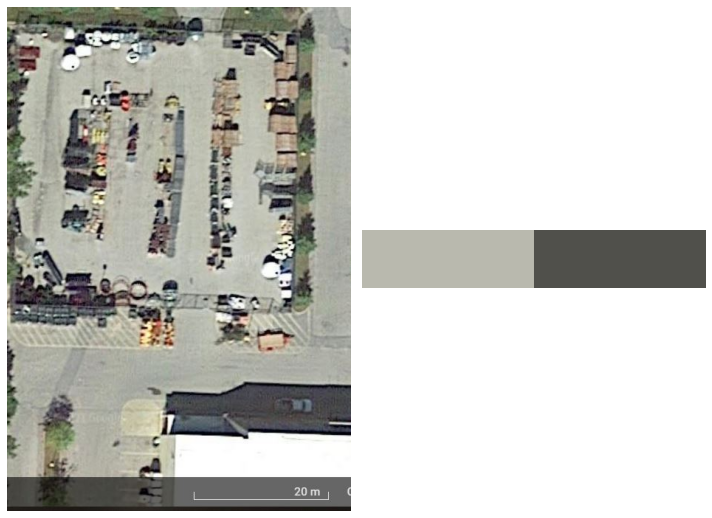

In [132]:
from sklearn.cluster import KMeans
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread("Scrub_Store_14.jpg")
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

clt = KMeans(n_clusters=2)

def show_img_compar(img_1, img_2 ):
    f, ax = plt.subplots(1, 2, figsize=(10,10))
    ax[0].imshow(img_1)
    ax[1].imshow(img_2)
    ax[0].axis('off') #hide the axis
    ax[1].axis('off')
    f.tight_layout()
    plt.show()
    
def palette(clusters):
    colors = []
    width=300
    palette = np.zeros((50, width, 3), np.uint8)
    steps = width/clusters.cluster_centers_.shape[0]
    for idx, centers in enumerate(clusters.cluster_centers_): 
        colors.append(centers)
        palette[:, int(idx*steps):(int((idx+1)*steps)), :] = centers
    print(list(colors))
    return palette, colors


# Light -1   Dark -0
def isLightOrDark(rgbColor=[0,128,255]):
    [r,g,b]=rgbColor
    hsp = math.sqrt(0.299 * (r * r) + 0.587 * (g * g) + 0.114 * (b * b))
    if (hsp>127.5):
        return 1
    else:
        return 0

clt_1 = clt.fit(rgb_img.reshape(-1, 3))
palette_out = palette(clt_1)
show_img_compar(rgb_img, palette_out[0])

light_color = None
for color in palette_out[1]:
    if isLightOrDark(color) == 1:
        light_color = color
        break

def color_diff1(c1,c2):
    r1,g1,b1 = c1
    r2,g2,b2 = c2
    d=sqrt((r2-r1)**2+(g2-g1)**2+(b2-b1)**2)
    if d < 100:
        return True
    return False

def color_diff(c1,c2):
    r1,g1,b1 = c1
    r2,g2,b2 = c2
    diff = 25
    if abs(r1-r2) < diff and abs(g1-g2) < diff and abs(b1-b2) < diff:
        return True
    return False

blank_image = np.zeros((img.shape[0],img.shape[1],3), np.uint8)
empty_lot_pixels = 0
for i in range(img.shape[0]):
    for j in range(img.shape[1]):
#         print(image[i,j])
        x = img[i,j]
#         print(type(x))
        if color_diff(list(x),light_color):
#             print(img[i,j])
            empty_lot_pixels+=1
            blank_image[i,j] = [0,0,0]
        else:
            blank_image[i,j] = list(x)
            
cv2.imshow("act",img)
cv2.imshow("",blank_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [223]:

img = cv2.imread("Scrub_Store_6.jpg")
# cv2.imshow("",img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


In [224]:
rows,cols, channels = img.shape

In [225]:
rows

664

In [226]:
cols

876

In [227]:
for i in range(0,rows-3,2):
    for j in range(0,cols-3,2):
        a = img[j:j+2,i:i+2]
        b = a.copy()
        max_color = a.max(axis=0).max(axis=0)
        img[j:j+2][i:i+2] = max_color

ValueError: zero-size array to reduction operation maximum which has no identity

In [215]:

# cv2.imshow("a",a)
cv2.imshow("b",img)
cv2.waitKey(0)
cv2.destroyAllWindows()

array([113, 125, 113], dtype=uint8)

In [167]:
a.max(axis=0)

array([106, 118, 106])